In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import sys
sys.path.append("..")
sys.path.append("../..")

In [3]:
import os
from pathlib import Path
import pickle
import timeit
#
import matplotlib.pyplot as plt
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
import torchvision
from torchvision import transforms, models
from dotted_dict import DottedDict
from tqdm import tqdm
import pprint
#
from csprites.datasets import ClassificationDataset
import utils
from backbone import get_backbone
from optimizer import get_optimizer
from eval_utils import Net, get_datasets, train_model
from plot_utils import *

# Settings

In [4]:
# linprob config
linprob_config = {
    'p_eval': 'eval',
    'p_eval_results': 'results_nlp.pkl',
    'p_config':       "eval_config_nlp.pkl",
    'p_results':      'results_nlp.pkl',
    'p_acc_mat':      'accuracy_nlp.png',
    #
    'device': "cpu",
    'cuda_visible_devices': '0',
    'n_hid': 2,
    'batch_norm': True,
    'd_hid': 1024,
    'batch_size': 1024,
    'optimizer': 'adam',
    'n_avrg': 5,
    'optimizer_args': {'lr': 0.001, 'weight_decay': 1e-6},
    'num_epochs': 10,
}
linprob_config = DottedDict(linprob_config)

In [5]:
# TORCH SETTINGS
torch.backends.cudnn.benchmark = True
os.environ["CUDA_VISIBLE_DEVICES"] = linprob_config.cuda_visible_devices
device = torch.device(linprob_config.device)

In [6]:
p_experiments_base = Path("/mnt/experiments/csprites/single_csprites_64x64_n7_c8_a16_p4_s3_bg_inf_random_function_43008")
p_experiments = [
    #
    # FCN8
    #
    p_experiments_base / 'SUP_[FCN8i223o32_d8]_target_[shape]',
    p_experiments_base / 'SUP_[FCN8i223o32_d8]_target_[scale]',
    p_experiments_base / 'SUP_[FCN8i223o32_d8]_target_[color]',
    p_experiments_base / 'SUP_[FCN8i223o32_d8]_target_[angle]',
    p_experiments_base / 'SUP_[FCN8i223o32_d8]_target_[py]',
    p_experiments_base / 'SUP_[FCN8i223o32_d8]_target_[px]',
    #
    p_experiments_base / 'SUP_[FCN8i223o32_d16]_target_[shape]',
    p_experiments_base / 'SUP_[FCN8i223o32_d16]_target_[scale]',
    p_experiments_base / 'SUP_[FCN8i223o32_d16]_target_[color]',
    p_experiments_base / 'SUP_[FCN8i223o32_d16]_target_[angle]',
    p_experiments_base / 'SUP_[FCN8i223o32_d16]_target_[py]',
    p_experiments_base / 'SUP_[FCN8i223o32_d16]_target_[px]',
    #
    p_experiments_base / 'SUP_[FCN8i223o32_d32]_target_[shape]',
    p_experiments_base / 'SUP_[FCN8i223o32_d32]_target_[scale]',
    p_experiments_base / 'SUP_[FCN8i223o32_d32]_target_[color]',
    p_experiments_base / 'SUP_[FCN8i223o32_d32]_target_[angle]',
    p_experiments_base / 'SUP_[FCN8i223o32_d32]_target_[py]',
    p_experiments_base / 'SUP_[FCN8i223o32_d32]_target_[px]',
    #
    p_experiments_base / 'SUP_[FCN8i223o32_d64]_target_[shape]',
    p_experiments_base / 'SUP_[FCN8i223o32_d64]_target_[scale]',
    p_experiments_base / 'SUP_[FCN8i223o32_d64]_target_[color]',
    p_experiments_base / 'SUP_[FCN8i223o32_d64]_target_[angle]',
    p_experiments_base / 'SUP_[FCN8i223o32_d64]_target_[py]',
    p_experiments_base / 'SUP_[FCN8i223o32_d64]_target_[px]',
    #
    p_experiments_base / 'SUP_[FCN8i223o32_d128]_target_[shape]',
    p_experiments_base / 'SUP_[FCN8i223o32_d128]_target_[scale]',
    p_experiments_base / 'SUP_[FCN8i223o32_d128]_target_[color]',
    p_experiments_base / 'SUP_[FCN8i223o32_d128]_target_[angle]',
    p_experiments_base / 'SUP_[FCN8i223o32_d128]_target_[py]',
    p_experiments_base / 'SUP_[FCN8i223o32_d128]_target_[px]',
    #
    # FCN16
    #
    p_experiments_base / 'SUP_[FCN16i223o64_d8]_target_[shape]',
    p_experiments_base / 'SUP_[FCN16i223o64_d8]_target_[scale]',
    p_experiments_base / 'SUP_[FCN16i223o64_d8]_target_[color]',
    p_experiments_base / 'SUP_[FCN16i223o64_d8]_target_[angle]',
    p_experiments_base / 'SUP_[FCN16i223o64_d8]_target_[py]',
    p_experiments_base / 'SUP_[FCN16i223o64_d8]_target_[px]',
    #
    p_experiments_base / 'SUP_[FCN16i223o64_d16]_target_[shape]',
    p_experiments_base / 'SUP_[FCN16i223o64_d16]_target_[scale]',
    p_experiments_base / 'SUP_[FCN16i223o64_d16]_target_[color]',
    p_experiments_base / 'SUP_[FCN16i223o64_d16]_target_[angle]',
    p_experiments_base / 'SUP_[FCN16i223o64_d16]_target_[py]',
    p_experiments_base / 'SUP_[FCN16i223o64_d16]_target_[px]',
    #
    p_experiments_base / 'SUP_[FCN16i223o64_d32]_target_[shape]',
    p_experiments_base / 'SUP_[FCN16i223o64_d32]_target_[scale]',
    p_experiments_base / 'SUP_[FCN16i223o64_d32]_target_[color]',
    p_experiments_base / 'SUP_[FCN16i223o64_d32]_target_[angle]',
    p_experiments_base / 'SUP_[FCN16i223o64_d32]_target_[py]',
    p_experiments_base / 'SUP_[FCN16i223o64_d32]_target_[px]',
    #
    p_experiments_base / 'SUP_[FCN16i223o64_d64]_target_[shape]',
    p_experiments_base / 'SUP_[FCN16i223o64_d64]_target_[scale]',
    p_experiments_base / 'SUP_[FCN16i223o64_d64]_target_[color]',
    p_experiments_base / 'SUP_[FCN16i223o64_d64]_target_[angle]',
    p_experiments_base / 'SUP_[FCN16i223o64_d64]_target_[py]',
    p_experiments_base / 'SUP_[FCN16i223o64_d64]_target_[px]',
    #
    p_experiments_base / 'SUP_[FCN16i223o64_d128]_target_[shape]',
    p_experiments_base / 'SUP_[FCN16i223o64_d128]_target_[scale]',
    p_experiments_base / 'SUP_[FCN16i223o64_d128]_target_[color]',
    p_experiments_base / 'SUP_[FCN16i223o64_d128]_target_[angle]',
    p_experiments_base / 'SUP_[FCN16i223o64_d128]_target_[py]',
    p_experiments_base / 'SUP_[FCN16i223o64_d128]_target_[px]',
    #
    # FCN32
    #
    p_experiments_base / 'SUP_[FCN32i223o128_d8]_target_[shape]',
    p_experiments_base / 'SUP_[FCN32i223o128_d8]_target_[scale]',
    p_experiments_base / 'SUP_[FCN32i223o128_d8]_target_[color]',
    p_experiments_base / 'SUP_[FCN32i223o128_d8]_target_[angle]',
    p_experiments_base / 'SUP_[FCN32i223o128_d8]_target_[py]',
    p_experiments_base / 'SUP_[FCN32i223o128_d8]_target_[px]',
    #
    p_experiments_base / 'SUP_[FCN32i223o128_d16]_target_[shape]',
    p_experiments_base / 'SUP_[FCN32i223o128_d16]_target_[scale]',
    p_experiments_base / 'SUP_[FCN32i223o128_d16]_target_[color]',
    p_experiments_base / 'SUP_[FCN32i223o128_d16]_target_[angle]',
    p_experiments_base / 'SUP_[FCN32i223o128_d16]_target_[py]',
    p_experiments_base / 'SUP_[FCN32i223o128_d16]_target_[px]',
    #
    p_experiments_base / 'SUP_[FCN32i223o128_d32]_target_[shape]',
    p_experiments_base / 'SUP_[FCN32i223o128_d32]_target_[scale]',
    p_experiments_base / 'SUP_[FCN32i223o128_d32]_target_[color]',
    p_experiments_base / 'SUP_[FCN32i223o128_d32]_target_[angle]',
    p_experiments_base / 'SUP_[FCN32i223o128_d32]_target_[py]',
    p_experiments_base / 'SUP_[FCN32i223o128_d32]_target_[px]',
    #
    p_experiments_base / 'SUP_[FCN32i223o128_d64]_target_[shape]',
    p_experiments_base / 'SUP_[FCN32i223o128_d64]_target_[scale]',
    p_experiments_base / 'SUP_[FCN32i223o128_d64]_target_[color]',
    p_experiments_base / 'SUP_[FCN32i223o128_d64]_target_[angle]',
    p_experiments_base / 'SUP_[FCN32i223o128_d64]_target_[py]',
    p_experiments_base / 'SUP_[FCN32i223o128_d64]_target_[px]',
    #
    p_experiments_base / 'SUP_[FCN32i223o128_d128]_target_[shape]',
    p_experiments_base / 'SUP_[FCN32i223o128_d128]_target_[scale]',
    p_experiments_base / 'SUP_[FCN32i223o128_d128]_target_[color]',
    p_experiments_base / 'SUP_[FCN32i223o128_d128]_target_[angle]',
    p_experiments_base / 'SUP_[FCN32i223o128_d128]_target_[py]',
    p_experiments_base / 'SUP_[FCN32i223o128_d128]_target_[px]',
    #
    # Barlow Twins
    #
    p_experiments_base / 'BTwins_[FCN8i223o32_d_8]_target_[shape]',
    p_experiments_base / 'BTwins_[FCN8i223o32_d_16]_target_[shape]',
    p_experiments_base / 'BTwins_[FCN8i223o32_d_32]_target_[shape]',
    p_experiments_base / 'BTwins_[FCN8i223o32_d_64]_target_[shape]',
    p_experiments_base / 'BTwins_[FCN8i223o32_d_128]_target_[shape]',
    #
    p_experiments_base / 'BTwins_[FCN16i223o64_d_8]_target_[shape]',
    p_experiments_base / 'BTwins_[FCN16i223o64_d_16]_target_[shape]',
    p_experiments_base / 'BTwins_[FCN16i223o64_d_32]_target_[shape]',
    p_experiments_base / 'BTwins_[FCN16i223o64_d_64]_target_[shape]',
    p_experiments_base / 'BTwins_[FCN16i223o64_d_128]_target_[shape]',
    #
    p_experiments_base / 'BTwins_[FCN32i223o128_d_8]_target_[shape]',
    p_experiments_base / 'BTwins_[FCN32i223o128_d_16]_target_[shape]',
    p_experiments_base / 'BTwins_[FCN32i223o128_d_32]_target_[shape]',
    p_experiments_base / 'BTwins_[FCN32i223o128_d_64]_target_[shape]',
    p_experiments_base / 'BTwins_[FCN32i223o128_d_128]_target_[shape]',
]
for p in p_experiments:
    if not p.exists():
        print(p)

In [7]:
class Net(nn.Module):
    def __init__(self, n_classes, d_in, d_hid=1024, n_hid=0, batch_norm=False):
        super(Net, self).__init__()
        dims = [d_in]
        for _ in range(n_hid):
            dims.append(d_hid)
        dims.append(n_classes)
        #
        layers = []
        for idx in range(1, len(dims) - 1, 1):
            layers.append(nn.Linear(dims[idx - 1], dims[idx]))
            if batch_norm:
                layers.append(nn.BatchNorm1d(dims[idx]))
            layers.append(nn.ReLU())
        layers.append(nn.Linear(dims[-2], dims[-1]))
        self.layers = nn.Sequential(*layers)

    def forward(self, x):
        return self.layers(x)

SUP_[FCN8i223o32_d8]_target_[shape]
[  1/630] shape      SUP_[FCN8i223o32_d8]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:03<00:00, 10.26it/s, loss=0.0352, acc=0.985]                                         
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 72.81it/s, loss=0.0774, acc=0.978]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 27.88it/s, loss=0.019, acc=0.992]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 74.76it/s, loss=0.0622, acc=0.988]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 23.57it/s, loss=0.0293, acc=0.987]                                         
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 54.77it/s, loss=0.0906, acc=0.976]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 24.94it/s, loss=0.0194, acc=0.995]                                         
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 61.96it/s, loss=0.0461, acc=0.988]    

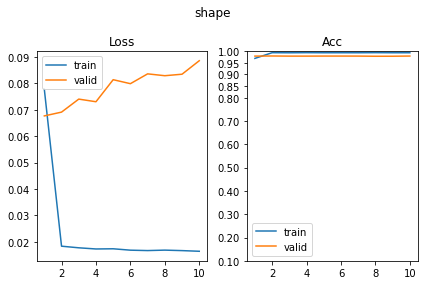

[  2/630] scale      SUP_[FCN8i223o32_d8]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 22.94it/s, loss=0.969, acc=0.526]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 77.04it/s, loss=1.01, acc=0.524]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 28.10it/s, loss=0.921, acc=0.533]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 57.21it/s, loss=0.967, acc=0.52]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 29.39it/s, loss=0.929, acc=0.521]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 38.38it/s, loss=0.895, acc=0.595]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 27.26it/s, loss=0.91, acc=0.568]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 72.54it/s, loss=0.96, acc=0.563]      

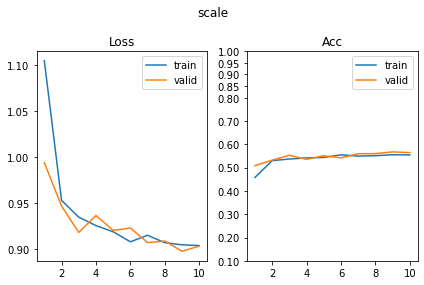

[  3/630] color      SUP_[FCN8i223o32_d8]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 35.09it/s, loss=2.01, acc=0.182]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 80.28it/s, loss=2.01, acc=0.202]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 33.47it/s, loss=1.99, acc=0.197]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 71.00it/s, loss=1.97, acc=0.198]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 28.48it/s, loss=1.95, acc=0.212]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 62.29it/s, loss=2.02, acc=0.229]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 30.77it/s, loss=1.96, acc=0.217]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 74.74it/s, loss=2, acc=0.185]         

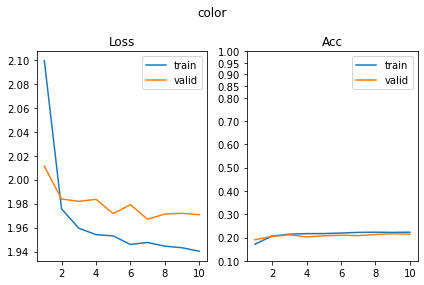

[  4/630] angle      SUP_[FCN8i223o32_d8]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 32.04it/s, loss=2.72, acc=0.0961]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 49.99it/s, loss=2.75, acc=0.0854]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 35.18it/s, loss=2.67, acc=0.112]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 79.16it/s, loss=2.75, acc=0.0854]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 32.83it/s, loss=2.66, acc=0.103]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 61.45it/s, loss=2.69, acc=0.105]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 31.51it/s, loss=2.58, acc=0.13]                                            
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 77.84it/s, loss=2.61, acc=0.146]      

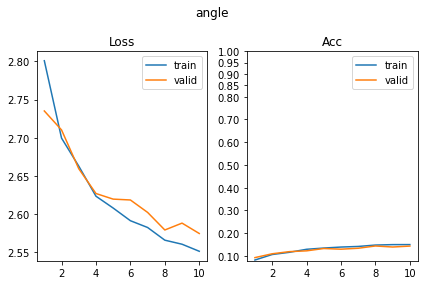

[  5/630] py         SUP_[FCN8i223o32_d8]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 31.10it/s, loss=1.36, acc=0.342]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 80.53it/s, loss=1.37, acc=0.298]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 35.01it/s, loss=1.34, acc=0.336]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 52.02it/s, loss=1.34, acc=0.332]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 33.31it/s, loss=1.34, acc=0.336]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 82.90it/s, loss=1.33, acc=0.317]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 32.88it/s, loss=1.32, acc=0.362]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 81.34it/s, loss=1.31, acc=0.366]      

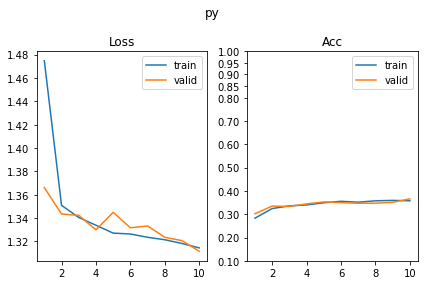

[  6/630] px         SUP_[FCN8i223o32_d8]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 29.42it/s, loss=1.38, acc=0.267]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 83.56it/s, loss=1.37, acc=0.327]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 31.54it/s, loss=1.35, acc=0.311]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 80.40it/s, loss=1.39, acc=0.305]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 32.63it/s, loss=1.35, acc=0.342]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 81.56it/s, loss=1.33, acc=0.351]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 27.72it/s, loss=1.35, acc=0.287]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 57.94it/s, loss=1.37, acc=0.315]      

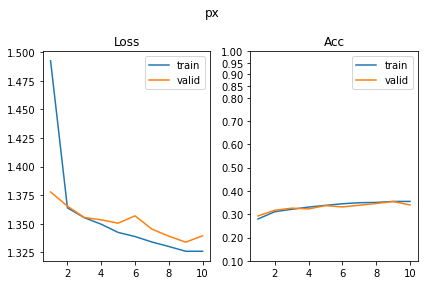

SUP_[FCN8i223o32_d8]_target_[scale]
[  7/630] shape      SUP_[FCN8i223o32_d8]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 29.67it/s, loss=1.73, acc=0.308]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 54.29it/s, loss=1.71, acc=0.329]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 36.39it/s, loss=1.71, acc=0.326]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 82.73it/s, loss=1.69, acc=0.361]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 35.06it/s, loss=1.71, acc=0.331]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 76.68it/s, loss=1.73, acc=0.293]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 30.06it/s, loss=1.72, acc=0.326]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 78.82it/s, loss=1.75, acc=0.3]        

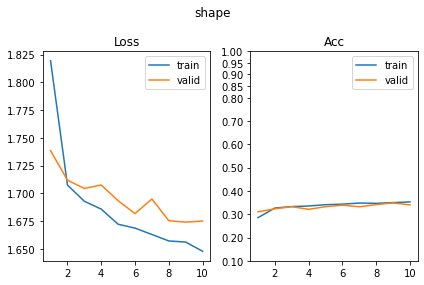

[  8/630] scale      SUP_[FCN8i223o32_d8]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 33.15it/s, loss=0.106, acc=0.954]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 81.41it/s, loss=0.601, acc=0.861]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 34.69it/s, loss=0.0834, acc=0.966]                                         
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 54.26it/s, loss=0.783, acc=0.834]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 34.40it/s, loss=0.0498, acc=0.977]                                         
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 77.46it/s, loss=0.678, acc=0.854]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 30.16it/s, loss=0.0553, acc=0.977]                                         
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 81.49it/s, loss=0.688, acc=0.839]     

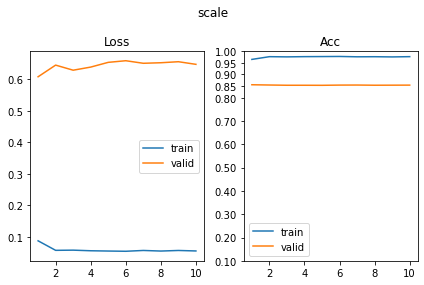

[  9/630] color      SUP_[FCN8i223o32_d8]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 32.74it/s, loss=1.94, acc=0.23]                                            
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 79.52it/s, loss=1.95, acc=0.22]                                              
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 31.77it/s, loss=1.93, acc=0.207]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 78.56it/s, loss=1.91, acc=0.251]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 32.09it/s, loss=1.93, acc=0.21]                                            
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 72.72it/s, loss=1.97, acc=0.195]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 33.60it/s, loss=1.9, acc=0.217]                                            
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 79.81it/s, loss=1.94, acc=0.229]      

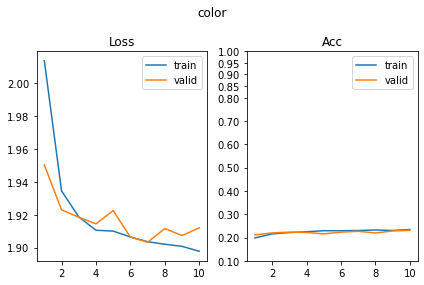

[ 10/630] angle      SUP_[FCN8i223o32_d8]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 31.73it/s, loss=2.78, acc=0.0961]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 63.33it/s, loss=2.77, acc=0.0878]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 34.74it/s, loss=2.76, acc=0.107]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 76.12it/s, loss=2.79, acc=0.0902]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 32.73it/s, loss=2.73, acc=0.106]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 79.14it/s, loss=2.77, acc=0.0659]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 33.36it/s, loss=2.78, acc=0.0814]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 83.66it/s, loss=2.74, acc=0.0927]     

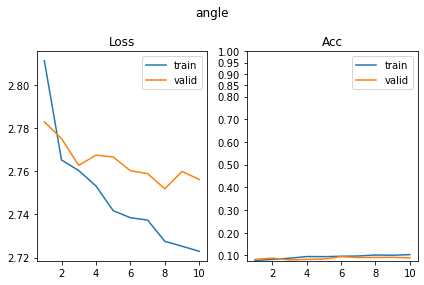

[ 11/630] py         SUP_[FCN8i223o32_d8]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 29.03it/s, loss=1.37, acc=0.331]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 64.40it/s, loss=1.37, acc=0.3]                                               
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 29.31it/s, loss=1.36, acc=0.347]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 49.33it/s, loss=1.37, acc=0.312]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 31.62it/s, loss=1.37, acc=0.3]                                             
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 78.11it/s, loss=1.36, acc=0.302]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 31.46it/s, loss=1.37, acc=0.324]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 68.15it/s, loss=1.36, acc=0.322]      

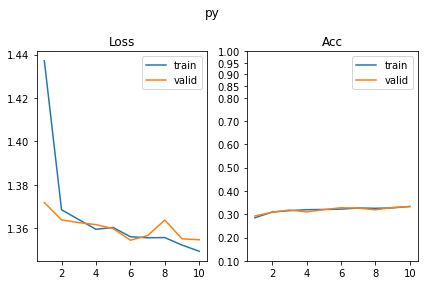

[ 12/630] px         SUP_[FCN8i223o32_d8]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 31.55it/s, loss=1.37, acc=0.296]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 77.76it/s, loss=1.37, acc=0.322]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 32.78it/s, loss=1.35, acc=0.322]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 83.11it/s, loss=1.36, acc=0.32]                                              
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 34.02it/s, loss=1.36, acc=0.303]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 60.91it/s, loss=1.36, acc=0.302]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 30.07it/s, loss=1.34, acc=0.322]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 69.31it/s, loss=1.36, acc=0.302]      

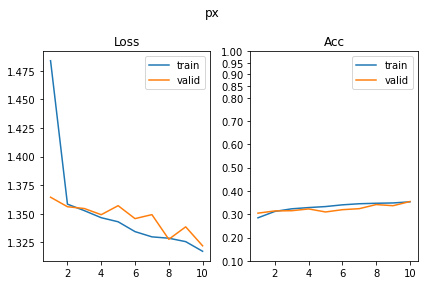

SUP_[FCN8i223o32_d8]_target_[color]
[ 13/630] shape      SUP_[FCN8i223o32_d8]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 24.68it/s, loss=1.95, acc=0.158]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 79.41it/s, loss=1.96, acc=0.163]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 29.79it/s, loss=1.95, acc=0.16]                                            
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 74.90it/s, loss=1.99, acc=0.112]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 30.65it/s, loss=1.95, acc=0.179]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 79.11it/s, loss=1.93, acc=0.161]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 31.61it/s, loss=1.95, acc=0.153]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 79.64it/s, loss=1.92, acc=0.202]      

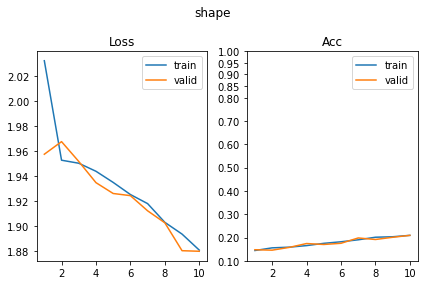

[ 14/630] scale      SUP_[FCN8i223o32_d8]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 30.67it/s, loss=1.11, acc=0.311]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 74.86it/s, loss=1.1, acc=0.363]                                              
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 32.73it/s, loss=1.1, acc=0.344]                                            
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 54.80it/s, loss=1.11, acc=0.298]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 31.34it/s, loss=1.1, acc=0.36]                                             
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 79.02it/s, loss=1.11, acc=0.307]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 28.76it/s, loss=1.1, acc=0.378]                                            
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 79.13it/s, loss=1.1, acc=0.344]       

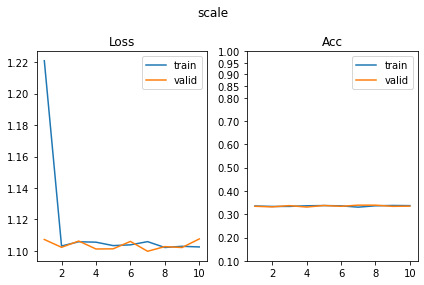

[ 15/630] color      SUP_[FCN8i223o32_d8]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 31.22it/s, loss=0.000664, acc=1]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 69.08it/s, loss=0.000382, acc=1]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 31.64it/s, loss=0.000395, acc=1]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 87.14it/s, loss=0.000332, acc=1]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 32.62it/s, loss=0.000235, acc=1]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 81.08it/s, loss=0.000341, acc=1]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 28.67it/s, loss=0.000161, acc=1]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 77.84it/s, loss=0.000246, acc=1]      

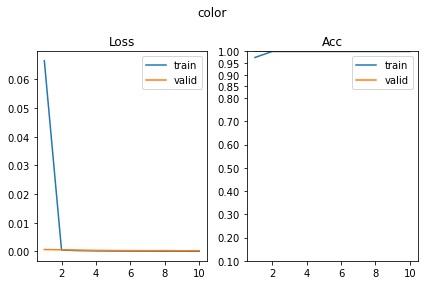

[ 16/630] angle      SUP_[FCN8i223o32_d8]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 32.31it/s, loss=2.8, acc=0.044]                                            
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 80.28it/s, loss=2.8, acc=0.0634]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 29.10it/s, loss=2.8, acc=0.0456]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 78.37it/s, loss=2.78, acc=0.0585]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 30.11it/s, loss=2.79, acc=0.0554]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 74.98it/s, loss=2.79, acc=0.0634]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 33.32it/s, loss=2.81, acc=0.0635]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 83.92it/s, loss=2.78, acc=0.078]      

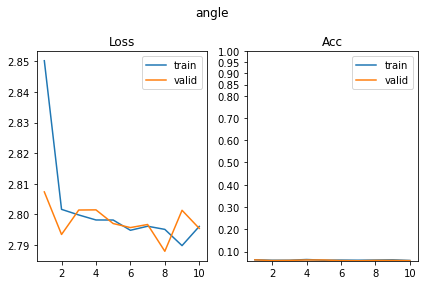

[ 17/630] py         SUP_[FCN8i223o32_d8]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 32.07it/s, loss=1.4, acc=0.241]                                            
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 78.95it/s, loss=1.38, acc=0.302]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 32.38it/s, loss=1.42, acc=0.212]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 50.53it/s, loss=1.39, acc=0.266]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 30.83it/s, loss=1.4, acc=0.249]                                            
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 60.32it/s, loss=1.39, acc=0.259]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 31.84it/s, loss=1.4, acc=0.225]                                            
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 79.74it/s, loss=1.39, acc=0.263]      

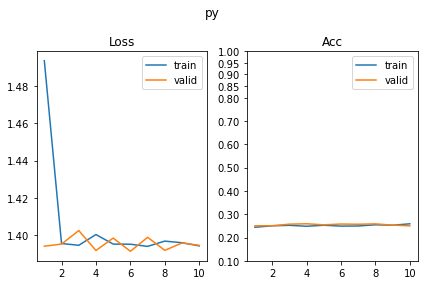

[ 18/630] px         SUP_[FCN8i223o32_d8]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 28.42it/s, loss=1.4, acc=0.259]                                            
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 61.51it/s, loss=1.4, acc=0.237]                                              
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 29.10it/s, loss=1.4, acc=0.256]                                            
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 70.11it/s, loss=1.4, acc=0.251]                                              
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 29.55it/s, loss=1.39, acc=0.257]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 81.55it/s, loss=1.39, acc=0.241]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 31.55it/s, loss=1.39, acc=0.256]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 74.56it/s, loss=1.39, acc=0.263]      

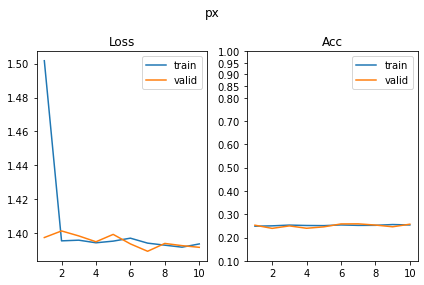

SUP_[FCN8i223o32_d8]_target_[angle]
[ 19/630] shape      SUP_[FCN8i223o32_d8]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 32.28it/s, loss=0.781, acc=0.682]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 81.56it/s, loss=0.76, acc=0.671]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 32.76it/s, loss=0.722, acc=0.713]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 80.79it/s, loss=0.721, acc=0.715]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 30.98it/s, loss=0.604, acc=0.754]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 78.76it/s, loss=0.676, acc=0.737]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 29.81it/s, loss=0.63, acc=0.73]                                            
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 77.02it/s, loss=0.731, acc=0.72]      

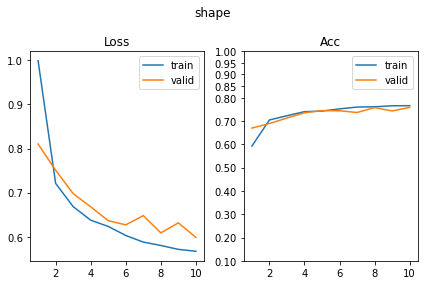

[ 20/630] scale      SUP_[FCN8i223o32_d8]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 21.81it/s, loss=1.1, acc=0.376]                                            
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 76.77it/s, loss=1.07, acc=0.385]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 26.62it/s, loss=1.07, acc=0.43]                                            
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 38.63it/s, loss=1.06, acc=0.427]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 29.48it/s, loss=1.06, acc=0.433]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 58.61it/s, loss=1.04, acc=0.456]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 26.99it/s, loss=1.08, acc=0.402]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 60.10it/s, loss=1.08, acc=0.39]       

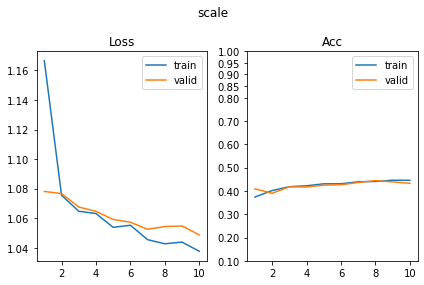

[ 21/630] color      SUP_[FCN8i223o32_d8]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 29.25it/s, loss=2.06, acc=0.153]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 76.12it/s, loss=2.07, acc=0.141]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 27.06it/s, loss=2.05, acc=0.158]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 68.45it/s, loss=2.09, acc=0.134]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 21.74it/s, loss=2.06, acc=0.161]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 68.23it/s, loss=2.07, acc=0.163]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 29.16it/s, loss=2.05, acc=0.156]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 58.10it/s, loss=2.05, acc=0.19]       

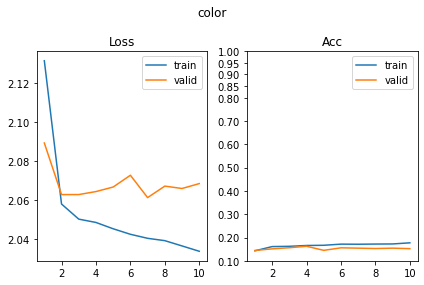

[ 22/630] angle      SUP_[FCN8i223o32_d8]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 33.82it/s, loss=0.464, acc=0.806]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 52.13it/s, loss=0.859, acc=0.622]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 36.03it/s, loss=0.553, acc=0.739]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 82.61it/s, loss=0.882, acc=0.627]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 31.74it/s, loss=0.442, acc=0.785]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 73.45it/s, loss=0.923, acc=0.62]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 27.98it/s, loss=0.474, acc=0.801]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 84.36it/s, loss=1.09, acc=0.563]      

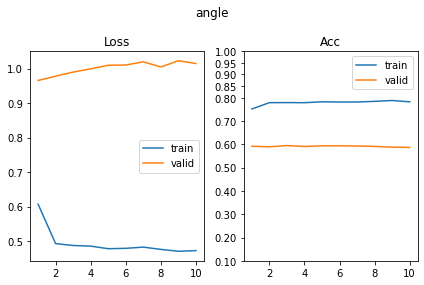

[ 23/630] py         SUP_[FCN8i223o32_d8]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 28.30it/s, loss=1.37, acc=0.324]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 80.36it/s, loss=1.39, acc=0.283]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 32.70it/s, loss=1.36, acc=0.319]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 53.69it/s, loss=1.37, acc=0.293]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 30.15it/s, loss=1.34, acc=0.344]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 83.04it/s, loss=1.35, acc=0.3]                                               
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 34.26it/s, loss=1.34, acc=0.357]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 70.49it/s, loss=1.33, acc=0.327]      

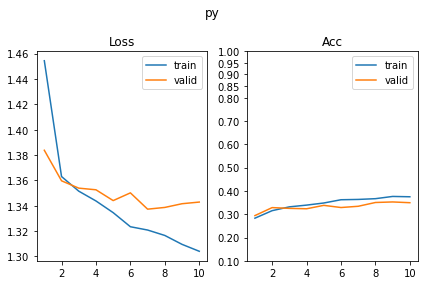

[ 24/630] px         SUP_[FCN8i223o32_d8]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 30.65it/s, loss=1.38, acc=0.296]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 72.06it/s, loss=1.36, acc=0.354]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 31.88it/s, loss=1.33, acc=0.383]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 79.18it/s, loss=1.36, acc=0.307]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 32.77it/s, loss=1.33, acc=0.336]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 68.46it/s, loss=1.32, acc=0.351]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 34.16it/s, loss=1.33, acc=0.353]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 83.14it/s, loss=1.33, acc=0.378]      

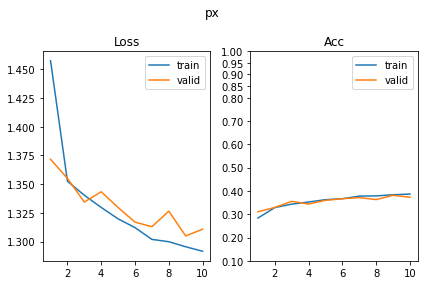

SUP_[FCN8i223o32_d8]_target_[py]
[ 25/630] shape      SUP_[FCN8i223o32_d8]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 34.16it/s, loss=1.6, acc=0.368]                                            
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 80.60it/s, loss=1.66, acc=0.322]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 34.38it/s, loss=1.46, acc=0.412]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 79.40it/s, loss=1.49, acc=0.42]                                              
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 34.33it/s, loss=1.4, acc=0.445]                                            
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 82.13it/s, loss=1.39, acc=0.466]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 31.87it/s, loss=1.42, acc=0.433]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 75.79it/s, loss=1.37, acc=0.468]      

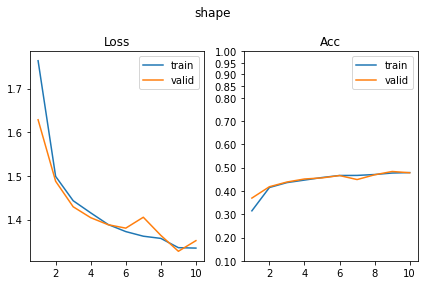

[ 26/630] scale      SUP_[FCN8i223o32_d8]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 28.44it/s, loss=1.06, acc=0.436]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 75.78it/s, loss=1.08, acc=0.393]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 28.80it/s, loss=1.03, acc=0.45]                                            
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 50.93it/s, loss=1.06, acc=0.417]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 31.95it/s, loss=1.03, acc=0.445]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 81.41it/s, loss=1.01, acc=0.459]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 28.99it/s, loss=1.01, acc=0.503]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 57.95it/s, loss=1.03, acc=0.456]      

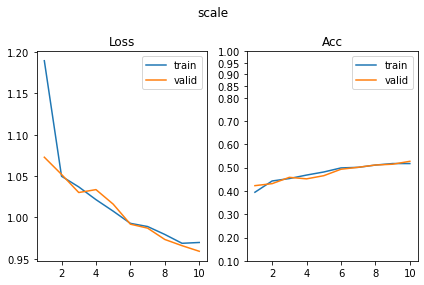

[ 27/630] color      SUP_[FCN8i223o32_d8]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 21.28it/s, loss=2.03, acc=0.181]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 47.60it/s, loss=2.03, acc=0.163]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 20.20it/s, loss=2, acc=0.199]                                              
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 47.52it/s, loss=2.02, acc=0.168]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 24.22it/s, loss=2.02, acc=0.187]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 48.78it/s, loss=2.01, acc=0.166]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 23.67it/s, loss=1.99, acc=0.208]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 75.09it/s, loss=2, acc=0.195]         

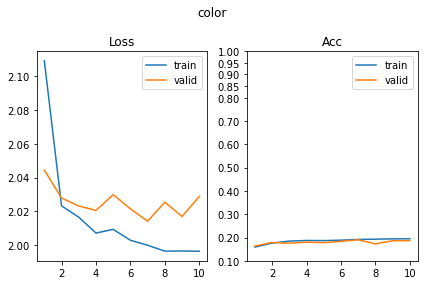

[ 28/630] angle      SUP_[FCN8i223o32_d8]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 25.86it/s, loss=2.76, acc=0.0928]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 74.39it/s, loss=2.75, acc=0.107]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 22.61it/s, loss=2.72, acc=0.103]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 72.70it/s, loss=2.76, acc=0.0902]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 24.18it/s, loss=2.71, acc=0.116]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 77.98it/s, loss=2.75, acc=0.102]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 25.24it/s, loss=2.7, acc=0.107]                                            
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 44.77it/s, loss=2.71, acc=0.141]      

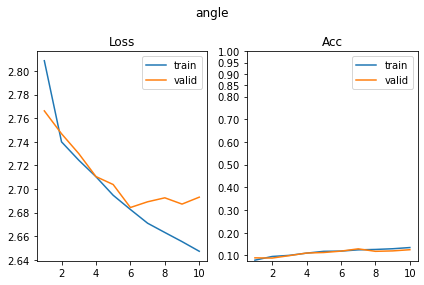

[ 29/630] py         SUP_[FCN8i223o32_d8]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 23.91it/s, loss=0.0356, acc=0.989]                                         
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 73.38it/s, loss=0.109, acc=0.966]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 26.46it/s, loss=0.036, acc=0.985]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 45.65it/s, loss=0.105, acc=0.959]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 25.21it/s, loss=0.0151, acc=0.995]                                         
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 59.05it/s, loss=0.154, acc=0.966]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 22.65it/s, loss=0.0318, acc=0.987]                                         
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 60.90it/s, loss=0.0853, acc=0.973]    

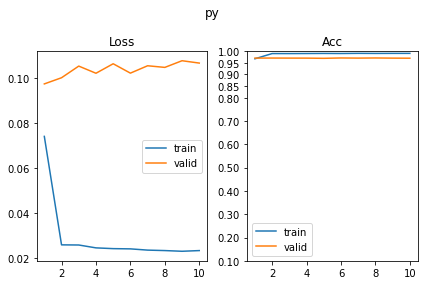

[ 30/630] px         SUP_[FCN8i223o32_d8]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 28.37it/s, loss=1.38, acc=0.272]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 73.14it/s, loss=1.38, acc=0.276]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 26.87it/s, loss=1.38, acc=0.287]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 70.98it/s, loss=1.38, acc=0.315]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 23.53it/s, loss=1.37, acc=0.277]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 70.74it/s, loss=1.38, acc=0.283]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 20.07it/s, loss=1.38, acc=0.275]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 68.00it/s, loss=1.37, acc=0.315]      

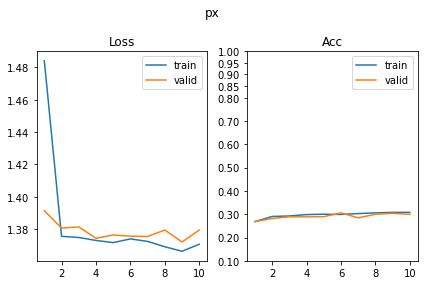

SUP_[FCN8i223o32_d8]_target_[px]
[ 31/630] shape      SUP_[FCN8i223o32_d8]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 28.61it/s, loss=1.8, acc=0.296]                                            
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 44.00it/s, loss=1.77, acc=0.337]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 32.71it/s, loss=1.7, acc=0.326]                                            
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 73.61it/s, loss=1.79, acc=0.298]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 32.77it/s, loss=1.65, acc=0.337]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 59.55it/s, loss=1.73, acc=0.298]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 32.75it/s, loss=1.64, acc=0.347]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 81.59it/s, loss=1.62, acc=0.395]      

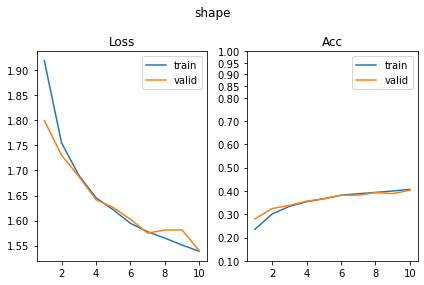

[ 32/630] scale      SUP_[FCN8i223o32_d8]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 32.00it/s, loss=1.08, acc=0.386]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 83.70it/s, loss=1.1, acc=0.398]                                              
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 32.41it/s, loss=1.06, acc=0.458]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 83.90it/s, loss=1.04, acc=0.451]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 34.30it/s, loss=1.06, acc=0.445]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 56.42it/s, loss=1.06, acc=0.422]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 32.01it/s, loss=1, acc=0.505]                                              
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 81.89it/s, loss=1.03, acc=0.466]      

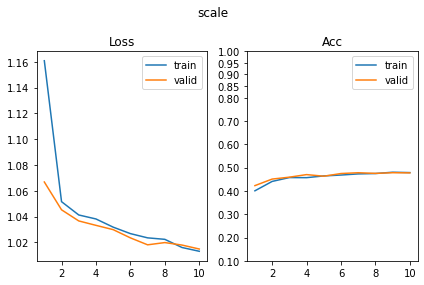

[ 33/630] color      SUP_[FCN8i223o32_d8]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 26.95it/s, loss=1.98, acc=0.199]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 73.87it/s, loss=2.01, acc=0.202]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 30.21it/s, loss=2, acc=0.199]                                              
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 79.48it/s, loss=2, acc=0.178]                                                
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 26.47it/s, loss=1.97, acc=0.212]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 51.11it/s, loss=2.01, acc=0.22]                                              
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 24.22it/s, loss=2, acc=0.186]                                              
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 61.99it/s, loss=1.97, acc=0.215]      

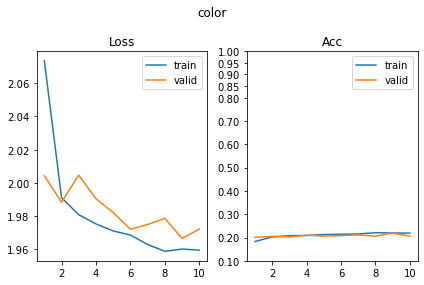

[ 34/630] angle      SUP_[FCN8i223o32_d8]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 28.01it/s, loss=2.76, acc=0.0814]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 50.32it/s, loss=2.75, acc=0.0707]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 25.49it/s, loss=2.72, acc=0.116]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 66.97it/s, loss=2.75, acc=0.0902]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 29.56it/s, loss=2.7, acc=0.111]                                            
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 80.16it/s, loss=2.69, acc=0.122]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 32.40it/s, loss=2.69, acc=0.117]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 64.38it/s, loss=2.72, acc=0.0927]     

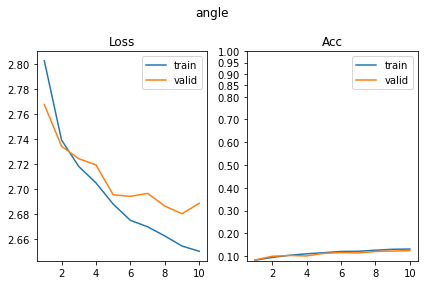

[ 35/630] py         SUP_[FCN8i223o32_d8]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 28.57it/s, loss=1.39, acc=0.296]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 80.09it/s, loss=1.39, acc=0.276]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 34.69it/s, loss=1.37, acc=0.293]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 53.42it/s, loss=1.36, acc=0.329]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 31.37it/s, loss=1.38, acc=0.29]                                            
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 60.74it/s, loss=1.39, acc=0.28]                                              
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 27.34it/s, loss=1.38, acc=0.296]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 67.11it/s, loss=1.38, acc=0.298]      

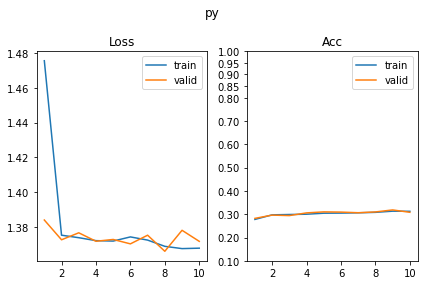

[ 36/630] px         SUP_[FCN8i223o32_d8]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 31.45it/s, loss=0.0256, acc=0.992]                                         
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 73.50it/s, loss=0.251, acc=0.934]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 28.50it/s, loss=0.0266, acc=0.99]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 72.80it/s, loss=0.126, acc=0.968]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 30.27it/s, loss=0.0161, acc=0.995]                                         
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 78.58it/s, loss=0.161, acc=0.959]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 33.40it/s, loss=0.0138, acc=0.995]                                         
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 78.71it/s, loss=0.204, acc=0.959]     

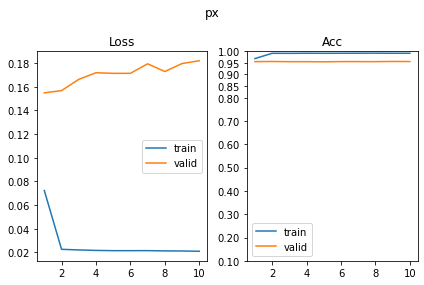

SUP_[FCN8i223o32_d16]_target_[shape]
[ 37/630] shape      SUP_[FCN8i223o32_d16]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 31.60it/s, loss=0.0132, acc=0.995]                                         
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 44.79it/s, loss=0.0867, acc=0.973]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 24.67it/s, loss=0.0177, acc=0.993]                                         
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 61.03it/s, loss=0.0676, acc=0.985]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 21.26it/s, loss=0.0113, acc=0.997]                                         
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 73.83it/s, loss=0.0663, acc=0.98]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 21.86it/s, loss=0.00954, acc=0.997]                                        
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 55.13it/s, loss=0.0847, acc=0.978]    

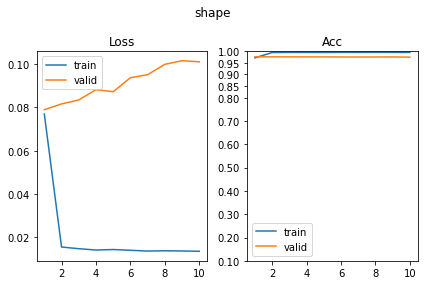

[ 38/630] scale      SUP_[FCN8i223o32_d16]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 32.27it/s, loss=0.928, acc=0.533]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 74.02it/s, loss=0.925, acc=0.539]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 34.55it/s, loss=0.87, acc=0.575]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 52.38it/s, loss=0.889, acc=0.573]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 33.20it/s, loss=0.847, acc=0.578]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 67.61it/s, loss=0.863, acc=0.578]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 32.18it/s, loss=0.829, acc=0.603]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 81.51it/s, loss=0.9, acc=0.568]       

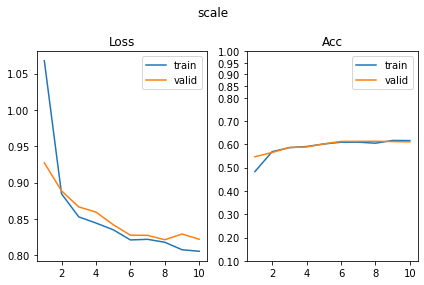

[ 39/630] color      SUP_[FCN8i223o32_d16]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 28.98it/s, loss=2.02, acc=0.189]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 78.91it/s, loss=2.02, acc=0.185]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 30.46it/s, loss=1.99, acc=0.202]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 63.93it/s, loss=1.98, acc=0.22]                                              
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 31.77it/s, loss=1.99, acc=0.212]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 46.73it/s, loss=2.01, acc=0.193]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 26.27it/s, loss=1.99, acc=0.212]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 80.28it/s, loss=1.99, acc=0.21]       

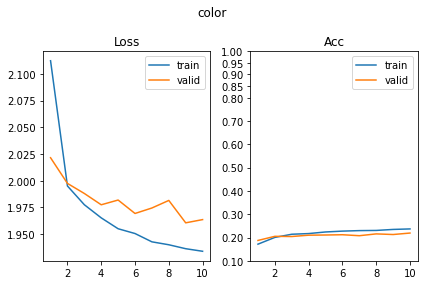

[ 40/630] angle      SUP_[FCN8i223o32_d16]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 29.22it/s, loss=2.69, acc=0.117]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 81.33it/s, loss=2.73, acc=0.0878]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 30.22it/s, loss=2.59, acc=0.15]                                            
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 57.54it/s, loss=2.64, acc=0.137]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 26.73it/s, loss=2.54, acc=0.143]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 74.98it/s, loss=2.53, acc=0.156]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 33.67it/s, loss=2.49, acc=0.163]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 79.74it/s, loss=2.51, acc=0.151]      

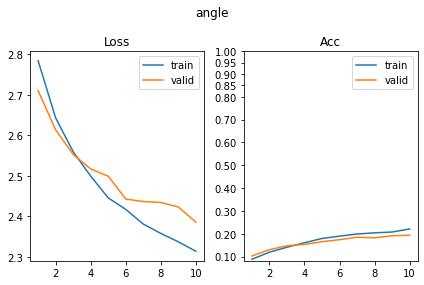

[ 41/630] py         SUP_[FCN8i223o32_d16]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 26.25it/s, loss=1.35, acc=0.337]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 68.10it/s, loss=1.37, acc=0.332]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 33.17it/s, loss=1.32, acc=0.373]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 51.63it/s, loss=1.32, acc=0.334]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 25.02it/s, loss=1.33, acc=0.345]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 68.75it/s, loss=1.33, acc=0.366]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 24.43it/s, loss=1.28, acc=0.394]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 60.89it/s, loss=1.24, acc=0.41]       

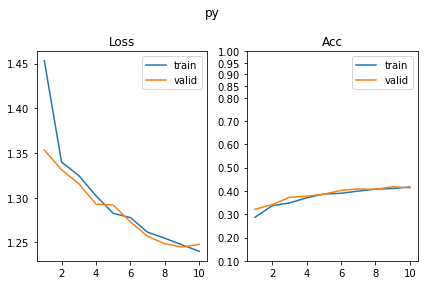

[ 42/630] px         SUP_[FCN8i223o32_d16]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 20.47it/s, loss=1.34, acc=0.322]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 63.05it/s, loss=1.34, acc=0.366]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 28.66it/s, loss=1.31, acc=0.34]                                            
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 71.30it/s, loss=1.29, acc=0.368]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 28.30it/s, loss=1.28, acc=0.399]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 64.52it/s, loss=1.29, acc=0.393]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 24.48it/s, loss=1.24, acc=0.396]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 53.36it/s, loss=1.28, acc=0.378]      

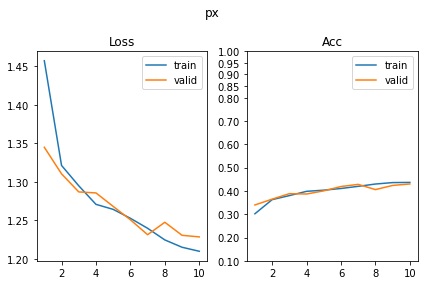

SUP_[FCN8i223o32_d16]_target_[scale]
[ 43/630] shape      SUP_[FCN8i223o32_d16]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 28.53it/s, loss=1.61, acc=0.37]                                            
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 73.49it/s, loss=1.66, acc=0.324]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 25.33it/s, loss=1.54, acc=0.407]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 63.20it/s, loss=1.52, acc=0.42]                                              
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 28.03it/s, loss=1.56, acc=0.383]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 82.05it/s, loss=1.63, acc=0.341]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 29.85it/s, loss=1.58, acc=0.378]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 62.14it/s, loss=1.58, acc=0.368]      

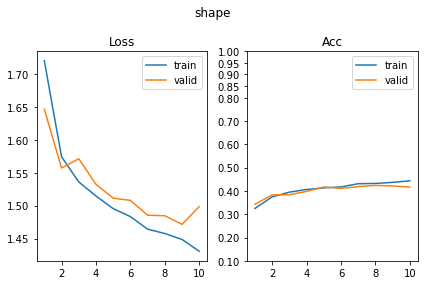

[ 44/630] scale      SUP_[FCN8i223o32_d16]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 23.74it/s, loss=0.0481, acc=0.982]                                         
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 81.06it/s, loss=0.829, acc=0.805]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 29.64it/s, loss=0.0434, acc=0.985]                                         
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 51.55it/s, loss=0.867, acc=0.851]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 23.20it/s, loss=0.0448, acc=0.982]                                         
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 77.11it/s, loss=0.909, acc=0.81]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 25.10it/s, loss=0.0645, acc=0.964]                                         
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 74.93it/s, loss=0.726, acc=0.846]     

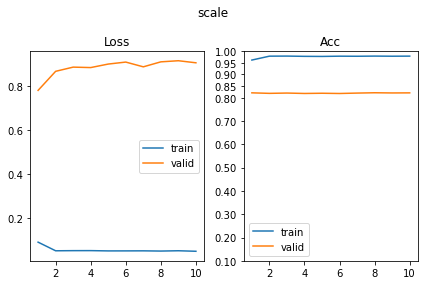

[ 45/630] color      SUP_[FCN8i223o32_d16]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 29.17it/s, loss=1.93, acc=0.241]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 76.41it/s, loss=1.92, acc=0.229]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 33.10it/s, loss=1.89, acc=0.233]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 74.87it/s, loss=1.85, acc=0.268]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 29.47it/s, loss=1.9, acc=0.221]                                            
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 74.18it/s, loss=1.85, acc=0.239]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 29.41it/s, loss=1.86, acc=0.257]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 78.74it/s, loss=1.91, acc=0.244]      

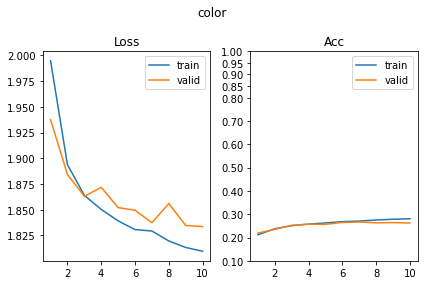

[ 46/630] angle      SUP_[FCN8i223o32_d16]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 31.55it/s, loss=2.76, acc=0.0798]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 52.05it/s, loss=2.76, acc=0.078]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 33.40it/s, loss=2.71, acc=0.0977]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 79.52it/s, loss=2.73, acc=0.1]                                               
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 32.33it/s, loss=2.69, acc=0.103]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 74.24it/s, loss=2.72, acc=0.115]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 32.93it/s, loss=2.63, acc=0.124]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 81.92it/s, loss=2.66, acc=0.124]      

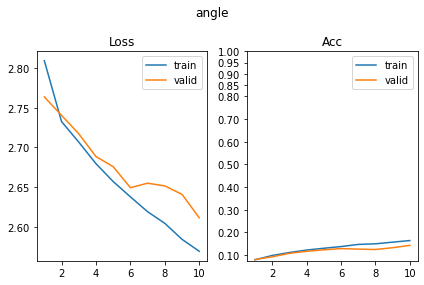

[ 47/630] py         SUP_[FCN8i223o32_d16]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 32.54it/s, loss=1.36, acc=0.316]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 82.55it/s, loss=1.34, acc=0.332]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 31.38it/s, loss=1.33, acc=0.344]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 54.72it/s, loss=1.33, acc=0.341]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 34.68it/s, loss=1.29, acc=0.379]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 84.68it/s, loss=1.32, acc=0.339]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 34.53it/s, loss=1.32, acc=0.355]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 83.56it/s, loss=1.33, acc=0.359]      

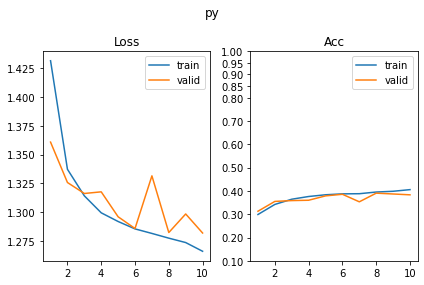

[ 48/630] px         SUP_[FCN8i223o32_d16]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 31.71it/s, loss=1.27, acc=0.396]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 80.64it/s, loss=1.32, acc=0.341]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 34.82it/s, loss=1.27, acc=0.43]                                            
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 84.20it/s, loss=1.27, acc=0.398]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 34.64it/s, loss=1.26, acc=0.414]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 83.15it/s, loss=1.27, acc=0.373]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 33.22it/s, loss=1.25, acc=0.41]                                            
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 61.83it/s, loss=1.25, acc=0.385]      

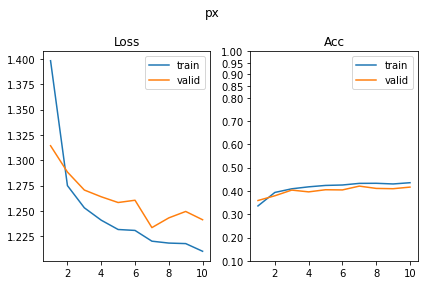

SUP_[FCN8i223o32_d16]_target_[color]
[ 49/630] shape      SUP_[FCN8i223o32_d16]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 32.16it/s, loss=1.68, acc=0.298]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 52.49it/s, loss=1.73, acc=0.244]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 29.29it/s, loss=1.51, acc=0.375]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 49.77it/s, loss=1.53, acc=0.359]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 24.26it/s, loss=1.43, acc=0.417]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 81.53it/s, loss=1.4, acc=0.412]                                              
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 32.96it/s, loss=1.45, acc=0.402]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 41.34it/s, loss=1.52, acc=0.368]      

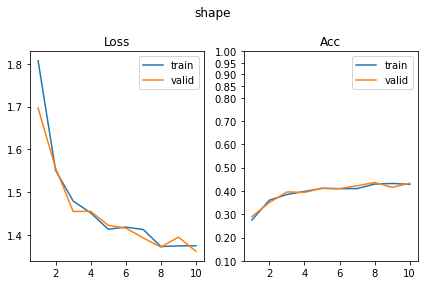

[ 50/630] scale      SUP_[FCN8i223o32_d16]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 29.69it/s, loss=1.1, acc=0.34]                                             
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 76.51it/s, loss=1.1, acc=0.366]                                              
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 34.41it/s, loss=1.1, acc=0.384]                                            
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 54.54it/s, loss=1.08, acc=0.412]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 35.55it/s, loss=1.1, acc=0.379]                                            
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 63.54it/s, loss=1.09, acc=0.373]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 32.07it/s, loss=1.08, acc=0.396]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 67.87it/s, loss=1.07, acc=0.388]      

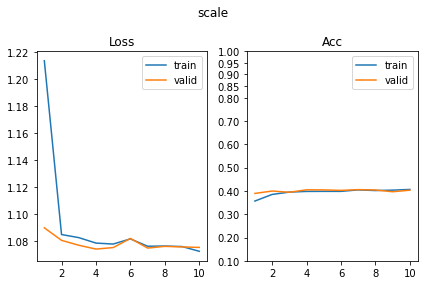

[ 51/630] color      SUP_[FCN8i223o32_d16]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 25.78it/s, loss=0.00138, acc=1]                                            
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 78.21it/s, loss=0.00152, acc=1]                                              
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 31.06it/s, loss=0.000514, acc=1]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 56.08it/s, loss=0.000588, acc=1]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 31.51it/s, loss=0.00119, acc=1]                                            
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 83.24it/s, loss=0.000526, acc=1]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 32.56it/s, loss=0.000493, acc=1]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 69.33it/s, loss=0.00932, acc=0.995]   

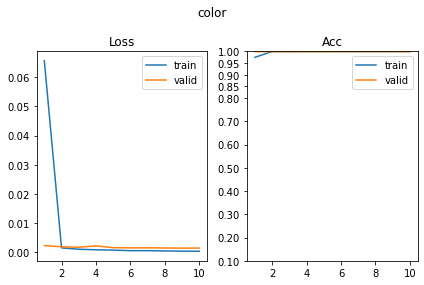

[ 52/630] angle      SUP_[FCN8i223o32_d16]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 29.48it/s, loss=2.78, acc=0.0863]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 79.85it/s, loss=2.81, acc=0.0537]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 32.03it/s, loss=2.8, acc=0.0668]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 81.65it/s, loss=2.79, acc=0.0634]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 32.44it/s, loss=2.8, acc=0.0668]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 73.91it/s, loss=2.8, acc=0.0585]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 31.43it/s, loss=2.78, acc=0.0684]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 81.91it/s, loss=2.81, acc=0.0683]     

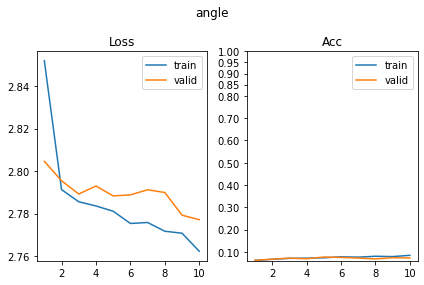

[ 53/630] py         SUP_[FCN8i223o32_d16]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 28.92it/s, loss=1.37, acc=0.262]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 84.28it/s, loss=1.38, acc=0.283]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 36.32it/s, loss=1.36, acc=0.306]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 53.64it/s, loss=1.36, acc=0.259]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 29.24it/s, loss=1.36, acc=0.288]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 79.03it/s, loss=1.39, acc=0.3]                                               
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 32.80it/s, loss=1.34, acc=0.308]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 81.28it/s, loss=1.32, acc=0.322]      

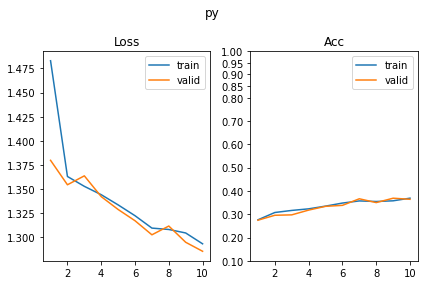

[ 54/630] px         SUP_[FCN8i223o32_d16]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 29.82it/s, loss=1.35, acc=0.326]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 80.21it/s, loss=1.36, acc=0.307]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 30.65it/s, loss=1.33, acc=0.319]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 78.88it/s, loss=1.34, acc=0.324]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 32.87it/s, loss=1.33, acc=0.34]                                            
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 77.70it/s, loss=1.3, acc=0.359]                                              
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 33.65it/s, loss=1.3, acc=0.37]                                             
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 78.66it/s, loss=1.29, acc=0.38]       

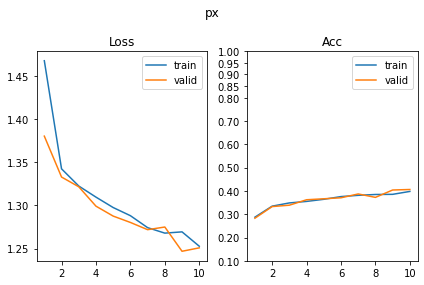

SUP_[FCN8i223o32_d16]_target_[angle]
[ 55/630] shape      SUP_[FCN8i223o32_d16]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 31.60it/s, loss=0.399, acc=0.855]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 85.01it/s, loss=0.49, acc=0.824]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 30.60it/s, loss=0.343, acc=0.86]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 79.80it/s, loss=0.419, acc=0.851]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 28.93it/s, loss=0.372, acc=0.847]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 58.33it/s, loss=0.447, acc=0.824]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 27.57it/s, loss=0.285, acc=0.894]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 75.94it/s, loss=0.477, acc=0.82]      

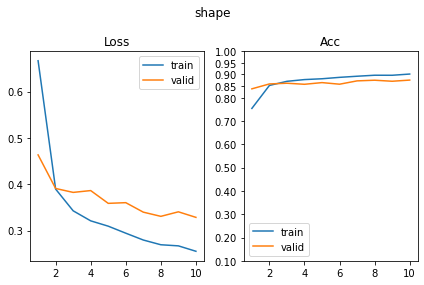

[ 56/630] scale      SUP_[FCN8i223o32_d16]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 28.00it/s, loss=1.06, acc=0.451]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 74.88it/s, loss=1.03, acc=0.463]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 29.98it/s, loss=1, acc=0.489]                                              
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 51.79it/s, loss=1.02, acc=0.498]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 35.81it/s, loss=0.989, acc=0.49]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 85.25it/s, loss=1.02, acc=0.459]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 33.13it/s, loss=0.92, acc=0.555]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 83.09it/s, loss=1, acc=0.498]         

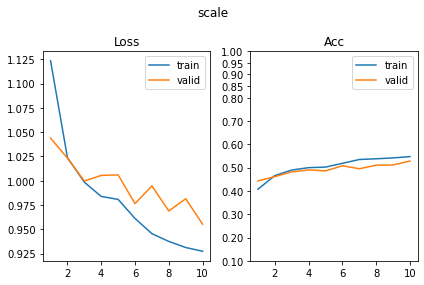

[ 57/630] color      SUP_[FCN8i223o32_d16]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 31.90it/s, loss=2.02, acc=0.199]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 80.77it/s, loss=2.06, acc=0.185]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 32.39it/s, loss=2.02, acc=0.178]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 77.77it/s, loss=2.05, acc=0.161]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 33.23it/s, loss=2, acc=0.221]                                              
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 75.91it/s, loss=2.05, acc=0.171]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 25.97it/s, loss=2.01, acc=0.186]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 78.66it/s, loss=2.04, acc=0.2]        

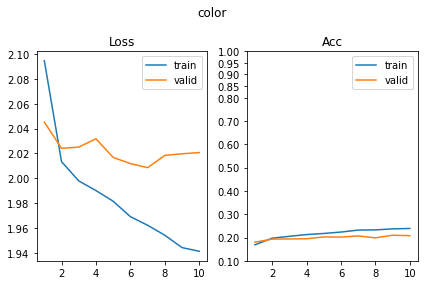

[ 58/630] angle      SUP_[FCN8i223o32_d16]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 32.45it/s, loss=0.527, acc=0.765]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 49.04it/s, loss=0.897, acc=0.588]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 31.79it/s, loss=0.527, acc=0.764]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 76.96it/s, loss=0.986, acc=0.573]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 33.21it/s, loss=0.57, acc=0.744]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 75.31it/s, loss=1, acc=0.578]                                                
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 33.82it/s, loss=0.566, acc=0.744]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 79.31it/s, loss=1.05, acc=0.576]      

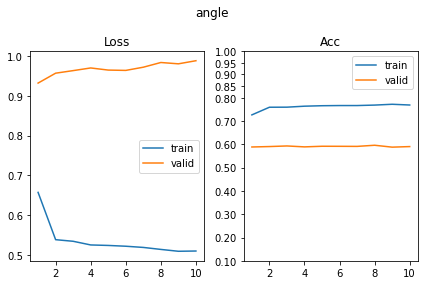

[ 59/630] py         SUP_[FCN8i223o32_d16]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 27.92it/s, loss=1.3, acc=0.375]                                            
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 76.61it/s, loss=1.32, acc=0.354]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 27.79it/s, loss=1.28, acc=0.396]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 35.08it/s, loss=1.32, acc=0.376]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 25.72it/s, loss=1.19, acc=0.458]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 78.17it/s, loss=1.2, acc=0.446]                                              
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 30.92it/s, loss=1.15, acc=0.458]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 81.23it/s, loss=1.24, acc=0.432]      

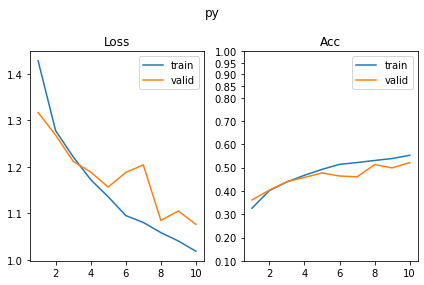

[ 60/630] px         SUP_[FCN8i223o32_d16]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 30.54it/s, loss=1.3, acc=0.391]                                            
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 81.55it/s, loss=1.29, acc=0.424]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 23.21it/s, loss=1.24, acc=0.42]                                            
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 43.39it/s, loss=1.24, acc=0.398]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 19.71it/s, loss=1.21, acc=0.415]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 62.25it/s, loss=1.26, acc=0.429]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 22.76it/s, loss=1.2, acc=0.43]                                             
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 55.90it/s, loss=1.15, acc=0.502]      

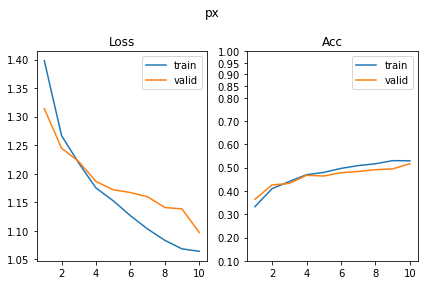

SUP_[FCN8i223o32_d16]_target_[py]
[ 61/630] shape      SUP_[FCN8i223o32_d16]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 20.13it/s, loss=1.5, acc=0.402]                                            
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 50.13it/s, loss=1.54, acc=0.415]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 26.15it/s, loss=1.27, acc=0.495]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 65.33it/s, loss=1.27, acc=0.48]                                              
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 22.51it/s, loss=1.22, acc=0.52]                                            
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 55.59it/s, loss=1.29, acc=0.532]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 22.82it/s, loss=1.09, acc=0.588]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 62.50it/s, loss=1.27, acc=0.515]      

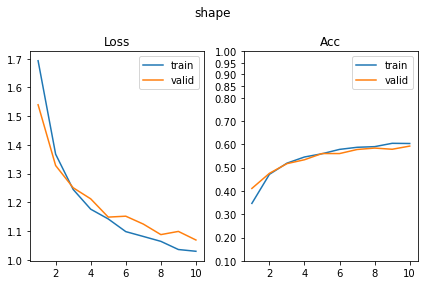

[ 62/630] scale      SUP_[FCN8i223o32_d16]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 27.33it/s, loss=1.04, acc=0.423]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 71.10it/s, loss=1.09, acc=0.393]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 26.25it/s, loss=1.03, acc=0.472]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 78.57it/s, loss=1.02, acc=0.498]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 32.84it/s, loss=1.02, acc=0.453]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 78.19it/s, loss=1.03, acc=0.449]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 32.47it/s, loss=1.02, acc=0.477]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 67.34it/s, loss=1.03, acc=0.451]      

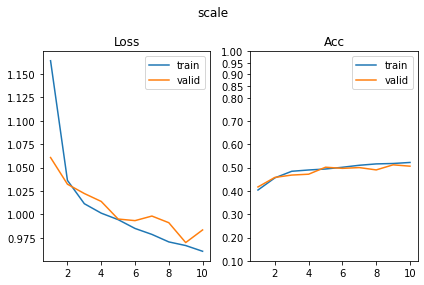

[ 63/630] color      SUP_[FCN8i223o32_d16]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 26.36it/s, loss=2.03, acc=0.168]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 63.82it/s, loss=2.04, acc=0.178]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 27.41it/s, loss=1.99, acc=0.187]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 64.96it/s, loss=2.06, acc=0.154]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 28.23it/s, loss=2, acc=0.179]                                              
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 68.88it/s, loss=2.02, acc=0.202]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 28.59it/s, loss=1.97, acc=0.235]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 61.37it/s, loss=2.04, acc=0.193]      

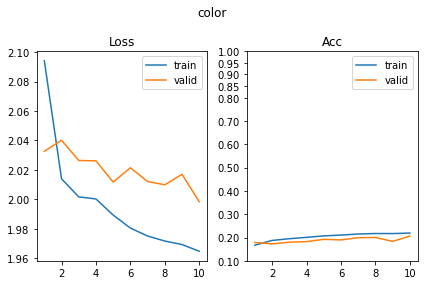

[ 64/630] angle      SUP_[FCN8i223o32_d16]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 30.03it/s, loss=2.72, acc=0.101]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 44.24it/s, loss=2.72, acc=0.11]                                              
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 27.70it/s, loss=2.68, acc=0.143]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 59.22it/s, loss=2.69, acc=0.102]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 27.10it/s, loss=2.65, acc=0.122]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 68.16it/s, loss=2.66, acc=0.134]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 24.53it/s, loss=2.6, acc=0.14]                                             
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 66.36it/s, loss=2.64, acc=0.124]      

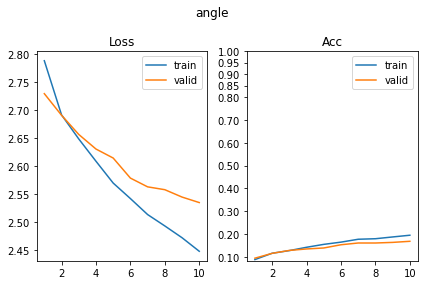

[ 65/630] py         SUP_[FCN8i223o32_d16]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 23.07it/s, loss=0.0141, acc=0.995]                                         
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 74.10it/s, loss=0.15, acc=0.956]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 24.84it/s, loss=0.024, acc=0.989]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 50.75it/s, loss=0.125, acc=0.968]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 23.10it/s, loss=0.00632, acc=0.998]                                        
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 63.39it/s, loss=0.135, acc=0.959]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 21.25it/s, loss=0.0209, acc=0.995]                                         
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 54.85it/s, loss=0.186, acc=0.959]     

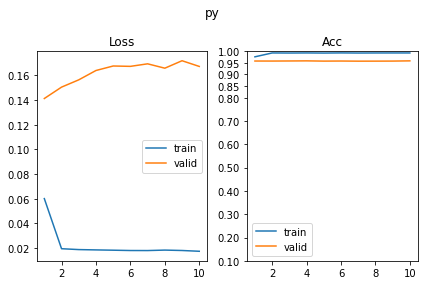

[ 66/630] px         SUP_[FCN8i223o32_d16]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 26.29it/s, loss=1.38, acc=0.288]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 54.71it/s, loss=1.38, acc=0.283]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 27.94it/s, loss=1.37, acc=0.292]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 52.24it/s, loss=1.38, acc=0.295]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 26.36it/s, loss=1.36, acc=0.329]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 65.50it/s, loss=1.36, acc=0.29]                                              
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 24.51it/s, loss=1.37, acc=0.288]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 56.70it/s, loss=1.35, acc=0.329]      

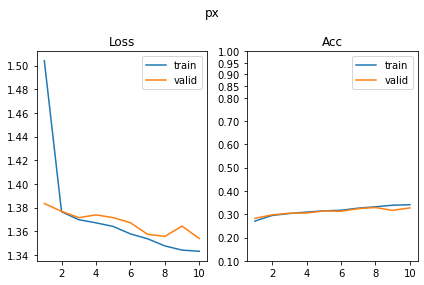

SUP_[FCN8i223o32_d16]_target_[px]
[ 67/630] shape      SUP_[FCN8i223o32_d16]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 25.95it/s, loss=1.61, acc=0.357]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 44.67it/s, loss=1.63, acc=0.376]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 30.69it/s, loss=1.37, acc=0.489]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 63.48it/s, loss=1.45, acc=0.456]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 28.40it/s, loss=1.28, acc=0.544]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 50.36it/s, loss=1.33, acc=0.5]                                               
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 26.59it/s, loss=1.24, acc=0.503]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 66.62it/s, loss=1.24, acc=0.541]      

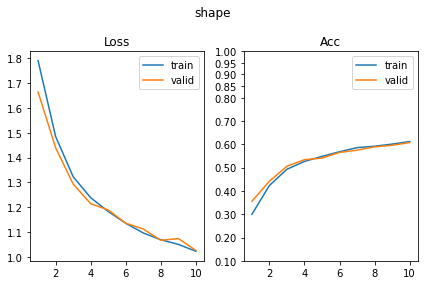

[ 68/630] scale      SUP_[FCN8i223o32_d16]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 32.61it/s, loss=1.06, acc=0.45]                                            
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 78.17it/s, loss=1.04, acc=0.429]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 31.92it/s, loss=1, acc=0.492]                                              
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 50.44it/s, loss=1.04, acc=0.424]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 34.33it/s, loss=0.975, acc=0.521]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 66.20it/s, loss=0.979, acc=0.502]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 30.57it/s, loss=0.99, acc=0.495]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 62.92it/s, loss=0.966, acc=0.541]     

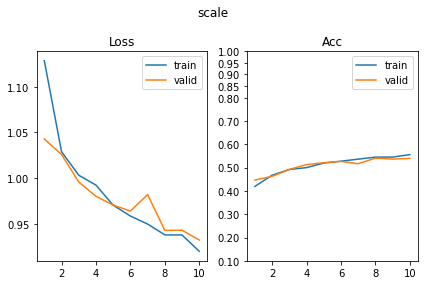

[ 69/630] color      SUP_[FCN8i223o32_d16]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 25.86it/s, loss=2.02, acc=0.187]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 50.14it/s, loss=2.02, acc=0.151]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 29.06it/s, loss=2.05, acc=0.178]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 76.70it/s, loss=2.04, acc=0.151]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 21.78it/s, loss=2.03, acc=0.194]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 49.95it/s, loss=2.05, acc=0.166]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 27.31it/s, loss=2.05, acc=0.156]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 52.90it/s, loss=2, acc=0.168]         

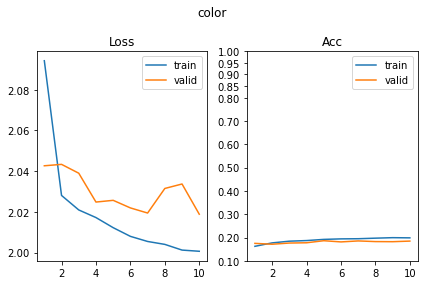

[ 70/630] angle      SUP_[FCN8i223o32_d16]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 23.99it/s, loss=2.73, acc=0.0879]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 55.93it/s, loss=2.74, acc=0.0927]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 23.73it/s, loss=2.6, acc=0.148]                                            
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 53.82it/s, loss=2.65, acc=0.134]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 26.32it/s, loss=2.57, acc=0.173]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 51.26it/s, loss=2.58, acc=0.166]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 24.26it/s, loss=2.54, acc=0.161]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 67.41it/s, loss=2.51, acc=0.202]      

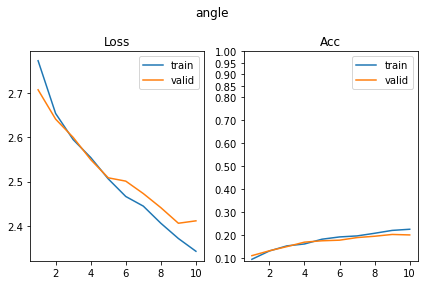

[ 71/630] py         SUP_[FCN8i223o32_d16]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 23.18it/s, loss=1.37, acc=0.295]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 59.00it/s, loss=1.37, acc=0.263]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 23.98it/s, loss=1.35, acc=0.298]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 48.19it/s, loss=1.35, acc=0.332]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 30.42it/s, loss=1.34, acc=0.342]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 69.80it/s, loss=1.34, acc=0.327]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 23.56it/s, loss=1.35, acc=0.327]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 80.87it/s, loss=1.35, acc=0.341]      

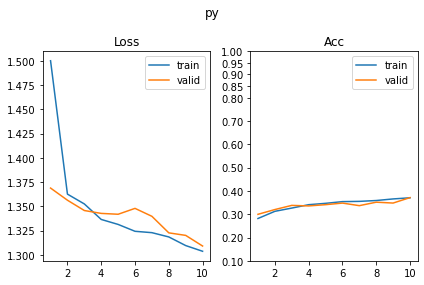

[ 72/630] px         SUP_[FCN8i223o32_d16]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 19.87it/s, loss=0.0275, acc=0.99]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 48.90it/s, loss=0.135, acc=0.963]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 21.82it/s, loss=0.0224, acc=0.992]                                         
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 82.13it/s, loss=0.0658, acc=0.976]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 19.69it/s, loss=0.0331, acc=0.985]                                         
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 37.70it/s, loss=0.152, acc=0.944]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 20.82it/s, loss=0.0533, acc=0.974]                                         
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 38.88it/s, loss=0.123, acc=0.971]     

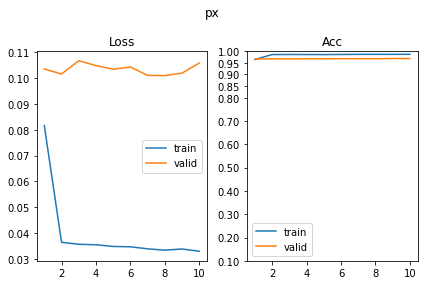

SUP_[FCN8i223o32_d32]_target_[shape]
[ 73/630] shape      SUP_[FCN8i223o32_d32]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 24.76it/s, loss=0.0149, acc=0.993]                                         
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 52.02it/s, loss=0.0953, acc=0.966]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 25.43it/s, loss=0.0198, acc=0.993]                                         
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 63.11it/s, loss=0.0828, acc=0.971]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 22.13it/s, loss=0.0205, acc=0.992]                                         
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 64.29it/s, loss=0.137, acc=0.968]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 23.20it/s, loss=0.033, acc=0.989]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 48.74it/s, loss=0.0616, acc=0.973]    

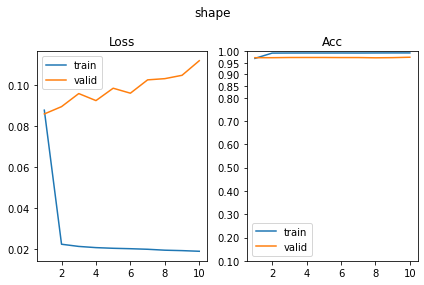

[ 74/630] scale      SUP_[FCN8i223o32_d32]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 24.80it/s, loss=0.884, acc=0.57]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 66.89it/s, loss=0.877, acc=0.568]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 25.87it/s, loss=0.835, acc=0.598]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 46.71it/s, loss=0.886, acc=0.554]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 21.97it/s, loss=0.761, acc=0.629]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 51.86it/s, loss=0.833, acc=0.588]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 22.92it/s, loss=0.765, acc=0.634]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 64.11it/s, loss=0.824, acc=0.578]     

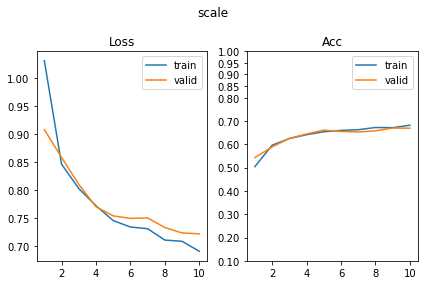

[ 75/630] color      SUP_[FCN8i223o32_d32]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 18.96it/s, loss=1.99, acc=0.195]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 65.89it/s, loss=1.96, acc=0.217]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 22.50it/s, loss=1.98, acc=0.186]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 47.35it/s, loss=1.97, acc=0.234]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:02<00:00, 15.47it/s, loss=1.96, acc=0.22]                                            
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 70.54it/s, loss=1.95, acc=0.246]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 22.94it/s, loss=1.96, acc=0.228]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 33.55it/s, loss=2.02, acc=0.193]      

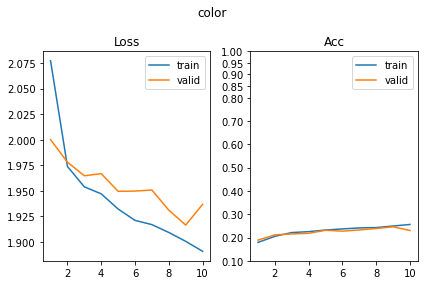

[ 76/630] angle      SUP_[FCN8i223o32_d32]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 24.18it/s, loss=2.57, acc=0.153]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 39.07it/s, loss=2.6, acc=0.132]                                              
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 25.43it/s, loss=2.27, acc=0.22]                                            
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 81.82it/s, loss=2.36, acc=0.215]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 29.02it/s, loss=2.05, acc=0.274]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 61.64it/s, loss=2.19, acc=0.251]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 22.40it/s, loss=2.05, acc=0.261]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 50.64it/s, loss=2.13, acc=0.273]      

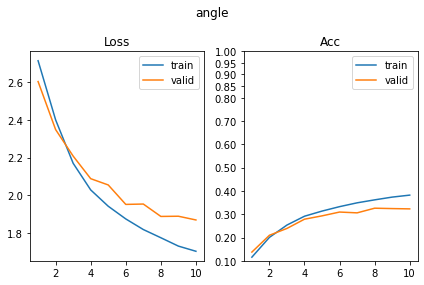

[ 77/630] py         SUP_[FCN8i223o32_d32]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 18.70it/s, loss=1.3, acc=0.396]                                            
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 34.94it/s, loss=1.3, acc=0.339]                                              
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 17.21it/s, loss=1.21, acc=0.45]                                            
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 57.11it/s, loss=1.25, acc=0.422]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 22.00it/s, loss=1.16, acc=0.453]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 64.17it/s, loss=1.23, acc=0.395]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 20.77it/s, loss=1.15, acc=0.471]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 69.12it/s, loss=1.18, acc=0.466]      

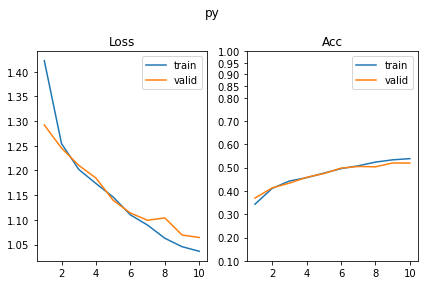

[ 78/630] px         SUP_[FCN8i223o32_d32]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 26.43it/s, loss=1.3, acc=0.386]                                            
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 58.99it/s, loss=1.29, acc=0.378]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 26.26it/s, loss=1.23, acc=0.414]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 74.02it/s, loss=1.25, acc=0.412]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 31.38it/s, loss=1.17, acc=0.469]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 77.10it/s, loss=1.28, acc=0.376]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 34.11it/s, loss=1.17, acc=0.463]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 53.57it/s, loss=1.09, acc=0.517]      

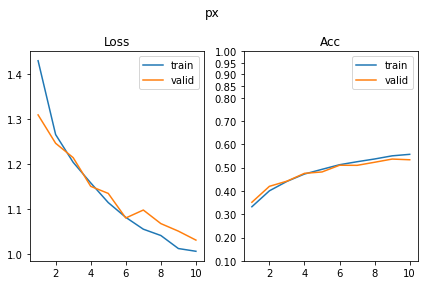

SUP_[FCN8i223o32_d32]_target_[scale]
[ 79/630] shape      SUP_[FCN8i223o32_d32]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 31.11it/s, loss=1.42, acc=0.436]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 42.54it/s, loss=1.53, acc=0.407]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 29.36it/s, loss=1.38, acc=0.498]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 70.00it/s, loss=1.38, acc=0.466]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 26.20it/s, loss=1.32, acc=0.484]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 73.05it/s, loss=1.39, acc=0.454]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 31.33it/s, loss=1.25, acc=0.508]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 57.62it/s, loss=1.32, acc=0.48]       

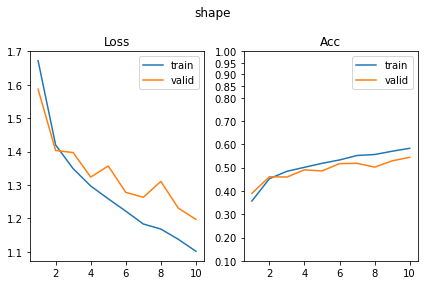

[ 80/630] scale      SUP_[FCN8i223o32_d32]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 30.39it/s, loss=0.0788, acc=0.964]                                         
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 76.68it/s, loss=0.965, acc=0.82]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 30.58it/s, loss=0.0389, acc=0.987]                                         
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 51.73it/s, loss=0.964, acc=0.788]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 32.45it/s, loss=0.0658, acc=0.976]                                         
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 81.69it/s, loss=0.909, acc=0.805]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 34.74it/s, loss=0.0481, acc=0.98]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 90.01it/s, loss=0.884, acc=0.81]      

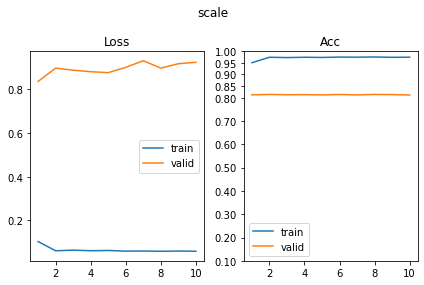

[ 81/630] color      SUP_[FCN8i223o32_d32]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 30.74it/s, loss=1.8, acc=0.27]                                             
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 68.09it/s, loss=1.8, acc=0.285]                                              
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 30.00it/s, loss=1.78, acc=0.27]                                            
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 74.32it/s, loss=1.78, acc=0.266]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 31.67it/s, loss=1.78, acc=0.282]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 78.15it/s, loss=1.7, acc=0.317]                                              
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 31.58it/s, loss=1.67, acc=0.321]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 71.29it/s, loss=1.7, acc=0.29]        

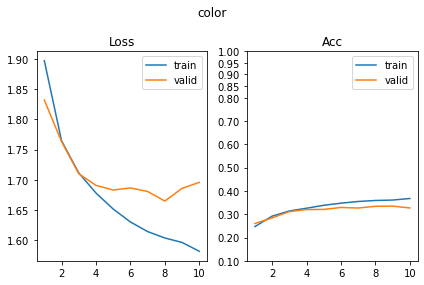

[ 82/630] angle      SUP_[FCN8i223o32_d32]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 32.17it/s, loss=2.73, acc=0.0977]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 47.74it/s, loss=2.73, acc=0.112]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 32.53it/s, loss=2.7, acc=0.119]                                            
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 81.60it/s, loss=2.66, acc=0.12]                                              
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 32.97it/s, loss=2.62, acc=0.161]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 81.64it/s, loss=2.63, acc=0.161]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 32.62it/s, loss=2.51, acc=0.178]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 72.07it/s, loss=2.47, acc=0.207]      

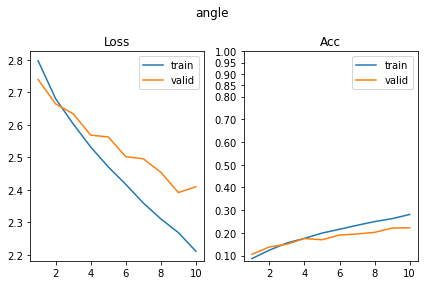

[ 83/630] py         SUP_[FCN8i223o32_d32]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 28.28it/s, loss=1.18, acc=0.477]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 78.44it/s, loss=1.24, acc=0.41]                                              
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 29.26it/s, loss=1.17, acc=0.45]                                            
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 51.30it/s, loss=1.19, acc=0.466]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 26.71it/s, loss=1.12, acc=0.482]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 77.72it/s, loss=1.1, acc=0.478]                                              
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 23.77it/s, loss=1.13, acc=0.48]                                            
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 73.29it/s, loss=1.1, acc=0.493]       

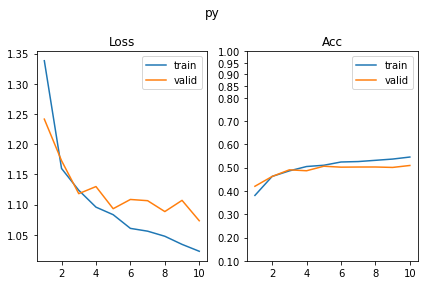

[ 84/630] px         SUP_[FCN8i223o32_d32]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 29.43it/s, loss=1.32, acc=0.366]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 82.02it/s, loss=1.31, acc=0.385]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 34.61it/s, loss=1.25, acc=0.419]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 67.76it/s, loss=1.3, acc=0.363]                                              
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 32.09it/s, loss=1.17, acc=0.451]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 79.76it/s, loss=1.23, acc=0.415]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 33.92it/s, loss=1.19, acc=0.433]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 80.62it/s, loss=1.26, acc=0.429]      

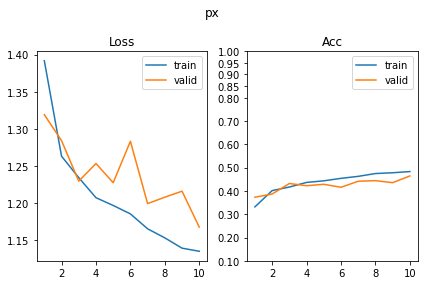

SUP_[FCN8i223o32_d32]_target_[color]
[ 85/630] shape      SUP_[FCN8i223o32_d32]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 32.54it/s, loss=1.86, acc=0.238]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 48.16it/s, loss=1.89, acc=0.144]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 29.55it/s, loss=1.53, acc=0.378]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 73.90it/s, loss=1.92, acc=0.222]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 29.12it/s, loss=1.48, acc=0.402]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 66.49it/s, loss=1.62, acc=0.324]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 33.73it/s, loss=1.42, acc=0.422]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 79.42it/s, loss=1.63, acc=0.344]      

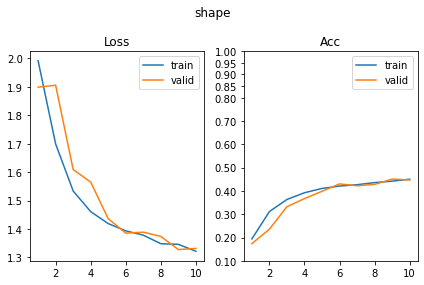

[ 86/630] scale      SUP_[FCN8i223o32_d32]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 27.38it/s, loss=1.1, acc=0.366]                                            
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 66.48it/s, loss=1.1, acc=0.385]                                              
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 30.98it/s, loss=1.09, acc=0.353]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 46.53it/s, loss=1.09, acc=0.341]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 31.35it/s, loss=1.11, acc=0.352]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 72.57it/s, loss=1.1, acc=0.327]                                              
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 27.67it/s, loss=1.1, acc=0.37]                                             
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 77.87it/s, loss=1.07, acc=0.424]      

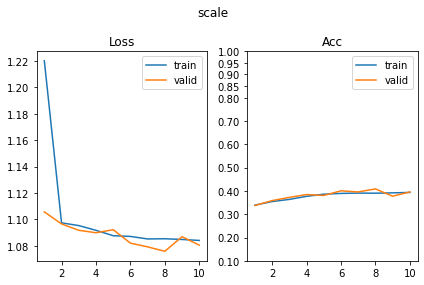

[ 87/630] color      SUP_[FCN8i223o32_d32]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 29.67it/s, loss=0.00057, acc=1]                                            
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 75.94it/s, loss=0.000667, acc=1]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 30.16it/s, loss=0.000316, acc=1]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 72.37it/s, loss=0.000341, acc=1]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 32.15it/s, loss=0.00023, acc=1]                                            
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 69.06it/s, loss=0.00094, acc=1]                                              
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 30.85it/s, loss=0.000167, acc=1]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 73.18it/s, loss=0.000233, acc=1]      

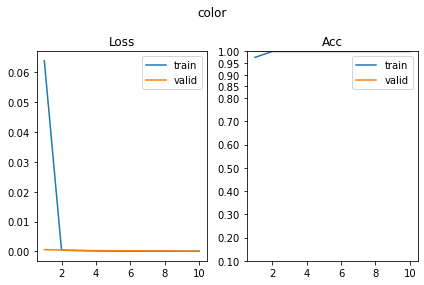

[ 88/630] angle      SUP_[FCN8i223o32_d32]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 24.02it/s, loss=2.8, acc=0.0603]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 38.08it/s, loss=2.8, acc=0.0829]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 29.16it/s, loss=2.79, acc=0.0586]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 76.60it/s, loss=2.8, acc=0.0537]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 32.59it/s, loss=2.78, acc=0.057]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 61.12it/s, loss=2.82, acc=0.0805]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 29.29it/s, loss=2.81, acc=0.0684]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 60.90it/s, loss=2.82, acc=0.0659]     

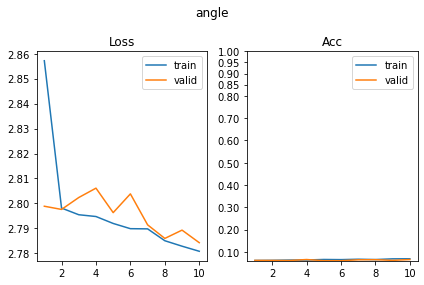

[ 89/630] py         SUP_[FCN8i223o32_d32]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 30.44it/s, loss=1.39, acc=0.254]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 77.99it/s, loss=1.4, acc=0.224]                                              
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 34.92it/s, loss=1.39, acc=0.283]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 54.37it/s, loss=1.42, acc=0.261]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 34.60it/s, loss=1.38, acc=0.288]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 79.44it/s, loss=1.38, acc=0.273]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 31.17it/s, loss=1.38, acc=0.296]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 80.05it/s, loss=1.37, acc=0.273]      

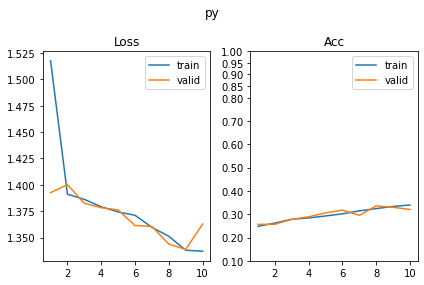

[ 90/630] px         SUP_[FCN8i223o32_d32]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 32.65it/s, loss=1.38, acc=0.265]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 76.65it/s, loss=1.41, acc=0.224]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 25.51it/s, loss=1.37, acc=0.305]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 75.27it/s, loss=1.39, acc=0.246]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 26.76it/s, loss=1.36, acc=0.306]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 74.62it/s, loss=1.39, acc=0.263]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 33.77it/s, loss=1.36, acc=0.277]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 79.36it/s, loss=1.38, acc=0.288]      

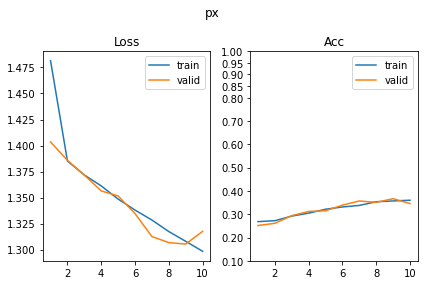

SUP_[FCN8i223o32_d32]_target_[angle]
[ 91/630] shape      SUP_[FCN8i223o32_d32]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 34.44it/s, loss=0.252, acc=0.906]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 51.19it/s, loss=0.28, acc=0.898]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 32.52it/s, loss=0.208, acc=0.922]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 82.67it/s, loss=0.236, acc=0.92]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 27.79it/s, loss=0.21, acc=0.923]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 53.68it/s, loss=0.215, acc=0.924]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 24.07it/s, loss=0.16, acc=0.936]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 68.12it/s, loss=0.189, acc=0.934]     

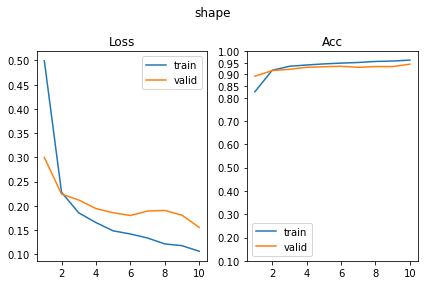

[ 92/630] scale      SUP_[FCN8i223o32_d32]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 22.16it/s, loss=1.04, acc=0.438]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 77.93it/s, loss=1.03, acc=0.439]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 22.26it/s, loss=0.968, acc=0.516]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 44.37it/s, loss=1.02, acc=0.441]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 25.94it/s, loss=0.935, acc=0.52]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 62.22it/s, loss=0.97, acc=0.48]                                              
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 28.23it/s, loss=0.861, acc=0.581]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 81.15it/s, loss=0.947, acc=0.534]     

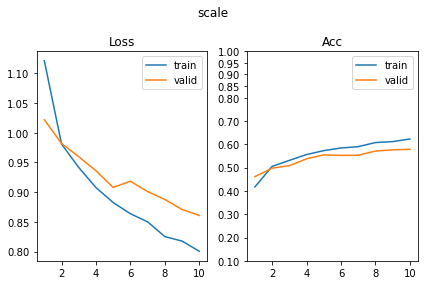

[ 93/630] color      SUP_[FCN8i223o32_d32]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 26.66it/s, loss=2.03, acc=0.195]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 79.67it/s, loss=2.02, acc=0.207]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 32.11it/s, loss=2.01, acc=0.197]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 75.45it/s, loss=2.03, acc=0.19]                                              
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 31.96it/s, loss=2.01, acc=0.194]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 79.48it/s, loss=2.03, acc=0.178]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 29.47it/s, loss=1.97, acc=0.215]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 58.36it/s, loss=2.01, acc=0.183]      

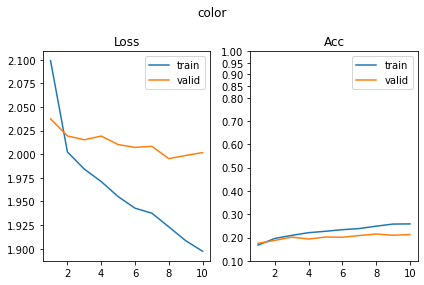

[ 94/630] angle      SUP_[FCN8i223o32_d32]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 28.08it/s, loss=0.554, acc=0.744]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 47.34it/s, loss=0.847, acc=0.622]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 31.76it/s, loss=0.448, acc=0.816]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 78.84it/s, loss=0.875, acc=0.612]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 32.46it/s, loss=0.471, acc=0.796]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 80.77it/s, loss=0.953, acc=0.622]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 32.70it/s, loss=0.506, acc=0.772]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 68.15it/s, loss=0.912, acc=0.627]     

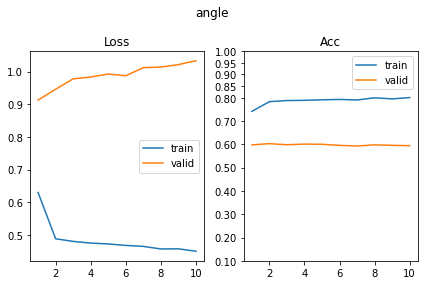

[ 95/630] py         SUP_[FCN8i223o32_d32]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 34.94it/s, loss=1.3, acc=0.394]                                            
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 57.08it/s, loss=1.28, acc=0.38]                                              
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 32.04it/s, loss=1.19, acc=0.427]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 48.92it/s, loss=1.21, acc=0.427]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 25.08it/s, loss=1.12, acc=0.503]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 75.41it/s, loss=1.24, acc=0.41]                                              
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 28.52it/s, loss=1.07, acc=0.49]                                            
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 45.89it/s, loss=1.18, acc=0.441]      

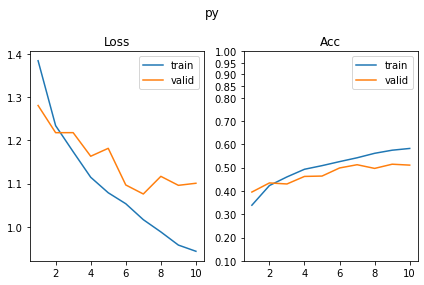

[ 96/630] px         SUP_[FCN8i223o32_d32]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 29.61it/s, loss=1.27, acc=0.41]                                            
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 72.84it/s, loss=1.25, acc=0.417]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 30.32it/s, loss=1.15, acc=0.472]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 74.19it/s, loss=1.17, acc=0.478]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 33.43it/s, loss=1.03, acc=0.533]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 83.52it/s, loss=1.04, acc=0.551]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 30.31it/s, loss=0.993, acc=0.578]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 77.73it/s, loss=1.04, acc=0.527]      

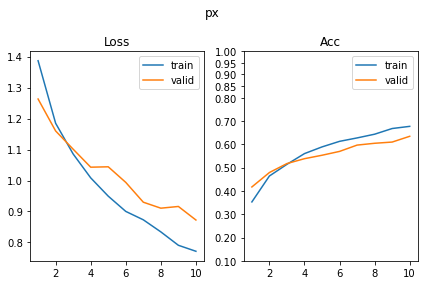

SUP_[FCN8i223o32_d32]_target_[py]
[ 97/630] shape      SUP_[FCN8i223o32_d32]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 34.52it/s, loss=1.13, acc=0.573]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 50.11it/s, loss=1.37, acc=0.49]                                              
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 33.07it/s, loss=0.953, acc=0.621]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 65.46it/s, loss=0.922, acc=0.607]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 27.51it/s, loss=0.853, acc=0.668]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 76.71it/s, loss=0.873, acc=0.671]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 31.64it/s, loss=0.818, acc=0.674]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 75.04it/s, loss=0.845, acc=0.668]     

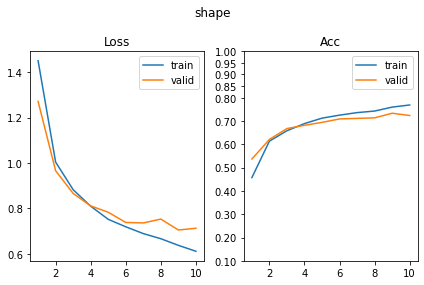

[ 98/630] scale      SUP_[FCN8i223o32_d32]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 30.71it/s, loss=0.998, acc=0.51]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 75.85it/s, loss=1.01, acc=0.485]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 34.91it/s, loss=0.924, acc=0.57]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 52.75it/s, loss=0.964, acc=0.529]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 37.44it/s, loss=0.915, acc=0.557]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 81.34it/s, loss=0.897, acc=0.556]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 30.92it/s, loss=0.911, acc=0.568]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 61.68it/s, loss=0.966, acc=0.495]     

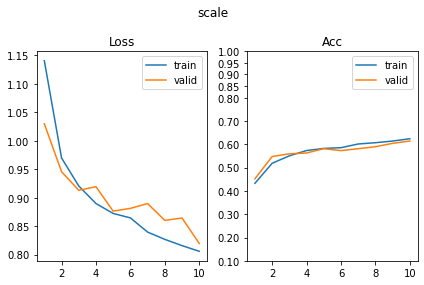

[ 99/630] color      SUP_[FCN8i223o32_d32]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 30.61it/s, loss=2, acc=0.21]                                               
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 76.12it/s, loss=2.02, acc=0.202]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 29.30it/s, loss=1.96, acc=0.213]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 74.92it/s, loss=1.98, acc=0.176]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 33.85it/s, loss=1.93, acc=0.272]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 81.93it/s, loss=1.92, acc=0.241]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 32.89it/s, loss=1.97, acc=0.226]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 72.13it/s, loss=1.94, acc=0.237]      

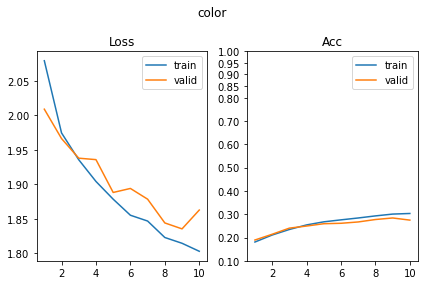

[100/630] angle      SUP_[FCN8i223o32_d32]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 30.76it/s, loss=2.66, acc=0.114]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 79.87it/s, loss=2.65, acc=0.129]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 32.87it/s, loss=2.52, acc=0.173]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 67.92it/s, loss=2.53, acc=0.176]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 30.89it/s, loss=2.37, acc=0.225]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 76.83it/s, loss=2.4, acc=0.222]                                              
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 33.40it/s, loss=2.37, acc=0.221]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 95.60it/s, loss=2.34, acc=0.234]      

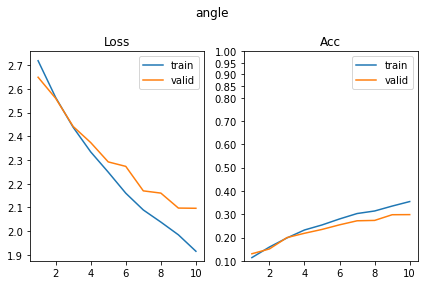

[101/630] py         SUP_[FCN8i223o32_d32]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 29.66it/s, loss=0.0176, acc=0.997]                                         
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 61.23it/s, loss=0.0882, acc=0.978]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 34.46it/s, loss=0.0206, acc=0.99]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 57.53it/s, loss=0.154, acc=0.954]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 33.41it/s, loss=0.0223, acc=0.99]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 79.94it/s, loss=0.113, acc=0.966]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 30.45it/s, loss=0.0177, acc=0.993]                                         
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 55.86it/s, loss=0.186, acc=0.966]     

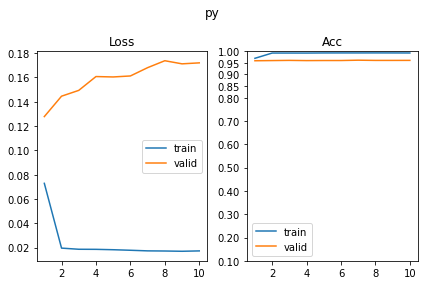

[102/630] px         SUP_[FCN8i223o32_d32]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 29.24it/s, loss=1.37, acc=0.322]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 73.83it/s, loss=1.37, acc=0.288]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 28.30it/s, loss=1.37, acc=0.319]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 75.54it/s, loss=1.36, acc=0.293]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 30.03it/s, loss=1.34, acc=0.319]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 77.45it/s, loss=1.36, acc=0.307]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 28.81it/s, loss=1.31, acc=0.373]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 73.27it/s, loss=1.31, acc=0.376]      

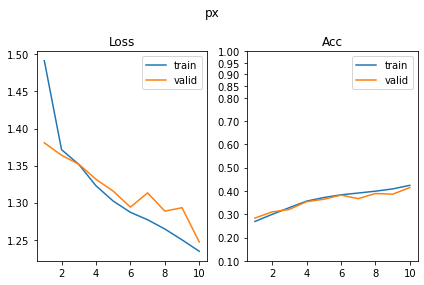

SUP_[FCN8i223o32_d32]_target_[px]
[103/630] shape      SUP_[FCN8i223o32_d32]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 34.24it/s, loss=1.24, acc=0.503]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 79.64it/s, loss=1.37, acc=0.485]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 31.62it/s, loss=1.02, acc=0.598]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 78.15it/s, loss=1.03, acc=0.6]                                               
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 31.41it/s, loss=0.938, acc=0.622]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 81.26it/s, loss=0.906, acc=0.646]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 30.69it/s, loss=0.876, acc=0.686]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 70.00it/s, loss=0.916, acc=0.637]     

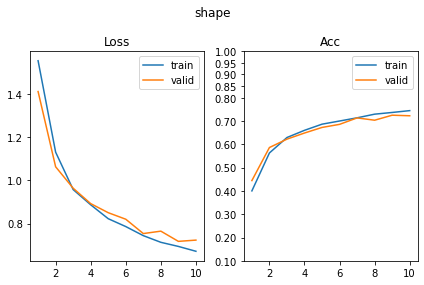

[104/630] scale      SUP_[FCN8i223o32_d32]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 30.27it/s, loss=1.01, acc=0.477]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 78.99it/s, loss=1.05, acc=0.424]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 35.37it/s, loss=0.969, acc=0.526]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 51.14it/s, loss=0.999, acc=0.444]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 36.13it/s, loss=0.921, acc=0.542]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 62.00it/s, loss=0.888, acc=0.568]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 35.32it/s, loss=0.918, acc=0.546]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 70.47it/s, loss=0.961, acc=0.515]     

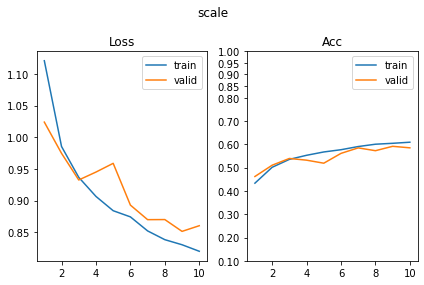

[105/630] color      SUP_[FCN8i223o32_d32]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 31.82it/s, loss=2.01, acc=0.182]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 80.30it/s, loss=1.99, acc=0.21]                                              
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 32.46it/s, loss=1.95, acc=0.213]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 72.19it/s, loss=1.97, acc=0.22]                                              
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 27.59it/s, loss=1.93, acc=0.225]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 72.93it/s, loss=1.97, acc=0.229]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 33.70it/s, loss=1.94, acc=0.244]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 68.87it/s, loss=1.99, acc=0.2]        

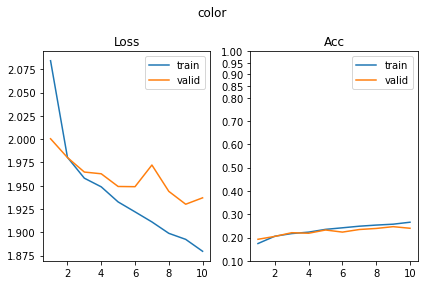

[106/630] angle      SUP_[FCN8i223o32_d32]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 32.91it/s, loss=2.63, acc=0.138]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 42.32it/s, loss=2.68, acc=0.129]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 31.91it/s, loss=2.52, acc=0.189]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 82.97it/s, loss=2.53, acc=0.173]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 33.72it/s, loss=2.37, acc=0.236]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 74.13it/s, loss=2.48, acc=0.171]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 32.81it/s, loss=2.33, acc=0.238]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 70.84it/s, loss=2.37, acc=0.234]      

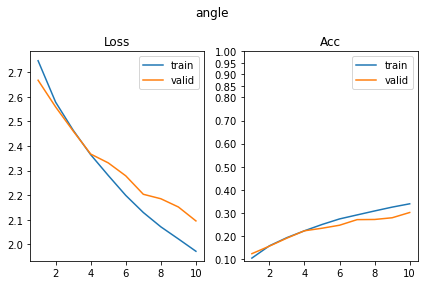

[107/630] py         SUP_[FCN8i223o32_d32]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 31.71it/s, loss=1.39, acc=0.277]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 79.36it/s, loss=1.38, acc=0.266]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 35.40it/s, loss=1.37, acc=0.293]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 50.05it/s, loss=1.37, acc=0.271]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 33.30it/s, loss=1.35, acc=0.332]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 68.49it/s, loss=1.37, acc=0.276]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 29.53it/s, loss=1.34, acc=0.334]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 77.44it/s, loss=1.34, acc=0.344]      

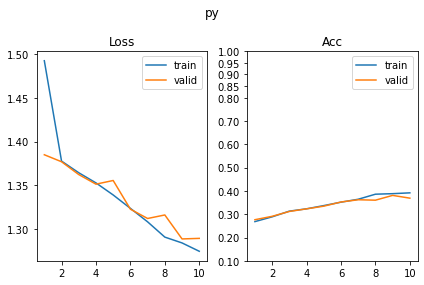

[108/630] px         SUP_[FCN8i223o32_d32]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 21.91it/s, loss=0.018, acc=0.995]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 44.68it/s, loss=0.134, acc=0.946]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 21.46it/s, loss=0.0337, acc=0.989]                                         
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 38.35it/s, loss=0.156, acc=0.963]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 25.92it/s, loss=0.0261, acc=0.987]                                         
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 52.12it/s, loss=0.179, acc=0.963]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 24.67it/s, loss=0.0297, acc=0.99]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 64.53it/s, loss=0.131, acc=0.956]     

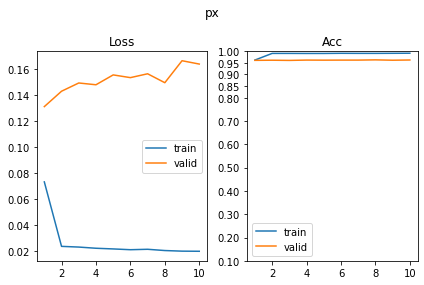

SUP_[FCN8i223o32_d64]_target_[shape]
[109/630] shape      SUP_[FCN8i223o32_d64]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 21.97it/s, loss=0.0114, acc=0.998]                                         
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 49.08it/s, loss=0.0255, acc=0.993]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 28.75it/s, loss=0.0296, acc=0.99]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 75.26it/s, loss=0.0826, acc=0.978]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 26.76it/s, loss=0.0163, acc=0.995]                                         
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 69.77it/s, loss=0.0632, acc=0.976]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 22.82it/s, loss=0.00267, acc=1]                                            
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 61.92it/s, loss=0.0621, acc=0.98]     

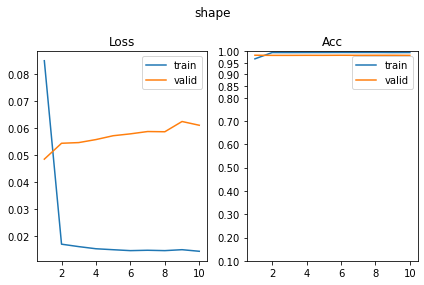

[110/630] scale      SUP_[FCN8i223o32_d64]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 22.20it/s, loss=0.755, acc=0.643]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 65.09it/s, loss=0.743, acc=0.678]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 32.04it/s, loss=0.7, acc=0.695]                                            
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 49.00it/s, loss=0.696, acc=0.685]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 34.25it/s, loss=0.606, acc=0.739]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 68.96it/s, loss=0.711, acc=0.668]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 33.68it/s, loss=0.666, acc=0.686]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 71.74it/s, loss=0.687, acc=0.663]     

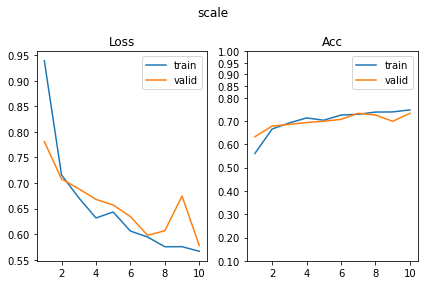

[111/630] color      SUP_[FCN8i223o32_d64]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 27.61it/s, loss=2.02, acc=0.187]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 79.73it/s, loss=2.07, acc=0.183]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 32.21it/s, loss=2.03, acc=0.169]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 54.73it/s, loss=2.01, acc=0.19]                                              
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 29.17it/s, loss=1.99, acc=0.191]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 75.17it/s, loss=2.06, acc=0.159]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 27.26it/s, loss=1.99, acc=0.176]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 53.18it/s, loss=1.99, acc=0.224]      

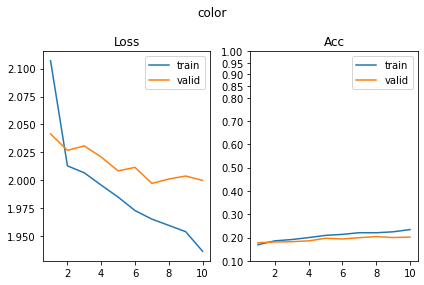

[112/630] angle      SUP_[FCN8i223o32_d64]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 22.81it/s, loss=2.28, acc=0.246]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 52.21it/s, loss=2.36, acc=0.217]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 23.92it/s, loss=1.94, acc=0.319]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 67.14it/s, loss=2.01, acc=0.288]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 20.57it/s, loss=1.67, acc=0.381]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 52.67it/s, loss=1.69, acc=0.402]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 21.38it/s, loss=1.54, acc=0.454]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 55.99it/s, loss=1.62, acc=0.432]      

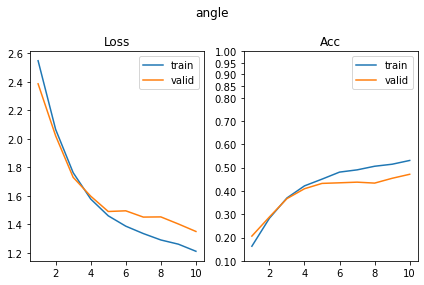

[113/630] py         SUP_[FCN8i223o32_d64]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 24.24it/s, loss=1.28, acc=0.381]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 51.36it/s, loss=1.26, acc=0.444]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 22.63it/s, loss=1.13, acc=0.48]                                            
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 42.18it/s, loss=1.2, acc=0.449]                                              
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 31.76it/s, loss=1.01, acc=0.544]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 76.23it/s, loss=1.05, acc=0.534]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 30.27it/s, loss=0.87, acc=0.625]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 74.86it/s, loss=0.982, acc=0.546]     

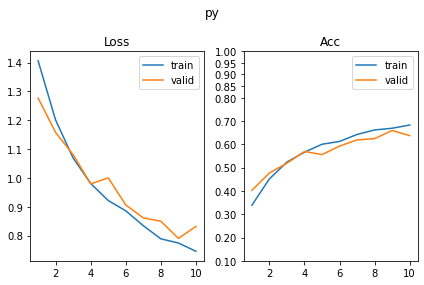

[114/630] px         SUP_[FCN8i223o32_d64]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 23.33it/s, loss=1.26, acc=0.401]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 75.58it/s, loss=1.28, acc=0.39]                                              
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 28.64it/s, loss=1.11, acc=0.463]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 64.37it/s, loss=1.08, acc=0.522]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 20.02it/s, loss=0.968, acc=0.575]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 43.82it/s, loss=0.989, acc=0.541]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 21.07it/s, loss=0.904, acc=0.622]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 85.90it/s, loss=0.963, acc=0.58]      

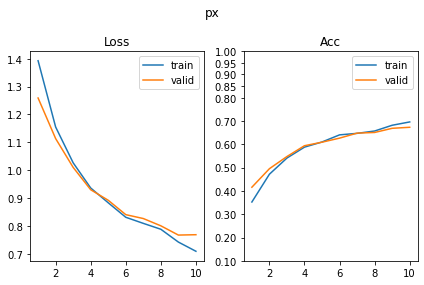

SUP_[FCN8i223o32_d64]_target_[scale]
[115/630] shape      SUP_[FCN8i223o32_d64]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 31.76it/s, loss=1.17, acc=0.542]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 53.61it/s, loss=1.41, acc=0.417]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 32.14it/s, loss=0.962, acc=0.629]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 61.95it/s, loss=1.02, acc=0.598]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 28.67it/s, loss=0.907, acc=0.651]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 62.73it/s, loss=0.948, acc=0.612]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 27.30it/s, loss=0.812, acc=0.689]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 56.49it/s, loss=1.02, acc=0.595]      

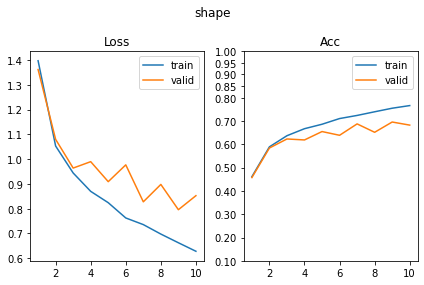

[116/630] scale      SUP_[FCN8i223o32_d64]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 21.55it/s, loss=0.0644, acc=0.964]                                         
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 72.27it/s, loss=0.729, acc=0.815]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 25.23it/s, loss=0.0761, acc=0.972]                                         
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 44.07it/s, loss=0.7, acc=0.832]                                              
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 27.14it/s, loss=0.0522, acc=0.977]                                         
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 53.41it/s, loss=0.823, acc=0.824]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 27.66it/s, loss=0.0701, acc=0.967]                                         
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 69.90it/s, loss=0.837, acc=0.802]     

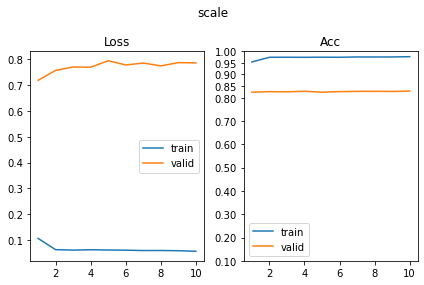

[117/630] color      SUP_[FCN8i223o32_d64]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 19.73it/s, loss=1.74, acc=0.257]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 68.58it/s, loss=1.75, acc=0.3]                                               
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 22.12it/s, loss=1.69, acc=0.339]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 71.23it/s, loss=1.76, acc=0.268]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 33.41it/s, loss=1.65, acc=0.36]                                            
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 79.70it/s, loss=1.72, acc=0.302]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 31.62it/s, loss=1.67, acc=0.329]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 74.34it/s, loss=1.71, acc=0.3]        

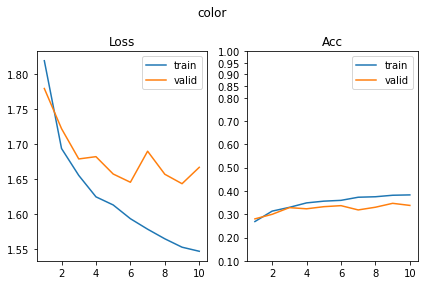

[118/630] angle      SUP_[FCN8i223o32_d64]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 26.41it/s, loss=2.57, acc=0.164]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 35.79it/s, loss=2.67, acc=0.107]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 20.62it/s, loss=2.24, acc=0.248]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 63.29it/s, loss=2.34, acc=0.227]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 23.39it/s, loss=2.15, acc=0.272]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 57.19it/s, loss=2.21, acc=0.268]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 29.63it/s, loss=2.05, acc=0.316]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 64.70it/s, loss=2.13, acc=0.261]      

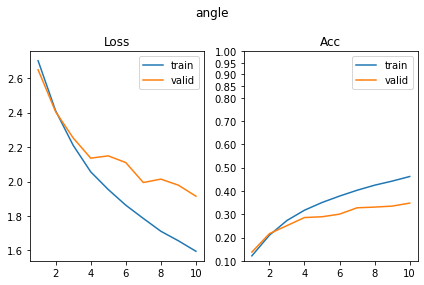

[119/630] py         SUP_[FCN8i223o32_d64]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 24.08it/s, loss=1.08, acc=0.531]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 67.41it/s, loss=1.17, acc=0.488]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 27.88it/s, loss=1.03, acc=0.537]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 51.21it/s, loss=1.02, acc=0.517]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 24.80it/s, loss=0.896, acc=0.632]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 41.76it/s, loss=0.957, acc=0.58]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 21.51it/s, loss=0.887, acc=0.614]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 78.42it/s, loss=0.922, acc=0.593]     

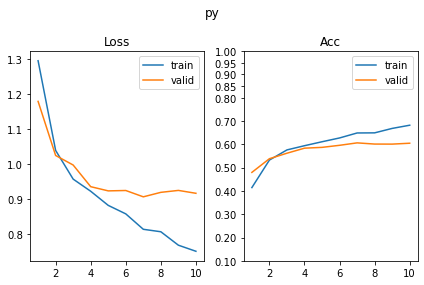

[120/630] px         SUP_[FCN8i223o32_d64]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 20.88it/s, loss=1.13, acc=0.482]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 62.11it/s, loss=1.19, acc=0.449]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 21.87it/s, loss=1.05, acc=0.492]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 55.91it/s, loss=1.15, acc=0.476]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 24.14it/s, loss=0.972, acc=0.549]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 77.43it/s, loss=1.01, acc=0.551]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 20.92it/s, loss=0.882, acc=0.609]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 54.93it/s, loss=1.04, acc=0.537]      

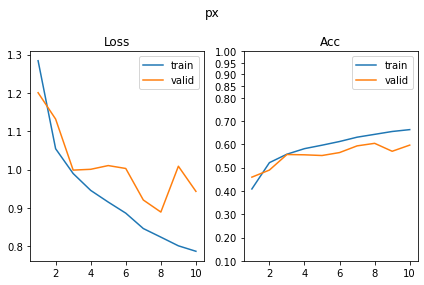

SUP_[FCN8i223o32_d64]_target_[color]
[121/630] shape      SUP_[FCN8i223o32_d64]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 23.39it/s, loss=1.62, acc=0.363]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 71.65it/s, loss=1.68, acc=0.298]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 26.28it/s, loss=1.51, acc=0.381]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 67.61it/s, loss=1.42, acc=0.383]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 28.34it/s, loss=1.4, acc=0.407]                                            
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 74.42it/s, loss=1.37, acc=0.437]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 25.40it/s, loss=1.38, acc=0.436]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 66.04it/s, loss=1.34, acc=0.434]      

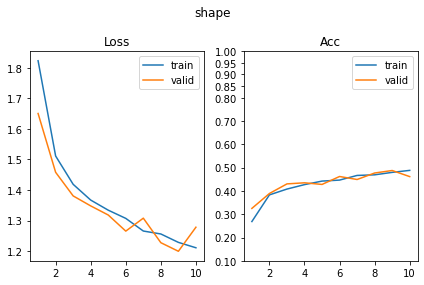

[122/630] scale      SUP_[FCN8i223o32_d64]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 22.16it/s, loss=1.11, acc=0.342]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 50.82it/s, loss=1.11, acc=0.32]                                              
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 22.72it/s, loss=1.11, acc=0.345]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 39.21it/s, loss=1.09, acc=0.351]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 29.90it/s, loss=1.08, acc=0.386]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 62.30it/s, loss=1.1, acc=0.398]                                              
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 25.54it/s, loss=1.07, acc=0.412]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 55.97it/s, loss=1.08, acc=0.383]      

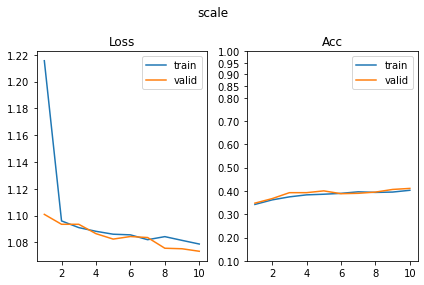

[123/630] color      SUP_[FCN8i223o32_d64]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 27.30it/s, loss=0.00112, acc=1]                                            
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 56.68it/s, loss=0.00129, acc=1]                                              
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 25.94it/s, loss=0.000394, acc=1]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 60.12it/s, loss=0.0019, acc=1]                                               
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 22.84it/s, loss=0.000375, acc=1]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 61.95it/s, loss=0.000436, acc=1]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 30.30it/s, loss=0.000207, acc=1]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 66.02it/s, loss=0.000797, acc=1]      

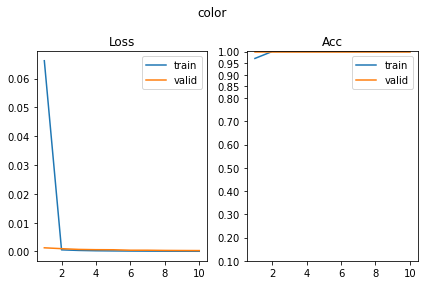

[124/630] angle      SUP_[FCN8i223o32_d64]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 22.62it/s, loss=2.79, acc=0.0749]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 71.19it/s, loss=2.79, acc=0.0537]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 25.95it/s, loss=2.79, acc=0.0668]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 70.71it/s, loss=2.79, acc=0.0756]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 24.43it/s, loss=2.79, acc=0.0554]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 65.47it/s, loss=2.78, acc=0.0854]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 20.62it/s, loss=2.78, acc=0.0684]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 42.64it/s, loss=2.77, acc=0.0732]     

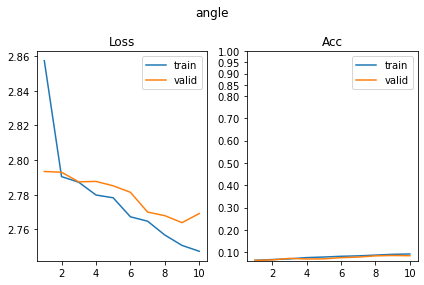

[125/630] py         SUP_[FCN8i223o32_d64]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 22.27it/s, loss=1.35, acc=0.295]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 54.47it/s, loss=1.37, acc=0.278]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 26.78it/s, loss=1.33, acc=0.331]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 38.59it/s, loss=1.37, acc=0.276]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 22.19it/s, loss=1.36, acc=0.314]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 65.69it/s, loss=1.33, acc=0.361]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 21.27it/s, loss=1.26, acc=0.42]                                            
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 59.52it/s, loss=1.32, acc=0.349]      

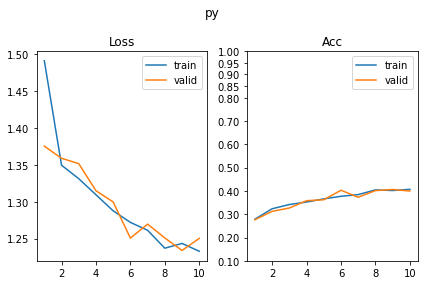

[126/630] px         SUP_[FCN8i223o32_d64]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 20.23it/s, loss=1.37, acc=0.329]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 61.27it/s, loss=1.41, acc=0.259]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 24.38it/s, loss=1.33, acc=0.344]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 61.65it/s, loss=1.33, acc=0.334]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 20.82it/s, loss=1.34, acc=0.332]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 57.68it/s, loss=1.36, acc=0.337]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 20.49it/s, loss=1.29, acc=0.35]                                            
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 56.21it/s, loss=1.28, acc=0.398]      

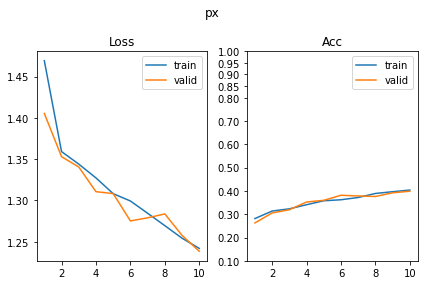

SUP_[FCN8i223o32_d64]_target_[angle]
[127/630] shape      SUP_[FCN8i223o32_d64]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 30.48it/s, loss=0.251, acc=0.906]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 58.27it/s, loss=0.239, acc=0.917]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 31.45it/s, loss=0.184, acc=0.933]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 70.60it/s, loss=0.19, acc=0.929]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 29.13it/s, loss=0.125, acc=0.958]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 60.30it/s, loss=0.213, acc=0.927]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 22.77it/s, loss=0.141, acc=0.953]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 64.50it/s, loss=0.232, acc=0.917]     

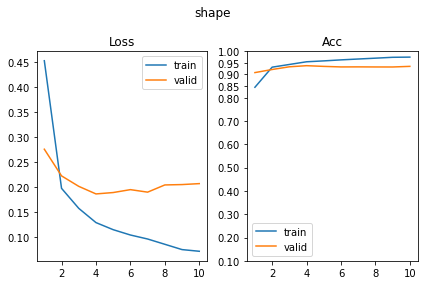

[128/630] scale      SUP_[FCN8i223o32_d64]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 24.10it/s, loss=0.963, acc=0.531]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 77.15it/s, loss=1.02, acc=0.485]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 30.31it/s, loss=0.904, acc=0.573]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 46.22it/s, loss=0.922, acc=0.541]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 24.30it/s, loss=0.882, acc=0.58]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 79.65it/s, loss=0.858, acc=0.576]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 23.68it/s, loss=0.849, acc=0.586]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 52.05it/s, loss=0.932, acc=0.571]     

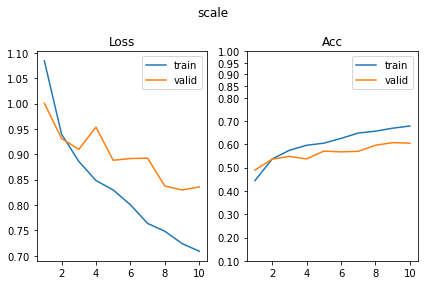

[129/630] color      SUP_[FCN8i223o32_d64]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 28.96it/s, loss=1.94, acc=0.244]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 52.77it/s, loss=1.92, acc=0.227]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 22.14it/s, loss=1.84, acc=0.269]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 54.11it/s, loss=1.87, acc=0.28]                                              
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 28.17it/s, loss=1.82, acc=0.305]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 62.69it/s, loss=1.83, acc=0.312]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 22.85it/s, loss=1.75, acc=0.319]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 76.30it/s, loss=1.79, acc=0.295]      

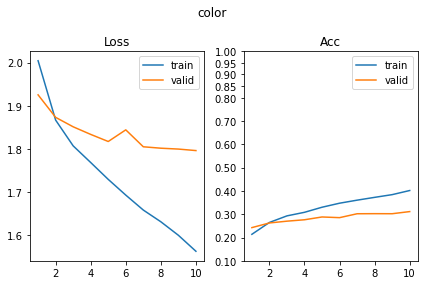

[130/630] angle      SUP_[FCN8i223o32_d64]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 23.07it/s, loss=0.521, acc=0.767]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 81.07it/s, loss=1.04, acc=0.578]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 27.63it/s, loss=0.442, acc=0.821]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 70.90it/s, loss=0.925, acc=0.629]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 22.52it/s, loss=0.553, acc=0.751]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 68.61it/s, loss=1.14, acc=0.576]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 20.35it/s, loss=0.514, acc=0.78]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 78.61it/s, loss=1.09, acc=0.58]       

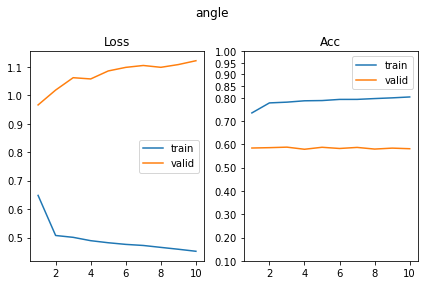

[131/630] py         SUP_[FCN8i223o32_d64]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 25.46it/s, loss=1.17, acc=0.471]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 64.91it/s, loss=1.14, acc=0.473]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 29.41it/s, loss=0.971, acc=0.56]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 47.98it/s, loss=1.04, acc=0.52]                                              
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 32.99it/s, loss=0.91, acc=0.594]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 59.66it/s, loss=0.923, acc=0.61]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 30.35it/s, loss=0.736, acc=0.676]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 69.97it/s, loss=0.921, acc=0.605]     

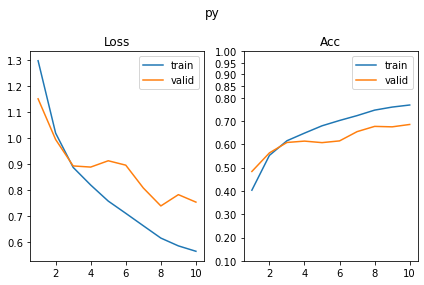

[132/630] px         SUP_[FCN8i223o32_d64]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 23.80it/s, loss=1.14, acc=0.474]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 38.64it/s, loss=1.15, acc=0.483]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 24.31it/s, loss=0.916, acc=0.609]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 42.41it/s, loss=0.966, acc=0.602]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 29.64it/s, loss=0.832, acc=0.629]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 58.16it/s, loss=0.928, acc=0.605]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 27.55it/s, loss=0.822, acc=0.647]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 81.84it/s, loss=0.958, acc=0.598]     

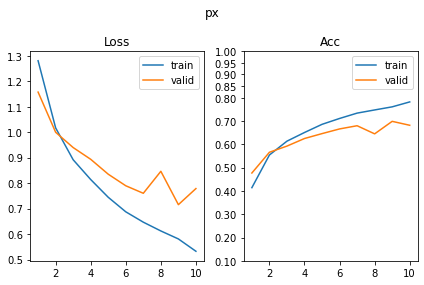

SUP_[FCN8i223o32_d64]_target_[py]
[133/630] shape      SUP_[FCN8i223o32_d64]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 31.94it/s, loss=1.07, acc=0.603]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 34.59it/s, loss=1.37, acc=0.476]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 27.70it/s, loss=0.776, acc=0.702]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 100.79it/s, loss=0.875, acc=0.673]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 30.70it/s, loss=0.681, acc=0.752]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 66.49it/s, loss=0.735, acc=0.715]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 30.33it/s, loss=0.692, acc=0.746]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 80.49it/s, loss=0.832, acc=0.695]     

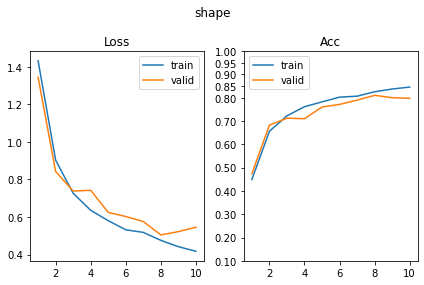

[134/630] scale      SUP_[FCN8i223o32_d64]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 32.04it/s, loss=0.995, acc=0.498]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 59.19it/s, loss=1.05, acc=0.432]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 34.66it/s, loss=0.925, acc=0.555]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 53.23it/s, loss=0.938, acc=0.529]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 26.96it/s, loss=0.852, acc=0.601]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 66.69it/s, loss=0.944, acc=0.52]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 26.26it/s, loss=0.822, acc=0.591]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 72.10it/s, loss=0.842, acc=0.6]       

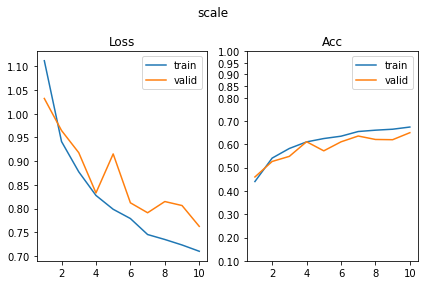

[135/630] color      SUP_[FCN8i223o32_d64]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 27.75it/s, loss=1.95, acc=0.189]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 80.06it/s, loss=1.99, acc=0.19]                                              
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 33.75it/s, loss=1.92, acc=0.23]                                            
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 82.64it/s, loss=1.97, acc=0.193]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 35.87it/s, loss=1.9, acc=0.228]                                            
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 79.32it/s, loss=1.94, acc=0.234]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 34.52it/s, loss=1.91, acc=0.254]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 78.16it/s, loss=1.93, acc=0.227]      

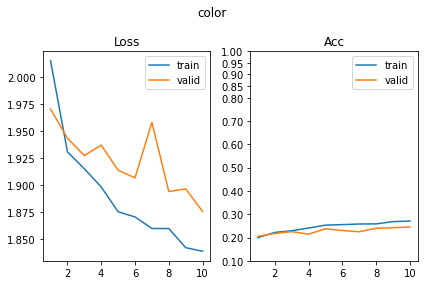

[136/630] angle      SUP_[FCN8i223o32_d64]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:02<00:00, 16.97it/s, loss=2.59, acc=0.145]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 72.08it/s, loss=2.68, acc=0.122]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 21.74it/s, loss=2.38, acc=0.212]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 51.65it/s, loss=2.47, acc=0.171]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 19.70it/s, loss=2.17, acc=0.29]                                            
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 79.54it/s, loss=2.26, acc=0.224]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 32.03it/s, loss=2.07, acc=0.322]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 71.03it/s, loss=2.22, acc=0.239]      

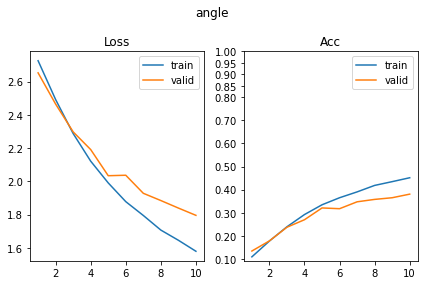

[137/630] py         SUP_[FCN8i223o32_d64]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 27.69it/s, loss=0.0542, acc=0.979]                                         
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 53.95it/s, loss=0.113, acc=0.959]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 31.16it/s, loss=0.0453, acc=0.985]                                         
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 51.78it/s, loss=0.101, acc=0.956]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 29.31it/s, loss=0.0214, acc=0.992]                                         
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 75.66it/s, loss=0.129, acc=0.951]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 24.08it/s, loss=0.0357, acc=0.982]                                         
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 69.09it/s, loss=0.105, acc=0.966]     

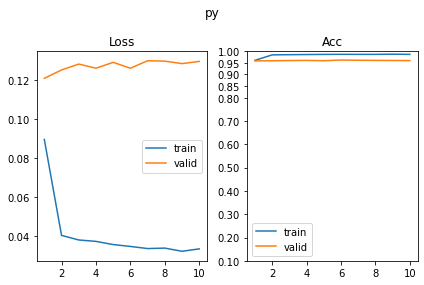

[138/630] px         SUP_[FCN8i223o32_d64]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 29.03it/s, loss=1.38, acc=0.275]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 66.74it/s, loss=1.4, acc=0.268]                                              
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 27.95it/s, loss=1.36, acc=0.326]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 77.96it/s, loss=1.36, acc=0.341]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 30.67it/s, loss=1.33, acc=0.352]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 80.46it/s, loss=1.35, acc=0.344]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 33.23it/s, loss=1.32, acc=0.37]                                            
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 80.11it/s, loss=1.33, acc=0.368]      

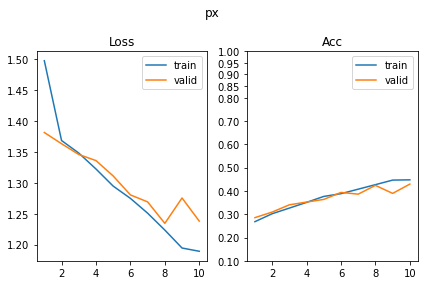

SUP_[FCN8i223o32_d64]_target_[px]
[139/630] shape      SUP_[FCN8i223o32_d64]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 32.74it/s, loss=0.832, acc=0.695]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 55.00it/s, loss=1.07, acc=0.62]                                              
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 32.72it/s, loss=0.68, acc=0.752]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 90.55it/s, loss=0.679, acc=0.739]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 34.24it/s, loss=0.612, acc=0.759]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 81.29it/s, loss=0.67, acc=0.737]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 35.70it/s, loss=0.547, acc=0.8]                                            
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 82.96it/s, loss=0.572, acc=0.773]     

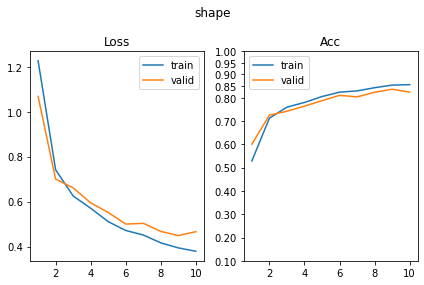

[140/630] scale      SUP_[FCN8i223o32_d64]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 31.76it/s, loss=0.988, acc=0.477]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 81.37it/s, loss=1.01, acc=0.485]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 31.40it/s, loss=0.88, acc=0.568]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 51.90it/s, loss=0.933, acc=0.522]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 33.79it/s, loss=0.83, acc=0.596]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 74.39it/s, loss=0.813, acc=0.624]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 31.15it/s, loss=0.781, acc=0.656]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 82.56it/s, loss=0.87, acc=0.607]      

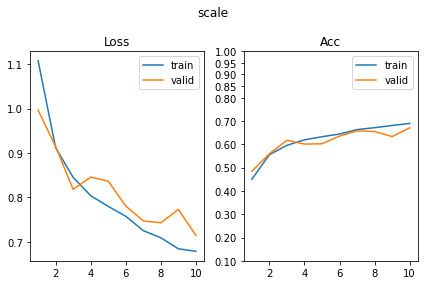

[141/630] color      SUP_[FCN8i223o32_d64]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 27.87it/s, loss=1.9, acc=0.236]                                            
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 57.32it/s, loss=1.93, acc=0.237]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 32.20it/s, loss=1.81, acc=0.282]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 77.56it/s, loss=1.83, acc=0.302]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 33.60it/s, loss=1.8, acc=0.269]                                            
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 81.97it/s, loss=1.78, acc=0.324]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 34.71it/s, loss=1.74, acc=0.316]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 70.83it/s, loss=1.77, acc=0.302]      

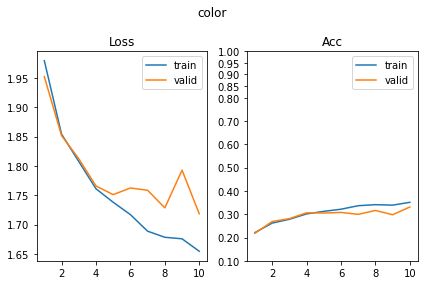

[142/630] angle      SUP_[FCN8i223o32_d64]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 30.75it/s, loss=2.61, acc=0.114]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 68.16it/s, loss=2.6, acc=0.154]                                              
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 32.77it/s, loss=2.34, acc=0.226]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 76.50it/s, loss=2.39, acc=0.21]                                              
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 32.08it/s, loss=2.19, acc=0.261]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 69.78it/s, loss=2.32, acc=0.222]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 32.47it/s, loss=2, acc=0.301]                                              
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 61.66it/s, loss=2.08, acc=0.29]       

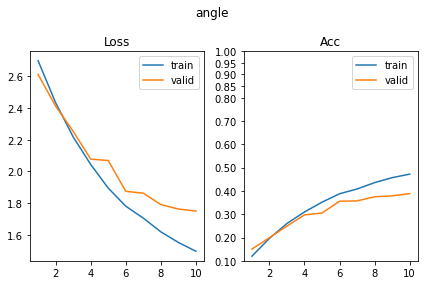

[143/630] py         SUP_[FCN8i223o32_d64]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 27.36it/s, loss=1.39, acc=0.259]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 70.56it/s, loss=1.38, acc=0.256]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 34.83it/s, loss=1.35, acc=0.309]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 50.31it/s, loss=1.37, acc=0.307]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 31.56it/s, loss=1.31, acc=0.347]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 71.19it/s, loss=1.37, acc=0.317]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 34.05it/s, loss=1.25, acc=0.42]                                            
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 78.54it/s, loss=1.31, acc=0.368]      

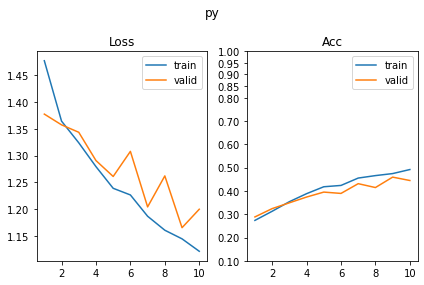

[144/630] px         SUP_[FCN8i223o32_d64]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 28.36it/s, loss=0.0578, acc=0.976]                                         
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 74.11it/s, loss=0.0906, acc=0.966]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 32.48it/s, loss=0.0225, acc=0.99]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 68.85it/s, loss=0.111, acc=0.961]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 30.01it/s, loss=0.0287, acc=0.989]                                         
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 75.38it/s, loss=0.115, acc=0.961]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 29.96it/s, loss=0.0213, acc=0.993]                                         
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 61.07it/s, loss=0.106, acc=0.959]     

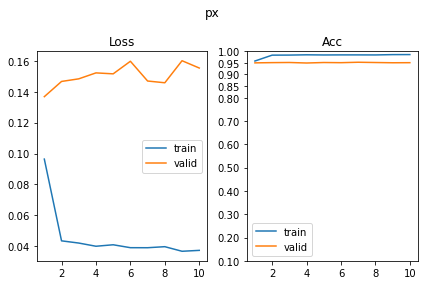

SUP_[FCN8i223o32_d128]_target_[shape]
[145/630] shape      SUP_[FCN8i223o32_d128]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 31.26it/s, loss=0.0177, acc=0.993]                                         
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 68.22it/s, loss=0.128, acc=0.961]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 32.46it/s, loss=0.0319, acc=0.989]                                         
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 80.60it/s, loss=0.137, acc=0.959]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 31.28it/s, loss=0.041, acc=0.989]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 57.20it/s, loss=0.153, acc=0.956]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 33.94it/s, loss=0.0201, acc=0.993]                                         
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 75.47it/s, loss=0.207, acc=0.951]     

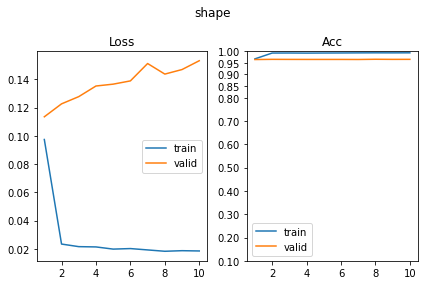

[146/630] scale      SUP_[FCN8i223o32_d128]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 28.77it/s, loss=0.751, acc=0.643]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 70.38it/s, loss=0.843, acc=0.588]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 35.28it/s, loss=0.616, acc=0.718]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 53.17it/s, loss=0.742, acc=0.654]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 36.86it/s, loss=0.642, acc=0.715]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 74.67it/s, loss=0.666, acc=0.676]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 32.33it/s, loss=0.567, acc=0.756]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 70.23it/s, loss=0.665, acc=0.69]      

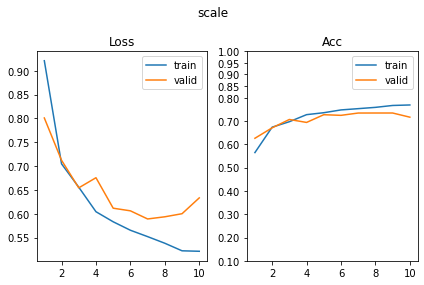

[147/630] color      SUP_[FCN8i223o32_d128]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 28.42it/s, loss=1.79, acc=0.28]                                            
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 73.13it/s, loss=1.74, acc=0.346]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 31.92it/s, loss=1.62, acc=0.35]                                            
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 76.28it/s, loss=1.7, acc=0.315]                                              
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 27.60it/s, loss=1.54, acc=0.402]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 69.01it/s, loss=1.56, acc=0.373]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 26.00it/s, loss=1.52, acc=0.397]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 70.20it/s, loss=1.53, acc=0.383]      

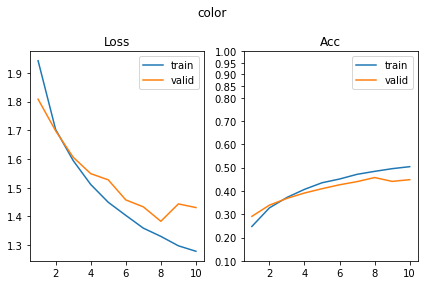

[148/630] angle      SUP_[FCN8i223o32_d128]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 28.58it/s, loss=1.88, acc=0.342]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 50.08it/s, loss=2.04, acc=0.307]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 28.12it/s, loss=1.5, acc=0.441]                                            
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 64.00it/s, loss=1.64, acc=0.402]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 27.25it/s, loss=1.35, acc=0.463]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 69.99it/s, loss=1.32, acc=0.5]                                               
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 29.27it/s, loss=1.27, acc=0.502]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 29.80it/s, loss=1.37, acc=0.476]      

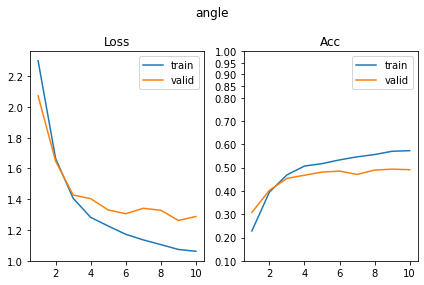

[149/630] py         SUP_[FCN8i223o32_d128]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 29.07it/s, loss=1.15, acc=0.485]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 58.71it/s, loss=1.21, acc=0.459]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 33.19it/s, loss=0.897, acc=0.588]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 53.25it/s, loss=0.922, acc=0.58]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 36.06it/s, loss=0.827, acc=0.625]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 78.60it/s, loss=0.727, acc=0.678]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 33.06it/s, loss=0.712, acc=0.699]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 80.68it/s, loss=0.794, acc=0.656]     

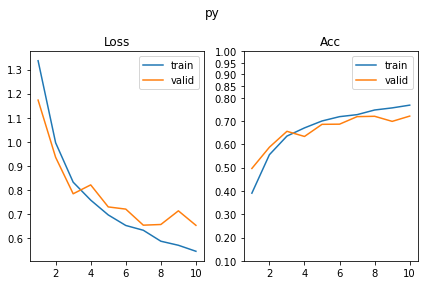

[150/630] px         SUP_[FCN8i223o32_d128]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 30.50it/s, loss=1.16, acc=0.493]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 71.43it/s, loss=1.16, acc=0.49]                                              
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 28.13it/s, loss=0.936, acc=0.581]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 54.83it/s, loss=0.98, acc=0.556]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 28.02it/s, loss=0.817, acc=0.635]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 71.22it/s, loss=0.892, acc=0.593]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 32.08it/s, loss=0.719, acc=0.687]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 66.29it/s, loss=0.814, acc=0.629]     

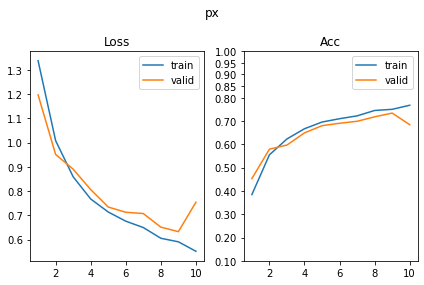

SUP_[FCN8i223o32_d128]_target_[scale]
[151/630] shape      SUP_[FCN8i223o32_d128]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 29.68it/s, loss=1.14, acc=0.567]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 50.03it/s, loss=1.37, acc=0.471]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 34.08it/s, loss=0.997, acc=0.606]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 69.59it/s, loss=1.11, acc=0.563]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 33.85it/s, loss=0.922, acc=0.637]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 77.06it/s, loss=0.987, acc=0.61]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 33.44it/s, loss=0.772, acc=0.708]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 80.52it/s, loss=0.908, acc=0.649]     

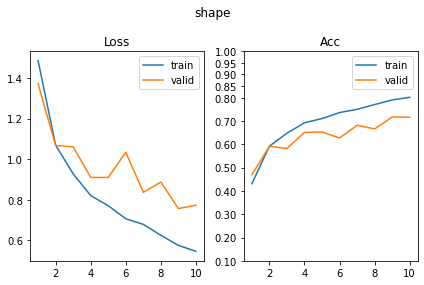

[152/630] scale      SUP_[FCN8i223o32_d128]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 24.26it/s, loss=0.0692, acc=0.969]                                         
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 62.96it/s, loss=0.815, acc=0.82]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 33.34it/s, loss=0.0569, acc=0.982]                                         
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 49.24it/s, loss=0.858, acc=0.829]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 29.58it/s, loss=0.0456, acc=0.98]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 50.44it/s, loss=0.796, acc=0.822]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 24.85it/s, loss=0.0562, acc=0.977]                                         
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 79.29it/s, loss=0.857, acc=0.817]     

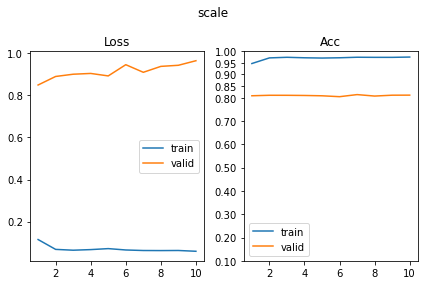

[153/630] color      SUP_[FCN8i223o32_d128]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 30.20it/s, loss=1.46, acc=0.383]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 72.09it/s, loss=1.56, acc=0.354]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 29.07it/s, loss=1.32, acc=0.414]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 74.41it/s, loss=1.39, acc=0.4]                                               
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 26.42it/s, loss=1.28, acc=0.458]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 52.37it/s, loss=1.38, acc=0.444]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 29.59it/s, loss=1.25, acc=0.472]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 46.61it/s, loss=1.35, acc=0.429]      

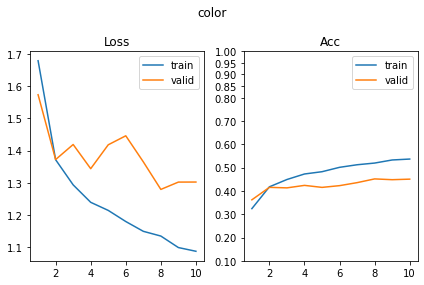

[154/630] angle      SUP_[FCN8i223o32_d128]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 28.86it/s, loss=2.38, acc=0.22]                                            
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 54.47it/s, loss=2.61, acc=0.171]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 30.31it/s, loss=2.19, acc=0.274]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 79.49it/s, loss=2.3, acc=0.266]                                              
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 31.73it/s, loss=2.08, acc=0.301]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 75.73it/s, loss=2.16, acc=0.298]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 25.61it/s, loss=1.87, acc=0.365]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 66.91it/s, loss=2.06, acc=0.3]        

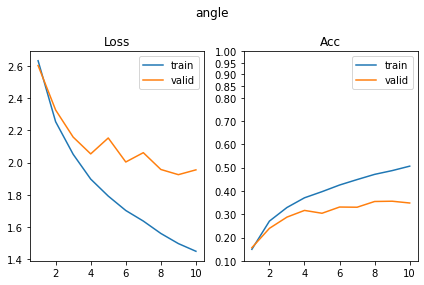

[155/630] py         SUP_[FCN8i223o32_d128]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 18.04it/s, loss=0.975, acc=0.55]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 58.80it/s, loss=1.15, acc=0.463]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 19.98it/s, loss=0.937, acc=0.598]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 32.50it/s, loss=0.96, acc=0.563]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 26.55it/s, loss=0.872, acc=0.603]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 70.45it/s, loss=1.1, acc=0.515]                                              
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 21.35it/s, loss=0.876, acc=0.611]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 60.01it/s, loss=0.968, acc=0.571]     

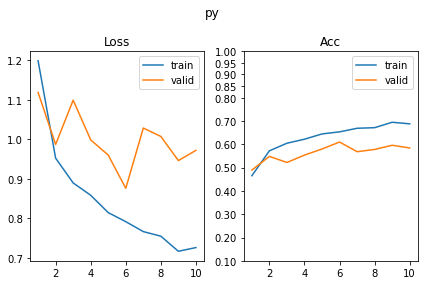

[156/630] px         SUP_[FCN8i223o32_d128]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 23.58it/s, loss=1.08, acc=0.493]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 56.43it/s, loss=1.09, acc=0.527]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 26.99it/s, loss=0.982, acc=0.567]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 65.59it/s, loss=1.02, acc=0.544]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 19.18it/s, loss=0.912, acc=0.58]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 50.60it/s, loss=1.03, acc=0.532]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 23.41it/s, loss=0.829, acc=0.653]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 48.98it/s, loss=0.95, acc=0.571]      

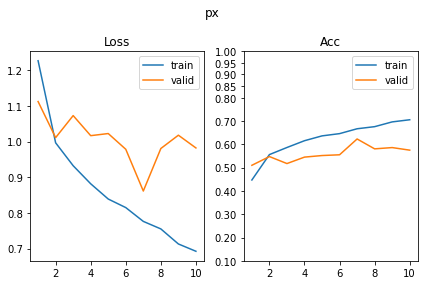

SUP_[FCN8i223o32_d128]_target_[color]
[157/630] shape      SUP_[FCN8i223o32_d128]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 20.61it/s, loss=1.54, acc=0.321]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 34.82it/s, loss=1.67, acc=0.351]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 26.54it/s, loss=1.35, acc=0.406]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 73.49it/s, loss=1.51, acc=0.376]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 29.66it/s, loss=1.22, acc=0.471]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 68.61it/s, loss=1.35, acc=0.439]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 24.37it/s, loss=1.23, acc=0.467]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 63.23it/s, loss=1.35, acc=0.4]        

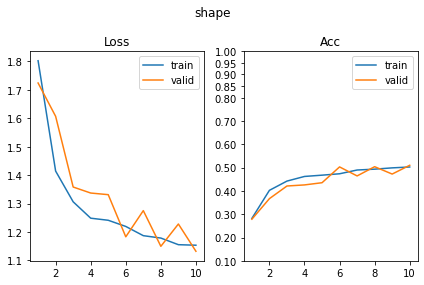

[158/630] scale      SUP_[FCN8i223o32_d128]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 20.88it/s, loss=1.1, acc=0.371]                                            
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 68.22it/s, loss=1.1, acc=0.329]                                              
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 29.91it/s, loss=1.1, acc=0.347]                                            
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 70.16it/s, loss=1.07, acc=0.427]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 32.25it/s, loss=1.09, acc=0.394]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 79.03it/s, loss=1.08, acc=0.424]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 33.85it/s, loss=1.09, acc=0.406]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 57.63it/s, loss=1.08, acc=0.422]      

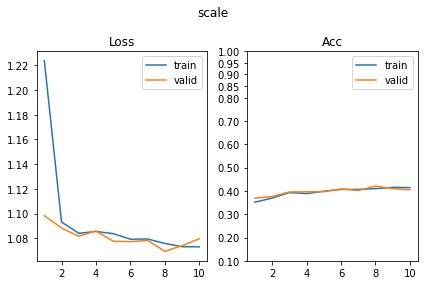

[159/630] color      SUP_[FCN8i223o32_d128]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 31.40it/s, loss=0.000554, acc=1]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 59.13it/s, loss=0.000506, acc=1]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 26.20it/s, loss=0.000324, acc=1]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 67.24it/s, loss=0.000445, acc=1]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 29.58it/s, loss=0.000222, acc=1]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 52.79it/s, loss=0.000224, acc=1]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 28.58it/s, loss=0.000165, acc=1]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 70.04it/s, loss=0.000185, acc=1]      

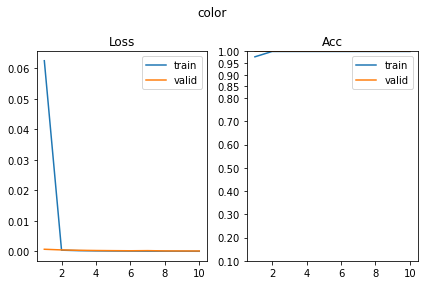

[160/630] angle      SUP_[FCN8i223o32_d128]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 23.30it/s, loss=2.79, acc=0.0635]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 33.22it/s, loss=2.8, acc=0.0585]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 28.94it/s, loss=2.79, acc=0.0814]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 68.49it/s, loss=2.8, acc=0.0707]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 23.63it/s, loss=2.78, acc=0.0733]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 55.30it/s, loss=2.81, acc=0.061]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 24.22it/s, loss=2.79, acc=0.0554]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 45.03it/s, loss=2.78, acc=0.0902]     

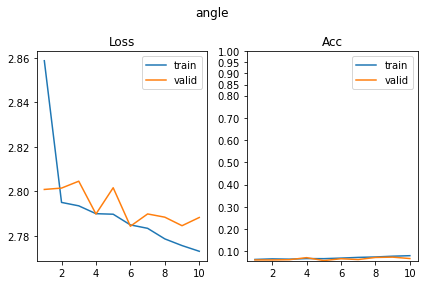

[161/630] py         SUP_[FCN8i223o32_d128]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 23.28it/s, loss=1.39, acc=0.277]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 74.65it/s, loss=1.39, acc=0.283]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 31.78it/s, loss=1.38, acc=0.311]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 43.86it/s, loss=1.39, acc=0.271]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 30.83it/s, loss=1.37, acc=0.28]                                            
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 72.67it/s, loss=1.37, acc=0.293]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 29.84it/s, loss=1.34, acc=0.334]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 80.11it/s, loss=1.35, acc=0.322]      

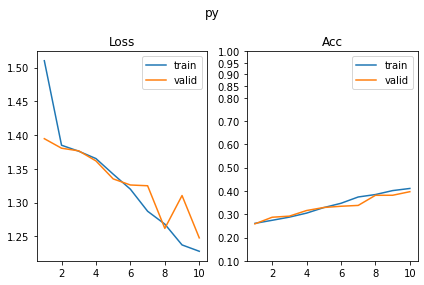

[162/630] px         SUP_[FCN8i223o32_d128]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 25.49it/s, loss=1.4, acc=0.252]                                            
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 80.42it/s, loss=1.38, acc=0.28]                                              
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 31.81it/s, loss=1.37, acc=0.311]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 75.49it/s, loss=1.37, acc=0.317]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 23.75it/s, loss=1.35, acc=0.295]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 70.57it/s, loss=1.36, acc=0.315]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 28.01it/s, loss=1.32, acc=0.322]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 72.28it/s, loss=1.38, acc=0.329]      

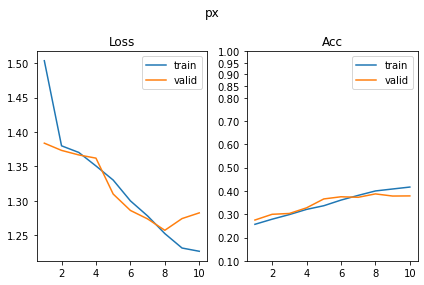

SUP_[FCN8i223o32_d128]_target_[angle]
[163/630] shape      SUP_[FCN8i223o32_d128]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 29.24it/s, loss=0.175, acc=0.943]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 73.81it/s, loss=0.21, acc=0.934]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 33.49it/s, loss=0.134, acc=0.941]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 68.10it/s, loss=0.147, acc=0.949]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 33.40it/s, loss=0.11, acc=0.954]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 65.99it/s, loss=0.143, acc=0.959]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 32.68it/s, loss=0.0793, acc=0.976]                                         
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 78.28it/s, loss=0.16, acc=0.939]      

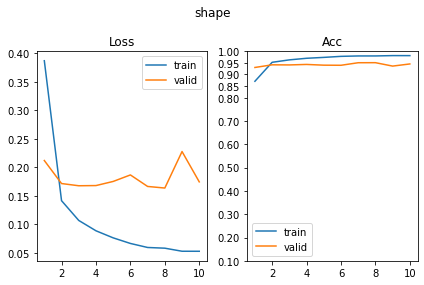

[164/630] scale      SUP_[FCN8i223o32_d128]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 28.98it/s, loss=0.959, acc=0.528]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 72.42it/s, loss=0.98, acc=0.524]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 35.93it/s, loss=0.803, acc=0.614]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 52.86it/s, loss=0.866, acc=0.59]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 35.48it/s, loss=0.8, acc=0.647]                                            
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 75.13it/s, loss=0.856, acc=0.576]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 30.99it/s, loss=0.829, acc=0.621]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 71.46it/s, loss=0.775, acc=0.629]     

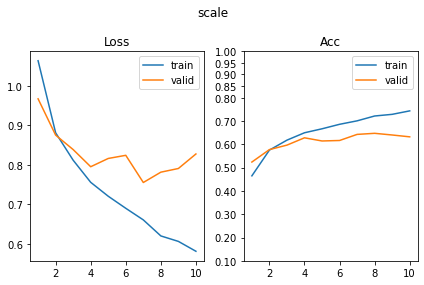

[165/630] color      SUP_[FCN8i223o32_d128]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 29.85it/s, loss=2.02, acc=0.189]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 72.20it/s, loss=2, acc=0.217]                                                
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 33.56it/s, loss=1.9, acc=0.226]                                            
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 78.09it/s, loss=1.94, acc=0.22]                                              
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 31.34it/s, loss=1.84, acc=0.292]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 64.90it/s, loss=1.89, acc=0.256]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 30.39it/s, loss=1.77, acc=0.318]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 74.39it/s, loss=1.87, acc=0.278]      

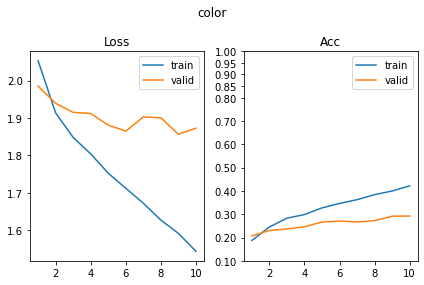

[166/630] angle      SUP_[FCN8i223o32_d128]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 33.76it/s, loss=0.413, acc=0.84]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 50.88it/s, loss=1.01, acc=0.58]                                              
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 32.44it/s, loss=0.416, acc=0.845]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 66.19it/s, loss=1.11, acc=0.58]                                              
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 32.27it/s, loss=0.41, acc=0.824]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 80.74it/s, loss=0.993, acc=0.602]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 34.64it/s, loss=0.404, acc=0.819]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 79.49it/s, loss=1.15, acc=0.568]      

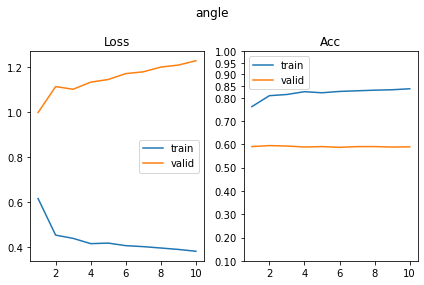

[167/630] py         SUP_[FCN8i223o32_d128]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 28.62it/s, loss=1.02, acc=0.575]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 78.48it/s, loss=1.03, acc=0.576]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 33.45it/s, loss=0.768, acc=0.707]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 69.51it/s, loss=0.911, acc=0.583]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 32.02it/s, loss=0.675, acc=0.718]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 82.18it/s, loss=0.873, acc=0.615]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 34.42it/s, loss=0.62, acc=0.733]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 80.26it/s, loss=0.695, acc=0.685]     

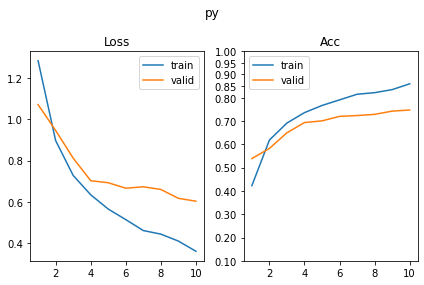

[168/630] px         SUP_[FCN8i223o32_d128]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 32.49it/s, loss=1.11, acc=0.526]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 76.03it/s, loss=1.13, acc=0.468]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 33.18it/s, loss=0.842, acc=0.614]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 72.66it/s, loss=0.885, acc=0.612]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 28.96it/s, loss=0.75, acc=0.715]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 70.54it/s, loss=0.808, acc=0.685]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 26.98it/s, loss=0.69, acc=0.713]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 73.59it/s, loss=0.787, acc=0.651]     

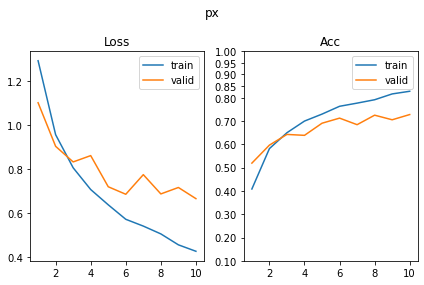

SUP_[FCN8i223o32_d128]_target_[py]
[169/630] shape      SUP_[FCN8i223o32_d128]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 31.62it/s, loss=0.809, acc=0.704]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 48.67it/s, loss=1.14, acc=0.559]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 37.43it/s, loss=0.565, acc=0.779]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 79.72it/s, loss=0.609, acc=0.776]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 30.26it/s, loss=0.505, acc=0.808]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 73.45it/s, loss=0.49, acc=0.807]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 35.69it/s, loss=0.393, acc=0.853]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 76.04it/s, loss=0.673, acc=0.749]     

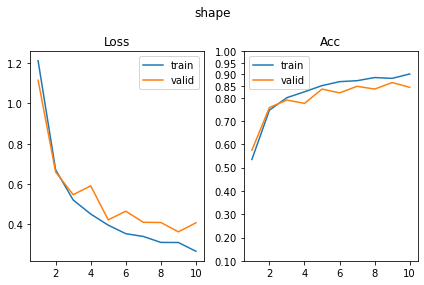

[170/630] scale      SUP_[FCN8i223o32_d128]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 27.55it/s, loss=0.936, acc=0.564]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 68.74it/s, loss=0.977, acc=0.541]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 31.90it/s, loss=0.841, acc=0.594]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 43.57it/s, loss=0.99, acc=0.493]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 36.43it/s, loss=0.81, acc=0.638]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 66.46it/s, loss=0.82, acc=0.607]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 28.78it/s, loss=0.707, acc=0.679]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 71.25it/s, loss=0.716, acc=0.671]     

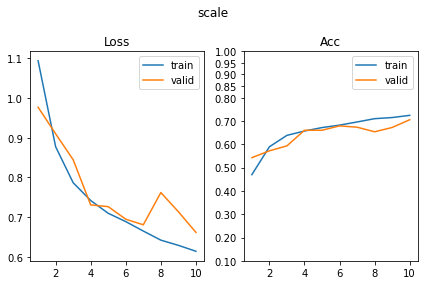

[171/630] color      SUP_[FCN8i223o32_d128]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 29.32it/s, loss=1.99, acc=0.184]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 56.83it/s, loss=1.97, acc=0.215]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 32.63it/s, loss=1.92, acc=0.249]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 71.96it/s, loss=2, acc=0.205]                                                
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 32.86it/s, loss=1.89, acc=0.246]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 70.89it/s, loss=1.93, acc=0.205]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 32.37it/s, loss=1.83, acc=0.267]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 67.06it/s, loss=1.92, acc=0.205]      

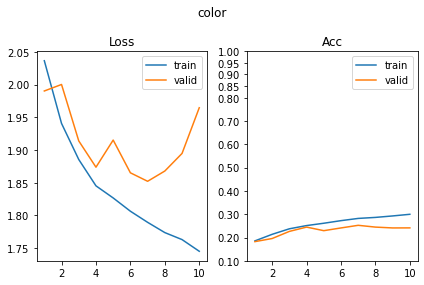

[172/630] angle      SUP_[FCN8i223o32_d128]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 31.25it/s, loss=2.4, acc=0.186]                                            
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 72.27it/s, loss=2.55, acc=0.159]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 31.40it/s, loss=2.05, acc=0.327]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 71.05it/s, loss=2.21, acc=0.249]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 33.35it/s, loss=1.85, acc=0.383]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 79.99it/s, loss=2.05, acc=0.332]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 35.56it/s, loss=1.64, acc=0.415]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 78.40it/s, loss=1.72, acc=0.412]      

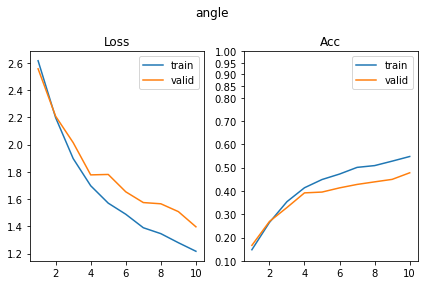

[173/630] py         SUP_[FCN8i223o32_d128]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 30.55it/s, loss=0.0494, acc=0.985]                                         
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 80.67it/s, loss=0.0941, acc=0.963]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 35.27it/s, loss=0.03, acc=0.989]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 50.83it/s, loss=0.0972, acc=0.968]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 34.46it/s, loss=0.0329, acc=0.989]                                         
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 77.65it/s, loss=0.0951, acc=0.976]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 29.44it/s, loss=0.0293, acc=0.99]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 77.62it/s, loss=0.0869, acc=0.959]    

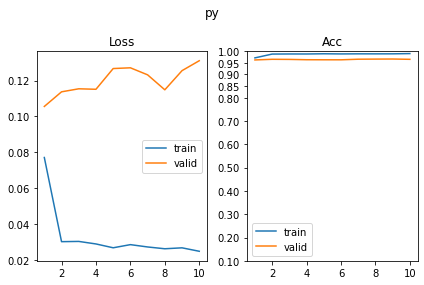

[174/630] px         SUP_[FCN8i223o32_d128]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 29.96it/s, loss=1.36, acc=0.349]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 77.74it/s, loss=1.37, acc=0.32]                                              
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 32.01it/s, loss=1.2, acc=0.433]                                            
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 76.24it/s, loss=1.24, acc=0.441]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 33.71it/s, loss=1.17, acc=0.453]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 81.24it/s, loss=1.15, acc=0.476]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 34.68it/s, loss=1.07, acc=0.534]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 81.77it/s, loss=1.15, acc=0.488]      

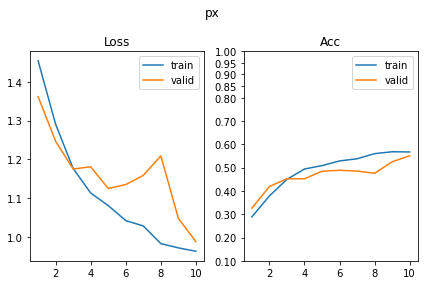

SUP_[FCN8i223o32_d128]_target_[px]
[175/630] shape      SUP_[FCN8i223o32_d128]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 31.99it/s, loss=0.781, acc=0.702]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 74.05it/s, loss=1.17, acc=0.537]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 30.25it/s, loss=0.549, acc=0.787]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 76.05it/s, loss=0.641, acc=0.756]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 27.63it/s, loss=0.42, acc=0.849]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 69.00it/s, loss=0.5, acc=0.81]                                               
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 32.38it/s, loss=0.363, acc=0.853]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 77.87it/s, loss=0.534, acc=0.776]     

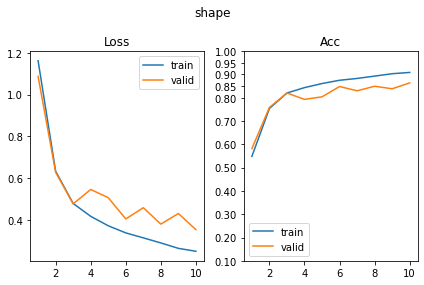

[176/630] scale      SUP_[FCN8i223o32_d128]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 33.63it/s, loss=0.956, acc=0.546]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 79.78it/s, loss=0.993, acc=0.476]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 36.28it/s, loss=0.848, acc=0.611]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 48.55it/s, loss=0.864, acc=0.6]                                              
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 32.55it/s, loss=0.727, acc=0.678]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 79.86it/s, loss=0.766, acc=0.649]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 35.81it/s, loss=0.72, acc=0.669]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 68.88it/s, loss=0.733, acc=0.651]     

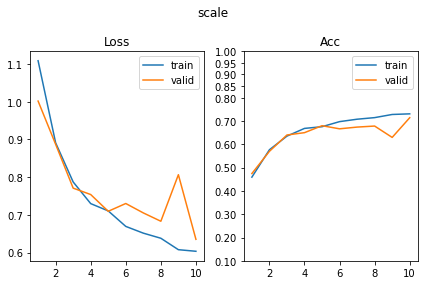

[177/630] color      SUP_[FCN8i223o32_d128]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 30.09it/s, loss=2.03, acc=0.178]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 73.36it/s, loss=2.05, acc=0.139]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 31.90it/s, loss=2.04, acc=0.166]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 64.79it/s, loss=2.05, acc=0.159]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 34.91it/s, loss=1.97, acc=0.213]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 77.66it/s, loss=2.03, acc=0.176]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 34.28it/s, loss=2.08, acc=0.181]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 66.46it/s, loss=2.04, acc=0.176]      

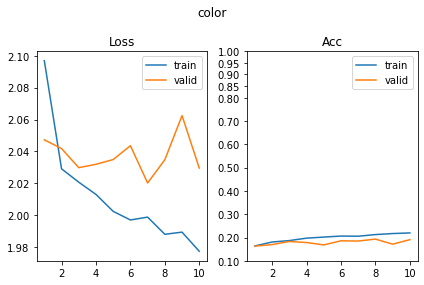

[178/630] angle      SUP_[FCN8i223o32_d128]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 28.12it/s, loss=2.4, acc=0.217]                                            
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 68.62it/s, loss=2.56, acc=0.161]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 27.75it/s, loss=2.02, acc=0.334]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 75.40it/s, loss=2.19, acc=0.268]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 30.50it/s, loss=1.8, acc=0.366]                                            
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 69.77it/s, loss=1.85, acc=0.376]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 29.26it/s, loss=1.6, acc=0.459]                                            
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 79.00it/s, loss=1.89, acc=0.361]      

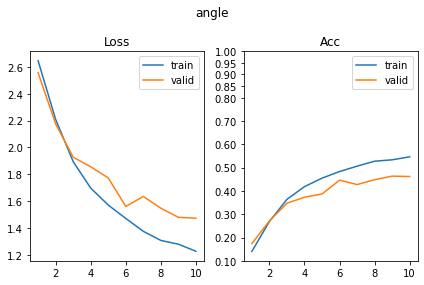

[179/630] py         SUP_[FCN8i223o32_d128]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 31.09it/s, loss=1.33, acc=0.358]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 76.45it/s, loss=1.35, acc=0.339]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 31.93it/s, loss=1.22, acc=0.448]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 44.91it/s, loss=1.26, acc=0.366]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 32.55it/s, loss=1.15, acc=0.453]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 73.06it/s, loss=1.13, acc=0.456]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 31.21it/s, loss=1.08, acc=0.502]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 72.86it/s, loss=1.2, acc=0.456]       

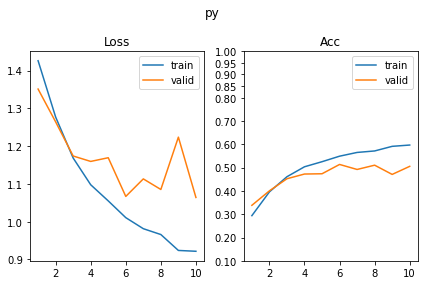

[180/630] px         SUP_[FCN8i223o32_d128]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 29.85it/s, loss=0.022, acc=0.992]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 67.86it/s, loss=0.113, acc=0.963]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 30.26it/s, loss=0.0134, acc=0.995]                                         
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 47.28it/s, loss=0.133, acc=0.966]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 33.00it/s, loss=0.0116, acc=0.997]                                         
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 77.58it/s, loss=0.125, acc=0.963]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 33.79it/s, loss=0.0265, acc=0.992]                                         
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 76.99it/s, loss=0.23, acc=0.956]      

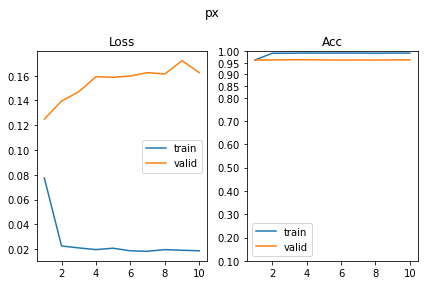

SUP_[FCN16i223o64_d8]_target_[shape]
[181/630] shape      SUP_[FCN16i223o64_d8]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 35.25it/s, loss=0.0237, acc=0.99]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 50.50it/s, loss=0.0457, acc=0.985]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 31.92it/s, loss=0.00934, acc=0.998]                                        
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 69.81it/s, loss=0.0477, acc=0.99]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 30.96it/s, loss=0.0204, acc=0.992]                                         
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 75.63it/s, loss=0.067, acc=0.973]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 30.96it/s, loss=0.00625, acc=0.997]                                        
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 63.53it/s, loss=0.0488, acc=0.98]     

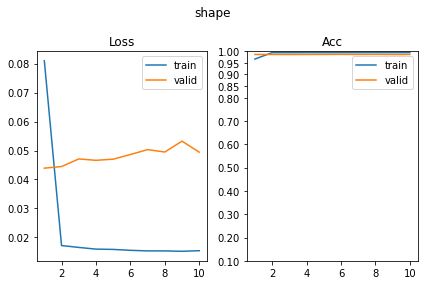

[182/630] scale      SUP_[FCN16i223o64_d8]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 28.97it/s, loss=0.987, acc=0.489]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 63.22it/s, loss=1, acc=0.493]                                                
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 30.38it/s, loss=0.966, acc=0.536]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 44.33it/s, loss=0.941, acc=0.522]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 30.09it/s, loss=0.926, acc=0.547]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 83.65it/s, loss=0.933, acc=0.534]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 35.59it/s, loss=0.985, acc=0.505]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 83.29it/s, loss=0.983, acc=0.5]       

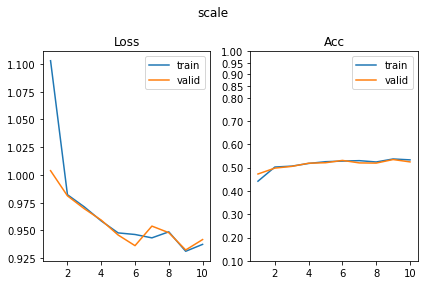

[183/630] color      SUP_[FCN16i223o64_d8]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 32.61it/s, loss=1.99, acc=0.189]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 73.61it/s, loss=2, acc=0.205]                                                
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 35.33it/s, loss=1.96, acc=0.212]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 82.30it/s, loss=1.98, acc=0.215]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 37.06it/s, loss=1.97, acc=0.205]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 82.84it/s, loss=2, acc=0.185]                                                
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 32.67it/s, loss=1.96, acc=0.213]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 70.32it/s, loss=1.91, acc=0.239]      

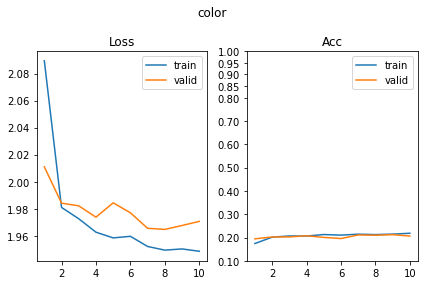

[184/630] angle      SUP_[FCN16i223o64_d8]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 36.62it/s, loss=2.75, acc=0.0879]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 82.31it/s, loss=2.73, acc=0.12]                                              
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 34.49it/s, loss=2.66, acc=0.114]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 70.67it/s, loss=2.71, acc=0.105]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 35.52it/s, loss=2.67, acc=0.117]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 77.18it/s, loss=2.65, acc=0.11]                                              
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 26.73it/s, loss=2.61, acc=0.122]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 56.41it/s, loss=2.64, acc=0.117]      

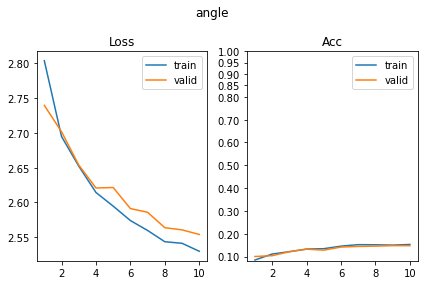

[185/630] py         SUP_[FCN16i223o64_d8]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 30.44it/s, loss=1.39, acc=0.283]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 78.77it/s, loss=1.39, acc=0.302]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 36.04it/s, loss=1.36, acc=0.332]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 54.37it/s, loss=1.34, acc=0.371]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 37.65it/s, loss=1.37, acc=0.324]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 80.69it/s, loss=1.36, acc=0.293]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 31.64it/s, loss=1.36, acc=0.309]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 74.37it/s, loss=1.36, acc=0.327]      

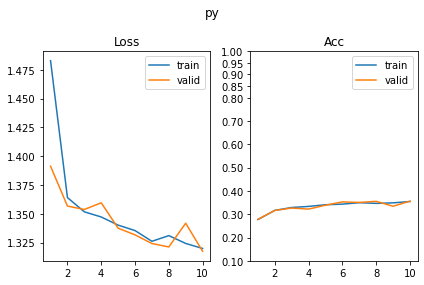

[186/630] px         SUP_[FCN16i223o64_d8]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 30.11it/s, loss=1.37, acc=0.314]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 71.47it/s, loss=1.37, acc=0.28]                                              
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 33.52it/s, loss=1.34, acc=0.318]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 69.46it/s, loss=1.35, acc=0.312]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 31.09it/s, loss=1.35, acc=0.322]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 83.15it/s, loss=1.32, acc=0.385]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 30.64it/s, loss=1.34, acc=0.368]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 84.15it/s, loss=1.35, acc=0.351]      

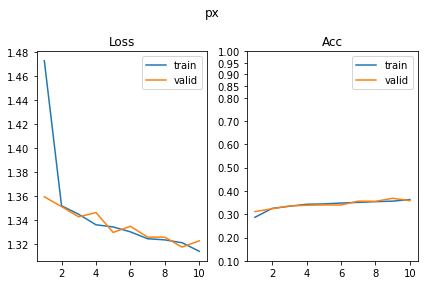

SUP_[FCN16i223o64_d8]_target_[scale]
[187/630] shape      SUP_[FCN16i223o64_d8]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 32.31it/s, loss=1.84, acc=0.251]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 53.00it/s, loss=1.82, acc=0.288]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 39.90it/s, loss=1.76, acc=0.272]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 83.75it/s, loss=1.79, acc=0.285]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 34.98it/s, loss=1.72, acc=0.309]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 84.05it/s, loss=1.74, acc=0.28]                                              
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 32.87it/s, loss=1.69, acc=0.329]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 84.04it/s, loss=1.7, acc=0.349]       

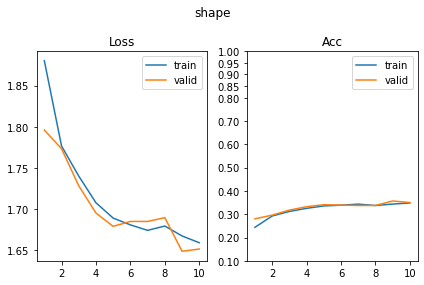

[188/630] scale      SUP_[FCN16i223o64_d8]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 32.41it/s, loss=0.0136, acc=0.995]                                         
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 76.11it/s, loss=0.153, acc=0.956]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 33.25it/s, loss=0.00781, acc=0.995]                                        
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 54.30it/s, loss=0.144, acc=0.959]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 37.81it/s, loss=0.0124, acc=0.995]                                         
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 83.08it/s, loss=0.17, acc=0.956]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 33.44it/s, loss=0.00418, acc=1]                                            
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 73.74it/s, loss=0.118, acc=0.968]     

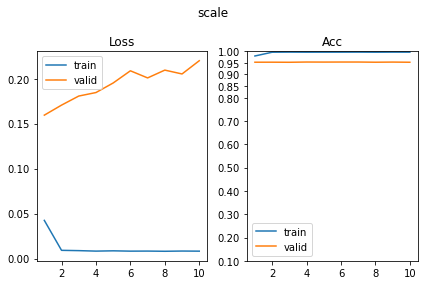

[189/630] color      SUP_[FCN16i223o64_d8]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 34.66it/s, loss=2.04, acc=0.151]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 73.86it/s, loss=2.06, acc=0.193]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 32.56it/s, loss=2.05, acc=0.153]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 70.95it/s, loss=2.04, acc=0.154]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 30.73it/s, loss=2.07, acc=0.168]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 71.52it/s, loss=2.07, acc=0.149]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 29.20it/s, loss=2.06, acc=0.15]                                            
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 73.25it/s, loss=2.05, acc=0.129]      

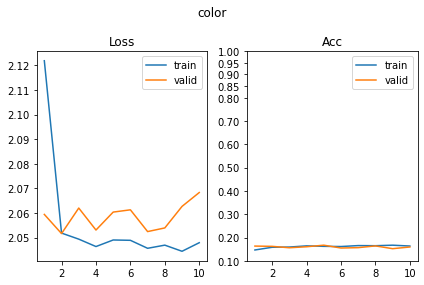

[190/630] angle      SUP_[FCN16i223o64_d8]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 30.28it/s, loss=2.77, acc=0.0863]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 52.48it/s, loss=2.77, acc=0.061]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 32.28it/s, loss=2.76, acc=0.0863]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 69.88it/s, loss=2.78, acc=0.0829]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 32.35it/s, loss=2.73, acc=0.0912]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 83.18it/s, loss=2.76, acc=0.122]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 34.65it/s, loss=2.73, acc=0.0993]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 76.00it/s, loss=2.74, acc=0.1]        

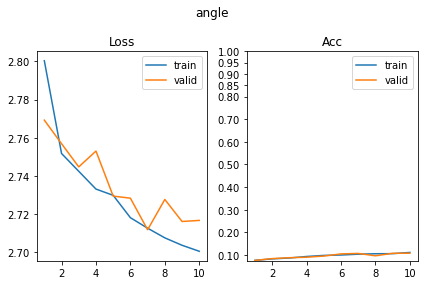

[191/630] py         SUP_[FCN16i223o64_d8]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 33.10it/s, loss=1.37, acc=0.324]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 81.53it/s, loss=1.39, acc=0.276]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 32.68it/s, loss=1.37, acc=0.306]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 49.57it/s, loss=1.37, acc=0.305]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 31.60it/s, loss=1.36, acc=0.309]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 63.34it/s, loss=1.36, acc=0.312]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 33.29it/s, loss=1.37, acc=0.306]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 83.76it/s, loss=1.35, acc=0.332]      

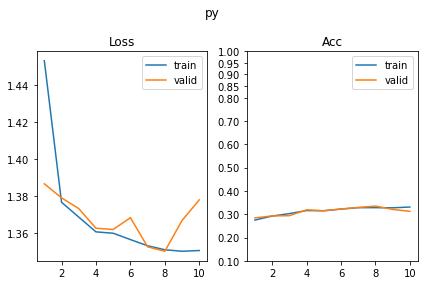

[192/630] px         SUP_[FCN16i223o64_d8]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 30.81it/s, loss=1.36, acc=0.334]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 73.56it/s, loss=1.38, acc=0.276]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 32.17it/s, loss=1.33, acc=0.355]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 81.31it/s, loss=1.35, acc=0.339]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 35.44it/s, loss=1.36, acc=0.321]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 84.18it/s, loss=1.36, acc=0.322]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 33.67it/s, loss=1.34, acc=0.339]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 76.25it/s, loss=1.32, acc=0.398]      

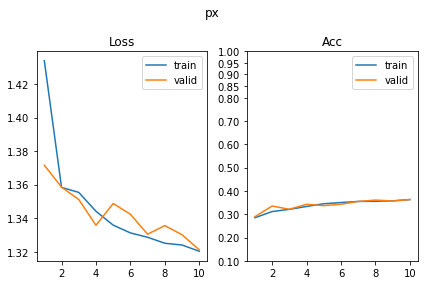

SUP_[FCN16i223o64_d8]_target_[color]
[193/630] shape      SUP_[FCN16i223o64_d8]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 34.02it/s, loss=1.95, acc=0.153]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 77.13it/s, loss=1.96, acc=0.132]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 32.95it/s, loss=1.94, acc=0.168]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 79.03it/s, loss=1.95, acc=0.154]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 28.72it/s, loss=1.96, acc=0.132]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 77.41it/s, loss=1.97, acc=0.139]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 33.11it/s, loss=1.96, acc=0.16]                                            
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 81.76it/s, loss=1.95, acc=0.156]      

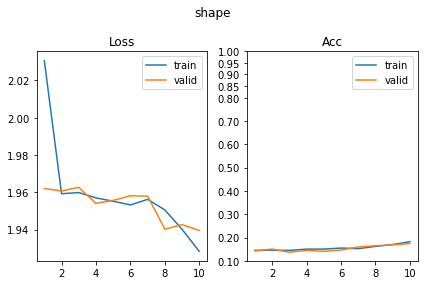

[194/630] scale      SUP_[FCN16i223o64_d8]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 22.65it/s, loss=1.11, acc=0.313]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 77.96it/s, loss=1.1, acc=0.337]                                              
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 30.91it/s, loss=1.1, acc=0.352]                                            
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 46.63it/s, loss=1.11, acc=0.339]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 31.81it/s, loss=1.1, acc=0.336]                                            
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 78.00it/s, loss=1.11, acc=0.32]                                              
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 32.97it/s, loss=1.12, acc=0.314]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 82.53it/s, loss=1.12, acc=0.346]      

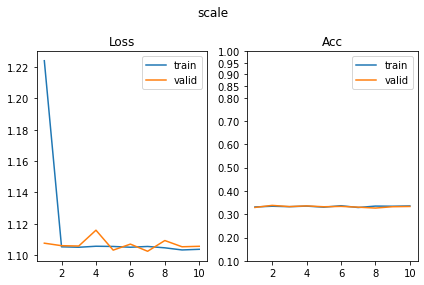

[195/630] color      SUP_[FCN16i223o64_d8]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 33.38it/s, loss=0.000733, acc=1]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 77.65it/s, loss=0.000415, acc=1]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 34.29it/s, loss=0.000399, acc=1]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 83.06it/s, loss=0.000316, acc=1]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 31.57it/s, loss=0.000262, acc=1]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 66.82it/s, loss=0.000225, acc=1]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 30.63it/s, loss=0.000174, acc=1]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 68.16it/s, loss=0.000161, acc=1]      

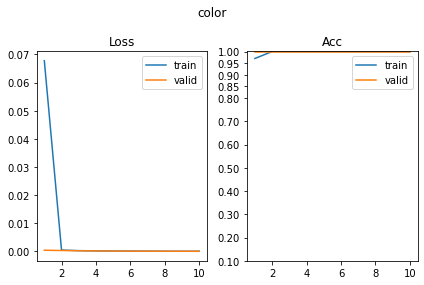

[196/630] angle      SUP_[FCN16i223o64_d8]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 32.58it/s, loss=2.78, acc=0.0782]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 81.46it/s, loss=2.79, acc=0.0634]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 35.00it/s, loss=2.8, acc=0.0554]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 84.83it/s, loss=2.8, acc=0.0707]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 36.08it/s, loss=2.79, acc=0.0684]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 84.75it/s, loss=2.79, acc=0.078]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 36.86it/s, loss=2.79, acc=0.057]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 84.28it/s, loss=2.8, acc=0.0512]      

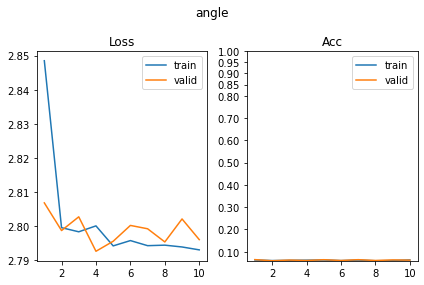

[197/630] py         SUP_[FCN16i223o64_d8]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 35.85it/s, loss=1.4, acc=0.218]                                            
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 82.21it/s, loss=1.39, acc=0.278]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 35.53it/s, loss=1.39, acc=0.27]                                            
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 51.34it/s, loss=1.39, acc=0.229]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 34.51it/s, loss=1.4, acc=0.243]                                            
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 74.29it/s, loss=1.4, acc=0.256]                                              
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 32.95it/s, loss=1.39, acc=0.249]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 72.53it/s, loss=1.4, acc=0.237]       

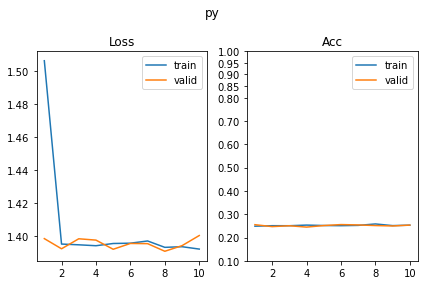

[198/630] px         SUP_[FCN16i223o64_d8]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 30.42it/s, loss=1.39, acc=0.236]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 80.59it/s, loss=1.41, acc=0.259]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 36.53it/s, loss=1.4, acc=0.248]                                            
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 84.11it/s, loss=1.4, acc=0.251]                                              
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 33.43it/s, loss=1.39, acc=0.256]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 71.37it/s, loss=1.4, acc=0.234]                                              
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 37.38it/s, loss=1.4, acc=0.257]                                            
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 83.22it/s, loss=1.4, acc=0.261]       

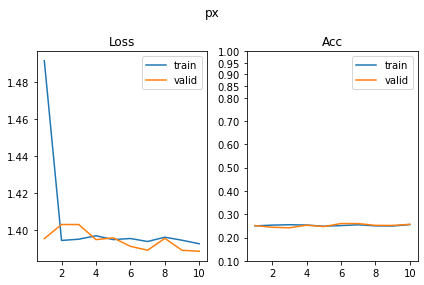

SUP_[FCN16i223o64_d8]_target_[angle]
[199/630] shape      SUP_[FCN16i223o64_d8]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 36.66it/s, loss=0.731, acc=0.689]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 84.56it/s, loss=0.833, acc=0.656]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 34.54it/s, loss=0.686, acc=0.715]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 83.77it/s, loss=0.703, acc=0.729]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 36.76it/s, loss=0.727, acc=0.692]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 83.42it/s, loss=0.658, acc=0.712]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 37.61it/s, loss=0.717, acc=0.691]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 84.11it/s, loss=0.721, acc=0.722]     

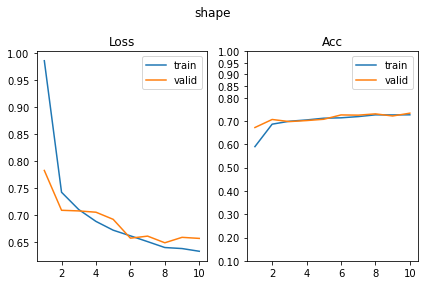

[200/630] scale      SUP_[FCN16i223o64_d8]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 31.94it/s, loss=1.08, acc=0.376]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 81.65it/s, loss=1.07, acc=0.417]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 36.88it/s, loss=1.08, acc=0.376]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 51.92it/s, loss=1.06, acc=0.429]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 33.42it/s, loss=1.08, acc=0.401]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 72.47it/s, loss=1.06, acc=0.42]                                              
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 34.35it/s, loss=1.06, acc=0.446]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 77.49it/s, loss=1.07, acc=0.405]      

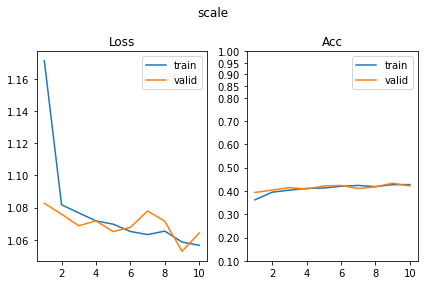

[201/630] color      SUP_[FCN16i223o64_d8]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 34.07it/s, loss=2.09, acc=0.156]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 79.61it/s, loss=2.11, acc=0.146]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 34.88it/s, loss=2.07, acc=0.145]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 80.54it/s, loss=2.07, acc=0.178]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 25.77it/s, loss=2.07, acc=0.145]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 76.53it/s, loss=2.06, acc=0.171]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 24.43it/s, loss=2.05, acc=0.178]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 78.78it/s, loss=2.07, acc=0.151]      

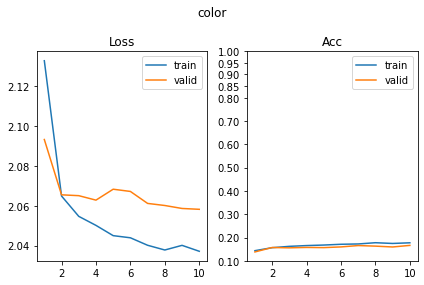

[202/630] angle      SUP_[FCN16i223o64_d8]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 32.47it/s, loss=0.431, acc=0.814]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 75.61it/s, loss=0.952, acc=0.61]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 33.99it/s, loss=0.381, acc=0.84]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 83.31it/s, loss=1.11, acc=0.573]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 35.31it/s, loss=0.36, acc=0.845]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 75.71it/s, loss=1.13, acc=0.588]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 30.48it/s, loss=0.42, acc=0.818]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 71.63it/s, loss=0.98, acc=0.649]      

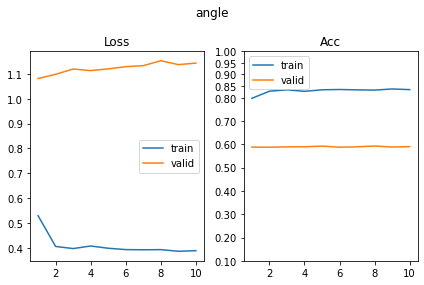

[203/630] py         SUP_[FCN16i223o64_d8]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 25.60it/s, loss=1.38, acc=0.314]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 54.81it/s, loss=1.39, acc=0.285]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 32.56it/s, loss=1.35, acc=0.326]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 52.54it/s, loss=1.34, acc=0.327]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 36.05it/s, loss=1.33, acc=0.366]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 83.72it/s, loss=1.35, acc=0.368]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 32.44it/s, loss=1.35, acc=0.324]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 70.11it/s, loss=1.33, acc=0.344]      

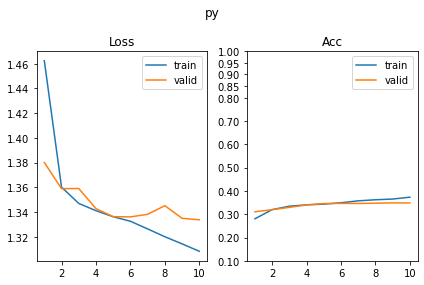

[204/630] px         SUP_[FCN16i223o64_d8]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 29.99it/s, loss=1.37, acc=0.272]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 75.83it/s, loss=1.38, acc=0.288]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 31.90it/s, loss=1.38, acc=0.305]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 75.61it/s, loss=1.36, acc=0.356]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 31.43it/s, loss=1.38, acc=0.285]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 81.57it/s, loss=1.38, acc=0.29]                                              
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 33.23it/s, loss=1.34, acc=0.34]                                            
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 67.06it/s, loss=1.37, acc=0.307]      

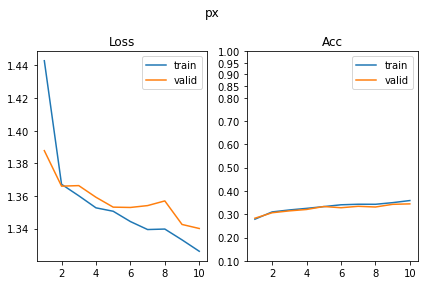

SUP_[FCN16i223o64_d8]_target_[py]
[205/630] shape      SUP_[FCN16i223o64_d8]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 34.73it/s, loss=1.69, acc=0.34]                                            
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 77.04it/s, loss=1.75, acc=0.276]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 30.37it/s, loss=1.63, acc=0.365]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 49.05it/s, loss=1.75, acc=0.293]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 31.68it/s, loss=1.65, acc=0.342]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 72.43it/s, loss=1.67, acc=0.329]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 34.02it/s, loss=1.63, acc=0.368]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 83.08it/s, loss=1.66, acc=0.363]      

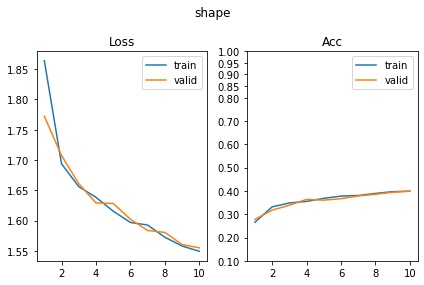

[206/630] scale      SUP_[FCN16i223o64_d8]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 32.20it/s, loss=1.07, acc=0.397]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 77.13it/s, loss=1.08, acc=0.383]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 35.56it/s, loss=1.07, acc=0.417]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 48.27it/s, loss=1.1, acc=0.378]                                              
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 34.05it/s, loss=1.03, acc=0.461]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 78.31it/s, loss=1.05, acc=0.449]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 30.23it/s, loss=1.02, acc=0.484]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 74.40it/s, loss=1.05, acc=0.42]       

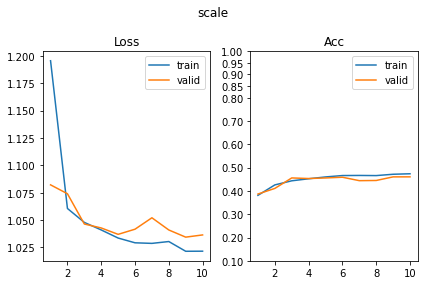

[207/630] color      SUP_[FCN16i223o64_d8]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 32.48it/s, loss=2.05, acc=0.176]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 65.64it/s, loss=2.05, acc=0.156]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 30.63it/s, loss=2.03, acc=0.189]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 80.88it/s, loss=2.04, acc=0.188]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 32.29it/s, loss=2.03, acc=0.181]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 73.82it/s, loss=2.06, acc=0.163]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 35.27it/s, loss=2.02, acc=0.2]                                             
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 83.75it/s, loss=1.99, acc=0.185]      

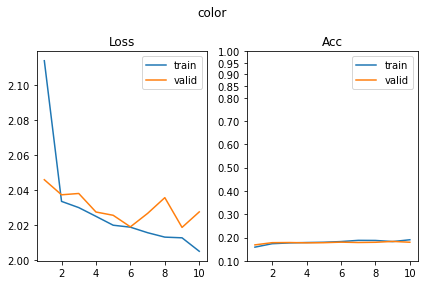

[208/630] angle      SUP_[FCN16i223o64_d8]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 30.71it/s, loss=2.75, acc=0.103]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 76.03it/s, loss=2.76, acc=0.0951]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 35.52it/s, loss=2.72, acc=0.132]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 74.36it/s, loss=2.73, acc=0.0976]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 35.16it/s, loss=2.7, acc=0.107]                                            
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 72.33it/s, loss=2.71, acc=0.102]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 32.94it/s, loss=2.7, acc=0.119]                                            
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 80.02it/s, loss=2.7, acc=0.124]       

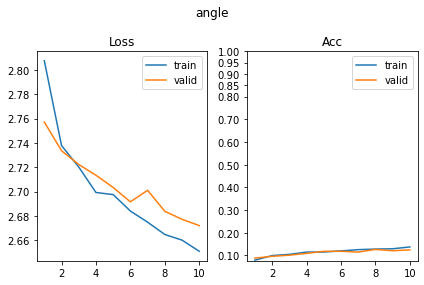

[209/630] py         SUP_[FCN16i223o64_d8]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 28.76it/s, loss=0.00825, acc=0.997]                                        
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 70.23it/s, loss=0.0795, acc=0.973]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 35.42it/s, loss=0.012, acc=0.992]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 50.61it/s, loss=0.0645, acc=0.98]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 33.92it/s, loss=0.00437, acc=0.998]                                        
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 72.21it/s, loss=0.0352, acc=0.988]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 34.38it/s, loss=0.0088, acc=0.997]                                         
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 79.11it/s, loss=0.0802, acc=0.978]    

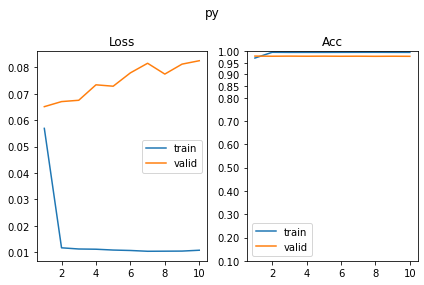

[210/630] px         SUP_[FCN16i223o64_d8]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 29.39it/s, loss=1.37, acc=0.298]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 73.02it/s, loss=1.37, acc=0.298]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 31.68it/s, loss=1.37, acc=0.303]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 74.78it/s, loss=1.39, acc=0.271]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 32.92it/s, loss=1.36, acc=0.295]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 77.71it/s, loss=1.38, acc=0.28]                                              
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 35.77it/s, loss=1.35, acc=0.362]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 62.32it/s, loss=1.36, acc=0.324]      

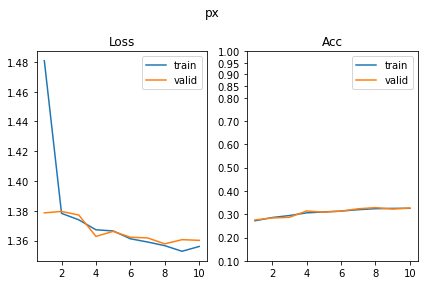

SUP_[FCN16i223o64_d8]_target_[px]
[211/630] shape      SUP_[FCN16i223o64_d8]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 29.24it/s, loss=1.69, acc=0.318]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 76.12it/s, loss=1.72, acc=0.337]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 18.25it/s, loss=1.56, acc=0.371]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 53.00it/s, loss=1.63, acc=0.344]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 32.26it/s, loss=1.49, acc=0.412]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 76.28it/s, loss=1.56, acc=0.393]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 33.86it/s, loss=1.5, acc=0.412]                                            
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 76.24it/s, loss=1.46, acc=0.422]      

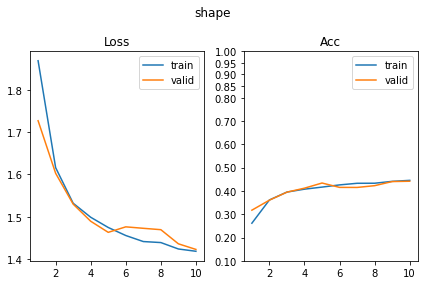

[212/630] scale      SUP_[FCN16i223o64_d8]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 34.51it/s, loss=1.05, acc=0.453]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 80.40it/s, loss=1.06, acc=0.429]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 34.20it/s, loss=1.01, acc=0.511]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 48.16it/s, loss=1.04, acc=0.449]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 32.36it/s, loss=0.975, acc=0.51]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 71.99it/s, loss=1.03, acc=0.471]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 32.42it/s, loss=0.995, acc=0.508]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 74.18it/s, loss=0.973, acc=0.52]      

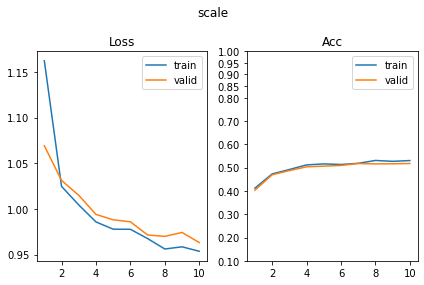

[213/630] color      SUP_[FCN16i223o64_d8]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 31.95it/s, loss=2.05, acc=0.142]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 75.91it/s, loss=2.05, acc=0.163]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 32.22it/s, loss=1.99, acc=0.194]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 84.51it/s, loss=2, acc=0.193]                                                
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 34.65it/s, loss=2, acc=0.2]                                                
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 79.21it/s, loss=2.01, acc=0.212]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 34.88it/s, loss=2, acc=0.192]                                              
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 84.14it/s, loss=2.02, acc=0.171]      

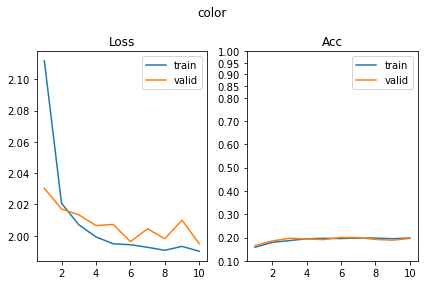

[214/630] angle      SUP_[FCN16i223o64_d8]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 29.72it/s, loss=2.76, acc=0.0912]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 74.97it/s, loss=2.79, acc=0.0805]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 29.88it/s, loss=2.72, acc=0.119]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 71.35it/s, loss=2.71, acc=0.0951]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 27.51it/s, loss=2.71, acc=0.112]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 70.18it/s, loss=2.7, acc=0.12]                                               
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 30.45it/s, loss=2.68, acc=0.119]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 81.01it/s, loss=2.67, acc=0.12]       

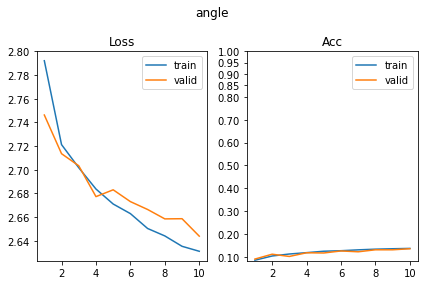

[215/630] py         SUP_[FCN16i223o64_d8]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 36.06it/s, loss=1.38, acc=0.279]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 63.20it/s, loss=1.38, acc=0.288]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 39.51it/s, loss=1.38, acc=0.316]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 52.94it/s, loss=1.38, acc=0.302]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 33.79it/s, loss=1.37, acc=0.293]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 73.77it/s, loss=1.38, acc=0.285]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 27.81it/s, loss=1.37, acc=0.303]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 69.89it/s, loss=1.39, acc=0.271]      

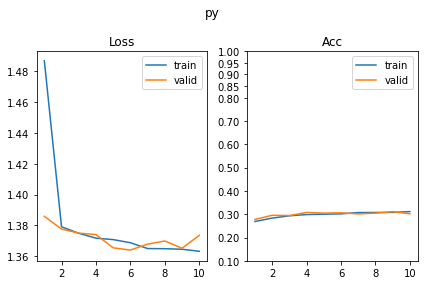

[216/630] px         SUP_[FCN16i223o64_d8]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 30.80it/s, loss=0.0128, acc=0.993]                                         
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 75.57it/s, loss=0.0161, acc=0.995]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 27.12it/s, loss=0.00821, acc=0.998]                                        
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 68.35it/s, loss=0.0617, acc=0.983]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 31.39it/s, loss=0.0138, acc=0.993]                                         
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 81.57it/s, loss=0.0308, acc=0.99]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 36.00it/s, loss=0.0123, acc=0.995]                                         
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 81.74it/s, loss=0.0779, acc=0.983]    

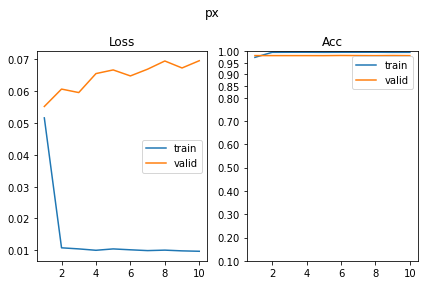

SUP_[FCN16i223o64_d16]_target_[shape]
[217/630] shape      SUP_[FCN16i223o64_d16]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 37.12it/s, loss=0.0208, acc=0.992]                                         
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 71.08it/s, loss=0.0493, acc=0.98]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 32.64it/s, loss=0.00853, acc=0.997]                                        
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 75.39it/s, loss=0.0543, acc=0.976]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 35.69it/s, loss=0.0188, acc=0.99]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 78.43it/s, loss=0.0313, acc=0.99]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 30.47it/s, loss=0.0108, acc=0.997]                                         
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 61.01it/s, loss=0.0259, acc=0.988]    

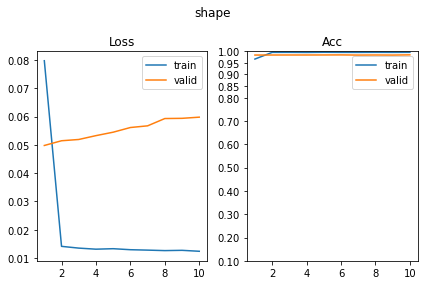

[218/630] scale      SUP_[FCN16i223o64_d16]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 31.02it/s, loss=1, acc=0.482]                                              
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 73.51it/s, loss=0.989, acc=0.495]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 31.95it/s, loss=0.941, acc=0.521]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 53.90it/s, loss=0.949, acc=0.507]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 36.16it/s, loss=0.915, acc=0.547]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 58.32it/s, loss=0.958, acc=0.544]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 32.15it/s, loss=0.915, acc=0.554]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 75.49it/s, loss=0.943, acc=0.556]     

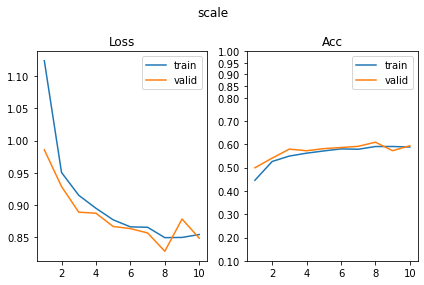

[219/630] color      SUP_[FCN16i223o64_d16]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 35.99it/s, loss=2.03, acc=0.174]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 83.81it/s, loss=2.06, acc=0.154]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 28.27it/s, loss=2.05, acc=0.173]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 70.92it/s, loss=2.03, acc=0.151]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 29.66it/s, loss=1.99, acc=0.202]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 63.08it/s, loss=2.02, acc=0.185]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 30.73it/s, loss=2.05, acc=0.182]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 71.39it/s, loss=1.98, acc=0.205]      

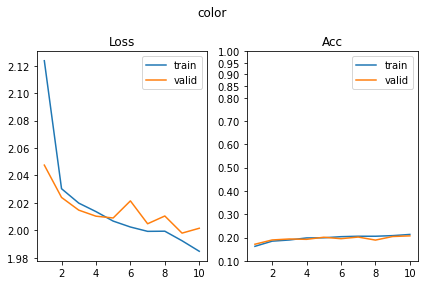

[220/630] angle      SUP_[FCN16i223o64_d16]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 38.96it/s, loss=2.66, acc=0.119]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 53.33it/s, loss=2.65, acc=0.132]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 40.13it/s, loss=2.49, acc=0.174]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 81.62it/s, loss=2.55, acc=0.161]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 34.32it/s, loss=2.43, acc=0.15]                                            
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 70.73it/s, loss=2.41, acc=0.195]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 31.77it/s, loss=2.38, acc=0.195]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 82.24it/s, loss=2.37, acc=0.22]       

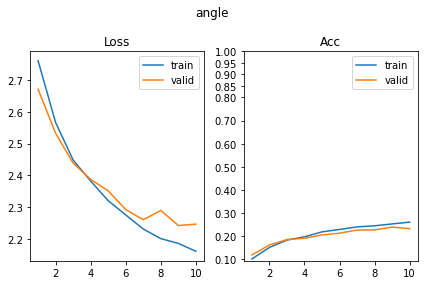

[221/630] py         SUP_[FCN16i223o64_d16]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 25.51it/s, loss=1.34, acc=0.362]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 68.15it/s, loss=1.35, acc=0.332]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 31.61it/s, loss=1.33, acc=0.34]                                            
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 47.11it/s, loss=1.34, acc=0.334]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 28.22it/s, loss=1.32, acc=0.342]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 63.79it/s, loss=1.3, acc=0.393]                                              
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 31.20it/s, loss=1.27, acc=0.394]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 76.99it/s, loss=1.3, acc=0.38]        

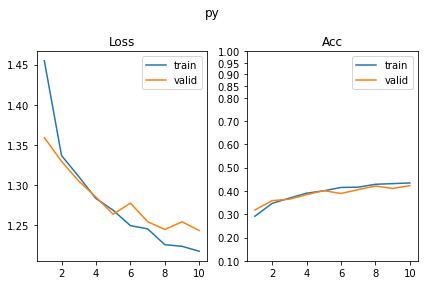

[222/630] px         SUP_[FCN16i223o64_d16]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 29.68it/s, loss=1.33, acc=0.344]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 67.53it/s, loss=1.36, acc=0.295]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 30.31it/s, loss=1.29, acc=0.371]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 50.01it/s, loss=1.26, acc=0.4]                                               
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 29.46it/s, loss=1.29, acc=0.414]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 62.35it/s, loss=1.29, acc=0.41]                                              
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 29.52it/s, loss=1.24, acc=0.435]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 68.18it/s, loss=1.28, acc=0.38]       

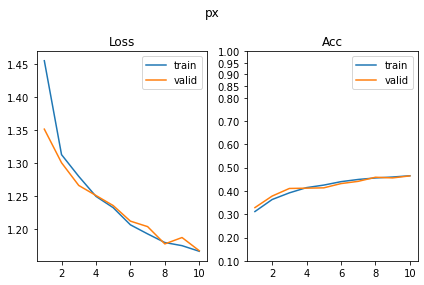

SUP_[FCN16i223o64_d16]_target_[scale]
[223/630] shape      SUP_[FCN16i223o64_d16]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 32.63it/s, loss=1.42, acc=0.45]                                            
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 54.17it/s, loss=1.49, acc=0.434]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 33.66it/s, loss=1.33, acc=0.489]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 72.64it/s, loss=1.29, acc=0.495]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 30.53it/s, loss=1.22, acc=0.547]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 72.21it/s, loss=1.24, acc=0.539]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 33.01it/s, loss=1.24, acc=0.541]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 69.03it/s, loss=1.17, acc=0.571]      

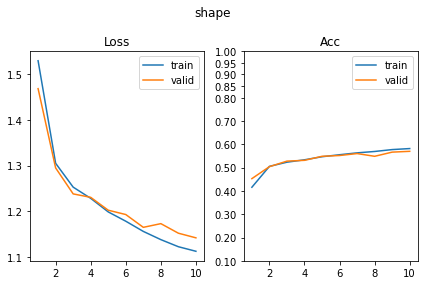

[224/630] scale      SUP_[FCN16i223o64_d16]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 30.10it/s, loss=0.00688, acc=0.997]                                        
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 73.77it/s, loss=0.103, acc=0.961]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 34.23it/s, loss=0.0154, acc=0.993]                                         
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 51.14it/s, loss=0.116, acc=0.976]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 32.84it/s, loss=0.0134, acc=0.993]                                         
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 79.62it/s, loss=0.226, acc=0.959]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 36.70it/s, loss=0.0108, acc=0.995]                                         
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 81.11it/s, loss=0.121, acc=0.976]     

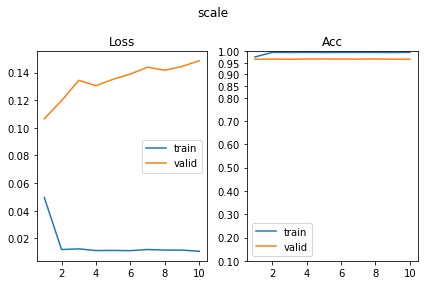

[225/630] color      SUP_[FCN16i223o64_d16]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 34.81it/s, loss=2.01, acc=0.194]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 83.93it/s, loss=2, acc=0.205]                                                
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 37.47it/s, loss=1.99, acc=0.182]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 83.88it/s, loss=1.99, acc=0.21]                                              
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 31.72it/s, loss=2.01, acc=0.186]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 77.35it/s, loss=1.99, acc=0.18]                                              
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 29.72it/s, loss=1.92, acc=0.223]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 55.59it/s, loss=1.96, acc=0.202]      

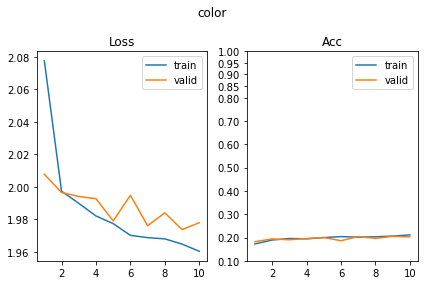

[226/630] angle      SUP_[FCN16i223o64_d16]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 33.55it/s, loss=2.77, acc=0.0798]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 58.15it/s, loss=2.74, acc=0.0732]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 31.98it/s, loss=2.71, acc=0.125]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 70.51it/s, loss=2.69, acc=0.141]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 31.53it/s, loss=2.64, acc=0.132]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 67.37it/s, loss=2.67, acc=0.115]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 29.58it/s, loss=2.65, acc=0.143]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 56.06it/s, loss=2.64, acc=0.144]      

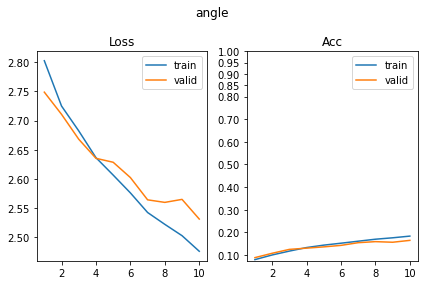

[227/630] py         SUP_[FCN16i223o64_d16]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 31.63it/s, loss=1.36, acc=0.334]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 72.02it/s, loss=1.33, acc=0.332]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 29.74it/s, loss=1.31, acc=0.391]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 48.97it/s, loss=1.34, acc=0.351]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 33.43it/s, loss=1.3, acc=0.373]                                            
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 77.76it/s, loss=1.32, acc=0.393]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 29.85it/s, loss=1.31, acc=0.357]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 75.76it/s, loss=1.31, acc=0.405]      

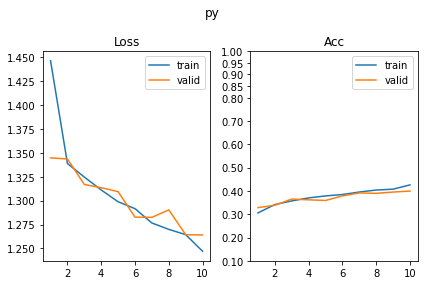

[228/630] px         SUP_[FCN16i223o64_d16]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 30.58it/s, loss=1.31, acc=0.376]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 77.34it/s, loss=1.35, acc=0.312]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 30.53it/s, loss=1.2, acc=0.433]                                            
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 79.24it/s, loss=1.22, acc=0.441]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 36.26it/s, loss=1.19, acc=0.459]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 81.34it/s, loss=1.21, acc=0.42]                                              
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 28.86it/s, loss=1.17, acc=0.464]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 84.20it/s, loss=1.14, acc=0.456]      

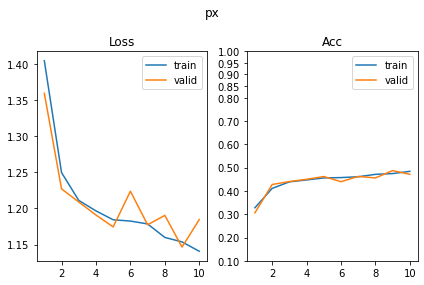

SUP_[FCN16i223o64_d16]_target_[color]
[229/630] shape      SUP_[FCN16i223o64_d16]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 30.98it/s, loss=1.88, acc=0.202]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 48.74it/s, loss=1.97, acc=0.185]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 31.06it/s, loss=1.78, acc=0.254]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 70.26it/s, loss=1.81, acc=0.246]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 28.28it/s, loss=1.74, acc=0.301]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 78.60it/s, loss=1.68, acc=0.312]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 27.75it/s, loss=1.61, acc=0.363]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 73.25it/s, loss=1.63, acc=0.332]      

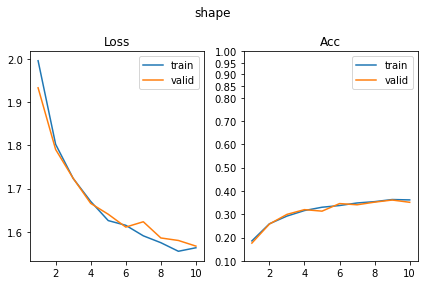

[230/630] scale      SUP_[FCN16i223o64_d16]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 31.99it/s, loss=1.1, acc=0.358]                                            
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 73.58it/s, loss=1.1, acc=0.356]                                              
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 27.62it/s, loss=1.1, acc=0.365]                                            
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 44.22it/s, loss=1.09, acc=0.354]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 27.92it/s, loss=1.1, acc=0.357]                                            
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 72.34it/s, loss=1.09, acc=0.385]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 30.49it/s, loss=1.1, acc=0.347]                                            
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 69.55it/s, loss=1.1, acc=0.366]       

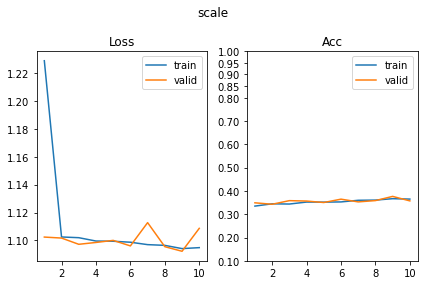

[231/630] color      SUP_[FCN16i223o64_d16]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 30.13it/s, loss=0.000675, acc=1]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 63.23it/s, loss=0.00109, acc=1]                                              
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 24.79it/s, loss=0.000351, acc=1]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 51.15it/s, loss=0.000732, acc=1]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 24.84it/s, loss=0.00026, acc=1]                                            
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 57.72it/s, loss=0.00027, acc=1]                                              
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 31.10it/s, loss=0.000169, acc=1]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 83.50it/s, loss=0.000156, acc=1]      

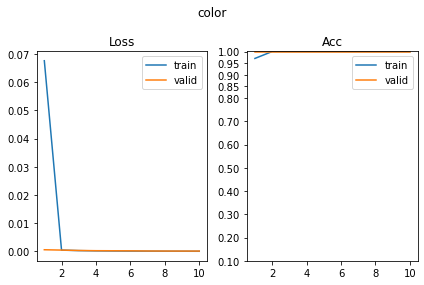

[232/630] angle      SUP_[FCN16i223o64_d16]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 27.42it/s, loss=2.83, acc=0.0472]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 35.14it/s, loss=2.8, acc=0.0512]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 25.25it/s, loss=2.8, acc=0.0814]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 61.52it/s, loss=2.79, acc=0.0756]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 23.75it/s, loss=2.8, acc=0.0651]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 51.75it/s, loss=2.79, acc=0.0585]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 26.23it/s, loss=2.78, acc=0.0668]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 56.96it/s, loss=2.79, acc=0.0488]     

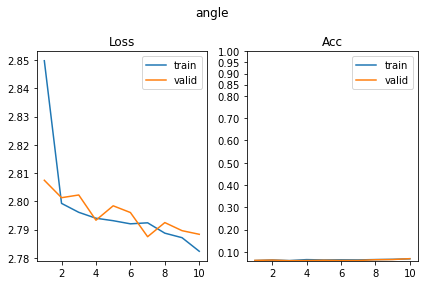

[233/630] py         SUP_[FCN16i223o64_d16]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 17.76it/s, loss=1.4, acc=0.27]                                             
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 68.22it/s, loss=1.41, acc=0.224]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 23.10it/s, loss=1.39, acc=0.261]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 40.87it/s, loss=1.39, acc=0.268]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 20.10it/s, loss=1.4, acc=0.256]                                            
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 50.77it/s, loss=1.4, acc=0.271]                                              
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 21.87it/s, loss=1.38, acc=0.305]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 45.86it/s, loss=1.39, acc=0.307]      

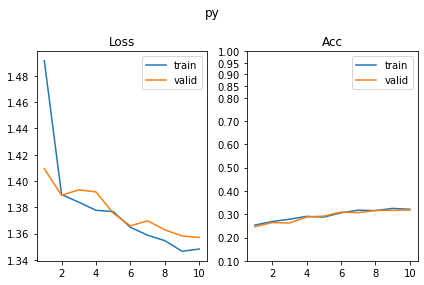

[234/630] px         SUP_[FCN16i223o64_d16]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 27.20it/s, loss=1.39, acc=0.285]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 59.11it/s, loss=1.4, acc=0.29]                                               
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 32.84it/s, loss=1.38, acc=0.285]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 75.01it/s, loss=1.4, acc=0.237]                                              
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 25.82it/s, loss=1.39, acc=0.287]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 71.56it/s, loss=1.38, acc=0.263]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 26.03it/s, loss=1.37, acc=0.316]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 73.67it/s, loss=1.39, acc=0.268]      

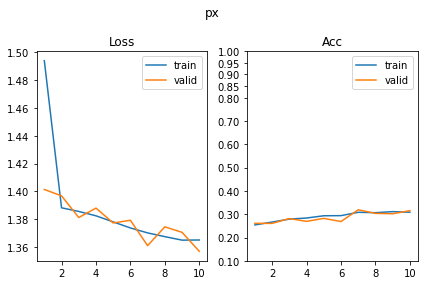

SUP_[FCN16i223o64_d16]_target_[angle]
[235/630] shape      SUP_[FCN16i223o64_d16]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 23.39it/s, loss=0.635, acc=0.764]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 46.87it/s, loss=0.577, acc=0.756]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 34.58it/s, loss=0.52, acc=0.801]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 79.30it/s, loss=0.591, acc=0.78]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 30.27it/s, loss=0.496, acc=0.808]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 65.96it/s, loss=0.579, acc=0.763]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 30.24it/s, loss=0.459, acc=0.816]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 68.87it/s, loss=0.485, acc=0.82]      

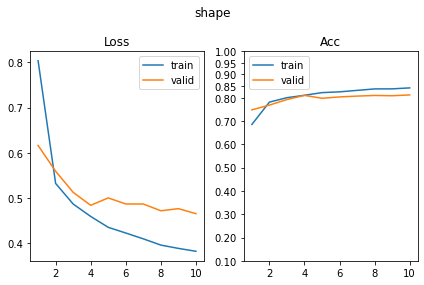

[236/630] scale      SUP_[FCN16i223o64_d16]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 28.02it/s, loss=1.08, acc=0.393]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 54.22it/s, loss=1.11, acc=0.368]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 26.31it/s, loss=1.05, acc=0.43]                                            
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 51.79it/s, loss=1.06, acc=0.451]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 26.31it/s, loss=1.05, acc=0.461]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 67.39it/s, loss=1.08, acc=0.441]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 28.63it/s, loss=1.03, acc=0.472]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 73.42it/s, loss=1.03, acc=0.461]      

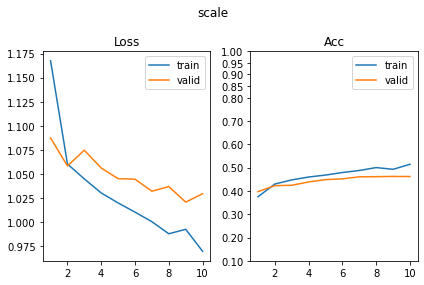

[237/630] color      SUP_[FCN16i223o64_d16]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 19.50it/s, loss=2.05, acc=0.147]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 72.03it/s, loss=2.04, acc=0.168]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 21.66it/s, loss=2, acc=0.195]                                              
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 42.54it/s, loss=2.03, acc=0.21]                                              
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 19.88it/s, loss=1.99, acc=0.205]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 66.71it/s, loss=2.06, acc=0.163]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 21.90it/s, loss=2.03, acc=0.176]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 48.41it/s, loss=2.03, acc=0.183]      

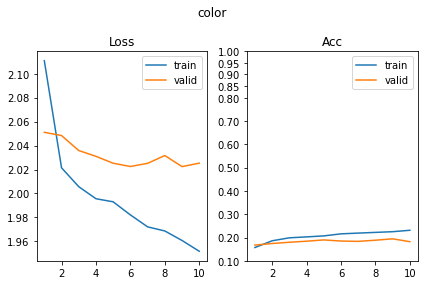

[238/630] angle      SUP_[FCN16i223o64_d16]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 24.14it/s, loss=0.432, acc=0.827]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 76.25it/s, loss=1.08, acc=0.6]                                               
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 27.72it/s, loss=0.404, acc=0.834]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 71.75it/s, loss=1.12, acc=0.593]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 21.54it/s, loss=0.396, acc=0.829]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 63.55it/s, loss=1.11, acc=0.605]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 23.29it/s, loss=0.448, acc=0.8]                                            
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 77.55it/s, loss=1.03, acc=0.639]      

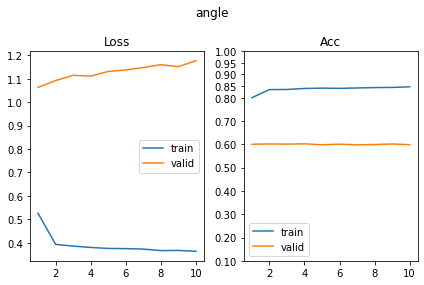

[239/630] py         SUP_[FCN16i223o64_d16]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 30.02it/s, loss=1.37, acc=0.292]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 78.77it/s, loss=1.33, acc=0.341]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 31.57it/s, loss=1.3, acc=0.383]                                            
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 52.54it/s, loss=1.33, acc=0.385]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 20.95it/s, loss=1.28, acc=0.378]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 32.44it/s, loss=1.31, acc=0.383]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 17.96it/s, loss=1.27, acc=0.407]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 65.27it/s, loss=1.27, acc=0.429]      

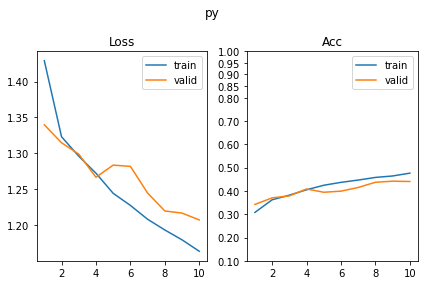

[240/630] px         SUP_[FCN16i223o64_d16]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 27.09it/s, loss=1.35, acc=0.319]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 85.24it/s, loss=1.33, acc=0.371]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 49.10it/s, loss=1.31, acc=0.371]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 115.15it/s, loss=1.28, acc=0.412]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 51.17it/s, loss=1.26, acc=0.399]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 124.78it/s, loss=1.28, acc=0.378]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 49.21it/s, loss=1.26, acc=0.399]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 122.65it/s, loss=1.23, acc=0.454]     

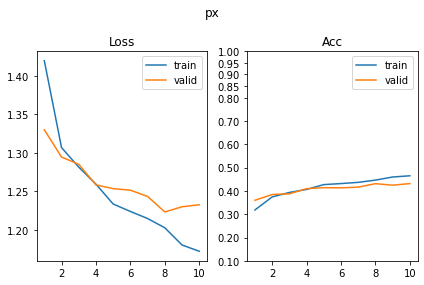

SUP_[FCN16i223o64_d16]_target_[py]
[241/630] shape      SUP_[FCN16i223o64_d16]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 57.04it/s, loss=1.62, acc=0.368]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 75.09it/s, loss=1.69, acc=0.356]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 56.48it/s, loss=1.35, acc=0.487]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 126.07it/s, loss=1.48, acc=0.422]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 51.76it/s, loss=1.28, acc=0.507]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 125.60it/s, loss=1.25, acc=0.537]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 52.18it/s, loss=1.26, acc=0.508]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 124.01it/s, loss=1.26, acc=0.507]     

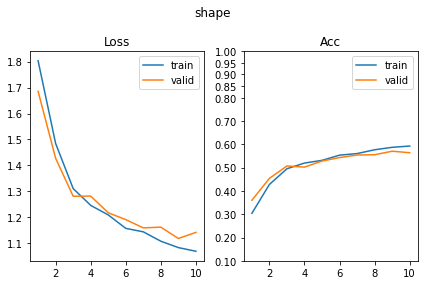

[242/630] scale      SUP_[FCN16i223o64_d16]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 52.46it/s, loss=1.04, acc=0.472]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 125.04it/s, loss=1.09, acc=0.456]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 52.59it/s, loss=1.05, acc=0.443]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 124.90it/s, loss=1.05, acc=0.451]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 51.23it/s, loss=0.975, acc=0.511]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 125.50it/s, loss=1.02, acc=0.498]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 51.99it/s, loss=0.984, acc=0.492]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 124.86it/s, loss=0.971, acc=0.498]    

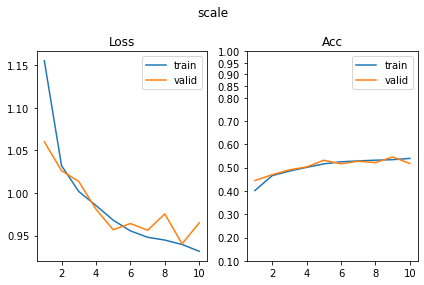

[243/630] color      SUP_[FCN16i223o64_d16]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 55.67it/s, loss=1.87, acc=0.248]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 74.43it/s, loss=1.94, acc=0.222]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 55.11it/s, loss=1.75, acc=0.311]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 122.82it/s, loss=1.76, acc=0.229]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 47.66it/s, loss=1.77, acc=0.275]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 122.57it/s, loss=1.79, acc=0.285]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 51.86it/s, loss=1.72, acc=0.269]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 97.95it/s, loss=1.75, acc=0.266]      

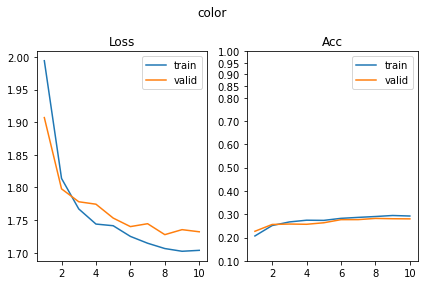

[244/630] angle      SUP_[FCN16i223o64_d16]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 52.19it/s, loss=2.74, acc=0.0765]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 126.28it/s, loss=2.73, acc=0.0878]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 55.52it/s, loss=2.68, acc=0.104]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 76.20it/s, loss=2.69, acc=0.149]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 55.40it/s, loss=2.62, acc=0.147]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 124.24it/s, loss=2.6, acc=0.151]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 51.00it/s, loss=2.56, acc=0.137]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 121.99it/s, loss=2.57, acc=0.171]     

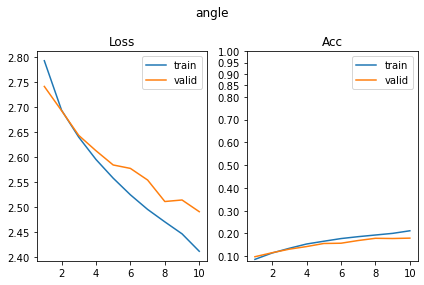

[245/630] py         SUP_[FCN16i223o64_d16]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 52.00it/s, loss=0.0134, acc=0.995]                                         
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 126.63it/s, loss=0.072, acc=0.976]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 52.78it/s, loss=0.0272, acc=0.992]                                         
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 125.04it/s, loss=0.101, acc=0.978]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 52.15it/s, loss=0.0276, acc=0.989]                                         
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 126.86it/s, loss=0.0986, acc=0.963]                                          
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 52.39it/s, loss=0.025, acc=0.992]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 127.77it/s, loss=0.145, acc=0.951]    

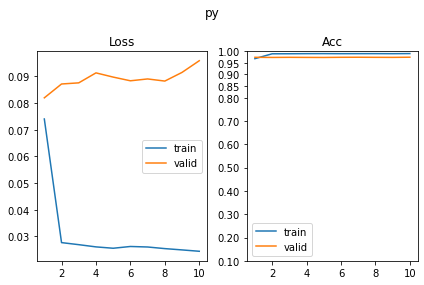

[246/630] px         SUP_[FCN16i223o64_d16]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 52.96it/s, loss=1.37, acc=0.306]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 126.96it/s, loss=1.4, acc=0.254]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 56.35it/s, loss=1.39, acc=0.264]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 76.12it/s, loss=1.38, acc=0.268]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 55.88it/s, loss=1.37, acc=0.274]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 123.52it/s, loss=1.38, acc=0.29]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 52.36it/s, loss=1.38, acc=0.283]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 124.67it/s, loss=1.39, acc=0.298]     

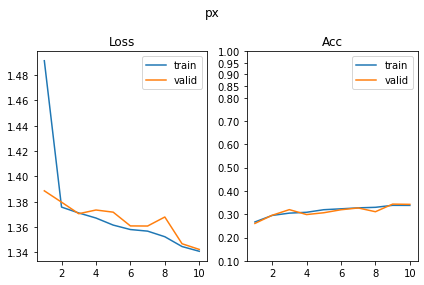

SUP_[FCN16i223o64_d16]_target_[px]
[247/630] shape      SUP_[FCN16i223o64_d16]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 50.25it/s, loss=1.54, acc=0.362]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 116.44it/s, loss=1.53, acc=0.432]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 45.60it/s, loss=1.41, acc=0.43]                                            
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 112.00it/s, loss=1.39, acc=0.42]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 50.62it/s, loss=1.34, acc=0.454]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 118.83it/s, loss=1.38, acc=0.451]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 46.66it/s, loss=1.21, acc=0.521]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 120.00it/s, loss=1.2, acc=0.527]      

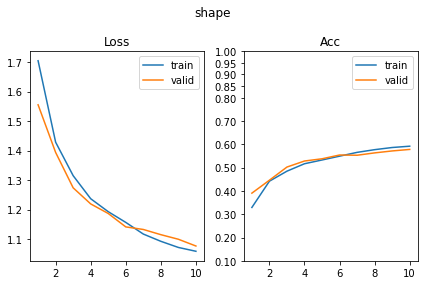

[248/630] scale      SUP_[FCN16i223o64_d16]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 53.23it/s, loss=1.01, acc=0.505]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 127.09it/s, loss=1.05, acc=0.456]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 49.07it/s, loss=0.951, acc=0.526]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 76.43it/s, loss=0.999, acc=0.5]                                              
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 43.36it/s, loss=0.934, acc=0.542]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 126.99it/s, loss=0.98, acc=0.495]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 46.50it/s, loss=0.908, acc=0.557]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 119.07it/s, loss=0.946, acc=0.539]    

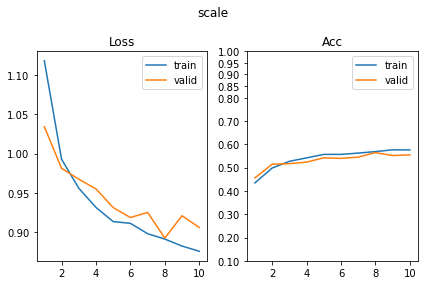

[249/630] color      SUP_[FCN16i223o64_d16]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 53.08it/s, loss=1.7, acc=0.293]                                            
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 122.36it/s, loss=1.77, acc=0.263]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 44.19it/s, loss=1.67, acc=0.322]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 124.82it/s, loss=1.65, acc=0.298]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 51.61it/s, loss=1.64, acc=0.298]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 123.46it/s, loss=1.73, acc=0.344]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 52.39it/s, loss=1.59, acc=0.368]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 120.49it/s, loss=1.64, acc=0.351]     

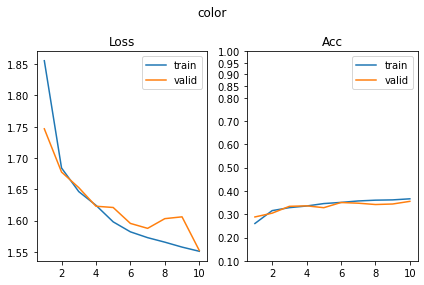

[250/630] angle      SUP_[FCN16i223o64_d16]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 52.64it/s, loss=2.71, acc=0.107]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 125.98it/s, loss=2.69, acc=0.11]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 55.93it/s, loss=2.67, acc=0.143]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 77.10it/s, loss=2.72, acc=0.0951]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 55.45it/s, loss=2.64, acc=0.142]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 121.26it/s, loss=2.59, acc=0.151]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 51.10it/s, loss=2.59, acc=0.147]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 122.40it/s, loss=2.58, acc=0.129]     

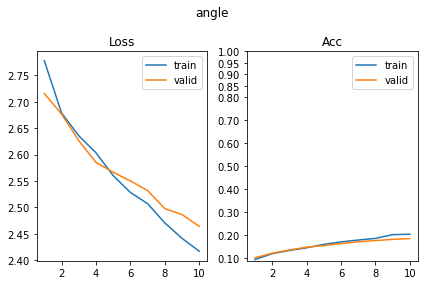

[251/630] py         SUP_[FCN16i223o64_d16]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 52.74it/s, loss=1.38, acc=0.295]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 124.89it/s, loss=1.39, acc=0.261]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 45.12it/s, loss=1.36, acc=0.287]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 126.48it/s, loss=1.36, acc=0.339]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 46.26it/s, loss=1.36, acc=0.314]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 89.56it/s, loss=1.35, acc=0.334]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 46.66it/s, loss=1.36, acc=0.336]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 96.04it/s, loss=1.38, acc=0.28]       

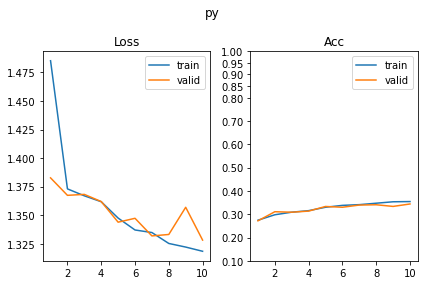

[252/630] px         SUP_[FCN16i223o64_d16]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 51.84it/s, loss=0.0404, acc=0.985]                                         
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 125.01it/s, loss=0.0708, acc=0.978]                                          
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 50.83it/s, loss=0.0345, acc=0.985]                                         
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 74.45it/s, loss=0.0494, acc=0.993]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 53.35it/s, loss=0.0232, acc=0.99]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 119.09it/s, loss=0.0731, acc=0.971]                                          
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 46.77it/s, loss=0.0193, acc=0.992]                                         
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 118.88it/s, loss=0.0575, acc=0.983]   

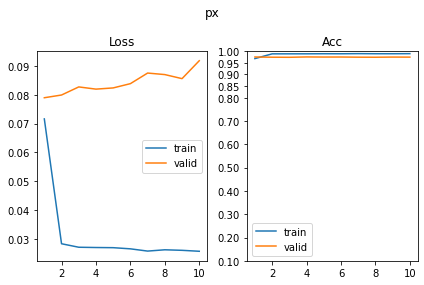

SUP_[FCN16i223o64_d32]_target_[shape]
[253/630] shape      SUP_[FCN16i223o64_d32]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 49.86it/s, loss=0.0296, acc=0.985]                                         
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 120.21it/s, loss=0.0404, acc=0.988]                                          
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 51.00it/s, loss=0.0128, acc=0.997]                                         
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 117.80it/s, loss=0.0387, acc=0.985]                                          
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 47.40it/s, loss=0.002, acc=1]                                              
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 119.34it/s, loss=0.0782, acc=0.98]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 51.21it/s, loss=0.0147, acc=0.995]                                         
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 120.87it/s, loss=0.0426, acc=0.98]    

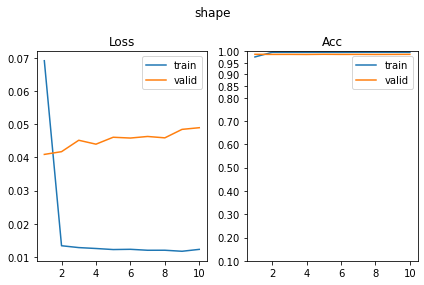

[254/630] scale      SUP_[FCN16i223o64_d32]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 51.66it/s, loss=0.905, acc=0.549]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 116.27it/s, loss=0.913, acc=0.554]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 55.49it/s, loss=0.797, acc=0.638]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 74.94it/s, loss=0.799, acc=0.617]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 54.43it/s, loss=0.765, acc=0.643]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 120.25it/s, loss=0.732, acc=0.656]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 51.01it/s, loss=0.71, acc=0.669]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 119.77it/s, loss=0.729, acc=0.668]    

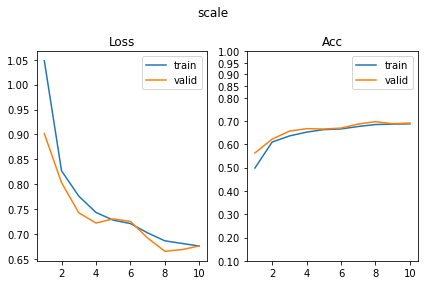

[255/630] color      SUP_[FCN16i223o64_d32]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 50.98it/s, loss=1.99, acc=0.212]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 123.58it/s, loss=2.06, acc=0.144]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 50.82it/s, loss=1.97, acc=0.228]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 122.80it/s, loss=1.98, acc=0.215]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 51.20it/s, loss=1.96, acc=0.23]                                            
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 109.48it/s, loss=1.97, acc=0.229]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 51.76it/s, loss=1.93, acc=0.256]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 122.07it/s, loss=1.93, acc=0.227]     

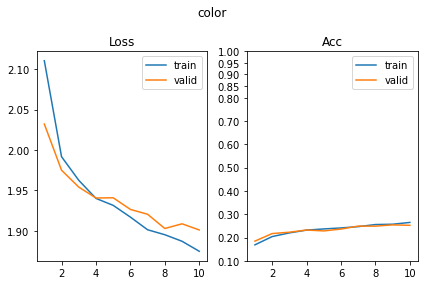

[256/630] angle      SUP_[FCN16i223o64_d32]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 51.33it/s, loss=2.61, acc=0.142]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 123.53it/s, loss=2.59, acc=0.166]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 55.13it/s, loss=2.36, acc=0.21]                                            
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 75.97it/s, loss=2.43, acc=0.19]                                              
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 54.10it/s, loss=2.23, acc=0.27]                                            
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 92.10it/s, loss=2.2, acc=0.232]                                              
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 50.11it/s, loss=2.1, acc=0.259]                                            
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 121.89it/s, loss=2.07, acc=0.344]     

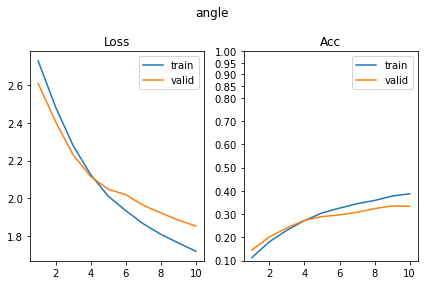

[257/630] py         SUP_[FCN16i223o64_d32]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 50.75it/s, loss=1.32, acc=0.366]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 123.05it/s, loss=1.33, acc=0.359]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 44.92it/s, loss=1.24, acc=0.438]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 115.00it/s, loss=1.27, acc=0.41]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 41.27it/s, loss=1.21, acc=0.438]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 122.73it/s, loss=1.19, acc=0.456]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 50.50it/s, loss=1.18, acc=0.446]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 122.20it/s, loss=1.21, acc=0.427]     

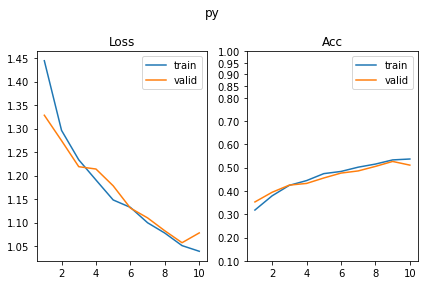

[258/630] px         SUP_[FCN16i223o64_d32]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 50.93it/s, loss=1.32, acc=0.371]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 124.02it/s, loss=1.32, acc=0.344]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 54.62it/s, loss=1.31, acc=0.357]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 76.56it/s, loss=1.33, acc=0.359]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 42.32it/s, loss=1.28, acc=0.386]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 83.80it/s, loss=1.29, acc=0.388]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 43.62it/s, loss=1.2, acc=0.432]                                            
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 122.32it/s, loss=1.28, acc=0.376]     

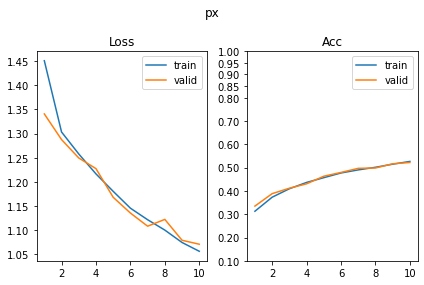

SUP_[FCN16i223o64_d32]_target_[scale]
[259/630] shape      SUP_[FCN16i223o64_d32]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 39.34it/s, loss=1.4, acc=0.458]                                            
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 81.28it/s, loss=1.51, acc=0.393]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 47.54it/s, loss=1.28, acc=0.507]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 121.74it/s, loss=1.34, acc=0.488]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 48.71it/s, loss=1.25, acc=0.507]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 121.40it/s, loss=1.33, acc=0.478]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 46.65it/s, loss=1.21, acc=0.554]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 116.61it/s, loss=1.21, acc=0.505]     

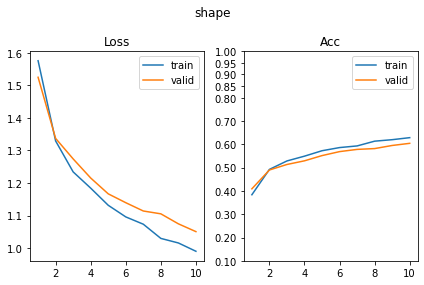

[260/630] scale      SUP_[FCN16i223o64_d32]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 45.81it/s, loss=0.0227, acc=0.992]                                         
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 108.06it/s, loss=0.229, acc=0.937]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 50.44it/s, loss=0.022, acc=0.985]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 54.27it/s, loss=0.332, acc=0.924]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 53.20it/s, loss=0.00587, acc=0.997]                                        
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 119.77it/s, loss=0.372, acc=0.907]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 45.23it/s, loss=0.0181, acc=0.99]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 79.59it/s, loss=0.392, acc=0.912]     

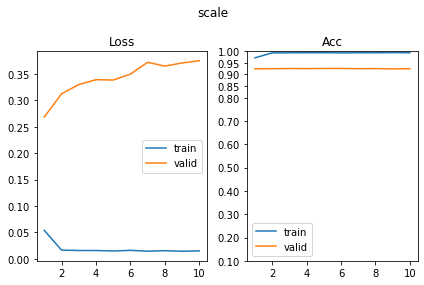

[261/630] color      SUP_[FCN16i223o64_d32]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 51.48it/s, loss=2, acc=0.202]                                              
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 80.65it/s, loss=2, acc=0.202]                                                
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 49.80it/s, loss=2.01, acc=0.197]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 123.82it/s, loss=1.99, acc=0.212]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 46.02it/s, loss=1.98, acc=0.217]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 120.48it/s, loss=2.02, acc=0.176]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 48.78it/s, loss=1.94, acc=0.244]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 120.49it/s, loss=1.97, acc=0.234]     

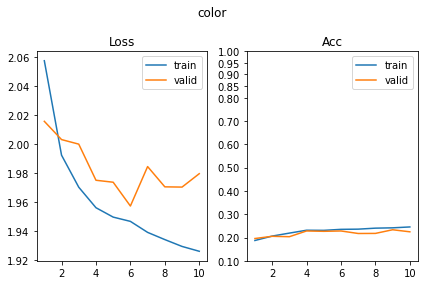

[262/630] angle      SUP_[FCN16i223o64_d32]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 46.73it/s, loss=2.72, acc=0.111]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 123.70it/s, loss=2.75, acc=0.112]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 54.53it/s, loss=2.63, acc=0.142]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 75.90it/s, loss=2.65, acc=0.144]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 54.15it/s, loss=2.57, acc=0.161]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 121.76it/s, loss=2.64, acc=0.127]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 51.23it/s, loss=2.47, acc=0.195]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 123.48it/s, loss=2.51, acc=0.168]     

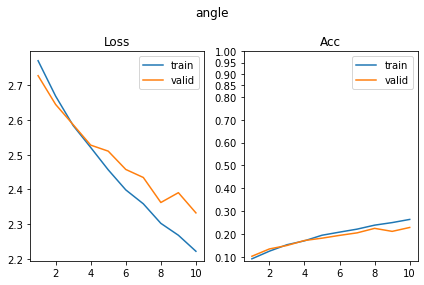

[263/630] py         SUP_[FCN16i223o64_d32]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 51.46it/s, loss=1.29, acc=0.376]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 121.69it/s, loss=1.31, acc=0.385]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 51.49it/s, loss=1.22, acc=0.484]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 119.13it/s, loss=1.23, acc=0.415]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 51.32it/s, loss=1.19, acc=0.45]                                            
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 115.64it/s, loss=1.22, acc=0.444]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 49.10it/s, loss=1.14, acc=0.51]                                            
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 113.09it/s, loss=1.19, acc=0.459]     

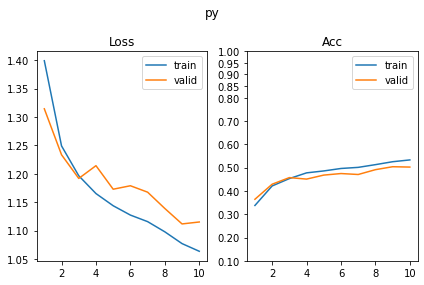

[264/630] px         SUP_[FCN16i223o64_d32]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 52.06it/s, loss=1.32, acc=0.35]                                            
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 123.28it/s, loss=1.31, acc=0.39]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 52.79it/s, loss=1.22, acc=0.445]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 75.02it/s, loss=1.2, acc=0.446]                                              
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 55.45it/s, loss=1.16, acc=0.487]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 117.94it/s, loss=1.18, acc=0.473]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 51.19it/s, loss=1.16, acc=0.456]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 122.55it/s, loss=1.2, acc=0.417]      

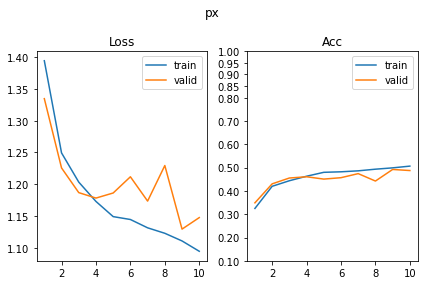

SUP_[FCN16i223o64_d32]_target_[color]
[265/630] shape      SUP_[FCN16i223o64_d32]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 50.92it/s, loss=1.92, acc=0.223]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 120.33it/s, loss=1.93, acc=0.156]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 51.49it/s, loss=1.76, acc=0.274]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 84.95it/s, loss=1.87, acc=0.232]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 46.84it/s, loss=1.64, acc=0.313]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 118.91it/s, loss=1.79, acc=0.268]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 44.94it/s, loss=1.51, acc=0.386]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 84.25it/s, loss=1.57, acc=0.332]      

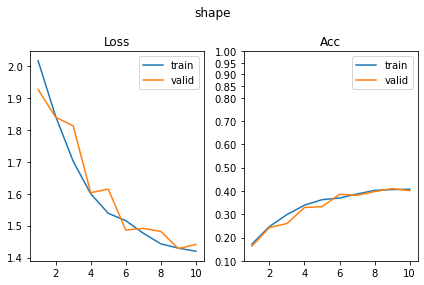

[266/630] scale      SUP_[FCN16i223o64_d32]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 47.03it/s, loss=1.1, acc=0.339]                                            
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 120.16it/s, loss=1.1, acc=0.346]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 51.28it/s, loss=1.09, acc=0.396]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 63.06it/s, loss=1.1, acc=0.346]                                              
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 54.04it/s, loss=1.11, acc=0.353]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 102.06it/s, loss=1.12, acc=0.317]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 48.37it/s, loss=1.09, acc=0.393]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 120.69it/s, loss=1.11, acc=0.332]     

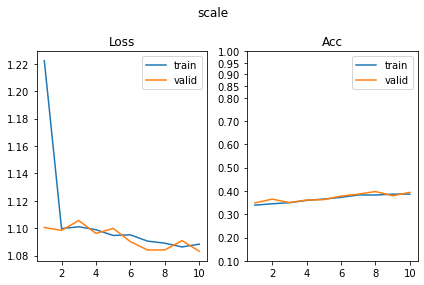

[267/630] color      SUP_[FCN16i223o64_d32]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 50.66it/s, loss=0.000612, acc=1]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 121.80it/s, loss=0.000436, acc=1]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 50.51it/s, loss=0.000335, acc=1]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 122.02it/s, loss=0.000297, acc=1]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 50.83it/s, loss=0.000229, acc=1]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 122.14it/s, loss=0.000222, acc=1]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 45.51it/s, loss=0.000178, acc=1]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 123.10it/s, loss=0.000161, acc=1]     

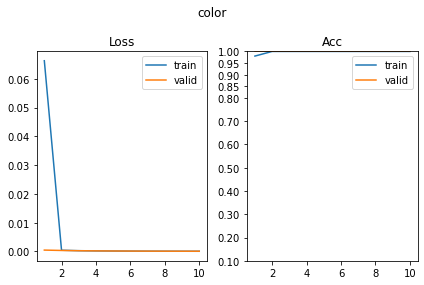

[268/630] angle      SUP_[FCN16i223o64_d32]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 51.31it/s, loss=2.8, acc=0.0684]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 118.50it/s, loss=2.82, acc=0.0561]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 51.11it/s, loss=2.79, acc=0.0912]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 76.31it/s, loss=2.82, acc=0.061]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 56.08it/s, loss=2.79, acc=0.0651]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 123.24it/s, loss=2.77, acc=0.0829]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 40.23it/s, loss=2.79, acc=0.0505]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 118.14it/s, loss=2.78, acc=0.078]     

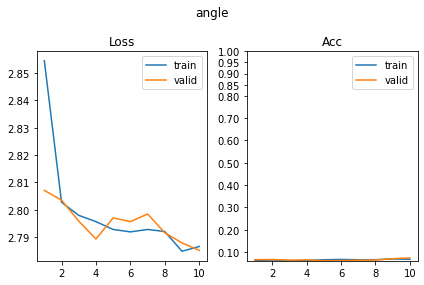

[269/630] py         SUP_[FCN16i223o64_d32]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 50.47it/s, loss=1.41, acc=0.241]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 122.67it/s, loss=1.4, acc=0.251]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 51.61it/s, loss=1.39, acc=0.261]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 123.43it/s, loss=1.4, acc=0.212]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 50.98it/s, loss=1.4, acc=0.241]                                            
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 122.61it/s, loss=1.41, acc=0.239]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 51.50it/s, loss=1.38, acc=0.296]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 121.29it/s, loss=1.4, acc=0.273]      

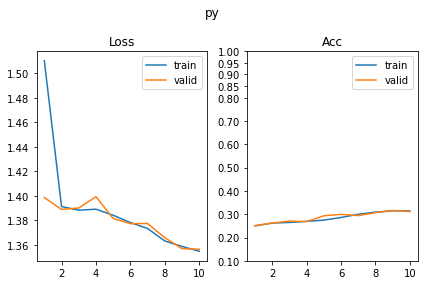

[270/630] px         SUP_[FCN16i223o64_d32]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 51.02it/s, loss=1.4, acc=0.27]                                             
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 123.76it/s, loss=1.41, acc=0.229]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 55.55it/s, loss=1.38, acc=0.292]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 76.08it/s, loss=1.39, acc=0.268]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 54.81it/s, loss=1.39, acc=0.22]                                            
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 122.17it/s, loss=1.38, acc=0.288]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 51.12it/s, loss=1.39, acc=0.233]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 121.60it/s, loss=1.38, acc=0.249]     

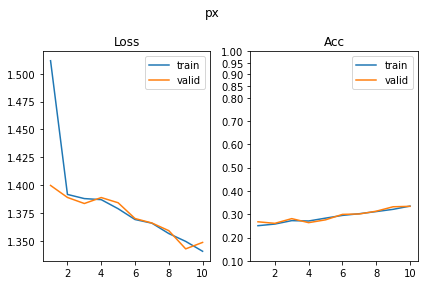

SUP_[FCN16i223o64_d32]_target_[angle]
[271/630] shape      SUP_[FCN16i223o64_d32]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 46.85it/s, loss=0.495, acc=0.798]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 105.84it/s, loss=0.486, acc=0.822]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 43.64it/s, loss=0.399, acc=0.853]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 118.34it/s, loss=0.451, acc=0.824]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 49.95it/s, loss=0.357, acc=0.853]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 117.54it/s, loss=0.353, acc=0.866]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 50.40it/s, loss=0.308, acc=0.884]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 117.13it/s, loss=0.327, acc=0.883]    

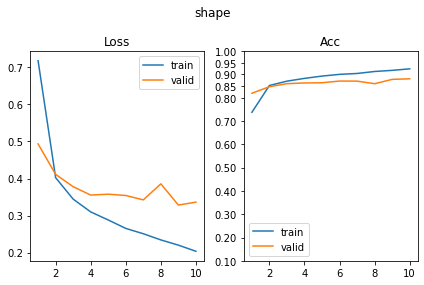

[272/630] scale      SUP_[FCN16i223o64_d32]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 50.95it/s, loss=1.06, acc=0.423]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 123.48it/s, loss=1.07, acc=0.41]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 48.37it/s, loss=1.04, acc=0.476]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 54.74it/s, loss=1.08, acc=0.38]                                              
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 39.84it/s, loss=0.981, acc=0.505]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 83.97it/s, loss=1.03, acc=0.463]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 38.50it/s, loss=1, acc=0.493]                                              
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 118.12it/s, loss=1.03, acc=0.49]      

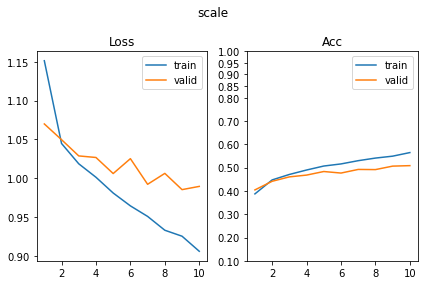

[273/630] color      SUP_[FCN16i223o64_d32]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 51.43it/s, loss=2.07, acc=0.161]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 120.33it/s, loss=2.07, acc=0.149]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 51.51it/s, loss=2.04, acc=0.179]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 121.39it/s, loss=2.07, acc=0.144]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 47.89it/s, loss=2.03, acc=0.179]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 78.86it/s, loss=2.06, acc=0.178]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 46.52it/s, loss=2.02, acc=0.184]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 120.26it/s, loss=2.04, acc=0.188]     

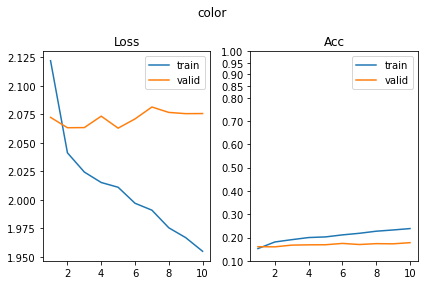

[274/630] angle      SUP_[FCN16i223o64_d32]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 52.06it/s, loss=0.256, acc=0.909]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 122.05it/s, loss=1.31, acc=0.571]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 51.37it/s, loss=0.283, acc=0.893]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 75.00it/s, loss=1.26, acc=0.637]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 50.51it/s, loss=0.252, acc=0.899]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 122.11it/s, loss=1.34, acc=0.61]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 52.00it/s, loss=0.254, acc=0.893]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 123.08it/s, loss=1.41, acc=0.602]     

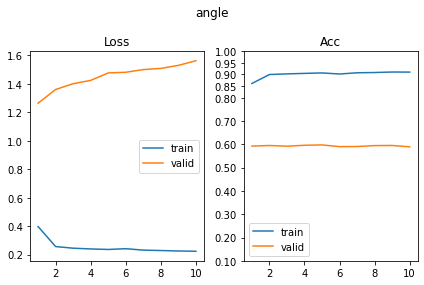

[275/630] py         SUP_[FCN16i223o64_d32]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 50.05it/s, loss=1.32, acc=0.358]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 75.60it/s, loss=1.34, acc=0.341]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 50.72it/s, loss=1.24, acc=0.419]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 95.69it/s, loss=1.29, acc=0.393]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 50.74it/s, loss=1.22, acc=0.432]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 107.91it/s, loss=1.27, acc=0.446]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 41.01it/s, loss=1.19, acc=0.445]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 121.28it/s, loss=1.21, acc=0.446]     

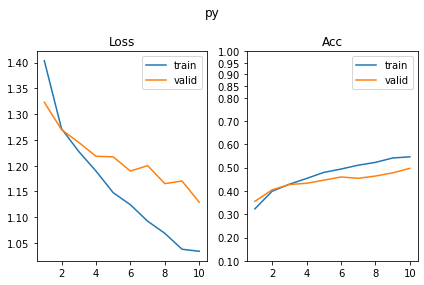

[276/630] px         SUP_[FCN16i223o64_d32]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 51.05it/s, loss=1.32, acc=0.376]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 122.17it/s, loss=1.32, acc=0.361]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 55.76it/s, loss=1.29, acc=0.402]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 76.04it/s, loss=1.29, acc=0.405]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 54.86it/s, loss=1.27, acc=0.407]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 121.98it/s, loss=1.27, acc=0.388]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 51.74it/s, loss=1.28, acc=0.401]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 122.67it/s, loss=1.24, acc=0.429]     

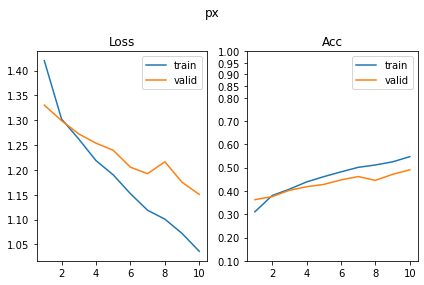

SUP_[FCN16i223o64_d32]_target_[py]
[277/630] shape      SUP_[FCN16i223o64_d32]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 49.98it/s, loss=1.35, acc=0.477]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 104.82it/s, loss=1.5, acc=0.439]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 43.86it/s, loss=1.08, acc=0.591]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 112.06it/s, loss=1.13, acc=0.588]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 45.86it/s, loss=1.04, acc=0.607]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 119.25it/s, loss=1.04, acc=0.583]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 44.70it/s, loss=0.912, acc=0.658]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 119.36it/s, loss=0.843, acc=0.651]    

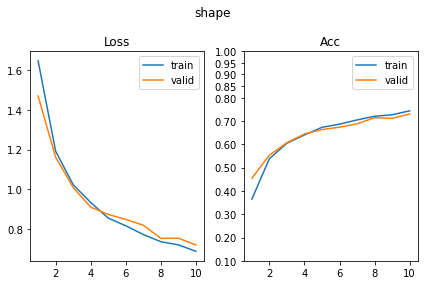

[278/630] scale      SUP_[FCN16i223o64_d32]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 51.62it/s, loss=0.99, acc=0.513]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 123.87it/s, loss=1.01, acc=0.478]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 55.46it/s, loss=0.98, acc=0.521]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 75.81it/s, loss=0.942, acc=0.539]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 55.65it/s, loss=0.924, acc=0.542]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 122.11it/s, loss=0.927, acc=0.563]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 51.01it/s, loss=0.896, acc=0.573]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 124.21it/s, loss=0.931, acc=0.532]    

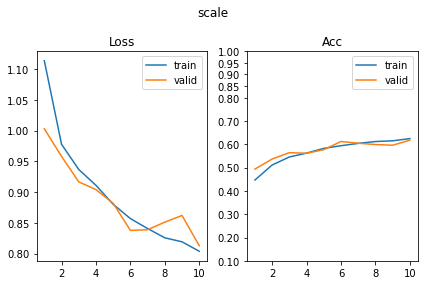

[279/630] color      SUP_[FCN16i223o64_d32]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 50.89it/s, loss=2.05, acc=0.161]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 122.32it/s, loss=2.03, acc=0.156]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 50.81it/s, loss=2.04, acc=0.173]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 122.32it/s, loss=2.03, acc=0.154]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 49.93it/s, loss=2.04, acc=0.189]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 122.25it/s, loss=2.02, acc=0.161]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 50.21it/s, loss=2, acc=0.179]                                              
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 109.83it/s, loss=2.02, acc=0.173]     

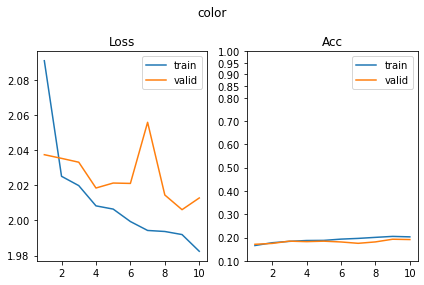

[280/630] angle      SUP_[FCN16i223o64_d32]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 50.84it/s, loss=2.71, acc=0.112]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 119.44it/s, loss=2.7, acc=0.117]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 45.46it/s, loss=2.65, acc=0.119]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 75.75it/s, loss=2.62, acc=0.137]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 55.83it/s, loss=2.53, acc=0.164]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 120.48it/s, loss=2.48, acc=0.188]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 51.70it/s, loss=2.48, acc=0.194]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 122.92it/s, loss=2.47, acc=0.202]     

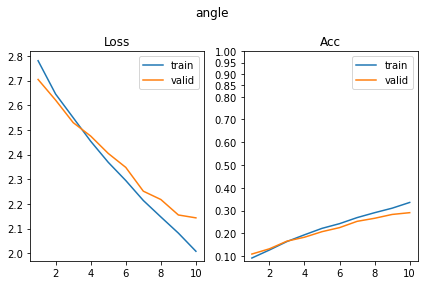

[281/630] py         SUP_[FCN16i223o64_d32]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 48.09it/s, loss=0.0294, acc=0.985]                                         
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 123.26it/s, loss=0.102, acc=0.978]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 52.11it/s, loss=0.0166, acc=0.992]                                         
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 120.61it/s, loss=0.0717, acc=0.976]                                          
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 51.45it/s, loss=0.0135, acc=0.993]                                         
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 122.46it/s, loss=0.0286, acc=0.988]                                          
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 50.73it/s, loss=0.0123, acc=0.993]                                         
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 91.29it/s, loss=0.0551, acc=0.983]    

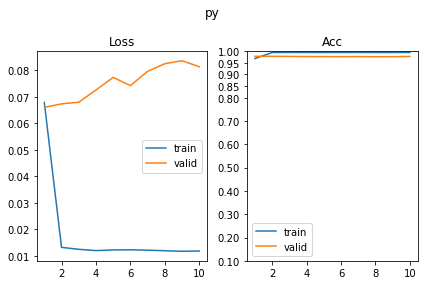

[282/630] px         SUP_[FCN16i223o64_d32]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 50.61it/s, loss=1.38, acc=0.292]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 117.92it/s, loss=1.39, acc=0.268]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 53.52it/s, loss=1.36, acc=0.322]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 55.45it/s, loss=1.36, acc=0.315]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 44.77it/s, loss=1.34, acc=0.35]                                            
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 79.90it/s, loss=1.34, acc=0.341]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 46.44it/s, loss=1.36, acc=0.285]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 101.09it/s, loss=1.32, acc=0.366]     

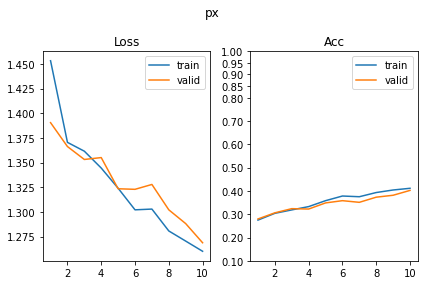

SUP_[FCN16i223o64_d32]_target_[px]
[283/630] shape      SUP_[FCN16i223o64_d32]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 51.05it/s, loss=1.13, acc=0.549]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 124.28it/s, loss=1.23, acc=0.549]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 51.24it/s, loss=0.912, acc=0.638]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 121.12it/s, loss=0.965, acc=0.6]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 51.44it/s, loss=0.834, acc=0.684]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 118.86it/s, loss=0.793, acc=0.71]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 47.17it/s, loss=0.728, acc=0.721]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 120.22it/s, loss=0.685, acc=0.72]     

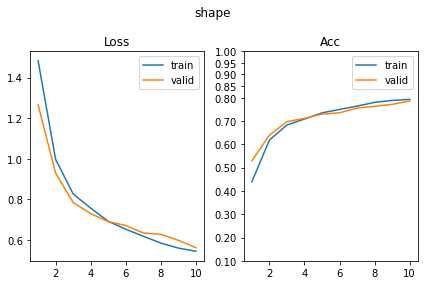

[284/630] scale      SUP_[FCN16i223o64_d32]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 51.17it/s, loss=0.973, acc=0.521]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 122.61it/s, loss=1.02, acc=0.483]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 53.76it/s, loss=0.929, acc=0.546]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 75.68it/s, loss=0.974, acc=0.556]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 54.73it/s, loss=0.833, acc=0.612]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 119.84it/s, loss=0.82, acc=0.61]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 50.45it/s, loss=0.771, acc=0.663]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 121.57it/s, loss=0.801, acc=0.617]    

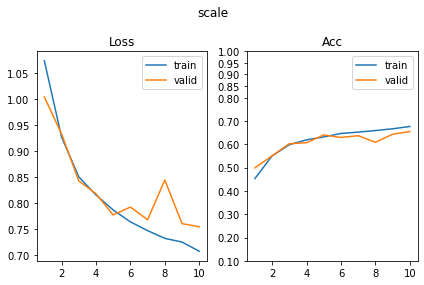

[285/630] color      SUP_[FCN16i223o64_d32]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 43.98it/s, loss=2.01, acc=0.194]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 93.30it/s, loss=2.02, acc=0.159]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 50.90it/s, loss=1.93, acc=0.248]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 115.56it/s, loss=1.99, acc=0.207]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 49.60it/s, loss=1.95, acc=0.226]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 117.95it/s, loss=1.94, acc=0.244]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 50.74it/s, loss=1.92, acc=0.249]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 120.24it/s, loss=1.96, acc=0.227]     

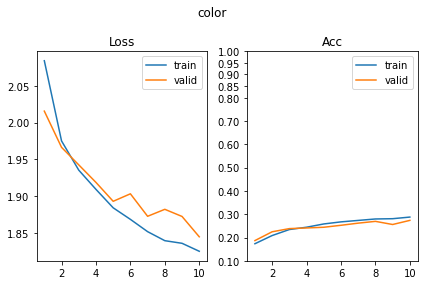

[286/630] angle      SUP_[FCN16i223o64_d32]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 52.47it/s, loss=2.6, acc=0.156]                                            
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 120.69it/s, loss=2.66, acc=0.11]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 55.89it/s, loss=2.42, acc=0.212]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 75.93it/s, loss=2.49, acc=0.176]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 56.28it/s, loss=2.31, acc=0.213]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 122.37it/s, loss=2.34, acc=0.217]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 52.06it/s, loss=2.17, acc=0.256]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 123.12it/s, loss=2.25, acc=0.234]     

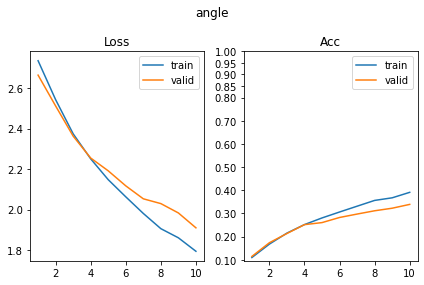

[287/630] py         SUP_[FCN16i223o64_d32]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 49.14it/s, loss=1.39, acc=0.267]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 116.11it/s, loss=1.38, acc=0.288]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 50.52it/s, loss=1.35, acc=0.349]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 120.76it/s, loss=1.33, acc=0.368]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 50.88it/s, loss=1.28, acc=0.376]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 121.15it/s, loss=1.35, acc=0.356]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 50.75it/s, loss=1.27, acc=0.368]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 121.07it/s, loss=1.3, acc=0.351]      

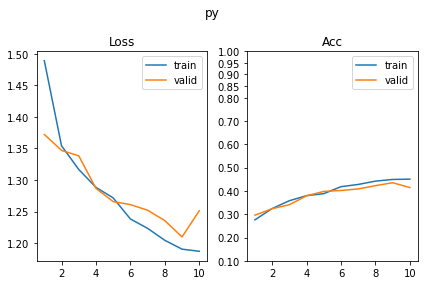

[288/630] px         SUP_[FCN16i223o64_d32]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 48.16it/s, loss=0.0292, acc=0.989]                                         
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 101.07it/s, loss=0.0775, acc=0.963]                                          
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 54.73it/s, loss=0.0333, acc=0.985]                                         
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 74.33it/s, loss=0.162, acc=0.951]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 55.71it/s, loss=0.0242, acc=0.992]                                         
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 123.42it/s, loss=0.0614, acc=0.976]                                          
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 48.01it/s, loss=0.0246, acc=0.989]                                         
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 99.16it/s, loss=0.105, acc=0.968]     

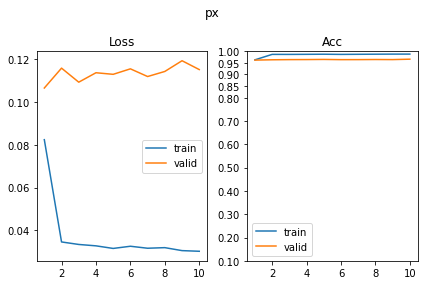

SUP_[FCN16i223o64_d64]_target_[shape]
[289/630] shape      SUP_[FCN16i223o64_d64]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 48.75it/s, loss=0.0327, acc=0.989]                                         
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 120.07it/s, loss=0.052, acc=0.98]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 50.51it/s, loss=0.0393, acc=0.985]                                         
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 121.80it/s, loss=0.0506, acc=0.988]                                          
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 50.33it/s, loss=0.031, acc=0.989]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 117.94it/s, loss=0.0787, acc=0.976]                                          
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 50.36it/s, loss=0.024, acc=0.987]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 119.77it/s, loss=0.0576, acc=0.983]   

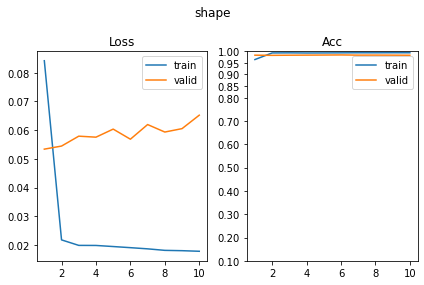

[290/630] scale      SUP_[FCN16i223o64_d64]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 50.90it/s, loss=0.86, acc=0.568]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 118.00it/s, loss=0.867, acc=0.59]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 54.98it/s, loss=0.775, acc=0.643]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 76.13it/s, loss=0.718, acc=0.671]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 55.02it/s, loss=0.697, acc=0.692]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 118.20it/s, loss=0.667, acc=0.695]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 51.58it/s, loss=0.738, acc=0.647]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 108.13it/s, loss=0.75, acc=0.632]     

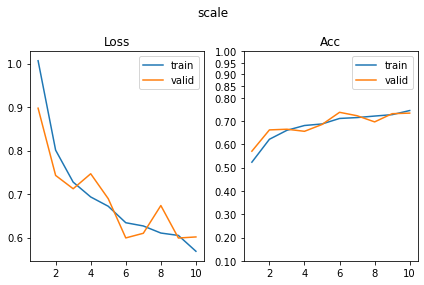

[291/630] color      SUP_[FCN16i223o64_d64]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 50.93it/s, loss=1.96, acc=0.208]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 121.19it/s, loss=1.99, acc=0.188]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 50.20it/s, loss=1.9, acc=0.254]                                            
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 122.62it/s, loss=1.94, acc=0.207]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 50.75it/s, loss=1.97, acc=0.241]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 120.25it/s, loss=1.91, acc=0.241]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 50.32it/s, loss=1.9, acc=0.228]                                            
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 120.96it/s, loss=1.87, acc=0.254]     

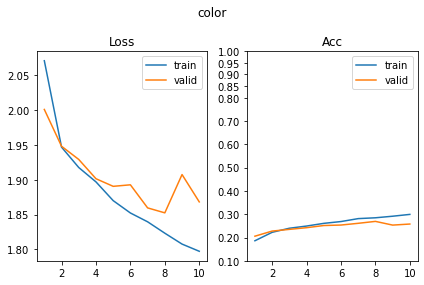

[292/630] angle      SUP_[FCN16i223o64_d64]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 50.21it/s, loss=2.28, acc=0.249]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 119.84it/s, loss=2.38, acc=0.217]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 54.63it/s, loss=1.93, acc=0.308]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 74.37it/s, loss=1.99, acc=0.305]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 55.67it/s, loss=1.68, acc=0.394]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 108.35it/s, loss=1.71, acc=0.373]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 45.03it/s, loss=1.48, acc=0.425]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 121.85it/s, loss=1.57, acc=0.371]     

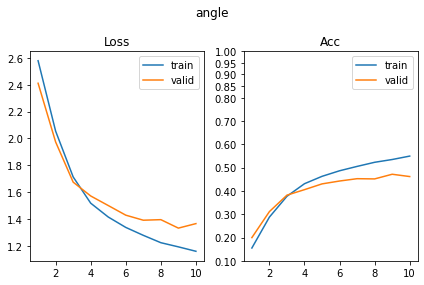

[293/630] py         SUP_[FCN16i223o64_d64]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 50.59it/s, loss=1.25, acc=0.425]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 121.46it/s, loss=1.34, acc=0.351]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 50.95it/s, loss=1.11, acc=0.516]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 120.13it/s, loss=1.13, acc=0.473]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 51.25it/s, loss=1.01, acc=0.531]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 121.18it/s, loss=0.998, acc=0.559]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 50.93it/s, loss=0.956, acc=0.575]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 82.50it/s, loss=0.93, acc=0.59]       

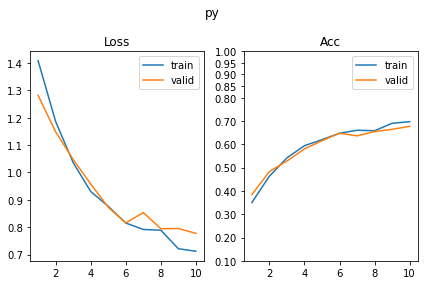

[294/630] px         SUP_[FCN16i223o64_d64]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 50.75it/s, loss=1.28, acc=0.415]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 119.39it/s, loss=1.29, acc=0.393]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 54.35it/s, loss=1.09, acc=0.521]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 74.52it/s, loss=1.12, acc=0.498]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 55.83it/s, loss=1.03, acc=0.549]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 119.06it/s, loss=1.07, acc=0.534]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 50.88it/s, loss=0.903, acc=0.59]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 118.65it/s, loss=0.948, acc=0.585]    

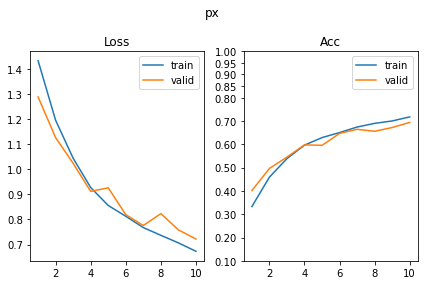

SUP_[FCN16i223o64_d64]_target_[scale]
[295/630] shape      SUP_[FCN16i223o64_d64]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 48.89it/s, loss=1.15, acc=0.573]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 114.29it/s, loss=1.44, acc=0.405]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 48.14it/s, loss=0.974, acc=0.634]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 119.95it/s, loss=1.07, acc=0.607]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 49.84it/s, loss=0.855, acc=0.664]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 117.91it/s, loss=0.851, acc=0.693]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 50.12it/s, loss=0.875, acc=0.666]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 120.63it/s, loss=0.988, acc=0.61]     

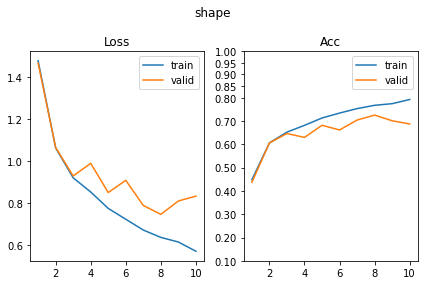

[296/630] scale      SUP_[FCN16i223o64_d64]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 52.52it/s, loss=0.0134, acc=0.993]                                         
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 122.82it/s, loss=0.375, acc=0.902]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 56.28it/s, loss=0.0196, acc=0.997]                                         
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 51.99it/s, loss=0.521, acc=0.888]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 55.86it/s, loss=0.0474, acc=0.982]                                         
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 120.46it/s, loss=0.349, acc=0.917]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 46.52it/s, loss=0.0225, acc=0.992]                                         
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 111.32it/s, loss=0.285, acc=0.92]     

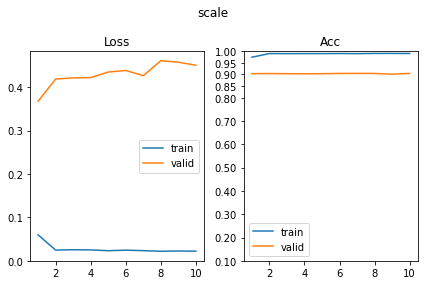

[297/630] color      SUP_[FCN16i223o64_d64]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 47.91it/s, loss=1.89, acc=0.231]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 122.10it/s, loss=1.88, acc=0.271]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 50.01it/s, loss=1.88, acc=0.254]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 122.94it/s, loss=1.9, acc=0.234]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 51.01it/s, loss=1.82, acc=0.262]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 122.39it/s, loss=1.83, acc=0.273]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 50.29it/s, loss=1.82, acc=0.269]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 123.67it/s, loss=1.84, acc=0.227]     

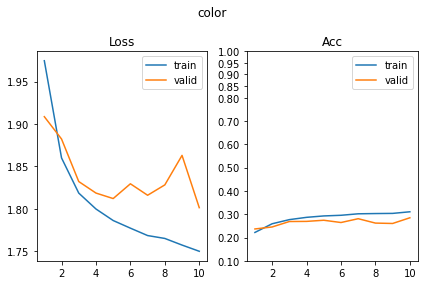

[298/630] angle      SUP_[FCN16i223o64_d64]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 52.15it/s, loss=2.61, acc=0.163]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 118.23it/s, loss=2.68, acc=0.132]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 56.15it/s, loss=2.39, acc=0.217]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 71.97it/s, loss=2.41, acc=0.2]                                               
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 55.97it/s, loss=2.14, acc=0.292]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 119.63it/s, loss=2.41, acc=0.229]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 51.82it/s, loss=2.09, acc=0.28]                                            
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 118.32it/s, loss=2.29, acc=0.254]     

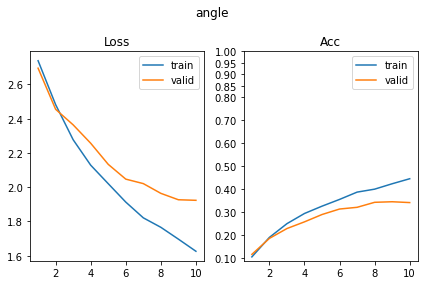

[299/630] py         SUP_[FCN16i223o64_d64]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 50.51it/s, loss=1.19, acc=0.471]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 99.70it/s, loss=1.25, acc=0.434]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 45.49it/s, loss=1.08, acc=0.498]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 122.79it/s, loss=1.1, acc=0.507]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 48.78it/s, loss=1.05, acc=0.539]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 122.62it/s, loss=1.19, acc=0.468]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 49.88it/s, loss=1.01, acc=0.55]                                            
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 115.29it/s, loss=1.1, acc=0.517]      

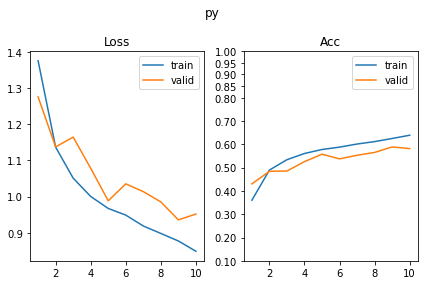

[300/630] px         SUP_[FCN16i223o64_d64]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 51.74it/s, loss=1.06, acc=0.539]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 120.51it/s, loss=1.2, acc=0.41]                                              
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 55.41it/s, loss=0.975, acc=0.552]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 74.90it/s, loss=1.02, acc=0.563]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 55.45it/s, loss=0.82, acc=0.622]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 120.97it/s, loss=0.983, acc=0.556]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 51.21it/s, loss=0.917, acc=0.594]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 119.93it/s, loss=0.958, acc=0.571]    

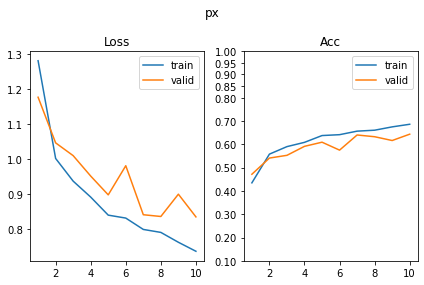

SUP_[FCN16i223o64_d64]_target_[color]
[301/630] shape      SUP_[FCN16i223o64_d64]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 42.33it/s, loss=1.8, acc=0.269]                                            
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 79.15it/s, loss=1.91, acc=0.183]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 45.28it/s, loss=1.52, acc=0.366]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 120.08it/s, loss=1.81, acc=0.3]                                              
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 51.58it/s, loss=1.41, acc=0.388]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 102.36it/s, loss=1.58, acc=0.368]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 48.98it/s, loss=1.39, acc=0.423]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 81.35it/s, loss=1.37, acc=0.449]      

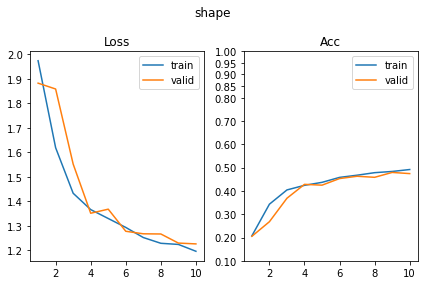

[302/630] scale      SUP_[FCN16i223o64_d64]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 49.13it/s, loss=1.11, acc=0.334]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 122.27it/s, loss=1.1, acc=0.329]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 50.76it/s, loss=1.09, acc=0.397]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 73.76it/s, loss=1.11, acc=0.359]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 50.53it/s, loss=1.09, acc=0.389]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 120.99it/s, loss=1.07, acc=0.407]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 46.65it/s, loss=1.09, acc=0.381]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 116.67it/s, loss=1.07, acc=0.407]     

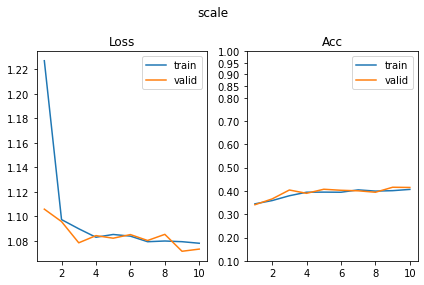

[303/630] color      SUP_[FCN16i223o64_d64]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 48.30it/s, loss=0.000581, acc=1]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 121.90it/s, loss=0.000518, acc=1]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 43.45it/s, loss=0.000351, acc=1]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 118.90it/s, loss=0.000319, acc=1]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 44.88it/s, loss=0.000232, acc=1]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 121.13it/s, loss=0.000253, acc=1]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 42.62it/s, loss=0.000175, acc=1]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 121.24it/s, loss=0.000249, acc=1]     

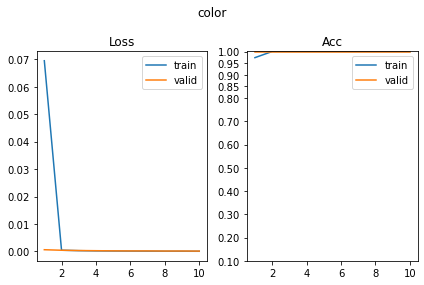

[304/630] angle      SUP_[FCN16i223o64_d64]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 49.08it/s, loss=2.81, acc=0.0505]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 121.93it/s, loss=2.79, acc=0.0537]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 39.91it/s, loss=2.79, acc=0.0765]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 63.61it/s, loss=2.81, acc=0.0439]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 51.62it/s, loss=2.81, acc=0.0635]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 80.52it/s, loss=2.82, acc=0.0659]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 46.71it/s, loss=2.79, acc=0.0554]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 98.88it/s, loss=2.81, acc=0.0683]     

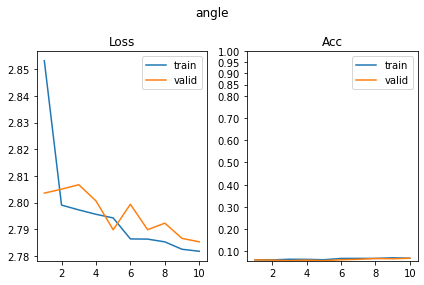

[305/630] py         SUP_[FCN16i223o64_d64]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 49.50it/s, loss=1.39, acc=0.283]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 117.18it/s, loss=1.39, acc=0.271]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 49.45it/s, loss=1.38, acc=0.288]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 114.55it/s, loss=1.39, acc=0.273]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 49.82it/s, loss=1.37, acc=0.306]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 117.75it/s, loss=1.38, acc=0.29]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 49.81it/s, loss=1.34, acc=0.327]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 118.16it/s, loss=1.36, acc=0.307]     

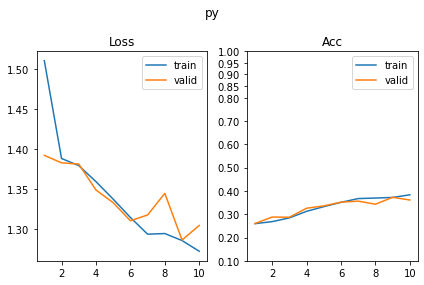

[306/630] px         SUP_[FCN16i223o64_d64]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 50.49it/s, loss=1.39, acc=0.274]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 121.07it/s, loss=1.39, acc=0.263]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 50.99it/s, loss=1.37, acc=0.28]                                            
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 54.93it/s, loss=1.38, acc=0.3]                                               
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 53.54it/s, loss=1.37, acc=0.301]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 114.60it/s, loss=1.37, acc=0.302]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 52.61it/s, loss=1.36, acc=0.301]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 118.06it/s, loss=1.35, acc=0.334]     

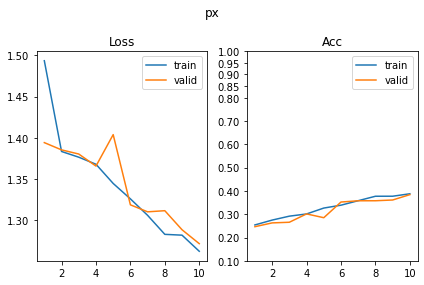

SUP_[FCN16i223o64_d64]_target_[angle]
[307/630] shape      SUP_[FCN16i223o64_d64]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 48.32it/s, loss=0.355, acc=0.868]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 120.74it/s, loss=0.396, acc=0.854]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 51.40it/s, loss=0.257, acc=0.923]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 118.03it/s, loss=0.292, acc=0.885]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 50.32it/s, loss=0.209, acc=0.935]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 77.71it/s, loss=0.311, acc=0.888]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 48.97it/s, loss=0.239, acc=0.907]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 120.43it/s, loss=0.29, acc=0.895]     

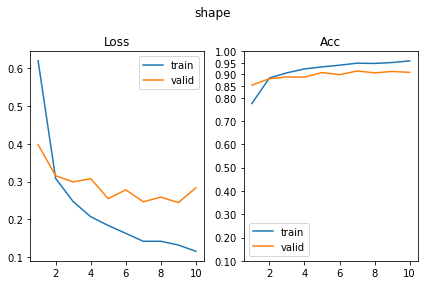

[308/630] scale      SUP_[FCN16i223o64_d64]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 50.12it/s, loss=1.03, acc=0.458]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 119.10it/s, loss=1.05, acc=0.456]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 55.13it/s, loss=0.96, acc=0.523]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 74.84it/s, loss=0.985, acc=0.5]                                              
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 53.61it/s, loss=0.987, acc=0.52]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 120.96it/s, loss=1.01, acc=0.48]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 49.32it/s, loss=0.938, acc=0.557]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 123.60it/s, loss=0.914, acc=0.571]    

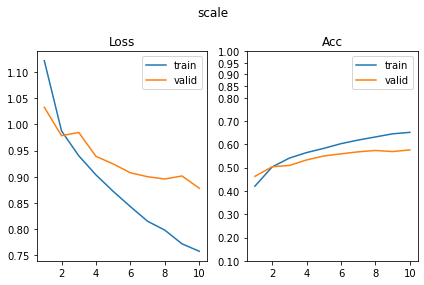

[309/630] color      SUP_[FCN16i223o64_d64]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 50.32it/s, loss=2.04, acc=0.161]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 122.15it/s, loss=2.06, acc=0.163]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 51.62it/s, loss=2, acc=0.212]                                              
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 120.23it/s, loss=2.02, acc=0.19]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 50.03it/s, loss=1.98, acc=0.231]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 115.79it/s, loss=2.04, acc=0.161]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 50.76it/s, loss=1.94, acc=0.249]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 122.06it/s, loss=2.06, acc=0.171]     

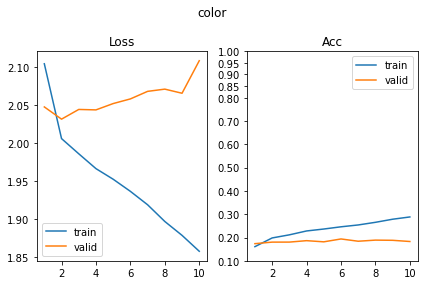

[310/630] angle      SUP_[FCN16i223o64_d64]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 51.71it/s, loss=0.277, acc=0.893]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 123.15it/s, loss=1.43, acc=0.544]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 55.38it/s, loss=0.238, acc=0.914]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 73.52it/s, loss=1.37, acc=0.607]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 54.97it/s, loss=0.291, acc=0.891]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 122.45it/s, loss=1.48, acc=0.598]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 51.25it/s, loss=0.217, acc=0.912]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 82.47it/s, loss=1.49, acc=0.637]      

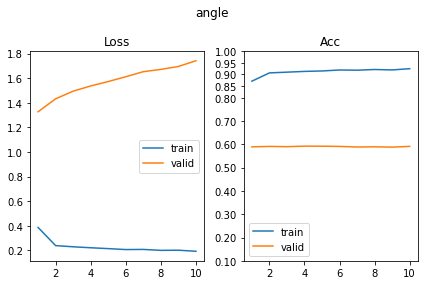

[311/630] py         SUP_[FCN16i223o64_d64]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 50.85it/s, loss=1.25, acc=0.458]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 122.02it/s, loss=1.25, acc=0.432]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 51.78it/s, loss=1.15, acc=0.466]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 122.35it/s, loss=1.17, acc=0.502]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 51.63it/s, loss=1.1, acc=0.515]                                            
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 122.29it/s, loss=1.11, acc=0.52]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 50.76it/s, loss=1.01, acc=0.55]                                            
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 122.16it/s, loss=1.03, acc=0.534]     

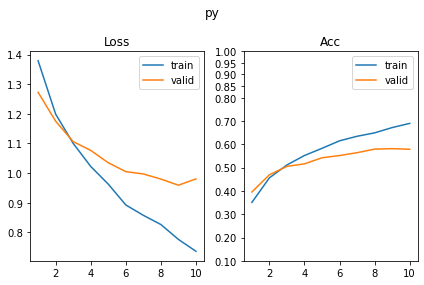

[312/630] px         SUP_[FCN16i223o64_d64]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 48.34it/s, loss=1.27, acc=0.422]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 122.48it/s, loss=1.25, acc=0.41]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 53.18it/s, loss=1.17, acc=0.48]                                            
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 66.16it/s, loss=1.22, acc=0.446]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 50.17it/s, loss=1.03, acc=0.529]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 122.44it/s, loss=1.06, acc=0.522]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 47.27it/s, loss=0.991, acc=0.577]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 105.77it/s, loss=1.09, acc=0.505]     

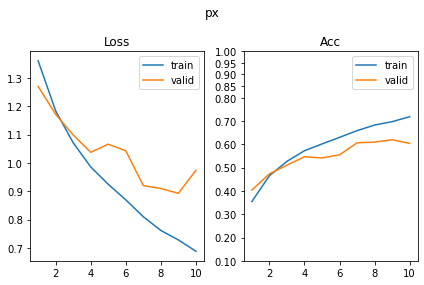

SUP_[FCN16i223o64_d64]_target_[py]
[313/630] shape      SUP_[FCN16i223o64_d64]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 45.40it/s, loss=0.906, acc=0.634]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 120.24it/s, loss=1.17, acc=0.554]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 51.50it/s, loss=0.628, acc=0.752]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 120.27it/s, loss=0.698, acc=0.727]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 48.77it/s, loss=0.567, acc=0.793]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 122.09it/s, loss=0.595, acc=0.778]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 51.27it/s, loss=0.56, acc=0.774]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 121.56it/s, loss=0.547, acc=0.778]    

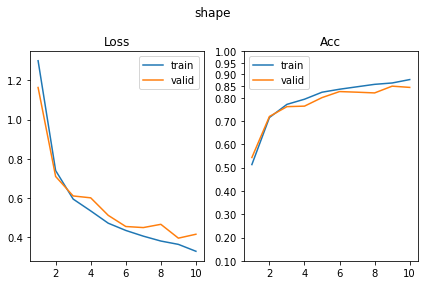

[314/630] scale      SUP_[FCN16i223o64_d64]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 50.53it/s, loss=0.926, acc=0.549]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 119.10it/s, loss=0.957, acc=0.544]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 54.64it/s, loss=0.866, acc=0.567]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 74.46it/s, loss=0.87, acc=0.615]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 53.51it/s, loss=0.764, acc=0.656]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 119.79it/s, loss=0.842, acc=0.629]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 50.37it/s, loss=0.709, acc=0.671]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 119.63it/s, loss=0.765, acc=0.644]    

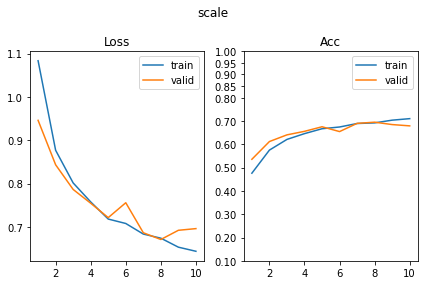

[315/630] color      SUP_[FCN16i223o64_d64]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 50.46it/s, loss=2.03, acc=0.168]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 119.33it/s, loss=2.01, acc=0.173]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 51.25it/s, loss=1.95, acc=0.207]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 122.72it/s, loss=1.99, acc=0.178]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 50.95it/s, loss=1.91, acc=0.217]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 123.21it/s, loss=1.94, acc=0.241]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 51.51it/s, loss=1.87, acc=0.236]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 123.55it/s, loss=1.98, acc=0.234]     

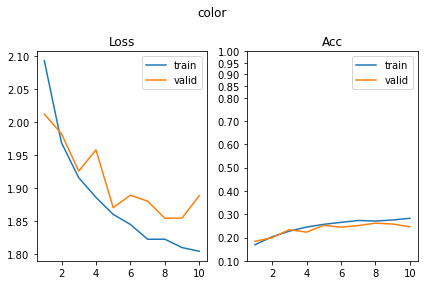

[316/630] angle      SUP_[FCN16i223o64_d64]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 45.83it/s, loss=2.59, acc=0.156]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 120.48it/s, loss=2.62, acc=0.122]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 50.01it/s, loss=2.27, acc=0.256]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 74.62it/s, loss=2.4, acc=0.237]                                              
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 53.58it/s, loss=2.07, acc=0.301]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 121.05it/s, loss=2.18, acc=0.261]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 45.56it/s, loss=1.93, acc=0.355]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 111.30it/s, loss=2.07, acc=0.276]     

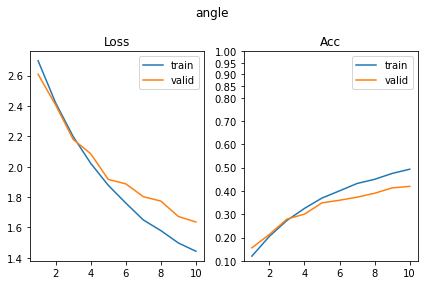

[317/630] py         SUP_[FCN16i223o64_d64]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 51.05it/s, loss=0.00848, acc=0.997]                                        
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 109.64it/s, loss=0.055, acc=0.988]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 45.55it/s, loss=0.00784, acc=0.997]                                        
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 83.37it/s, loss=0.0299, acc=0.99]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 49.64it/s, loss=0.0166, acc=0.99]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 113.22it/s, loss=0.0716, acc=0.985]                                          
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 50.49it/s, loss=0.0126, acc=0.997]                                         
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 117.86it/s, loss=0.104, acc=0.971]    

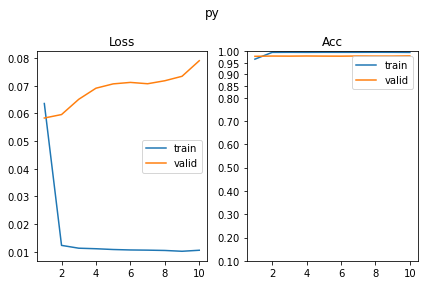

[318/630] px         SUP_[FCN16i223o64_d64]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 49.02it/s, loss=1.38, acc=0.279]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 118.52it/s, loss=1.37, acc=0.295]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 54.44it/s, loss=1.31, acc=0.384]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 74.66it/s, loss=1.36, acc=0.295]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 45.72it/s, loss=1.28, acc=0.389]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 112.16it/s, loss=1.28, acc=0.398]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 46.40it/s, loss=1.19, acc=0.441]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 120.93it/s, loss=1.21, acc=0.439]     

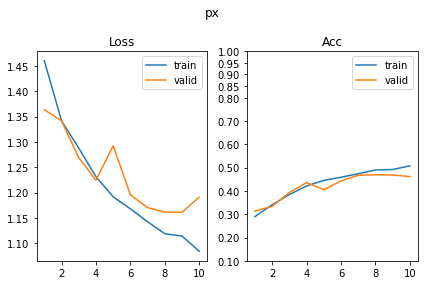

SUP_[FCN16i223o64_d64]_target_[px]
[319/630] shape      SUP_[FCN16i223o64_d64]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 50.62it/s, loss=0.901, acc=0.64]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 120.74it/s, loss=1.11, acc=0.576]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 50.68it/s, loss=0.632, acc=0.757]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 121.83it/s, loss=0.671, acc=0.761]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 50.06it/s, loss=0.559, acc=0.8]                                            
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 121.25it/s, loss=0.62, acc=0.741]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 49.97it/s, loss=0.475, acc=0.801]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 121.41it/s, loss=0.534, acc=0.793]    

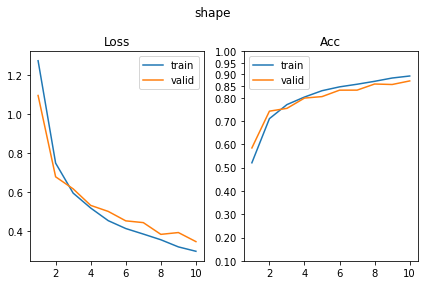

[320/630] scale      SUP_[FCN16i223o64_d64]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 47.67it/s, loss=0.916, acc=0.547]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 119.04it/s, loss=0.971, acc=0.52]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 47.14it/s, loss=0.833, acc=0.598]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 75.51it/s, loss=0.893, acc=0.546]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 54.92it/s, loss=0.797, acc=0.621]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 118.81it/s, loss=0.823, acc=0.605]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 50.83it/s, loss=0.781, acc=0.632]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 117.30it/s, loss=0.77, acc=0.624]     

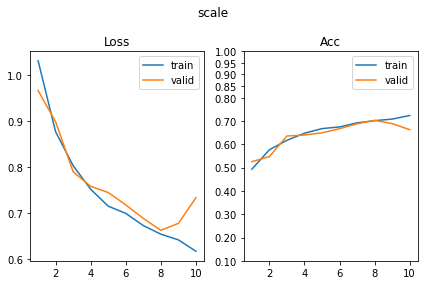

[321/630] color      SUP_[FCN16i223o64_d64]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 50.88it/s, loss=2.06, acc=0.153]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 117.44it/s, loss=2.04, acc=0.198]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 48.03it/s, loss=2.03, acc=0.195]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 100.58it/s, loss=2.01, acc=0.202]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 51.43it/s, loss=2.03, acc=0.189]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 121.68it/s, loss=2.03, acc=0.21]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 50.96it/s, loss=1.96, acc=0.23]                                            
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 120.29it/s, loss=1.97, acc=0.21]      

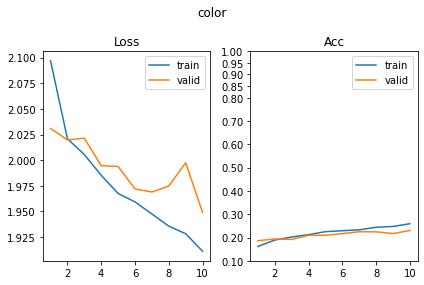

[322/630] angle      SUP_[FCN16i223o64_d64]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 50.97it/s, loss=2.58, acc=0.14]                                            
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 118.47it/s, loss=2.61, acc=0.154]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 54.22it/s, loss=2.31, acc=0.249]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 73.17it/s, loss=2.36, acc=0.224]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 52.72it/s, loss=2.15, acc=0.282]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 91.21it/s, loss=2.14, acc=0.315]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 44.57it/s, loss=2.01, acc=0.327]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 83.19it/s, loss=2.24, acc=0.256]      

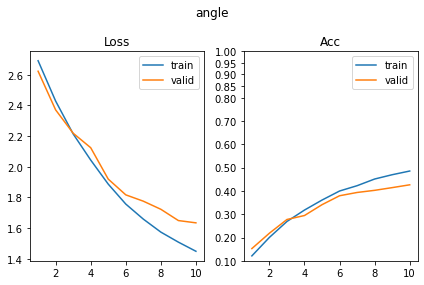

[323/630] py         SUP_[FCN16i223o64_d64]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 49.83it/s, loss=1.36, acc=0.296]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 116.88it/s, loss=1.35, acc=0.305]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 42.96it/s, loss=1.25, acc=0.428]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 117.34it/s, loss=1.27, acc=0.4]                                              
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 47.87it/s, loss=1.21, acc=0.407]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 101.75it/s, loss=1.23, acc=0.415]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 43.55it/s, loss=1.16, acc=0.45]                                            
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 81.41it/s, loss=1.18, acc=0.449]      

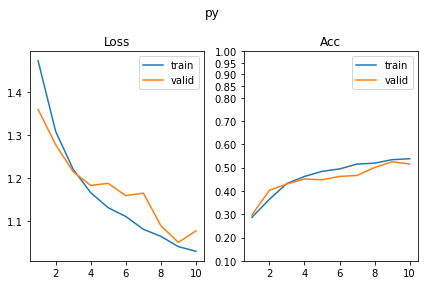

[324/630] px         SUP_[FCN16i223o64_d64]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 50.42it/s, loss=0.0361, acc=0.987]                                         
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 121.95it/s, loss=0.0524, acc=0.983]                                          
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 54.20it/s, loss=0.0132, acc=0.997]                                         
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 75.63it/s, loss=0.0593, acc=0.985]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 50.13it/s, loss=0.0139, acc=0.993]                                         
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 119.10it/s, loss=0.06, acc=0.983]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 50.63it/s, loss=0.0222, acc=0.99]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 118.35it/s, loss=0.115, acc=0.971]    

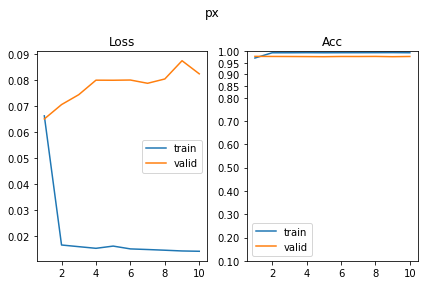

SUP_[FCN16i223o64_d128]_target_[shape]
[325/630] shape      SUP_[FCN16i223o64_d128]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 48.53it/s, loss=0.0158, acc=0.993]                                         
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 81.53it/s, loss=0.0743, acc=0.973]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 46.56it/s, loss=0.0165, acc=0.995]                                         
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 81.10it/s, loss=0.0556, acc=0.983]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 45.93it/s, loss=0.00774, acc=0.998]                                        
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 119.48it/s, loss=0.0435, acc=0.983]                                          
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 44.81it/s, loss=0.012, acc=0.995]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 116.27it/s, loss=0.0443, acc=0.988]   

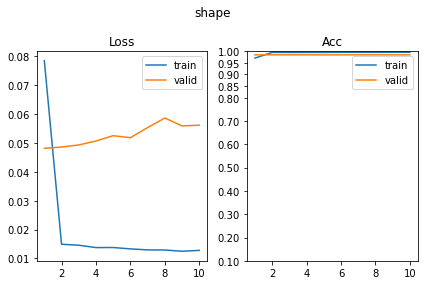

[326/630] scale      SUP_[FCN16i223o64_d128]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 49.67it/s, loss=0.712, acc=0.643]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 114.25it/s, loss=0.756, acc=0.659]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 44.44it/s, loss=0.693, acc=0.676]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 69.82it/s, loss=0.646, acc=0.693]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 52.69it/s, loss=0.619, acc=0.717]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 120.65it/s, loss=0.577, acc=0.729]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 43.63it/s, loss=0.595, acc=0.738]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 103.82it/s, loss=0.576, acc=0.737]    

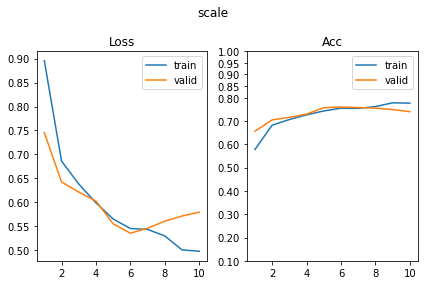

[327/630] color      SUP_[FCN16i223o64_d128]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 46.81it/s, loss=2.02, acc=0.186]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 119.09it/s, loss=2.05, acc=0.193]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 49.15it/s, loss=2, acc=0.187]                                              
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 118.50it/s, loss=2.03, acc=0.185]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 44.79it/s, loss=1.96, acc=0.221]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 119.49it/s, loss=1.95, acc=0.222]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 46.35it/s, loss=1.94, acc=0.239]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 114.20it/s, loss=1.96, acc=0.256]     

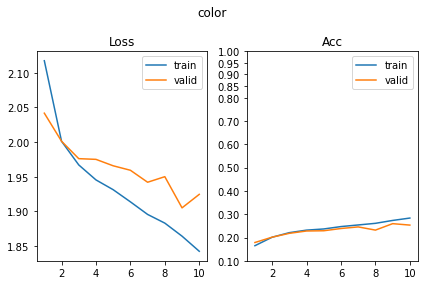

[328/630] angle      SUP_[FCN16i223o64_d128]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 45.60it/s, loss=2.06, acc=0.29]                                            
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 119.52it/s, loss=2.33, acc=0.246]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 53.58it/s, loss=1.57, acc=0.41]                                            
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 71.58it/s, loss=1.74, acc=0.359]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 53.55it/s, loss=1.35, acc=0.469]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 99.15it/s, loss=1.53, acc=0.395]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 44.15it/s, loss=1.28, acc=0.502]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 118.94it/s, loss=1.49, acc=0.412]     

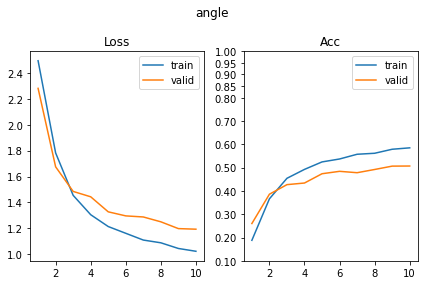

[329/630] py         SUP_[FCN16i223o64_d128]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 46.03it/s, loss=1.16, acc=0.443]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 111.97it/s, loss=1.23, acc=0.4]                                              
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 42.74it/s, loss=1.02, acc=0.539]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 116.74it/s, loss=1.02, acc=0.551]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 48.94it/s, loss=0.814, acc=0.671]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 115.47it/s, loss=0.868, acc=0.6]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 47.68it/s, loss=0.781, acc=0.666]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 116.26it/s, loss=0.733, acc=0.666]    

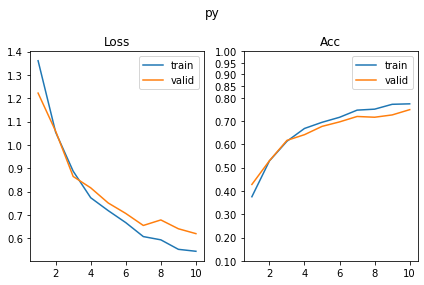

[330/630] px         SUP_[FCN16i223o64_d128]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 36.97it/s, loss=1.24, acc=0.44]                                            
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 83.06it/s, loss=1.25, acc=0.432]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 34.43it/s, loss=0.998, acc=0.554]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 42.63it/s, loss=0.997, acc=0.556]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 20.05it/s, loss=0.885, acc=0.581]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 61.71it/s, loss=0.928, acc=0.588]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 20.63it/s, loss=0.711, acc=0.669]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 49.42it/s, loss=0.699, acc=0.676]     

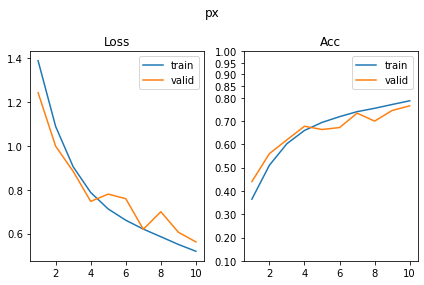

SUP_[FCN16i223o64_d128]_target_[scale]
[331/630] shape      SUP_[FCN16i223o64_d128]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 32.31it/s, loss=0.715, acc=0.733]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 104.49it/s, loss=1.16, acc=0.554]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 47.25it/s, loss=0.526, acc=0.806]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 95.22it/s, loss=0.712, acc=0.702]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 45.26it/s, loss=0.455, acc=0.837]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 117.07it/s, loss=0.626, acc=0.744]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 45.00it/s, loss=0.395, acc=0.852]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 116.72it/s, loss=0.487, acc=0.837]    

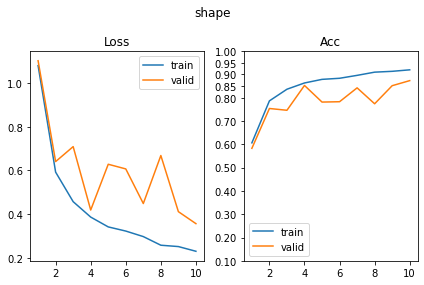

[332/630] scale      SUP_[FCN16i223o64_d128]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 52.79it/s, loss=0.0191, acc=0.993]                                         
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 71.39it/s, loss=0.201, acc=0.941]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 54.69it/s, loss=0.027, acc=0.987]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 119.24it/s, loss=0.17, acc=0.949]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 46.42it/s, loss=0.018, acc=0.99]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 120.70it/s, loss=0.154, acc=0.963]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 44.98it/s, loss=0.0121, acc=0.993]                                         
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 113.11it/s, loss=0.205, acc=0.946]    

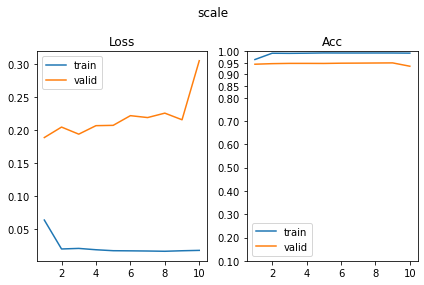

[333/630] color      SUP_[FCN16i223o64_d128]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 30.53it/s, loss=1.9, acc=0.221]                                            
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 72.01it/s, loss=1.99, acc=0.193]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 33.34it/s, loss=1.94, acc=0.205]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 51.74it/s, loss=1.95, acc=0.207]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 35.27it/s, loss=1.84, acc=0.285]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 80.22it/s, loss=1.91, acc=0.224]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 33.13it/s, loss=1.79, acc=0.261]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 63.02it/s, loss=1.99, acc=0.232]      

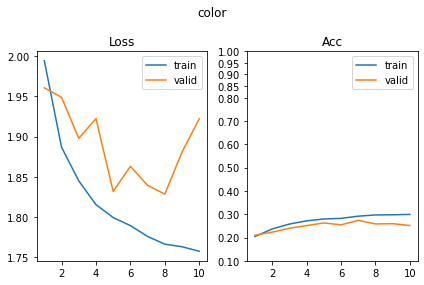

[334/630] angle      SUP_[FCN16i223o64_d128]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 18.06it/s, loss=2.35, acc=0.231]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 50.48it/s, loss=2.56, acc=0.188]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:01<00:00, 17.89it/s, loss=1.96, acc=0.362]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 56.72it/s, loss=2.14, acc=0.329]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:01<00:00, 20.06it/s, loss=1.7, acc=0.407]                                            
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 54.58it/s, loss=1.94, acc=0.346]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:01<00:00, 31.20it/s, loss=1.49, acc=0.461]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 63.03it/s, loss=1.69, acc=0.427]      

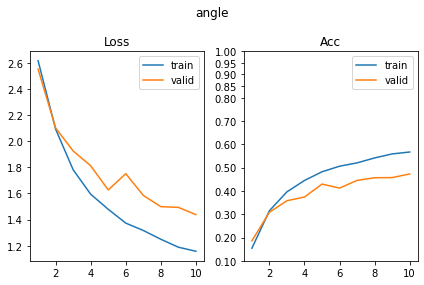

[335/630] py         SUP_[FCN16i223o64_d128]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:01<00:00, 30.83it/s, loss=0.855, acc=0.638]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 45.77it/s, loss=1.04, acc=0.566]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 34.62it/s, loss=0.725, acc=0.686]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 68.29it/s, loss=0.936, acc=0.578]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 34.95it/s, loss=0.625, acc=0.754]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 78.59it/s, loss=0.78, acc=0.668]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 35.37it/s, loss=0.637, acc=0.744]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 91.29it/s, loss=0.702, acc=0.71]      

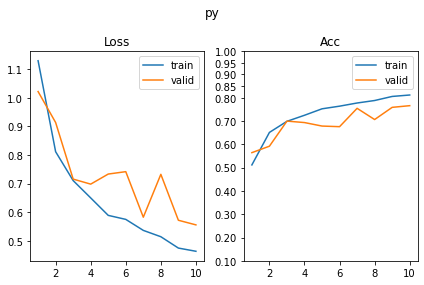

[336/630] px         SUP_[FCN16i223o64_d128]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 47.72it/s, loss=0.842, acc=0.66]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 110.95it/s, loss=1.09, acc=0.502]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 51.82it/s, loss=0.791, acc=0.663]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 71.14it/s, loss=0.865, acc=0.585]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 45.01it/s, loss=0.762, acc=0.676]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 116.67it/s, loss=0.892, acc=0.629]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 43.56it/s, loss=0.682, acc=0.725]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 119.30it/s, loss=0.708, acc=0.72]     

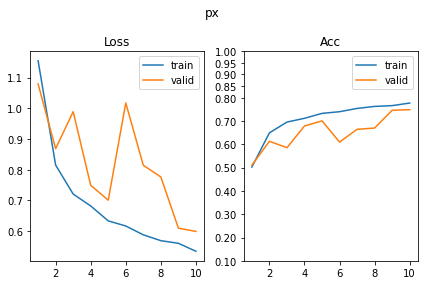

SUP_[FCN16i223o64_d128]_target_[color]
[337/630] shape      SUP_[FCN16i223o64_d128]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 43.37it/s, loss=1.6, acc=0.344]                                            
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 115.38it/s, loss=1.76, acc=0.237]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 39.19it/s, loss=1.37, acc=0.406]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 115.12it/s, loss=1.72, acc=0.307]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 46.88it/s, loss=1.24, acc=0.466]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 117.94it/s, loss=1.44, acc=0.398]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 49.49it/s, loss=1.26, acc=0.461]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 116.35it/s, loss=1.23, acc=0.461]     

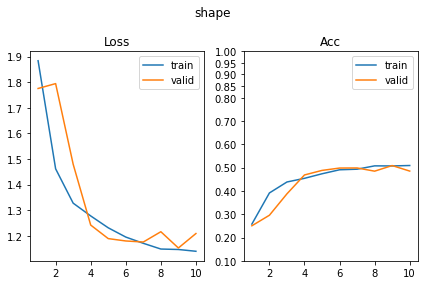

[338/630] scale      SUP_[FCN16i223o64_d128]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 48.86it/s, loss=1.1, acc=0.342]                                            
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 119.67it/s, loss=1.12, acc=0.334]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 50.55it/s, loss=1.08, acc=0.414]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 74.19it/s, loss=1.1, acc=0.388]                                              
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 52.70it/s, loss=1.09, acc=0.415]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 119.83it/s, loss=1.08, acc=0.42]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 49.02it/s, loss=1.09, acc=0.384]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 118.54it/s, loss=1.08, acc=0.42]      

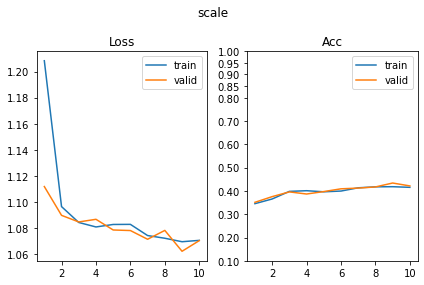

[339/630] color      SUP_[FCN16i223o64_d128]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 38.42it/s, loss=0.000564, acc=1]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 116.93it/s, loss=0.000535, acc=1]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 45.12it/s, loss=0.000329, acc=1]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 82.72it/s, loss=0.000327, acc=1]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 48.15it/s, loss=0.000203, acc=1]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 104.48it/s, loss=0.00044, acc=1]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 47.73it/s, loss=0.000168, acc=1]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 119.82it/s, loss=0.000203, acc=1]     

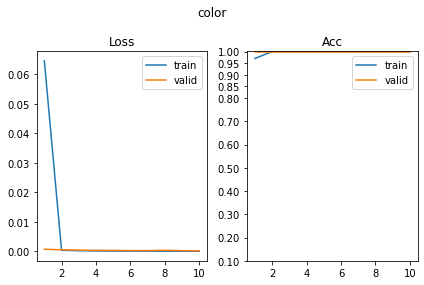

[340/630] angle      SUP_[FCN16i223o64_d128]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 46.03it/s, loss=2.8, acc=0.0651]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 112.90it/s, loss=2.8, acc=0.0585]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 50.26it/s, loss=2.81, acc=0.0505]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 71.30it/s, loss=2.84, acc=0.0463]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 46.07it/s, loss=2.81, acc=0.0684]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 74.92it/s, loss=2.79, acc=0.0634]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 41.99it/s, loss=2.78, acc=0.0603]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 119.16it/s, loss=2.78, acc=0.0756]    

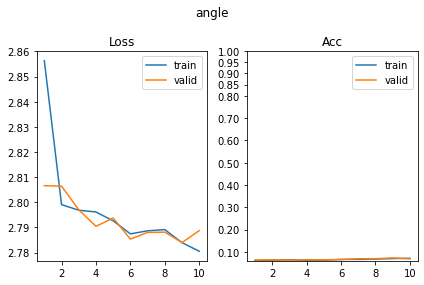

[341/630] py         SUP_[FCN16i223o64_d128]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 44.29it/s, loss=1.39, acc=0.272]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 101.70it/s, loss=1.39, acc=0.246]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 45.01it/s, loss=1.39, acc=0.256]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 114.58it/s, loss=1.4, acc=0.263]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 43.53it/s, loss=1.37, acc=0.301]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 117.57it/s, loss=1.37, acc=0.302]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 46.04it/s, loss=1.37, acc=0.308]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 118.86it/s, loss=1.36, acc=0.339]     

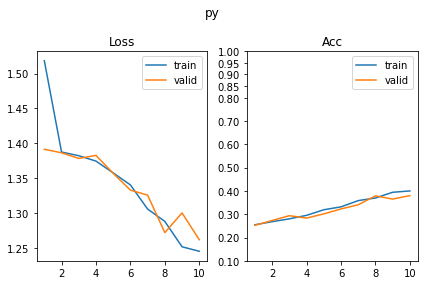

[342/630] px         SUP_[FCN16i223o64_d128]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 50.32it/s, loss=1.4, acc=0.277]                                            
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 108.26it/s, loss=1.39, acc=0.256]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 42.79it/s, loss=1.37, acc=0.292]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 68.87it/s, loss=1.39, acc=0.276]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 47.47it/s, loss=1.37, acc=0.283]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 79.94it/s, loss=1.4, acc=0.273]                                              
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 40.71it/s, loss=1.33, acc=0.347]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 116.29it/s, loss=1.37, acc=0.271]     

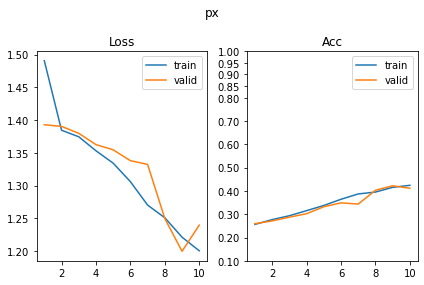

SUP_[FCN16i223o64_d128]_target_[angle]
[343/630] shape      SUP_[FCN16i223o64_d128]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 49.35it/s, loss=0.285, acc=0.888]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 119.67it/s, loss=0.325, acc=0.893]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 50.02it/s, loss=0.166, acc=0.94]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 119.13it/s, loss=0.225, acc=0.932]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 49.73it/s, loss=0.201, acc=0.912]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 113.49it/s, loss=0.237, acc=0.922]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 50.08it/s, loss=0.135, acc=0.941]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 121.24it/s, loss=0.188, acc=0.929]    

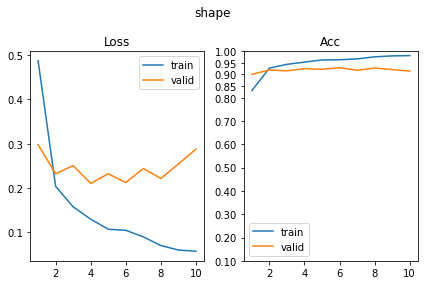

[344/630] scale      SUP_[FCN16i223o64_d128]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 49.08it/s, loss=1.03, acc=0.453]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 103.20it/s, loss=1.04, acc=0.449]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 44.01it/s, loss=0.977, acc=0.521]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 60.14it/s, loss=0.969, acc=0.524]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 49.41it/s, loss=0.95, acc=0.52]                                            
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 118.22it/s, loss=0.938, acc=0.534]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 48.88it/s, loss=0.87, acc=0.599]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 117.88it/s, loss=0.948, acc=0.537]    

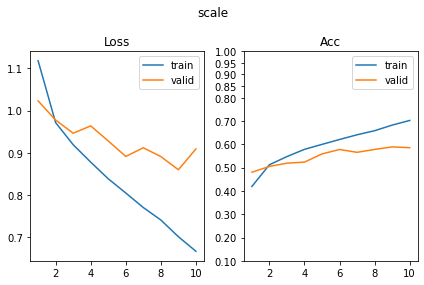

[345/630] color      SUP_[FCN16i223o64_d128]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 49.50it/s, loss=1.79, acc=0.287]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 117.13it/s, loss=1.81, acc=0.278]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 46.95it/s, loss=1.7, acc=0.355]                                            
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 116.64it/s, loss=1.82, acc=0.31]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 48.38it/s, loss=1.62, acc=0.384]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 117.70it/s, loss=1.75, acc=0.324]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 39.16it/s, loss=1.62, acc=0.368]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 113.42it/s, loss=1.68, acc=0.371]     

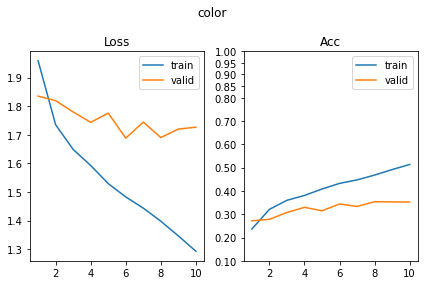

[346/630] angle      SUP_[FCN16i223o64_d128]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 49.87it/s, loss=0.284, acc=0.896]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 82.52it/s, loss=1.29, acc=0.602]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 38.43it/s, loss=0.306, acc=0.888]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 66.05it/s, loss=1.38, acc=0.563]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 51.12it/s, loss=0.246, acc=0.902]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 82.26it/s, loss=1.56, acc=0.576]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 42.81it/s, loss=0.227, acc=0.927]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 100.14it/s, loss=1.76, acc=0.522]     

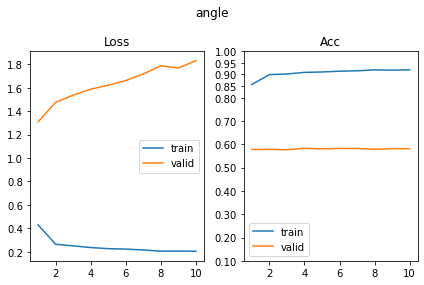

[347/630] py         SUP_[FCN16i223o64_d128]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 40.02it/s, loss=1.14, acc=0.469]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 108.97it/s, loss=1.17, acc=0.451]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 43.50it/s, loss=1.03, acc=0.554]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 103.78it/s, loss=1.04, acc=0.5]                                              
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 46.97it/s, loss=0.926, acc=0.625]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 87.64it/s, loss=1.03, acc=0.554]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 44.92it/s, loss=0.758, acc=0.661]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 118.97it/s, loss=0.837, acc=0.663]    

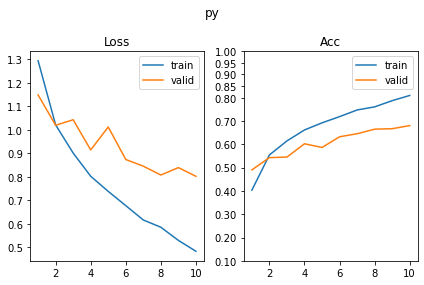

[348/630] px         SUP_[FCN16i223o64_d128]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 47.37it/s, loss=1.21, acc=0.456]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 118.07it/s, loss=1.21, acc=0.463]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 53.17it/s, loss=1.05, acc=0.528]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 69.40it/s, loss=1.2, acc=0.454]                                              
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 51.28it/s, loss=0.968, acc=0.583]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 115.10it/s, loss=1.07, acc=0.512]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 50.33it/s, loss=0.893, acc=0.611]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 118.43it/s, loss=1.02, acc=0.541]     

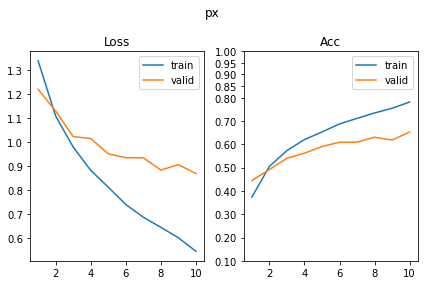

SUP_[FCN16i223o64_d128]_target_[py]
[349/630] shape      SUP_[FCN16i223o64_d128]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 40.60it/s, loss=0.702, acc=0.723]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 118.43it/s, loss=0.948, acc=0.644]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 50.35it/s, loss=0.514, acc=0.788]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 118.46it/s, loss=0.581, acc=0.78]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 42.94it/s, loss=0.392, acc=0.853]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 120.35it/s, loss=0.438, acc=0.832]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 50.93it/s, loss=0.43, acc=0.819]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 116.24it/s, loss=0.474, acc=0.82]     

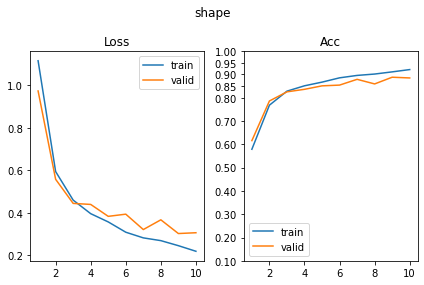

[350/630] scale      SUP_[FCN16i223o64_d128]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 49.22it/s, loss=0.87, acc=0.573]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 109.53it/s, loss=0.906, acc=0.571]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 51.38it/s, loss=0.73, acc=0.674]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 70.17it/s, loss=0.801, acc=0.624]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 50.43it/s, loss=0.669, acc=0.697]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 114.53it/s, loss=0.807, acc=0.622]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 46.73it/s, loss=0.621, acc=0.731]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 114.03it/s, loss=0.804, acc=0.627]    

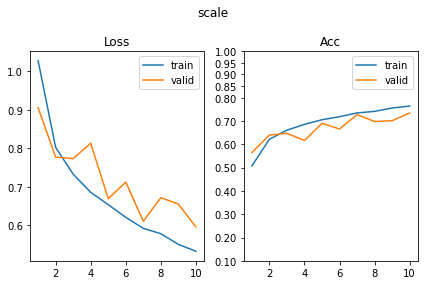

[351/630] color      SUP_[FCN16i223o64_d128]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 44.26it/s, loss=1.96, acc=0.228]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 119.34it/s, loss=2.02, acc=0.188]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 49.36it/s, loss=1.88, acc=0.267]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 120.13it/s, loss=1.94, acc=0.229]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 48.10it/s, loss=1.81, acc=0.313]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 118.88it/s, loss=1.93, acc=0.246]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 49.23it/s, loss=1.8, acc=0.275]                                            
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 116.82it/s, loss=1.84, acc=0.31]      

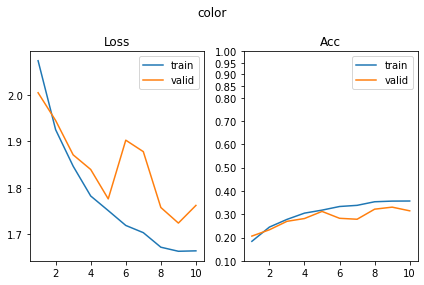

[352/630] angle      SUP_[FCN16i223o64_d128]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 46.26it/s, loss=2.37, acc=0.194]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 118.30it/s, loss=2.48, acc=0.207]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 46.22it/s, loss=2.03, acc=0.314]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 67.09it/s, loss=2.16, acc=0.273]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 45.23it/s, loss=1.8, acc=0.41]                                             
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 106.73it/s, loss=1.93, acc=0.334]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 43.07it/s, loss=1.58, acc=0.467]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 95.68it/s, loss=1.84, acc=0.371]      

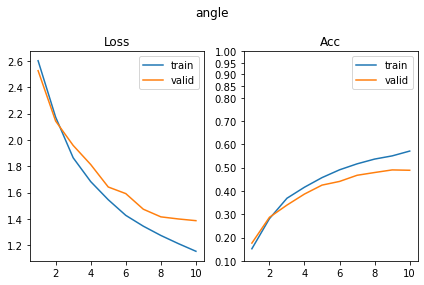

[353/630] py         SUP_[FCN16i223o64_d128]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 40.85it/s, loss=0.0149, acc=0.993]                                         
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 82.70it/s, loss=0.08, acc=0.976]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 40.58it/s, loss=0.017, acc=0.993]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 107.39it/s, loss=0.108, acc=0.961]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 40.36it/s, loss=0.0222, acc=0.989]                                         
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 81.66it/s, loss=0.0597, acc=0.98]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 41.61it/s, loss=0.0184, acc=0.99]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 114.79it/s, loss=0.0683, acc=0.98]    

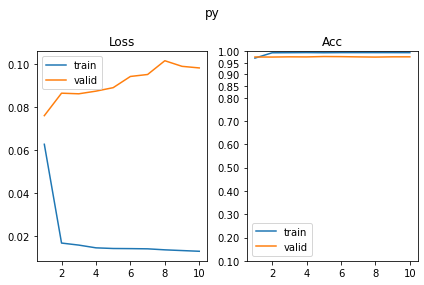

[354/630] px         SUP_[FCN16i223o64_d128]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 42.80it/s, loss=1.35, acc=0.331]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 94.89it/s, loss=1.36, acc=0.305]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 47.84it/s, loss=1.25, acc=0.428]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 69.92it/s, loss=1.31, acc=0.339]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 38.72it/s, loss=1.18, acc=0.445]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 77.93it/s, loss=1.24, acc=0.405]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 38.16it/s, loss=1.18, acc=0.459]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 107.70it/s, loss=1.25, acc=0.434]     

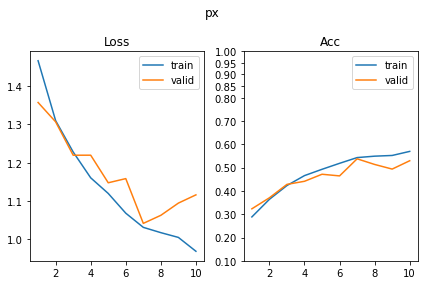

SUP_[FCN16i223o64_d128]_target_[px]
[355/630] shape      SUP_[FCN16i223o64_d128]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 44.95it/s, loss=0.754, acc=0.736]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 108.72it/s, loss=1.11, acc=0.551]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 43.86it/s, loss=0.552, acc=0.777]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 99.75it/s, loss=0.565, acc=0.79]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 37.62it/s, loss=0.486, acc=0.813]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 107.01it/s, loss=0.478, acc=0.827]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 40.44it/s, loss=0.423, acc=0.832]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 114.01it/s, loss=0.512, acc=0.8]      

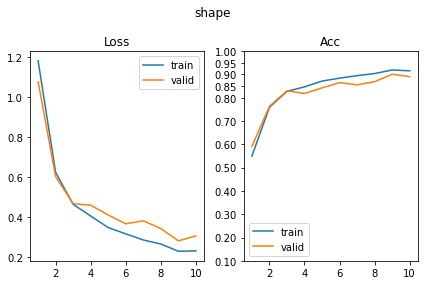

[356/630] scale      SUP_[FCN16i223o64_d128]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 39.54it/s, loss=0.913, acc=0.58]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 100.89it/s, loss=0.976, acc=0.5]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 48.46it/s, loss=0.753, acc=0.674]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 68.91it/s, loss=0.855, acc=0.566]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 48.37it/s, loss=0.695, acc=0.697]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 107.91it/s, loss=0.721, acc=0.693]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 44.27it/s, loss=0.677, acc=0.671]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 101.71it/s, loss=0.783, acc=0.622]    

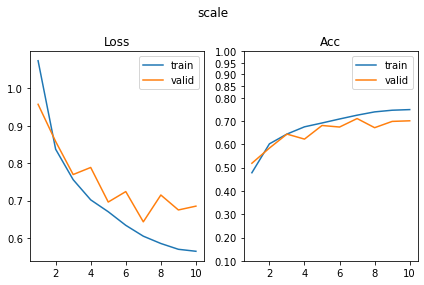

[357/630] color      SUP_[FCN16i223o64_d128]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 36.15it/s, loss=2.05, acc=0.143]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 85.60it/s, loss=2.02, acc=0.166]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 45.95it/s, loss=1.99, acc=0.186]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 108.65it/s, loss=1.96, acc=0.185]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 46.68it/s, loss=1.99, acc=0.205]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 110.20it/s, loss=2.02, acc=0.2]                                              
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 44.56it/s, loss=1.94, acc=0.223]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 111.53it/s, loss=1.93, acc=0.212]     

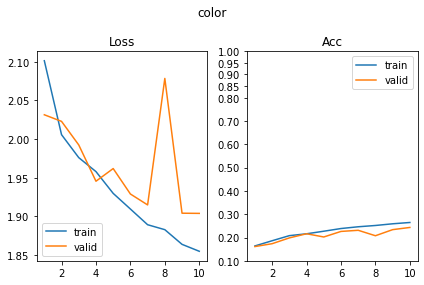

[358/630] angle      SUP_[FCN16i223o64_d128]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 37.02it/s, loss=2.49, acc=0.147]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 115.72it/s, loss=2.59, acc=0.151]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 44.11it/s, loss=2.19, acc=0.288]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 68.03it/s, loss=2.33, acc=0.224]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 46.52it/s, loss=1.91, acc=0.358]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 100.74it/s, loss=2.14, acc=0.298]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 46.62it/s, loss=1.68, acc=0.399]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 111.05it/s, loss=1.93, acc=0.31]      

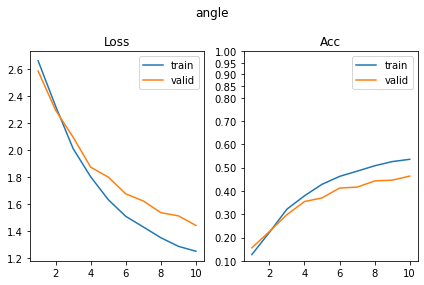

[359/630] py         SUP_[FCN16i223o64_d128]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 42.43it/s, loss=1.36, acc=0.293]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 115.13it/s, loss=1.38, acc=0.259]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 39.07it/s, loss=1.32, acc=0.358]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 80.27it/s, loss=1.34, acc=0.341]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 36.46it/s, loss=1.22, acc=0.436]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 80.42it/s, loss=1.24, acc=0.407]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 36.30it/s, loss=1.15, acc=0.511]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 79.13it/s, loss=1.13, acc=0.471]      

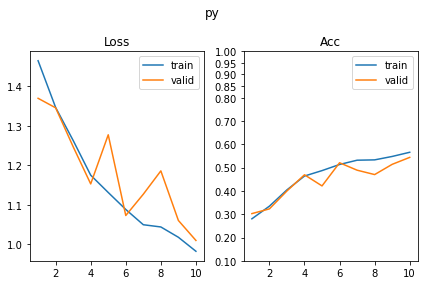

[360/630] px         SUP_[FCN16i223o64_d128]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 42.65it/s, loss=0.00672, acc=0.997]                                        
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 99.69it/s, loss=0.0616, acc=0.978]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 45.61it/s, loss=0.0117, acc=0.995]                                         
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 67.41it/s, loss=0.0816, acc=0.978]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 41.16it/s, loss=0.0124, acc=0.995]                                         
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 80.97it/s, loss=0.062, acc=0.983]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 37.47it/s, loss=0.0134, acc=0.993]                                         
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 81.20it/s, loss=0.0724, acc=0.976]    

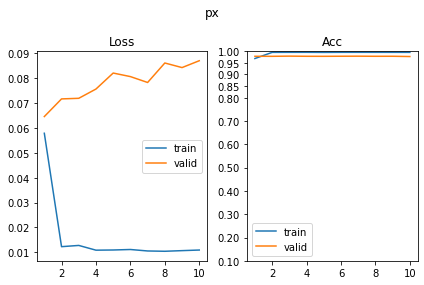

SUP_[FCN32i223o128_d8]_target_[shape]
[361/630] shape      SUP_[FCN32i223o128_d8]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 45.19it/s, loss=0.0114, acc=0.997]                                         
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 113.18it/s, loss=0.0523, acc=0.985]                                          
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 42.87it/s, loss=0.0134, acc=0.993]                                         
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 106.48it/s, loss=0.0212, acc=0.99]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 41.48it/s, loss=0.00552, acc=0.998]                                        
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 113.19it/s, loss=0.0217, acc=0.99]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 46.84it/s, loss=0.0164, acc=0.992]                                         
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 110.48it/s, loss=0.0429, acc=0.988]   

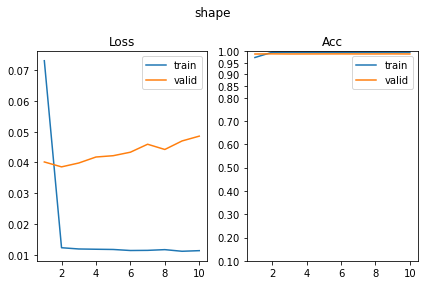

[362/630] scale      SUP_[FCN32i223o128_d8]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 45.86it/s, loss=1.03, acc=0.469]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 117.29it/s, loss=1.05, acc=0.454]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 49.07it/s, loss=1.04, acc=0.464]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 68.24it/s, loss=1.01, acc=0.498]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 44.77it/s, loss=1.06, acc=0.422]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 99.14it/s, loss=1.03, acc=0.456]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 40.49it/s, loss=1.01, acc=0.503]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 115.79it/s, loss=0.987, acc=0.512]    

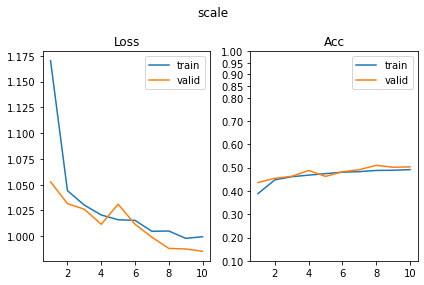

[363/630] color      SUP_[FCN32i223o128_d8]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 41.29it/s, loss=2.06, acc=0.151]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 84.72it/s, loss=2.06, acc=0.163]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 44.98it/s, loss=2.05, acc=0.147]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 98.91it/s, loss=2.02, acc=0.18]                                              
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 39.71it/s, loss=2.03, acc=0.195]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 94.93it/s, loss=2.01, acc=0.21]                                              
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 45.61it/s, loss=1.99, acc=0.2]                                             
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 112.17it/s, loss=1.98, acc=0.222]     

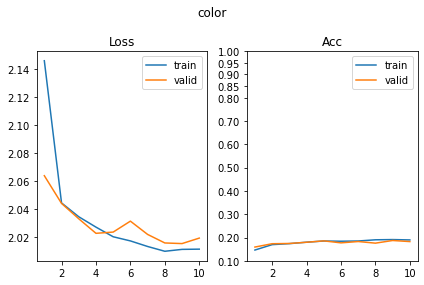

[364/630] angle      SUP_[FCN32i223o128_d8]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 40.21it/s, loss=2.73, acc=0.101]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 115.04it/s, loss=2.74, acc=0.115]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 45.21it/s, loss=2.71, acc=0.103]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 62.48it/s, loss=2.74, acc=0.102]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 47.58it/s, loss=2.69, acc=0.114]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 119.94it/s, loss=2.64, acc=0.124]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 45.41it/s, loss=2.64, acc=0.104]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 90.57it/s, loss=2.62, acc=0.115]      

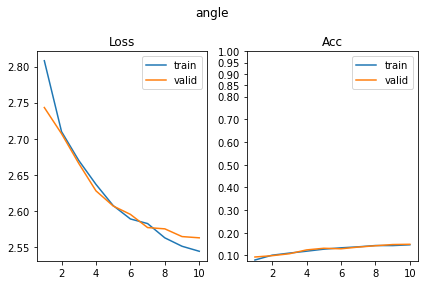

[365/630] py         SUP_[FCN32i223o128_d8]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 45.62it/s, loss=1.38, acc=0.329]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 102.94it/s, loss=1.38, acc=0.254]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 45.05it/s, loss=1.37, acc=0.295]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 119.38it/s, loss=1.38, acc=0.273]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 46.33it/s, loss=1.36, acc=0.349]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 84.56it/s, loss=1.36, acc=0.346]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 38.21it/s, loss=1.35, acc=0.306]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 84.15it/s, loss=1.38, acc=0.32]       

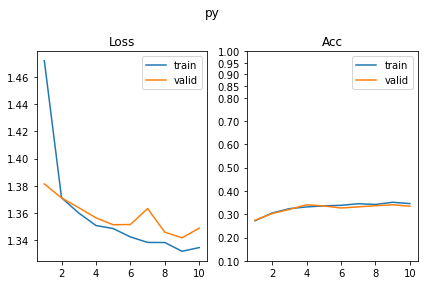

[366/630] px         SUP_[FCN32i223o128_d8]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 48.75it/s, loss=1.37, acc=0.295]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 117.42it/s, loss=1.37, acc=0.278]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 51.30it/s, loss=1.36, acc=0.342]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 69.95it/s, loss=1.36, acc=0.3]                                               
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 51.07it/s, loss=1.36, acc=0.319]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 116.37it/s, loss=1.34, acc=0.371]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 45.72it/s, loss=1.34, acc=0.309]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 97.56it/s, loss=1.34, acc=0.332]      

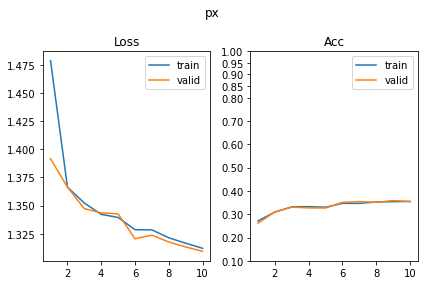

SUP_[FCN32i223o128_d8]_target_[scale]
[367/630] shape      SUP_[FCN32i223o128_d8]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 42.44it/s, loss=1.75, acc=0.3]                                             
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 119.13it/s, loss=1.74, acc=0.31]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 48.55it/s, loss=1.69, acc=0.34]                                            
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 85.17it/s, loss=1.75, acc=0.288]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 41.58it/s, loss=1.64, acc=0.375]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 81.91it/s, loss=1.67, acc=0.327]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 40.03it/s, loss=1.61, acc=0.349]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 121.93it/s, loss=1.65, acc=0.327]     

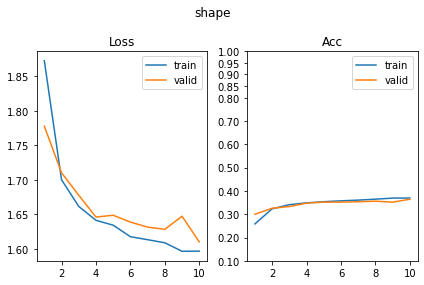

[368/630] scale      SUP_[FCN32i223o128_d8]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 43.60it/s, loss=0.0132, acc=0.993]                                         
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 120.50it/s, loss=0.0729, acc=0.978]                                          
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 48.72it/s, loss=0.00254, acc=0.998]                                        
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 70.32it/s, loss=0.0998, acc=0.971]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 46.98it/s, loss=0.01, acc=0.997]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 114.68it/s, loss=0.105, acc=0.968]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 42.90it/s, loss=0.00422, acc=1]                                            
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 117.63it/s, loss=0.119, acc=0.976]    

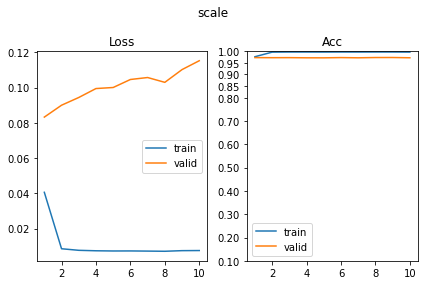

[369/630] color      SUP_[FCN32i223o128_d8]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 42.22it/s, loss=2.03, acc=0.192]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 121.13it/s, loss=2.05, acc=0.171]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 47.00it/s, loss=2.02, acc=0.173]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 120.38it/s, loss=2.02, acc=0.166]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 46.27it/s, loss=2.03, acc=0.174]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 83.48it/s, loss=2.03, acc=0.156]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 43.98it/s, loss=2.02, acc=0.184]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 112.71it/s, loss=2.05, acc=0.149]     

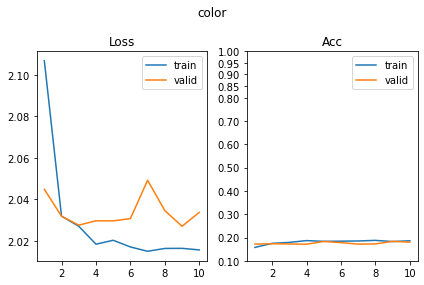

[370/630] angle      SUP_[FCN32i223o128_d8]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 44.14it/s, loss=2.77, acc=0.07]                                            
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 83.96it/s, loss=2.77, acc=0.0683]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 41.06it/s, loss=2.78, acc=0.0603]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 62.58it/s, loss=2.77, acc=0.0976]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 45.30it/s, loss=2.77, acc=0.0798]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 100.09it/s, loss=2.79, acc=0.0756]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 42.81it/s, loss=2.77, acc=0.0782]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 90.56it/s, loss=2.77, acc=0.0659]     

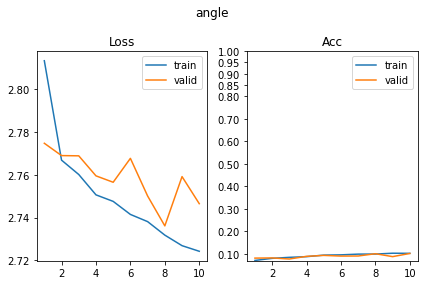

[371/630] py         SUP_[FCN32i223o128_d8]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 46.61it/s, loss=1.37, acc=0.292]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 97.82it/s, loss=1.36, acc=0.332]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 41.11it/s, loss=1.35, acc=0.311]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 104.44it/s, loss=1.35, acc=0.327]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 42.24it/s, loss=1.32, acc=0.365]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 91.89it/s, loss=1.34, acc=0.302]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 38.42it/s, loss=1.33, acc=0.316]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 85.05it/s, loss=1.31, acc=0.38]       

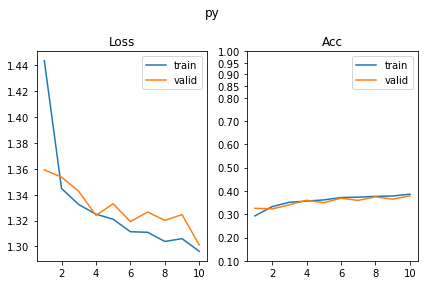

[372/630] px         SUP_[FCN32i223o128_d8]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 41.29it/s, loss=1.36, acc=0.303]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 115.73it/s, loss=1.39, acc=0.298]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 51.32it/s, loss=1.35, acc=0.311]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 54.14it/s, loss=1.35, acc=0.341]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 48.48it/s, loss=1.34, acc=0.353]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 81.73it/s, loss=1.36, acc=0.312]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 46.99it/s, loss=1.36, acc=0.324]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 120.43it/s, loss=1.33, acc=0.324]     

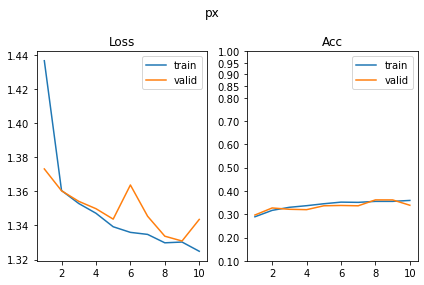

SUP_[FCN32i223o128_d8]_target_[color]
[373/630] shape      SUP_[FCN32i223o128_d8]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 42.47it/s, loss=1.75, acc=0.283]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 113.77it/s, loss=1.95, acc=0.159]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 39.13it/s, loss=1.69, acc=0.295]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 84.35it/s, loss=1.68, acc=0.293]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 42.64it/s, loss=1.73, acc=0.305]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 81.65it/s, loss=1.69, acc=0.317]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 41.69it/s, loss=1.63, acc=0.321]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 121.92it/s, loss=1.64, acc=0.322]     

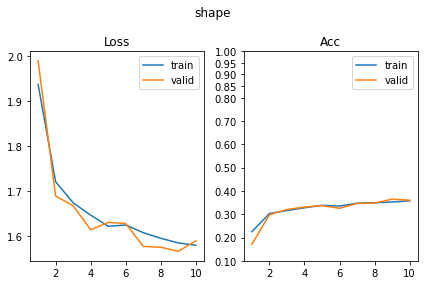

[374/630] scale      SUP_[FCN32i223o128_d8]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 47.03it/s, loss=1.1, acc=0.347]                                            
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 120.10it/s, loss=1.1, acc=0.356]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 45.73it/s, loss=1.1, acc=0.34]                                             
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 67.02it/s, loss=1.1, acc=0.38]                                               
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 45.16it/s, loss=1.09, acc=0.386]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 114.84it/s, loss=1.09, acc=0.349]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 40.29it/s, loss=1.08, acc=0.373]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 112.86it/s, loss=1.08, acc=0.341]     

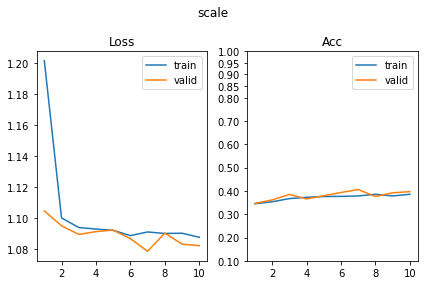

[375/630] color      SUP_[FCN32i223o128_d8]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 47.36it/s, loss=0.000965, acc=1]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 91.26it/s, loss=0.000651, acc=1]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 41.72it/s, loss=0.000426, acc=1]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 84.44it/s, loss=0.0084, acc=0.998]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 38.45it/s, loss=0.000356, acc=1]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 119.53it/s, loss=0.000526, acc=1]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 37.97it/s, loss=0.000203, acc=1]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 122.14it/s, loss=0.000279, acc=1]     

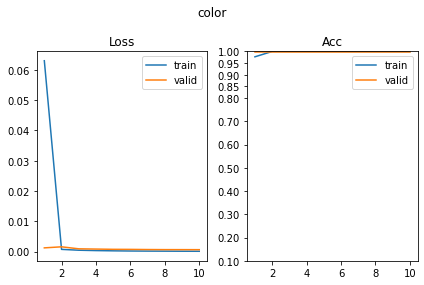

[376/630] angle      SUP_[FCN32i223o128_d8]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 43.36it/s, loss=2.82, acc=0.0651]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 118.21it/s, loss=2.8, acc=0.0756]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 46.61it/s, loss=2.81, acc=0.0635]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 70.17it/s, loss=2.8, acc=0.0854]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 45.13it/s, loss=2.79, acc=0.0554]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 82.92it/s, loss=2.81, acc=0.0439]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 45.22it/s, loss=2.79, acc=0.0651]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 116.52it/s, loss=2.79, acc=0.0585]    

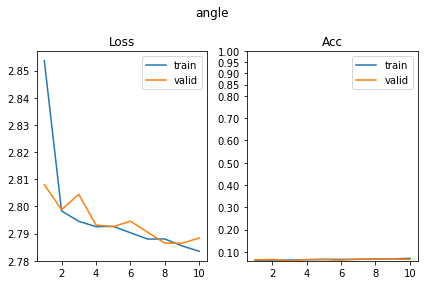

[377/630] py         SUP_[FCN32i223o128_d8]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 47.74it/s, loss=1.38, acc=0.3]                                             
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 120.45it/s, loss=1.38, acc=0.285]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 46.34it/s, loss=1.39, acc=0.27]                                            
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 83.15it/s, loss=1.36, acc=0.261]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 39.76it/s, loss=1.37, acc=0.329]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 89.24it/s, loss=1.37, acc=0.278]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 45.52it/s, loss=1.35, acc=0.332]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 117.92it/s, loss=1.36, acc=0.295]     

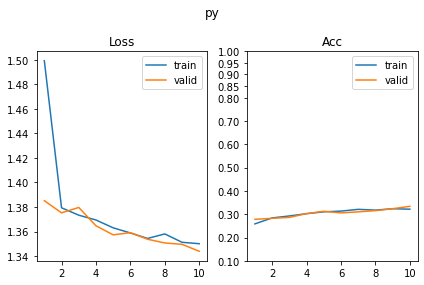

[378/630] px         SUP_[FCN32i223o128_d8]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 48.36it/s, loss=1.4, acc=0.283]                                            
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 101.75it/s, loss=1.41, acc=0.259]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 41.82it/s, loss=1.37, acc=0.29]                                            
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 70.62it/s, loss=1.37, acc=0.293]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 47.36it/s, loss=1.37, acc=0.293]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 120.67it/s, loss=1.38, acc=0.263]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 46.60it/s, loss=1.35, acc=0.314]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 117.90it/s, loss=1.37, acc=0.3]       

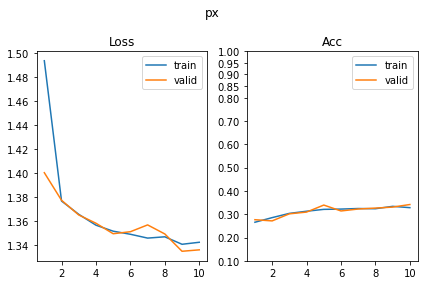

SUP_[FCN32i223o128_d8]_target_[angle]
[379/630] shape      SUP_[FCN32i223o128_d8]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 46.59it/s, loss=1.17, acc=0.505]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 120.93it/s, loss=1.17, acc=0.507]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 46.43it/s, loss=1.08, acc=0.523]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 117.70it/s, loss=0.946, acc=0.595]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 43.98it/s, loss=1.06, acc=0.581]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 115.83it/s, loss=1.02, acc=0.598]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 44.41it/s, loss=1.08, acc=0.542]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 116.17it/s, loss=0.952, acc=0.568]    

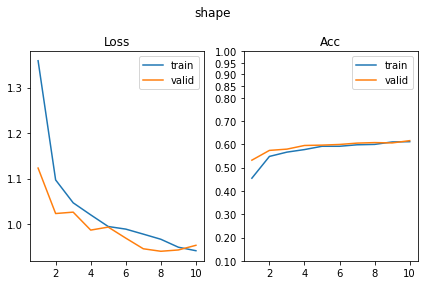

[380/630] scale      SUP_[FCN32i223o128_d8]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 48.09it/s, loss=1.1, acc=0.355]                                            
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 119.28it/s, loss=1.09, acc=0.351]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 51.04it/s, loss=1.1, acc=0.389]                                            
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 73.36it/s, loss=1.1, acc=0.351]                                              
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 47.51it/s, loss=1.08, acc=0.394]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 120.37it/s, loss=1.09, acc=0.39]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 46.90it/s, loss=1.09, acc=0.373]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 84.29it/s, loss=1.09, acc=0.373]      

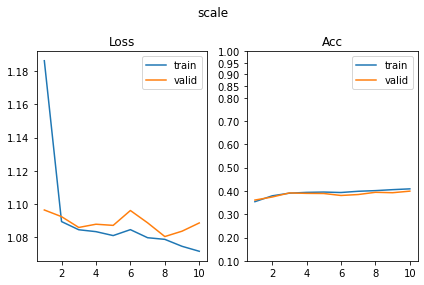

[381/630] color      SUP_[FCN32i223o128_d8]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 41.52it/s, loss=2.08, acc=0.122]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 97.46it/s, loss=2.07, acc=0.161]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 44.65it/s, loss=2.08, acc=0.15]                                            
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 116.44it/s, loss=2.05, acc=0.156]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 48.50it/s, loss=2.06, acc=0.171]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 117.13it/s, loss=2.08, acc=0.134]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 43.20it/s, loss=2.09, acc=0.119]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 85.19it/s, loss=2.09, acc=0.124]      

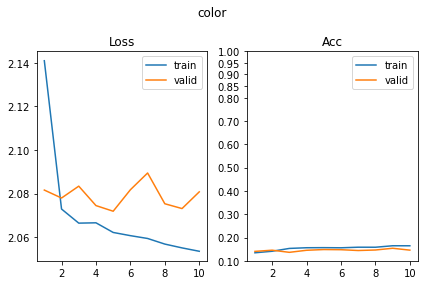

[382/630] angle      SUP_[FCN32i223o128_d8]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 43.59it/s, loss=0.124, acc=0.963]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 109.03it/s, loss=1.66, acc=0.58]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 47.09it/s, loss=0.157, acc=0.943]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 72.80it/s, loss=1.49, acc=0.617]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 50.46it/s, loss=0.125, acc=0.959]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 98.12it/s, loss=1.71, acc=0.588]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 40.98it/s, loss=0.13, acc=0.956]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 109.90it/s, loss=1.75, acc=0.576]     

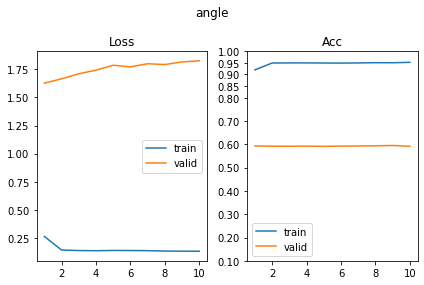

[383/630] py         SUP_[FCN32i223o128_d8]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 48.02it/s, loss=1.4, acc=0.248]                                            
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 118.63it/s, loss=1.38, acc=0.28]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 45.30it/s, loss=1.38, acc=0.287]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 120.45it/s, loss=1.38, acc=0.312]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 43.24it/s, loss=1.38, acc=0.279]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 113.27it/s, loss=1.38, acc=0.332]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 43.88it/s, loss=1.38, acc=0.308]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 84.83it/s, loss=1.39, acc=0.251]      

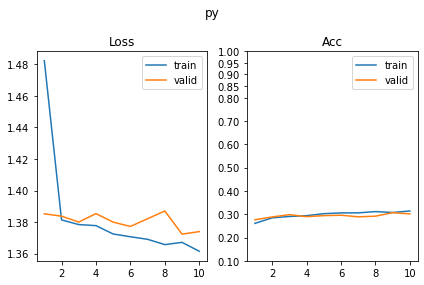

[384/630] px         SUP_[FCN32i223o128_d8]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 46.12it/s, loss=1.39, acc=0.261]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 96.91it/s, loss=1.38, acc=0.259]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 44.94it/s, loss=1.38, acc=0.272]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 57.96it/s, loss=1.4, acc=0.288]                                              
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 45.85it/s, loss=1.38, acc=0.285]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 119.28it/s, loss=1.4, acc=0.261]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 41.51it/s, loss=1.37, acc=0.288]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 109.25it/s, loss=1.37, acc=0.341]     

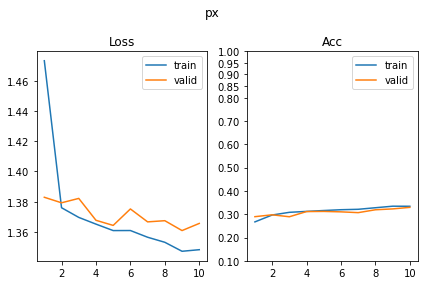

SUP_[FCN32i223o128_d8]_target_[py]
[385/630] shape      SUP_[FCN32i223o128_d8]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 44.61it/s, loss=1.77, acc=0.288]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 119.29it/s, loss=1.84, acc=0.241]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 43.60it/s, loss=1.71, acc=0.322]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 85.58it/s, loss=1.76, acc=0.285]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 39.87it/s, loss=1.7, acc=0.371]                                            
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 118.00it/s, loss=1.7, acc=0.337]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 39.44it/s, loss=1.6, acc=0.414]                                            
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 81.27it/s, loss=1.66, acc=0.354]      

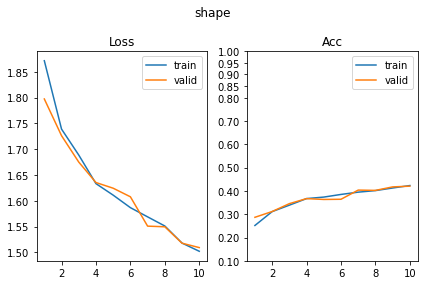

[386/630] scale      SUP_[FCN32i223o128_d8]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 42.63it/s, loss=1.04, acc=0.458]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 114.45it/s, loss=1.08, acc=0.466]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 42.44it/s, loss=1.01, acc=0.487]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 63.29it/s, loss=1.02, acc=0.49]                                              
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 43.86it/s, loss=1.02, acc=0.464]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 85.60it/s, loss=1, acc=0.488]                                                
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 41.55it/s, loss=1.01, acc=0.474]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 108.60it/s, loss=0.978, acc=0.51]     

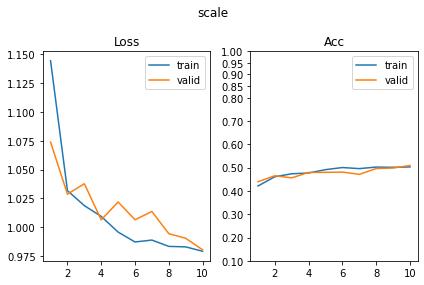

[387/630] color      SUP_[FCN32i223o128_d8]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 46.95it/s, loss=2.03, acc=0.169]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 82.70it/s, loss=2.05, acc=0.156]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 45.71it/s, loss=2.03, acc=0.178]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 101.94it/s, loss=2.04, acc=0.18]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 45.28it/s, loss=2.02, acc=0.195]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 84.47it/s, loss=1.99, acc=0.188]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 40.69it/s, loss=2.02, acc=0.195]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 124.29it/s, loss=1.99, acc=0.217]     

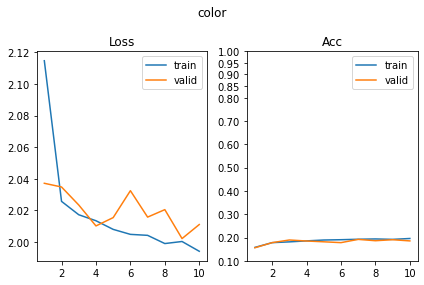

[388/630] angle      SUP_[FCN32i223o128_d8]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 43.68it/s, loss=2.75, acc=0.0879]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 114.69it/s, loss=2.74, acc=0.1]                                              
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 46.83it/s, loss=2.73, acc=0.103]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 70.59it/s, loss=2.74, acc=0.0854]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 41.61it/s, loss=2.7, acc=0.109]                                            
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 114.63it/s, loss=2.74, acc=0.1]                                              
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 45.57it/s, loss=2.68, acc=0.106]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 94.17it/s, loss=2.74, acc=0.102]      

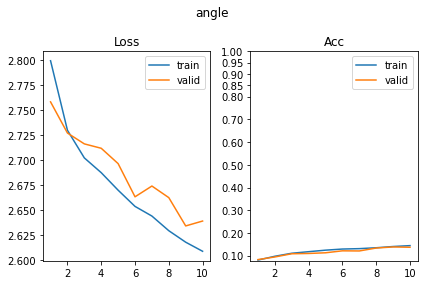

[389/630] py         SUP_[FCN32i223o128_d8]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 46.81it/s, loss=0.00815, acc=0.997]                                        
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 120.59it/s, loss=0.0714, acc=0.98]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 39.68it/s, loss=0.0162, acc=0.992]                                         
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 84.47it/s, loss=0.068, acc=0.976]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 40.10it/s, loss=0.0103, acc=0.998]                                         
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 85.56it/s, loss=0.0763, acc=0.98]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 40.65it/s, loss=0.0156, acc=0.992]                                         
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 98.04it/s, loss=0.0361, acc=0.985]    

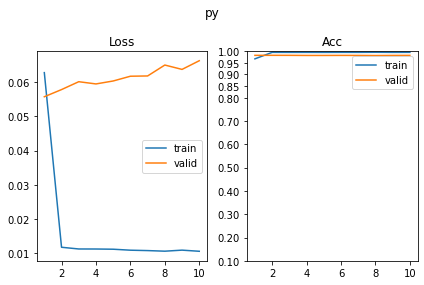

[390/630] px         SUP_[FCN32i223o128_d8]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 46.86it/s, loss=1.38, acc=0.275]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 119.21it/s, loss=1.37, acc=0.298]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 44.44it/s, loss=1.38, acc=0.293]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 69.97it/s, loss=1.38, acc=0.295]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 45.40it/s, loss=1.37, acc=0.293]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 115.08it/s, loss=1.37, acc=0.312]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 47.03it/s, loss=1.38, acc=0.267]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 119.57it/s, loss=1.39, acc=0.327]     

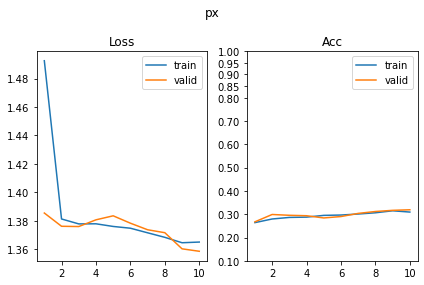

SUP_[FCN32i223o128_d8]_target_[px]
[391/630] shape      SUP_[FCN32i223o128_d8]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 47.68it/s, loss=1.78, acc=0.274]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 123.09it/s, loss=1.79, acc=0.315]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 43.55it/s, loss=1.7, acc=0.336]                                            
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 103.42it/s, loss=1.71, acc=0.344]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 46.37it/s, loss=1.69, acc=0.362]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 84.55it/s, loss=1.63, acc=0.376]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 42.95it/s, loss=1.59, acc=0.36]                                            
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 114.92it/s, loss=1.58, acc=0.368]     

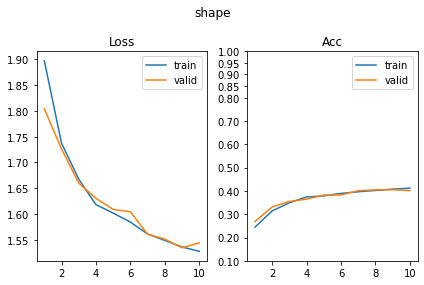

[392/630] scale      SUP_[FCN32i223o128_d8]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 47.50it/s, loss=1.09, acc=0.399]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 115.32it/s, loss=1.1, acc=0.349]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 46.16it/s, loss=1.06, acc=0.417]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 54.22it/s, loss=1.08, acc=0.383]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 46.71it/s, loss=1.04, acc=0.461]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 85.34it/s, loss=1.06, acc=0.422]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 43.01it/s, loss=1.01, acc=0.477]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 113.01it/s, loss=1.06, acc=0.441]     

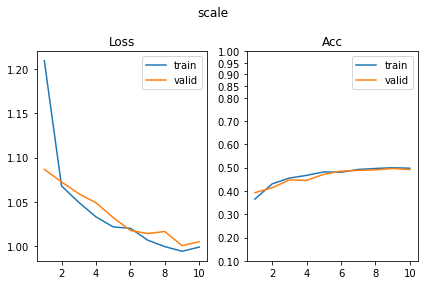

[393/630] color      SUP_[FCN32i223o128_d8]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 45.06it/s, loss=2.06, acc=0.129]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 114.10it/s, loss=2.07, acc=0.171]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 48.00it/s, loss=2.07, acc=0.143]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 120.45it/s, loss=2.02, acc=0.198]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 45.71it/s, loss=2.05, acc=0.169]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 113.53it/s, loss=2.04, acc=0.159]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 43.04it/s, loss=2.03, acc=0.178]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 112.13it/s, loss=2.02, acc=0.19]      

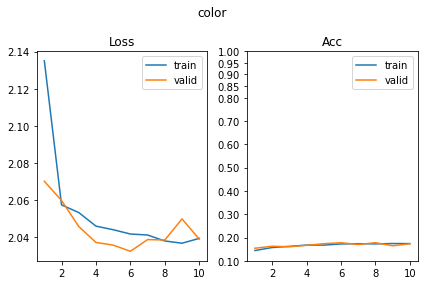

[394/630] angle      SUP_[FCN32i223o128_d8]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 44.89it/s, loss=2.73, acc=0.0847]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 90.46it/s, loss=2.76, acc=0.102]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 46.16it/s, loss=2.71, acc=0.101]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 65.96it/s, loss=2.76, acc=0.078]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 45.71it/s, loss=2.7, acc=0.134]                                            
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 104.40it/s, loss=2.67, acc=0.0951]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 41.39it/s, loss=2.74, acc=0.103]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 101.20it/s, loss=2.69, acc=0.139]     

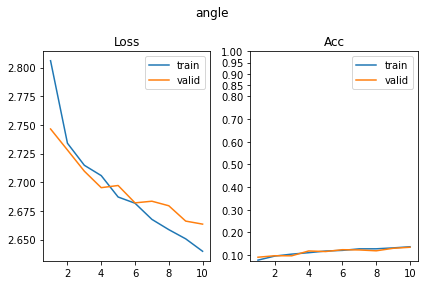

[395/630] py         SUP_[FCN32i223o128_d8]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 43.36it/s, loss=1.38, acc=0.298]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 115.80it/s, loss=1.4, acc=0.259]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 42.10it/s, loss=1.37, acc=0.313]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 88.74it/s, loss=1.37, acc=0.315]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 42.22it/s, loss=1.37, acc=0.313]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 98.96it/s, loss=1.37, acc=0.31]                                              
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 38.69it/s, loss=1.38, acc=0.306]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 83.84it/s, loss=1.37, acc=0.337]      

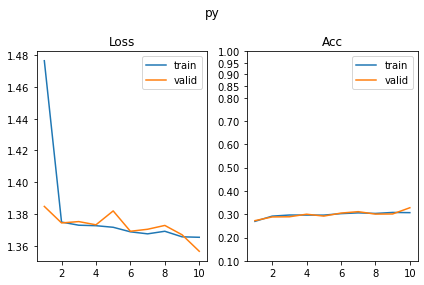

[396/630] px         SUP_[FCN32i223o128_d8]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 44.93it/s, loss=0.0225, acc=0.993]                                         
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 96.34it/s, loss=0.0418, acc=0.976]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 46.94it/s, loss=0.0149, acc=0.992]                                         
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 70.26it/s, loss=0.0323, acc=0.983]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 42.80it/s, loss=0.00372, acc=1]                                            
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 82.91it/s, loss=0.0546, acc=0.973]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 38.56it/s, loss=0.00719, acc=0.998]                                        
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 85.98it/s, loss=0.0684, acc=0.98]     

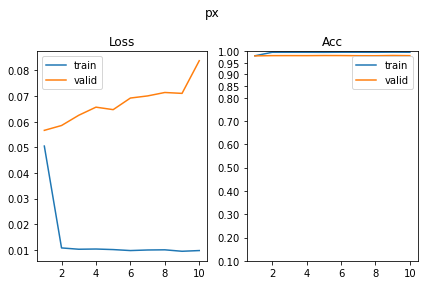

SUP_[FCN32i223o128_d16]_target_[shape]
[397/630] shape      SUP_[FCN32i223o128_d16]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 37.34it/s, loss=0.00773, acc=0.998]                                        
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 83.74it/s, loss=0.0684, acc=0.978]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 38.14it/s, loss=0.0251, acc=0.992]                                         
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 82.70it/s, loss=0.0352, acc=0.99]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 38.02it/s, loss=0.00788, acc=0.997]                                        
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 83.18it/s, loss=0.0232, acc=0.993]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 39.47it/s, loss=0.00463, acc=0.998]                                        
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 81.94it/s, loss=0.0213, acc=0.993]    

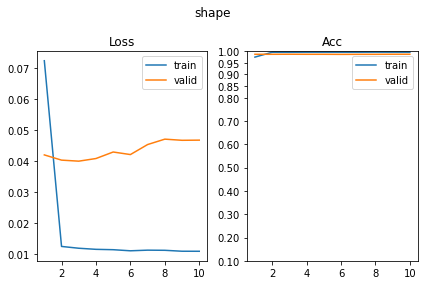

[398/630] scale      SUP_[FCN32i223o128_d16]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 46.33it/s, loss=1.07, acc=0.402]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 85.77it/s, loss=1.04, acc=0.454]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 46.14it/s, loss=1.02, acc=0.476]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 68.23it/s, loss=1.02, acc=0.471]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 44.90it/s, loss=1.02, acc=0.507]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 89.06it/s, loss=0.988, acc=0.483]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 42.03it/s, loss=0.954, acc=0.541]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 82.36it/s, loss=0.987, acc=0.495]     

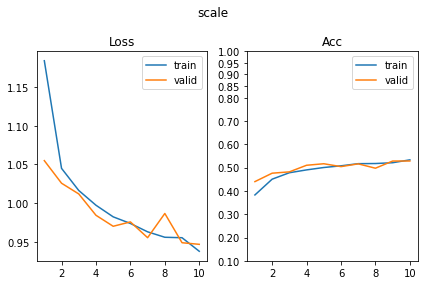

[399/630] color      SUP_[FCN32i223o128_d16]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 46.04it/s, loss=1.96, acc=0.221]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 112.29it/s, loss=2.04, acc=0.166]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 45.55it/s, loss=1.93, acc=0.226]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 113.39it/s, loss=1.94, acc=0.212]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 38.20it/s, loss=1.98, acc=0.215]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 82.75it/s, loss=1.95, acc=0.237]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 38.20it/s, loss=1.92, acc=0.235]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 85.05it/s, loss=2.05, acc=0.185]      

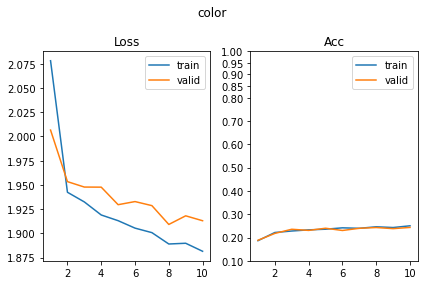

[400/630] angle      SUP_[FCN32i223o128_d16]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 47.83it/s, loss=2.7, acc=0.121]                                            
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 119.42it/s, loss=2.72, acc=0.117]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 40.89it/s, loss=2.6, acc=0.14]                                             
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 53.83it/s, loss=2.59, acc=0.166]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 41.60it/s, loss=2.43, acc=0.197]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 120.07it/s, loss=2.49, acc=0.18]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 46.70it/s, loss=2.35, acc=0.236]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 118.94it/s, loss=2.44, acc=0.188]     

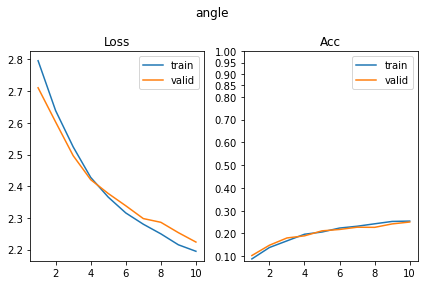

[401/630] py         SUP_[FCN32i223o128_d16]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 42.67it/s, loss=1.35, acc=0.324]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 90.49it/s, loss=1.35, acc=0.317]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 42.59it/s, loss=1.32, acc=0.362]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 94.24it/s, loss=1.35, acc=0.307]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 41.37it/s, loss=1.3, acc=0.383]                                            
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 100.34it/s, loss=1.32, acc=0.322]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 43.04it/s, loss=1.29, acc=0.397]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 120.77it/s, loss=1.27, acc=0.395]     

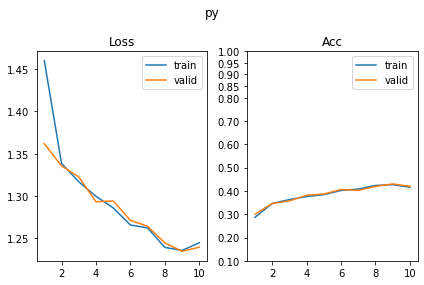

[402/630] px         SUP_[FCN32i223o128_d16]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 40.86it/s, loss=1.37, acc=0.269]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 113.95it/s, loss=1.38, acc=0.28]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 45.55it/s, loss=1.34, acc=0.313]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 68.70it/s, loss=1.35, acc=0.334]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 45.66it/s, loss=1.32, acc=0.334]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 112.77it/s, loss=1.36, acc=0.329]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 42.12it/s, loss=1.33, acc=0.303]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 110.08it/s, loss=1.34, acc=0.329]     

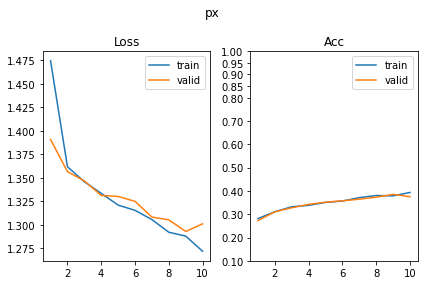

SUP_[FCN32i223o128_d16]_target_[scale]
[403/630] shape      SUP_[FCN32i223o128_d16]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 41.99it/s, loss=1.64, acc=0.347]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 85.10it/s, loss=1.69, acc=0.344]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 39.54it/s, loss=1.48, acc=0.43]                                            
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 93.97it/s, loss=1.43, acc=0.476]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 40.38it/s, loss=1.38, acc=0.476]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 85.55it/s, loss=1.4, acc=0.471]                                              
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 39.94it/s, loss=1.39, acc=0.458]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 85.19it/s, loss=1.35, acc=0.485]      

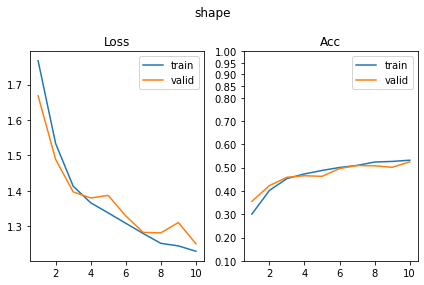

[404/630] scale      SUP_[FCN32i223o128_d16]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 48.05it/s, loss=0.0179, acc=0.99]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 83.03it/s, loss=0.107, acc=0.966]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 43.04it/s, loss=0.007, acc=0.998]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 57.69it/s, loss=0.148, acc=0.963]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 46.73it/s, loss=0.00347, acc=0.998]                                        
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 84.17it/s, loss=0.0755, acc=0.971]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 40.55it/s, loss=0.0137, acc=0.998]                                         
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 87.46it/s, loss=0.159, acc=0.961]     

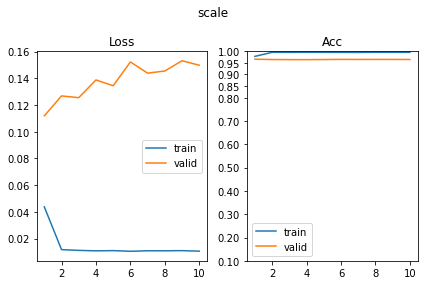

[405/630] color      SUP_[FCN32i223o128_d16]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 42.75it/s, loss=2.03, acc=0.182]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 105.59it/s, loss=2.03, acc=0.18]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 41.96it/s, loss=2.02, acc=0.194]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 83.28it/s, loss=2.03, acc=0.163]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 43.78it/s, loss=2.01, acc=0.178]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 88.63it/s, loss=2.02, acc=0.178]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 39.04it/s, loss=2.01, acc=0.174]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 112.82it/s, loss=2.06, acc=0.161]     

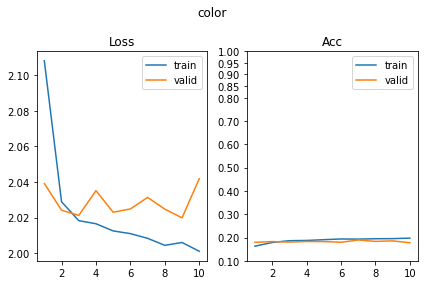

[406/630] angle      SUP_[FCN32i223o128_d16]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 41.80it/s, loss=2.76, acc=0.0977]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 84.12it/s, loss=2.76, acc=0.0878]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 40.87it/s, loss=2.72, acc=0.107]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 54.81it/s, loss=2.74, acc=0.0976]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 47.08it/s, loss=2.71, acc=0.106]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 111.51it/s, loss=2.72, acc=0.12]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 41.46it/s, loss=2.66, acc=0.109]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 114.51it/s, loss=2.65, acc=0.127]     

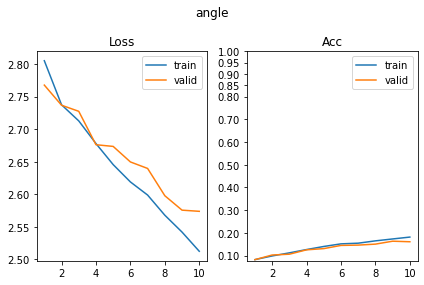

[407/630] py         SUP_[FCN32i223o128_d16]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 41.60it/s, loss=1.31, acc=0.355]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 83.25it/s, loss=1.3, acc=0.412]                                              
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 43.40it/s, loss=1.22, acc=0.44]                                            
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 118.93it/s, loss=1.25, acc=0.427]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 45.08it/s, loss=1.2, acc=0.448]                                            
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 116.35it/s, loss=1.21, acc=0.449]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 42.41it/s, loss=1.19, acc=0.453]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 91.77it/s, loss=1.16, acc=0.471]      

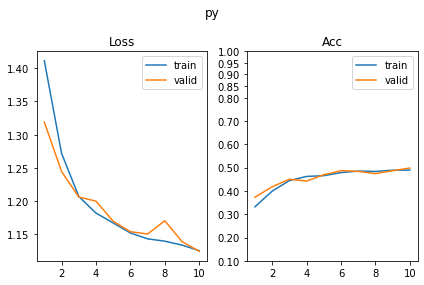

[408/630] px         SUP_[FCN32i223o128_d16]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 41.72it/s, loss=1.29, acc=0.384]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 95.85it/s, loss=1.27, acc=0.398]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 42.82it/s, loss=1.16, acc=0.489]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 53.42it/s, loss=1.17, acc=0.451]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 43.96it/s, loss=1.15, acc=0.463]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 83.13it/s, loss=1.24, acc=0.434]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 38.57it/s, loss=1.13, acc=0.453]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 106.57it/s, loss=1.17, acc=0.454]     

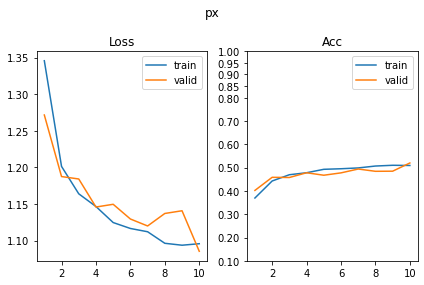

SUP_[FCN32i223o128_d16]_target_[color]
[409/630] shape      SUP_[FCN32i223o128_d16]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 41.14it/s, loss=1.94, acc=0.178]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 106.34it/s, loss=1.95, acc=0.159]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 40.60it/s, loss=1.91, acc=0.199]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 107.16it/s, loss=1.94, acc=0.163]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 37.68it/s, loss=1.83, acc=0.239]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 82.51it/s, loss=1.89, acc=0.19]                                              
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 36.76it/s, loss=1.78, acc=0.231]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 81.74it/s, loss=1.83, acc=0.212]      

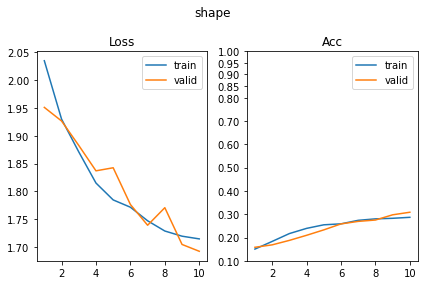

[410/630] scale      SUP_[FCN32i223o128_d16]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 45.59it/s, loss=1.11, acc=0.321]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 93.60it/s, loss=1.1, acc=0.334]                                              
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 44.03it/s, loss=1.1, acc=0.339]                                            
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 73.51it/s, loss=1.11, acc=0.32]                                              
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 44.45it/s, loss=1.1, acc=0.347]                                            
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 117.01it/s, loss=1.1, acc=0.351]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 40.07it/s, loss=1.1, acc=0.326]                                            
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 82.12it/s, loss=1.11, acc=0.341]      

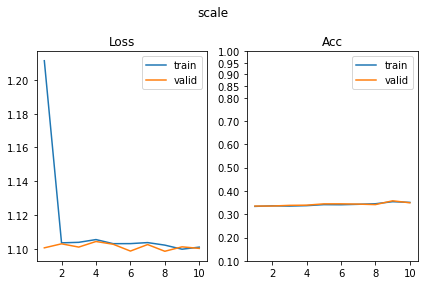

[411/630] color      SUP_[FCN32i223o128_d16]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 42.80it/s, loss=0.000571, acc=1]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 84.08it/s, loss=0.000346, acc=1]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 38.40it/s, loss=0.00034, acc=1]                                            
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 79.43it/s, loss=0.000329, acc=1]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 40.98it/s, loss=0.000222, acc=1]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 114.69it/s, loss=0.000206, acc=1]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 40.08it/s, loss=0.000163, acc=1]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 83.28it/s, loss=0.000157, acc=1]      

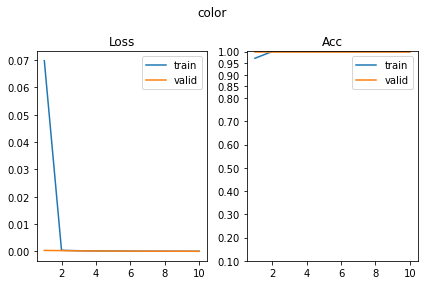

[412/630] angle      SUP_[FCN32i223o128_d16]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 38.08it/s, loss=2.8, acc=0.0554]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 83.95it/s, loss=2.8, acc=0.0732]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 48.09it/s, loss=2.8, acc=0.0554]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 71.40it/s, loss=2.79, acc=0.061]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 45.20it/s, loss=2.79, acc=0.0668]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 104.86it/s, loss=2.82, acc=0.0707]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 42.18it/s, loss=2.79, acc=0.0554]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 110.81it/s, loss=2.79, acc=0.0902]    

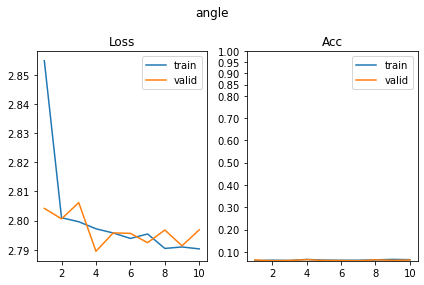

[413/630] py         SUP_[FCN32i223o128_d16]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 46.42it/s, loss=1.4, acc=0.261]                                            
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 111.12it/s, loss=1.39, acc=0.237]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 46.11it/s, loss=1.39, acc=0.265]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 105.41it/s, loss=1.38, acc=0.261]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 39.76it/s, loss=1.4, acc=0.243]                                            
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 118.50it/s, loss=1.39, acc=0.237]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 43.52it/s, loss=1.38, acc=0.287]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 117.67it/s, loss=1.39, acc=0.266]     

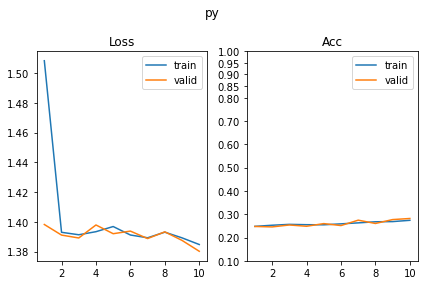

[414/630] px         SUP_[FCN32i223o128_d16]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 48.09it/s, loss=1.39, acc=0.285]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 84.19it/s, loss=1.4, acc=0.227]                                              
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 45.57it/s, loss=1.38, acc=0.274]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 56.91it/s, loss=1.41, acc=0.244]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 40.43it/s, loss=1.39, acc=0.261]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 84.60it/s, loss=1.4, acc=0.3]                                                
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 38.49it/s, loss=1.39, acc=0.246]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 84.93it/s, loss=1.39, acc=0.259]      

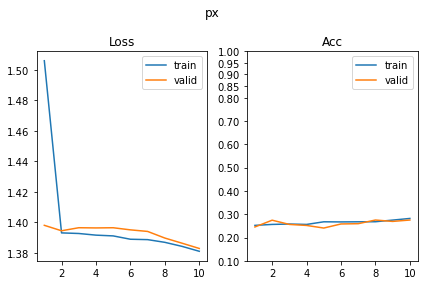

SUP_[FCN32i223o128_d16]_target_[angle]
[415/630] shape      SUP_[FCN32i223o128_d16]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 37.82it/s, loss=0.823, acc=0.666]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 82.54it/s, loss=0.84, acc=0.671]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 37.45it/s, loss=0.754, acc=0.687]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 78.83it/s, loss=0.751, acc=0.698]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 40.62it/s, loss=0.711, acc=0.726]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 78.87it/s, loss=0.752, acc=0.724]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 45.25it/s, loss=0.727, acc=0.721]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 112.73it/s, loss=0.732, acc=0.673]    

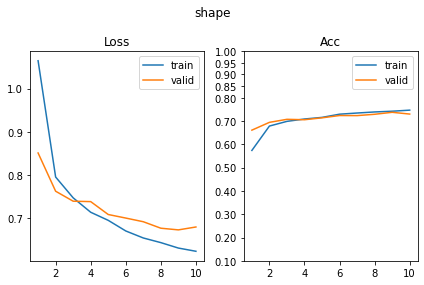

[416/630] scale      SUP_[FCN32i223o128_d16]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 46.64it/s, loss=1.1, acc=0.36]                                             
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 119.36it/s, loss=1.08, acc=0.429]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 46.71it/s, loss=1.07, acc=0.419]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 70.94it/s, loss=1.08, acc=0.393]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 42.85it/s, loss=1.04, acc=0.45]                                            
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 92.44it/s, loss=1.07, acc=0.417]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 40.80it/s, loss=1.05, acc=0.43]                                            
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 83.21it/s, loss=1.08, acc=0.412]      

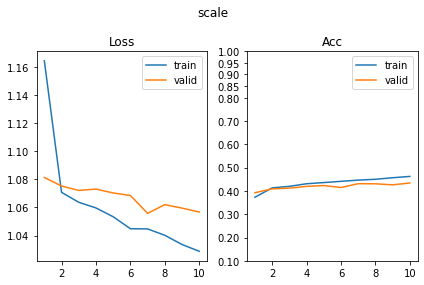

[417/630] color      SUP_[FCN32i223o128_d16]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 45.71it/s, loss=2.07, acc=0.16]                                            
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 106.34it/s, loss=2.1, acc=0.156]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 42.04it/s, loss=2.06, acc=0.174]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 114.39it/s, loss=2.07, acc=0.154]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 45.46it/s, loss=2.06, acc=0.16]                                            
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 106.88it/s, loss=2.06, acc=0.19]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 42.96it/s, loss=2.05, acc=0.176]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 110.98it/s, loss=2.06, acc=0.166]     

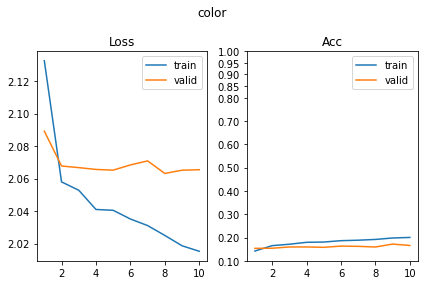

[418/630] angle      SUP_[FCN32i223o128_d16]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 42.93it/s, loss=0.0993, acc=0.967]                                         
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 112.63it/s, loss=1.5, acc=0.634]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 43.49it/s, loss=0.112, acc=0.961]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 55.12it/s, loss=1.84, acc=0.568]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 44.10it/s, loss=0.0774, acc=0.972]                                         
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 115.05it/s, loss=1.89, acc=0.588]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 43.55it/s, loss=0.103, acc=0.963]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 119.95it/s, loss=1.74, acc=0.637]     

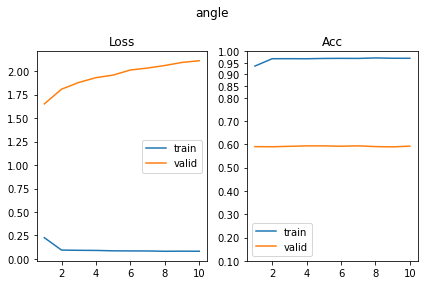

[419/630] py         SUP_[FCN32i223o128_d16]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 44.67it/s, loss=1.36, acc=0.318]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 83.50it/s, loss=1.38, acc=0.31]                                              
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 44.85it/s, loss=1.35, acc=0.309]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 117.63it/s, loss=1.35, acc=0.322]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 37.82it/s, loss=1.34, acc=0.339]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 83.25it/s, loss=1.35, acc=0.322]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 38.61it/s, loss=1.33, acc=0.366]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 118.92it/s, loss=1.31, acc=0.366]     

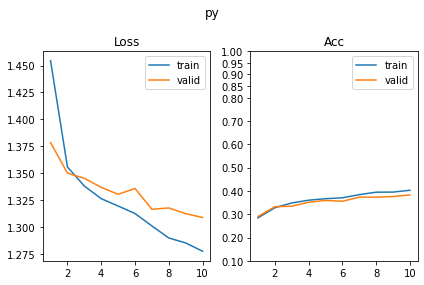

[420/630] px         SUP_[FCN32i223o128_d16]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 41.89it/s, loss=1.4, acc=0.269]                                            
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 103.00it/s, loss=1.37, acc=0.285]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 41.64it/s, loss=1.36, acc=0.326]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 54.07it/s, loss=1.4, acc=0.302]                                              
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 41.51it/s, loss=1.36, acc=0.326]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 115.93it/s, loss=1.36, acc=0.329]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 44.04it/s, loss=1.35, acc=0.36]                                            
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 111.09it/s, loss=1.38, acc=0.302]     

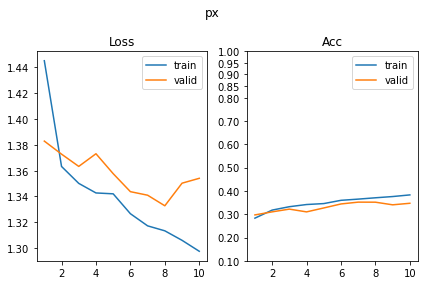

SUP_[FCN32i223o128_d16]_target_[py]
[421/630] shape      SUP_[FCN32i223o128_d16]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 45.93it/s, loss=1.66, acc=0.349]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 122.23it/s, loss=1.67, acc=0.393]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 46.72it/s, loss=1.41, acc=0.433]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 110.19it/s, loss=1.39, acc=0.441]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 42.61it/s, loss=1.28, acc=0.493]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 107.16it/s, loss=1.34, acc=0.473]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 42.94it/s, loss=1.2, acc=0.531]                                            
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 83.61it/s, loss=1.25, acc=0.512]      

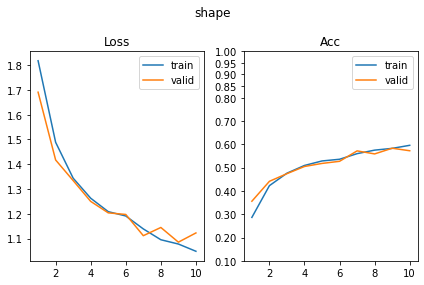

[422/630] scale      SUP_[FCN32i223o128_d16]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 40.60it/s, loss=1.04, acc=0.456]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 85.64it/s, loss=1.08, acc=0.41]                                              
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 41.28it/s, loss=1.03, acc=0.456]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 54.41it/s, loss=1.08, acc=0.415]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 40.99it/s, loss=1.03, acc=0.456]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 81.84it/s, loss=0.986, acc=0.493]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 44.33it/s, loss=0.974, acc=0.508]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 82.06it/s, loss=0.983, acc=0.51]      

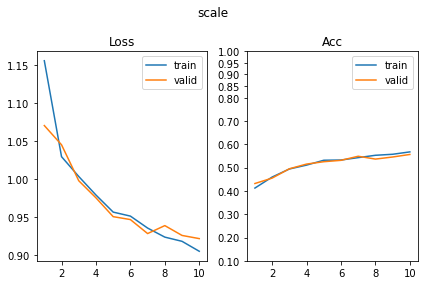

[423/630] color      SUP_[FCN32i223o128_d16]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 42.15it/s, loss=1.95, acc=0.22]                                            
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 86.59it/s, loss=1.99, acc=0.178]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 40.15it/s, loss=1.91, acc=0.223]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 85.05it/s, loss=2, acc=0.224]                                                
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 38.17it/s, loss=1.92, acc=0.225]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 91.48it/s, loss=1.93, acc=0.215]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 40.04it/s, loss=1.89, acc=0.217]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 83.68it/s, loss=1.94, acc=0.19]       

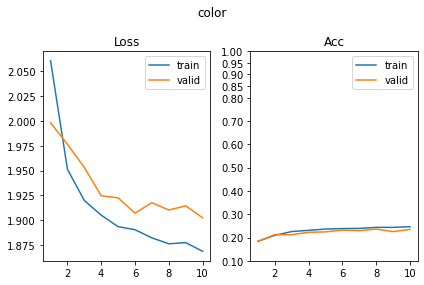

[424/630] angle      SUP_[FCN32i223o128_d16]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 47.62it/s, loss=2.74, acc=0.0993]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 114.58it/s, loss=2.76, acc=0.0976]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 46.58it/s, loss=2.71, acc=0.116]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 57.27it/s, loss=2.69, acc=0.122]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 41.62it/s, loss=2.69, acc=0.127]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 83.20it/s, loss=2.73, acc=0.112]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 38.42it/s, loss=2.6, acc=0.153]                                            
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 83.36it/s, loss=2.67, acc=0.129]      

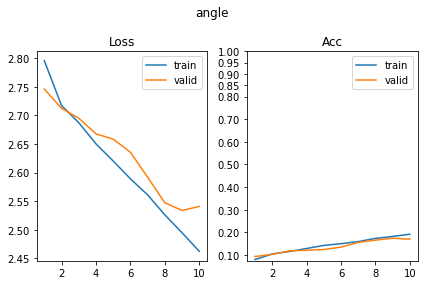

[425/630] py         SUP_[FCN32i223o128_d16]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 43.25it/s, loss=0.0121, acc=0.997]                                         
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 91.63it/s, loss=0.0516, acc=0.983]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 44.04it/s, loss=0.022, acc=0.99]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 108.13it/s, loss=0.0308, acc=0.993]                                          
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 39.94it/s, loss=0.0156, acc=0.995]                                         
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 84.20it/s, loss=0.0267, acc=0.993]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 46.54it/s, loss=0.0141, acc=0.993]                                         
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 117.55it/s, loss=0.147, acc=0.963]    

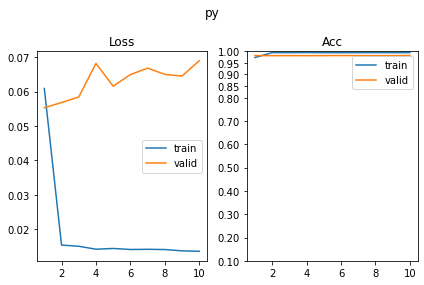

[426/630] px         SUP_[FCN32i223o128_d16]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 45.19it/s, loss=1.38, acc=0.295]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 94.70it/s, loss=1.38, acc=0.288]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 45.29it/s, loss=1.38, acc=0.309]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 73.86it/s, loss=1.37, acc=0.31]                                              
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 47.12it/s, loss=1.35, acc=0.347]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 118.44it/s, loss=1.36, acc=0.332]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 44.52it/s, loss=1.36, acc=0.309]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 114.97it/s, loss=1.36, acc=0.332]     

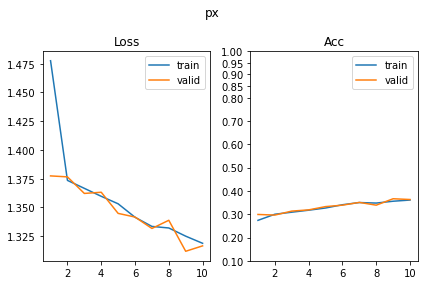

SUP_[FCN32i223o128_d16]_target_[px]
[427/630] shape      SUP_[FCN32i223o128_d16]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 40.17it/s, loss=1.55, acc=0.394]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 96.59it/s, loss=1.63, acc=0.361]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 38.20it/s, loss=1.39, acc=0.459]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 117.11it/s, loss=1.38, acc=0.439]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 46.06it/s, loss=1.27, acc=0.508]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 99.72it/s, loss=1.38, acc=0.476]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 38.03it/s, loss=1.24, acc=0.524]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 84.71it/s, loss=1.36, acc=0.451]      

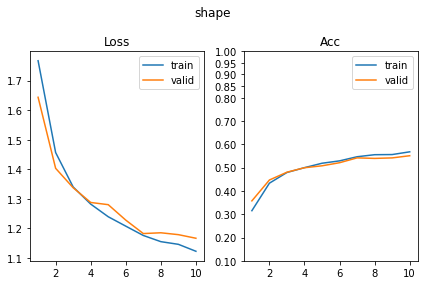

[428/630] scale      SUP_[FCN32i223o128_d16]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 46.50it/s, loss=1.04, acc=0.453]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 110.59it/s, loss=1.05, acc=0.449]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 48.60it/s, loss=1.02, acc=0.502]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 53.89it/s, loss=1.04, acc=0.461]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 47.47it/s, loss=1.03, acc=0.49]                                            
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 113.61it/s, loss=1.02, acc=0.505]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 43.62it/s, loss=0.983, acc=0.516]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 110.13it/s, loss=0.974, acc=0.512]    

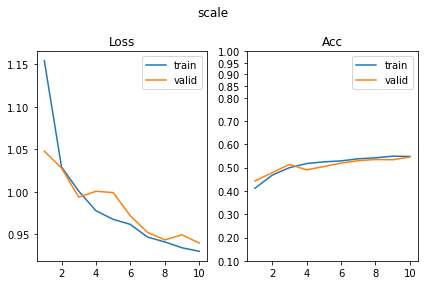

[429/630] color      SUP_[FCN32i223o128_d16]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 46.15it/s, loss=2.05, acc=0.168]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 113.39it/s, loss=2.06, acc=0.154]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 47.72it/s, loss=2.01, acc=0.202]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 114.35it/s, loss=2.02, acc=0.178]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 45.68it/s, loss=2, acc=0.195]                                              
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 88.24it/s, loss=2.01, acc=0.195]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 40.86it/s, loss=1.98, acc=0.205]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 89.17it/s, loss=1.98, acc=0.195]      

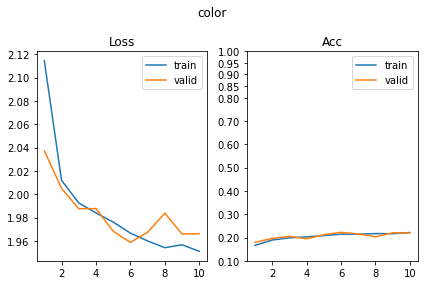

[430/630] angle      SUP_[FCN32i223o128_d16]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 46.95it/s, loss=2.73, acc=0.0896]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 110.93it/s, loss=2.75, acc=0.0634]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 48.53it/s, loss=2.66, acc=0.134]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 69.56it/s, loss=2.68, acc=0.124]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 46.70it/s, loss=2.69, acc=0.0879]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 114.44it/s, loss=2.65, acc=0.144]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 46.30it/s, loss=2.64, acc=0.137]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 84.04it/s, loss=2.69, acc=0.127]      

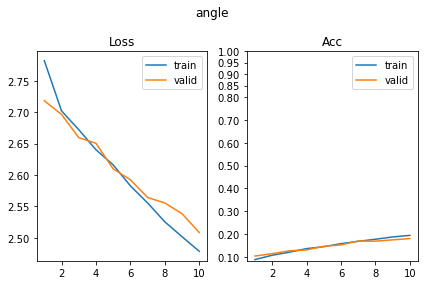

[431/630] py         SUP_[FCN32i223o128_d16]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 45.91it/s, loss=1.38, acc=0.283]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 112.33it/s, loss=1.39, acc=0.254]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 44.73it/s, loss=1.36, acc=0.296]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 110.38it/s, loss=1.36, acc=0.32]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 44.07it/s, loss=1.36, acc=0.319]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 116.13it/s, loss=1.38, acc=0.288]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 46.19it/s, loss=1.37, acc=0.282]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 110.68it/s, loss=1.38, acc=0.317]     

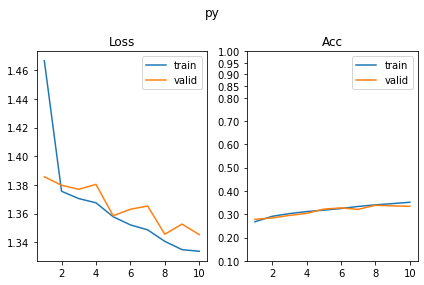

[432/630] px         SUP_[FCN32i223o128_d16]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 38.19it/s, loss=0.0133, acc=0.993]                                         
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 80.98it/s, loss=0.0972, acc=0.978]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 40.10it/s, loss=0.00799, acc=0.997]                                        
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 54.11it/s, loss=0.0679, acc=0.973]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 40.02it/s, loss=0.00796, acc=0.997]                                        
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 82.09it/s, loss=0.0808, acc=0.976]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 37.51it/s, loss=0.0171, acc=0.992]                                         
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 83.04it/s, loss=0.0725, acc=0.978]    

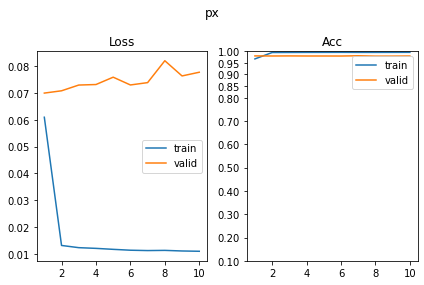

SUP_[FCN32i223o128_d32]_target_[shape]
[433/630] shape      SUP_[FCN32i223o128_d32]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 39.04it/s, loss=0.0119, acc=0.997]                                         
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 96.40it/s, loss=0.055, acc=0.983]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 42.19it/s, loss=0.0044, acc=0.998]                                         
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 84.72it/s, loss=0.0515, acc=0.983]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 45.77it/s, loss=0.0161, acc=0.993]                                         
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 112.44it/s, loss=0.0383, acc=0.99]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 39.02it/s, loss=0.00727, acc=0.997]                                        
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 101.06it/s, loss=0.0364, acc=0.993]   

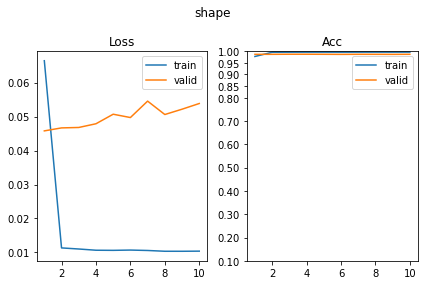

[434/630] scale      SUP_[FCN32i223o128_d32]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 41.58it/s, loss=0.947, acc=0.529]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 82.53it/s, loss=0.981, acc=0.502]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 40.62it/s, loss=0.813, acc=0.629]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 52.38it/s, loss=0.913, acc=0.561]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 48.38it/s, loss=0.807, acc=0.635]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 95.45it/s, loss=0.813, acc=0.634]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 44.62it/s, loss=0.825, acc=0.581]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 80.29it/s, loss=0.793, acc=0.646]     

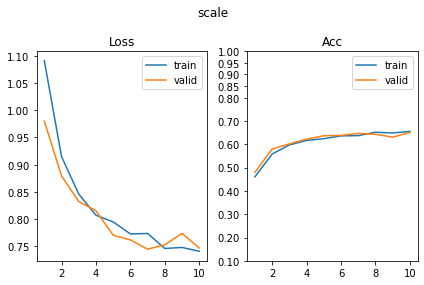

[435/630] color      SUP_[FCN32i223o128_d32]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 41.72it/s, loss=2.04, acc=0.171]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 78.07it/s, loss=2.07, acc=0.171]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 41.46it/s, loss=2.03, acc=0.16]                                            
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 81.96it/s, loss=2.01, acc=0.215]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 37.22it/s, loss=2.04, acc=0.158]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 78.74it/s, loss=2.03, acc=0.215]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 37.48it/s, loss=1.97, acc=0.225]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 82.73it/s, loss=2, acc=0.222]         

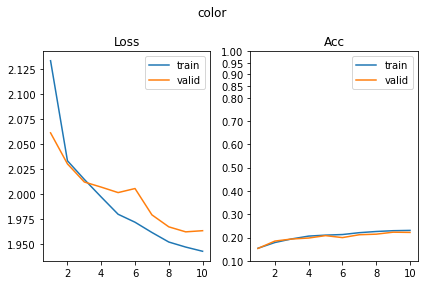

[436/630] angle      SUP_[FCN32i223o128_d32]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 35.12it/s, loss=2.63, acc=0.137]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 112.43it/s, loss=2.62, acc=0.144]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 41.17it/s, loss=2.43, acc=0.2]                                             
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 53.16it/s, loss=2.51, acc=0.178]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 37.10it/s, loss=2.3, acc=0.218]                                            
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 119.54it/s, loss=2.3, acc=0.207]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 44.53it/s, loss=2.12, acc=0.287]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 101.34it/s, loss=2.15, acc=0.285]     

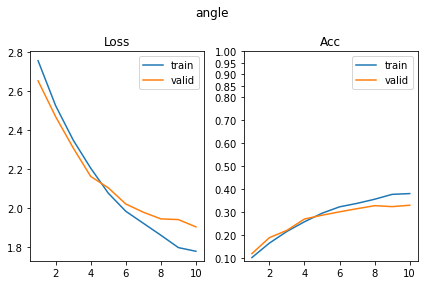

[437/630] py         SUP_[FCN32i223o128_d32]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 43.64it/s, loss=1.35, acc=0.311]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 113.81it/s, loss=1.34, acc=0.341]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 43.99it/s, loss=1.28, acc=0.371]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 107.00it/s, loss=1.31, acc=0.334]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 44.51it/s, loss=1.24, acc=0.42]                                            
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 114.93it/s, loss=1.21, acc=0.468]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 41.69it/s, loss=1.19, acc=0.469]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 105.62it/s, loss=1.19, acc=0.463]     

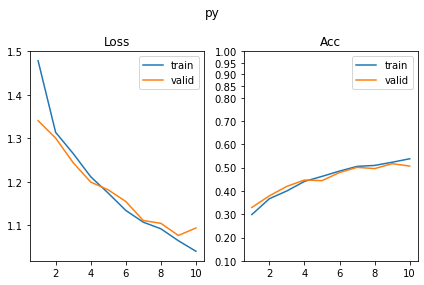

[438/630] px         SUP_[FCN32i223o128_d32]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 40.65it/s, loss=1.33, acc=0.37]                                            
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 108.18it/s, loss=1.37, acc=0.29]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 41.47it/s, loss=1.24, acc=0.42]                                            
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 71.69it/s, loss=1.25, acc=0.422]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 43.76it/s, loss=1.2, acc=0.443]                                            
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 81.45it/s, loss=1.27, acc=0.383]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 38.64it/s, loss=1.22, acc=0.414]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 111.86it/s, loss=1.17, acc=0.444]     

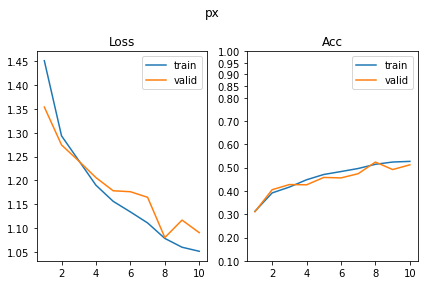

SUP_[FCN32i223o128_d32]_target_[scale]
[439/630] shape      SUP_[FCN32i223o128_d32]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 42.73it/s, loss=1.2, acc=0.555]                                            
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 82.67it/s, loss=1.25, acc=0.539]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 39.64it/s, loss=0.952, acc=0.661]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 110.29it/s, loss=1.1, acc=0.607]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 36.88it/s, loss=0.755, acc=0.712]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 112.49it/s, loss=0.91, acc=0.659]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 43.07it/s, loss=0.771, acc=0.71]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 111.84it/s, loss=0.818, acc=0.698]    

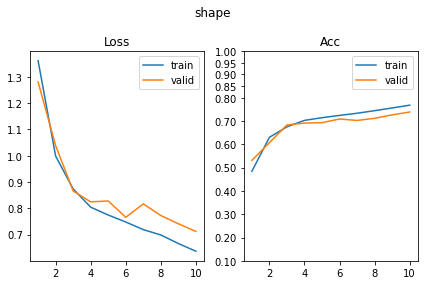

[440/630] scale      SUP_[FCN32i223o128_d32]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 43.82it/s, loss=0.0129, acc=0.992]                                         
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 113.15it/s, loss=0.0726, acc=0.973]                                          
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 44.43it/s, loss=0.00503, acc=0.998]                                        
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 53.55it/s, loss=0.058, acc=0.978]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 39.89it/s, loss=0.00617, acc=0.997]                                        
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 83.03it/s, loss=0.0883, acc=0.966]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 36.89it/s, loss=0.00707, acc=0.997]                                        
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 82.00it/s, loss=0.0842, acc=0.973]    

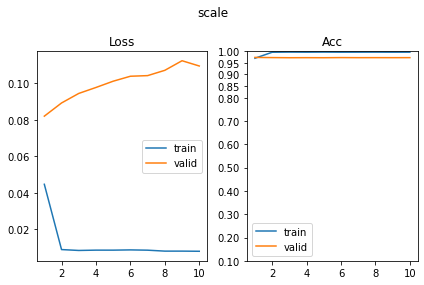

[441/630] color      SUP_[FCN32i223o128_d32]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 37.75it/s, loss=2.03, acc=0.182]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 81.05it/s, loss=2.04, acc=0.195]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 36.89it/s, loss=2.05, acc=0.163]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 78.64it/s, loss=2.03, acc=0.195]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 41.91it/s, loss=2.02, acc=0.191]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 109.49it/s, loss=2.04, acc=0.171]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 40.89it/s, loss=1.99, acc=0.197]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 110.32it/s, loss=2, acc=0.202]        

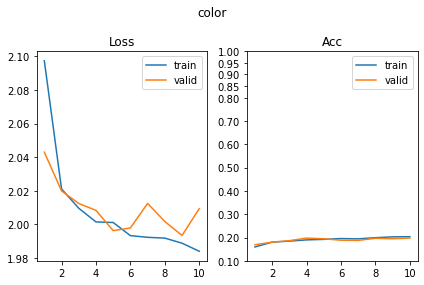

[442/630] angle      SUP_[FCN32i223o128_d32]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 43.83it/s, loss=2.73, acc=0.103]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 115.56it/s, loss=2.74, acc=0.105]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 45.58it/s, loss=2.64, acc=0.145]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 67.82it/s, loss=2.71, acc=0.129]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 39.80it/s, loss=2.53, acc=0.173]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 82.28it/s, loss=2.59, acc=0.156]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 36.91it/s, loss=2.43, acc=0.213]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 79.78it/s, loss=2.58, acc=0.149]      

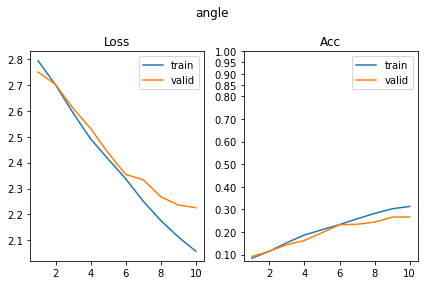

[443/630] py         SUP_[FCN32i223o128_d32]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 44.52it/s, loss=1.28, acc=0.422]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 111.32it/s, loss=1.32, acc=0.346]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 43.50it/s, loss=1.19, acc=0.427]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 81.64it/s, loss=1.25, acc=0.42]                                              
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 37.20it/s, loss=1.15, acc=0.485]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 81.05it/s, loss=1.15, acc=0.471]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 43.08it/s, loss=1.08, acc=0.518]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 115.71it/s, loss=1.09, acc=0.539]     

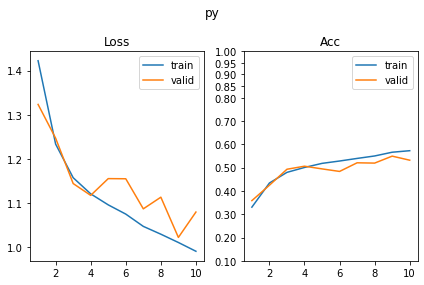

[444/630] px         SUP_[FCN32i223o128_d32]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 41.58it/s, loss=1.3, acc=0.389]                                            
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 108.42it/s, loss=1.31, acc=0.395]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 46.05it/s, loss=1.22, acc=0.448]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 64.24it/s, loss=1.25, acc=0.402]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 40.30it/s, loss=1.19, acc=0.461]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 82.40it/s, loss=1.19, acc=0.437]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 36.08it/s, loss=1.19, acc=0.448]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 81.73it/s, loss=1.13, acc=0.471]      

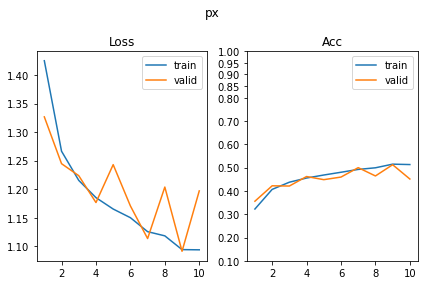

SUP_[FCN32i223o128_d32]_target_[color]
[445/630] shape      SUP_[FCN32i223o128_d32]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 41.34it/s, loss=1.97, acc=0.125]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 84.65it/s, loss=1.95, acc=0.156]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 39.23it/s, loss=1.92, acc=0.174]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 82.05it/s, loss=1.95, acc=0.159]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 37.28it/s, loss=1.82, acc=0.23]                                            
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 78.68it/s, loss=1.85, acc=0.198]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 41.98it/s, loss=1.71, acc=0.282]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 81.61it/s, loss=1.78, acc=0.222]      

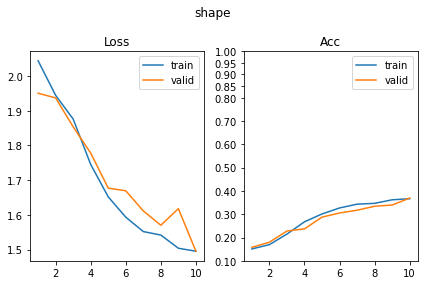

[446/630] scale      SUP_[FCN32i223o128_d32]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 44.72it/s, loss=1.12, acc=0.326]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 112.83it/s, loss=1.12, acc=0.315]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 48.00it/s, loss=1.1, acc=0.321]                                            
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 65.90it/s, loss=1.11, acc=0.315]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 43.41it/s, loss=1.11, acc=0.332]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 109.19it/s, loss=1.11, acc=0.329]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 42.74it/s, loss=1.1, acc=0.344]                                            
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 110.52it/s, loss=1.11, acc=0.29]      

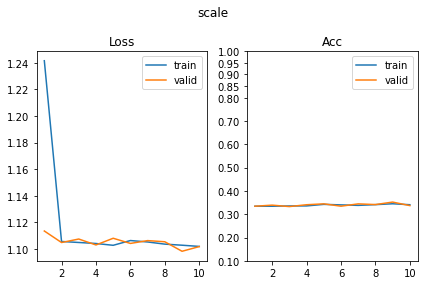

[447/630] color      SUP_[FCN32i223o128_d32]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 43.07it/s, loss=0.000488, acc=1]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 111.15it/s, loss=0.000359, acc=1]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 41.35it/s, loss=0.000297, acc=1]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 85.00it/s, loss=0.000248, acc=1]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 41.82it/s, loss=0.000197, acc=1]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 109.99it/s, loss=0.000182, acc=1]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 44.31it/s, loss=0.000156, acc=1]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 113.82it/s, loss=0.000134, acc=1]     

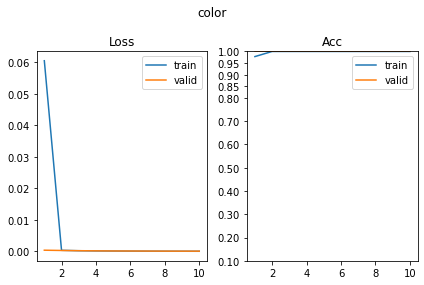

[448/630] angle      SUP_[FCN32i223o128_d32]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 43.25it/s, loss=2.81, acc=0.0554]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 114.21it/s, loss=2.83, acc=0.0463]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 47.65it/s, loss=2.79, acc=0.057]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 71.88it/s, loss=2.8, acc=0.0659]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 45.89it/s, loss=2.79, acc=0.0765]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 114.01it/s, loss=2.81, acc=0.0659]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 42.60it/s, loss=2.79, acc=0.07]                                            
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 96.64it/s, loss=2.79, acc=0.0659]     

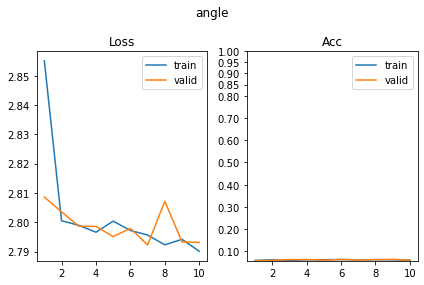

[449/630] py         SUP_[FCN32i223o128_d32]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 40.48it/s, loss=1.39, acc=0.264]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 104.90it/s, loss=1.39, acc=0.249]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 37.49it/s, loss=1.4, acc=0.243]                                            
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 80.74it/s, loss=1.39, acc=0.256]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 37.23it/s, loss=1.4, acc=0.252]                                            
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 81.07it/s, loss=1.4, acc=0.263]                                              
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 37.91it/s, loss=1.4, acc=0.226]                                            
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 81.56it/s, loss=1.4, acc=0.241]       

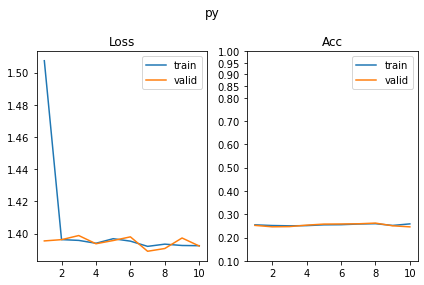

[450/630] px         SUP_[FCN32i223o128_d32]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 40.68it/s, loss=1.4, acc=0.231]                                            
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 75.76it/s, loss=1.4, acc=0.254]                                              
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 46.48it/s, loss=1.38, acc=0.279]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 69.25it/s, loss=1.4, acc=0.241]                                              
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 41.45it/s, loss=1.39, acc=0.243]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 82.27it/s, loss=1.4, acc=0.256]                                              
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 44.31it/s, loss=1.41, acc=0.231]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 104.69it/s, loss=1.42, acc=0.222]     

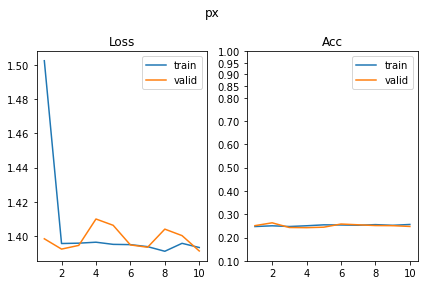

SUP_[FCN32i223o128_d32]_target_[angle]
[451/630] shape      SUP_[FCN32i223o128_d32]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 38.61it/s, loss=0.587, acc=0.775]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 115.19it/s, loss=0.576, acc=0.78]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 43.64it/s, loss=0.495, acc=0.806]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 82.64it/s, loss=0.523, acc=0.805]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 41.61it/s, loss=0.449, acc=0.837]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 109.64it/s, loss=0.47, acc=0.815]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 39.42it/s, loss=0.422, acc=0.834]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 81.24it/s, loss=0.434, acc=0.815]     

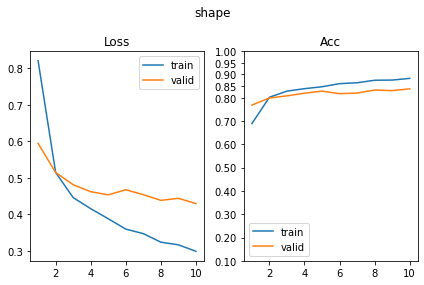

[452/630] scale      SUP_[FCN32i223o128_d32]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 40.37it/s, loss=1.06, acc=0.445]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 81.51it/s, loss=1.1, acc=0.39]                                               
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 40.23it/s, loss=1.04, acc=0.458]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 53.77it/s, loss=1.05, acc=0.441]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 41.93it/s, loss=1.05, acc=0.441]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 81.98it/s, loss=1.04, acc=0.446]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 37.48it/s, loss=1.02, acc=0.505]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 81.76it/s, loss=1, acc=0.48]          

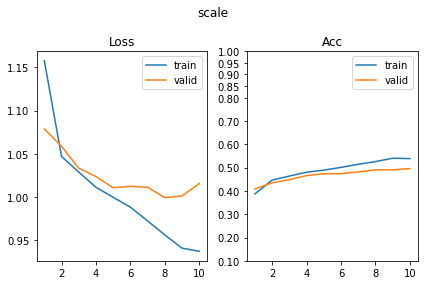

[453/630] color      SUP_[FCN32i223o128_d32]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 43.76it/s, loss=2.07, acc=0.169]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 79.11it/s, loss=2.07, acc=0.146]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 38.88it/s, loss=2.06, acc=0.168]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 108.99it/s, loss=2.05, acc=0.176]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 37.54it/s, loss=2.03, acc=0.189]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 81.33it/s, loss=2.05, acc=0.163]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 37.89it/s, loss=2.04, acc=0.199]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 77.64it/s, loss=2.07, acc=0.188]      

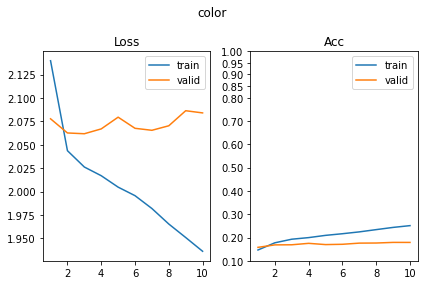

[454/630] angle      SUP_[FCN32i223o128_d32]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 44.11it/s, loss=0.135, acc=0.954]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 81.04it/s, loss=1.43, acc=0.639]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 39.73it/s, loss=0.129, acc=0.95]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 53.23it/s, loss=1.51, acc=0.644]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 44.37it/s, loss=0.102, acc=0.964]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 84.81it/s, loss=1.66, acc=0.622]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 37.47it/s, loss=0.103, acc=0.966]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 82.66it/s, loss=1.98, acc=0.568]      

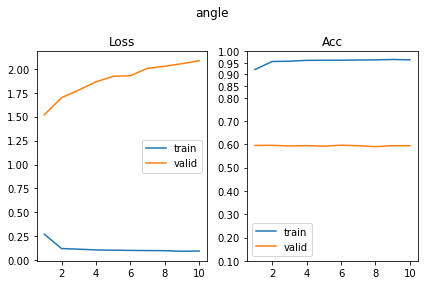

[455/630] py         SUP_[FCN32i223o128_d32]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 44.39it/s, loss=1.32, acc=0.337]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 79.25it/s, loss=1.31, acc=0.356]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 40.49it/s, loss=1.24, acc=0.446]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 115.82it/s, loss=1.24, acc=0.405]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 36.93it/s, loss=1.24, acc=0.44]                                            
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 79.96it/s, loss=1.23, acc=0.422]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 37.09it/s, loss=1.14, acc=0.493]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 82.78it/s, loss=1.16, acc=0.48]       

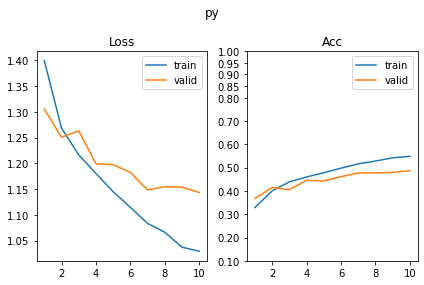

[456/630] px         SUP_[FCN32i223o128_d32]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 45.00it/s, loss=1.34, acc=0.327]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 119.68it/s, loss=1.36, acc=0.346]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 44.55it/s, loss=1.3, acc=0.383]                                            
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 54.51it/s, loss=1.36, acc=0.351]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 44.11it/s, loss=1.28, acc=0.404]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 86.55it/s, loss=1.29, acc=0.422]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 38.61it/s, loss=1.24, acc=0.459]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 112.41it/s, loss=1.25, acc=0.422]     

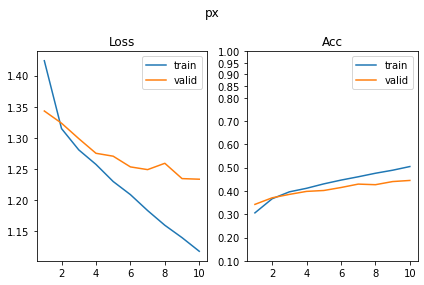

SUP_[FCN32i223o128_d32]_target_[py]
[457/630] shape      SUP_[FCN32i223o128_d32]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 39.40it/s, loss=1.18, acc=0.52]                                            
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 79.58it/s, loss=1.49, acc=0.398]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 42.77it/s, loss=0.967, acc=0.616]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 97.47it/s, loss=0.972, acc=0.612]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 40.10it/s, loss=0.813, acc=0.661]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 82.65it/s, loss=0.877, acc=0.661]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 37.83it/s, loss=0.804, acc=0.674]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 82.03it/s, loss=0.742, acc=0.712]     

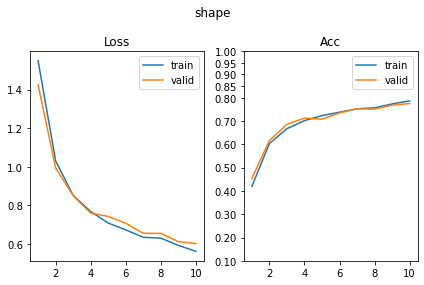

[458/630] scale      SUP_[FCN32i223o128_d32]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 43.79it/s, loss=1.01, acc=0.498]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 109.29it/s, loss=1.03, acc=0.476]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 45.42it/s, loss=0.93, acc=0.554]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 53.12it/s, loss=0.964, acc=0.515]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 40.67it/s, loss=0.865, acc=0.578]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 93.10it/s, loss=0.963, acc=0.517]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 41.62it/s, loss=0.886, acc=0.549]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 104.86it/s, loss=0.894, acc=0.576]    

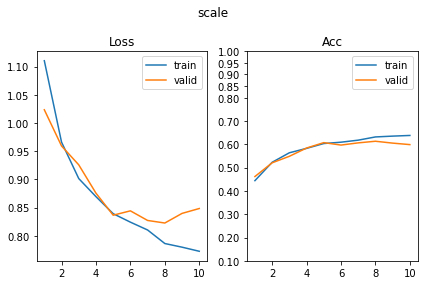

[459/630] color      SUP_[FCN32i223o128_d32]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 40.38it/s, loss=1.99, acc=0.191]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 81.80it/s, loss=2.02, acc=0.195]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 45.43it/s, loss=1.94, acc=0.22]                                            
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 117.21it/s, loss=2.03, acc=0.168]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 42.84it/s, loss=1.96, acc=0.217]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 112.09it/s, loss=1.94, acc=0.229]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 42.80it/s, loss=1.96, acc=0.218]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 117.45it/s, loss=1.97, acc=0.224]     

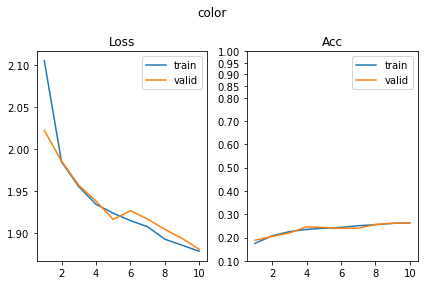

[460/630] angle      SUP_[FCN32i223o128_d32]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 39.37it/s, loss=2.66, acc=0.125]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 113.29it/s, loss=2.71, acc=0.11]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 45.21it/s, loss=2.56, acc=0.135]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 52.48it/s, loss=2.52, acc=0.171]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 44.56it/s, loss=2.46, acc=0.166]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 116.05it/s, loss=2.49, acc=0.176]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 44.80it/s, loss=2.4, acc=0.212]                                            
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 81.40it/s, loss=2.45, acc=0.212]      

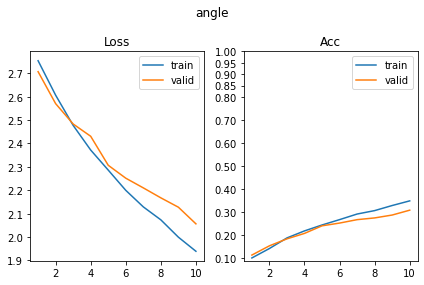

[461/630] py         SUP_[FCN32i223o128_d32]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 42.09it/s, loss=0.015, acc=0.993]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 99.55it/s, loss=0.046, acc=0.985]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 38.98it/s, loss=0.0151, acc=0.993]                                         
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 108.53it/s, loss=0.0444, acc=0.983]                                          
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 40.06it/s, loss=0.0218, acc=0.99]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 115.17it/s, loss=0.0541, acc=0.978]                                          
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 46.34it/s, loss=0.00858, acc=0.997]                                        
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 116.46it/s, loss=0.0481, acc=0.985]   

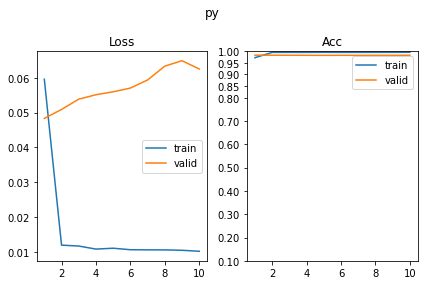

[462/630] px         SUP_[FCN32i223o128_d32]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 45.62it/s, loss=1.37, acc=0.275]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 115.03it/s, loss=1.39, acc=0.273]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 46.42it/s, loss=1.38, acc=0.287]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 53.63it/s, loss=1.39, acc=0.276]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 43.28it/s, loss=1.36, acc=0.308]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 82.91it/s, loss=1.37, acc=0.317]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 38.40it/s, loss=1.37, acc=0.311]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 112.50it/s, loss=1.36, acc=0.332]     

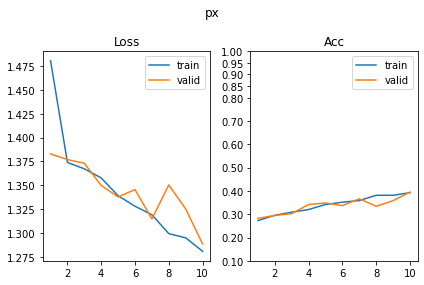

SUP_[FCN32i223o128_d32]_target_[px]
[463/630] shape      SUP_[FCN32i223o128_d32]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 36.54it/s, loss=1.46, acc=0.441]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 81.82it/s, loss=1.54, acc=0.42]                                              
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 37.50it/s, loss=1.08, acc=0.599]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 81.39it/s, loss=1.23, acc=0.522]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 42.19it/s, loss=1.06, acc=0.599]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 110.51it/s, loss=1.12, acc=0.559]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 39.06it/s, loss=1, acc=0.593]                                              
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 81.59it/s, loss=0.991, acc=0.583]     

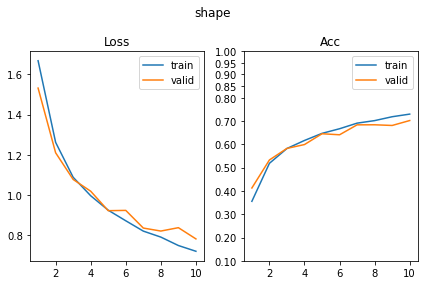

[464/630] scale      SUP_[FCN32i223o128_d32]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 45.04it/s, loss=1.05, acc=0.464]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 92.08it/s, loss=1.05, acc=0.429]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 43.78it/s, loss=0.982, acc=0.492]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 66.39it/s, loss=1.01, acc=0.48]                                              
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 45.54it/s, loss=0.89, acc=0.577]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 82.88it/s, loss=0.987, acc=0.478]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 37.98it/s, loss=0.834, acc=0.616]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 82.52it/s, loss=0.933, acc=0.551]     

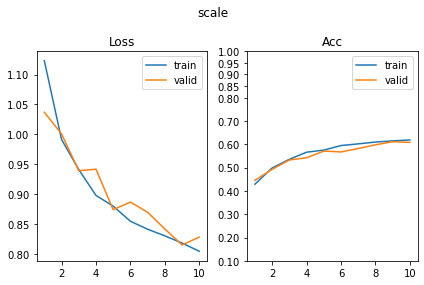

[465/630] color      SUP_[FCN32i223o128_d32]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 42.76it/s, loss=1.74, acc=0.283]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 105.90it/s, loss=1.7, acc=0.31]                                              
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 41.52it/s, loss=1.63, acc=0.316]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 108.45it/s, loss=1.62, acc=0.327]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 41.97it/s, loss=1.66, acc=0.308]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 108.94it/s, loss=1.7, acc=0.305]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 40.73it/s, loss=1.63, acc=0.337]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 101.46it/s, loss=1.63, acc=0.327]     

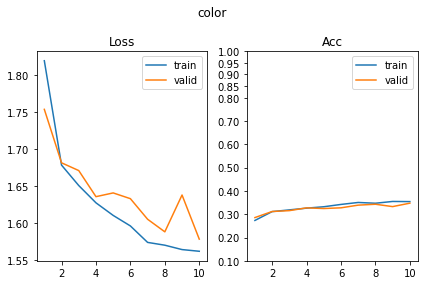

[466/630] angle      SUP_[FCN32i223o128_d32]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 40.77it/s, loss=2.72, acc=0.101]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 87.57it/s, loss=2.74, acc=0.0878]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 39.39it/s, loss=2.64, acc=0.142]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 48.94it/s, loss=2.61, acc=0.124]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 39.17it/s, loss=2.57, acc=0.161]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 82.05it/s, loss=2.58, acc=0.161]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 37.11it/s, loss=2.49, acc=0.191]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 82.98it/s, loss=2.53, acc=0.178]      

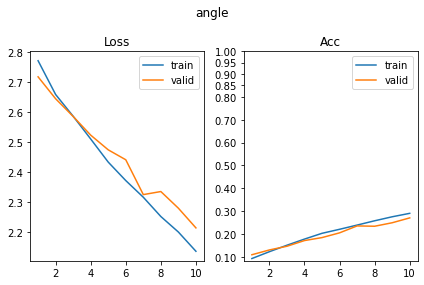

[467/630] py         SUP_[FCN32i223o128_d32]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 37.09it/s, loss=1.38, acc=0.29]                                            
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 106.09it/s, loss=1.39, acc=0.254]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 41.32it/s, loss=1.36, acc=0.334]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 112.76it/s, loss=1.36, acc=0.317]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 44.12it/s, loss=1.34, acc=0.339]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 82.23it/s, loss=1.36, acc=0.268]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 43.07it/s, loss=1.32, acc=0.375]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 115.19it/s, loss=1.34, acc=0.356]     

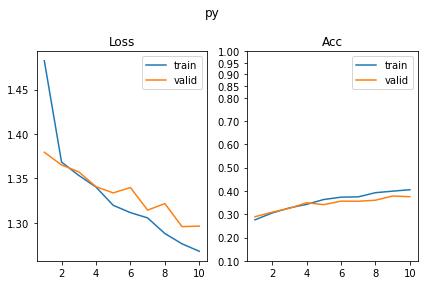

[468/630] px         SUP_[FCN32i223o128_d32]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 37.17it/s, loss=0.0571, acc=0.974]                                         
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 80.42it/s, loss=0.15, acc=0.944]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 41.95it/s, loss=0.0375, acc=0.985]                                         
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 70.56it/s, loss=0.069, acc=0.978]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 48.17it/s, loss=0.0413, acc=0.98]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 107.64it/s, loss=0.0641, acc=0.971]                                          
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 40.85it/s, loss=0.0364, acc=0.987]                                         
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 82.62it/s, loss=0.0727, acc=0.976]    

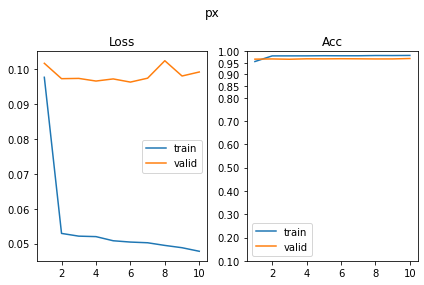

SUP_[FCN32i223o128_d64]_target_[shape]
[469/630] shape      SUP_[FCN32i223o128_d64]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 35.95it/s, loss=0.00899, acc=0.997]                                        
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 81.12it/s, loss=0.0429, acc=0.983]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 36.97it/s, loss=0.0136, acc=0.993]                                         
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 79.82it/s, loss=0.0225, acc=0.993]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 39.56it/s, loss=0.00831, acc=0.997]                                        
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 80.34it/s, loss=0.0529, acc=0.978]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 36.52it/s, loss=0.0145, acc=0.993]                                         
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 80.61it/s, loss=0.0126, acc=0.995]    

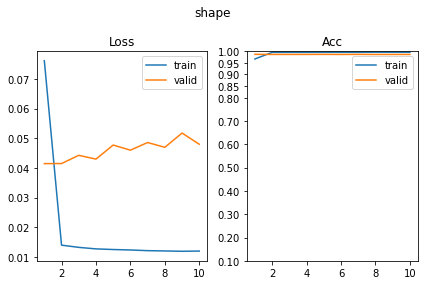

[470/630] scale      SUP_[FCN32i223o128_d64]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 46.84it/s, loss=0.843, acc=0.611]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 116.19it/s, loss=0.908, acc=0.549]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 49.81it/s, loss=0.76, acc=0.65]                                            
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 62.13it/s, loss=0.74, acc=0.651]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 40.73it/s, loss=0.696, acc=0.674]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 83.41it/s, loss=0.698, acc=0.685]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 38.44it/s, loss=0.647, acc=0.697]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 82.84it/s, loss=0.692, acc=0.676]     

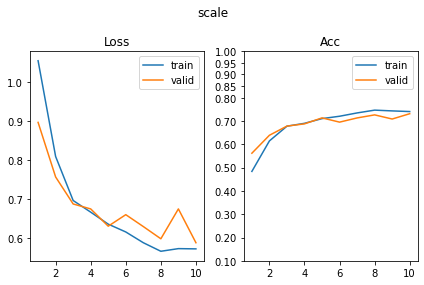

[471/630] color      SUP_[FCN32i223o128_d64]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 45.82it/s, loss=1.98, acc=0.212]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 109.16it/s, loss=2, acc=0.207]                                               
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 43.33it/s, loss=1.98, acc=0.215]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 106.34it/s, loss=1.96, acc=0.222]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 42.21it/s, loss=1.97, acc=0.199]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 109.20it/s, loss=1.96, acc=0.217]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 40.43it/s, loss=1.95, acc=0.212]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 107.64it/s, loss=1.95, acc=0.198]     

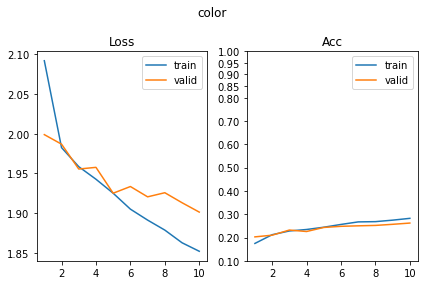

[472/630] angle      SUP_[FCN32i223o128_d64]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 40.05it/s, loss=2.37, acc=0.205]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 102.34it/s, loss=2.48, acc=0.163]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 39.92it/s, loss=1.98, acc=0.301]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 50.44it/s, loss=2.12, acc=0.266]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 39.55it/s, loss=1.7, acc=0.383]                                            
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 81.15it/s, loss=1.73, acc=0.405]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 43.88it/s, loss=1.6, acc=0.389]                                            
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 111.88it/s, loss=1.67, acc=0.388]     

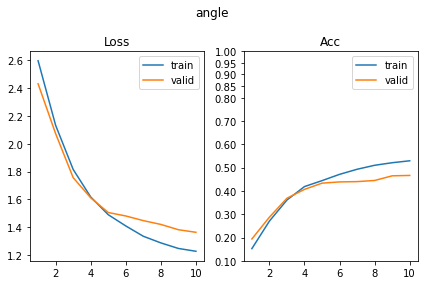

[473/630] py         SUP_[FCN32i223o128_d64]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 37.87it/s, loss=1.28, acc=0.394]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 82.26it/s, loss=1.27, acc=0.398]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 42.68it/s, loss=1.21, acc=0.454]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 80.37it/s, loss=1.18, acc=0.476]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 36.61it/s, loss=1.01, acc=0.549]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 80.59it/s, loss=1.12, acc=0.485]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 41.42it/s, loss=0.979, acc=0.57]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 111.06it/s, loss=0.964, acc=0.576]    

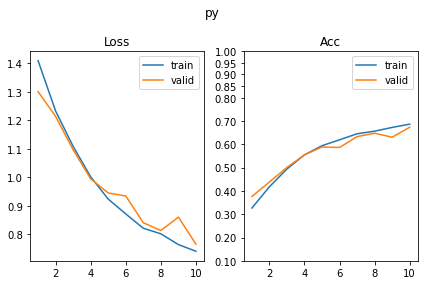

[474/630] px         SUP_[FCN32i223o128_d64]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 39.53it/s, loss=1.28, acc=0.386]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 80.64it/s, loss=1.25, acc=0.376]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 45.08it/s, loss=1.12, acc=0.485]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 68.52it/s, loss=1.13, acc=0.488]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 47.14it/s, loss=1.05, acc=0.49]                                            
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 107.83it/s, loss=1.06, acc=0.505]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 40.64it/s, loss=0.974, acc=0.598]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 111.58it/s, loss=0.944, acc=0.598]    

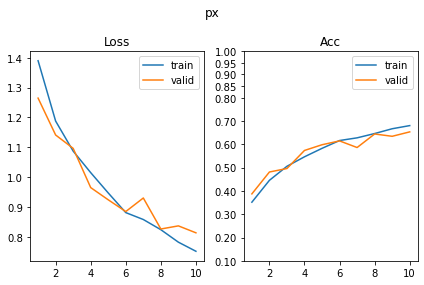

SUP_[FCN32i223o128_d64]_target_[scale]
[475/630] shape      SUP_[FCN32i223o128_d64]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 38.11it/s, loss=0.911, acc=0.682]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 77.51it/s, loss=1.3, acc=0.493]                                              
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 36.12it/s, loss=0.654, acc=0.757]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 79.76it/s, loss=0.855, acc=0.685]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 36.97it/s, loss=0.574, acc=0.788]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 110.18it/s, loss=0.723, acc=0.737]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 39.86it/s, loss=0.504, acc=0.822]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 82.08it/s, loss=0.539, acc=0.802]     

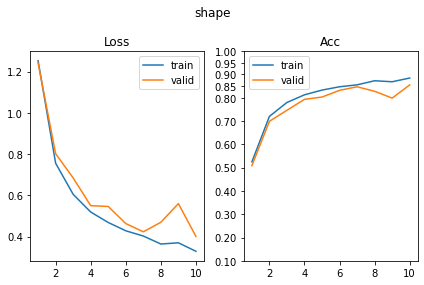

[476/630] scale      SUP_[FCN32i223o128_d64]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 41.75it/s, loss=0.00548, acc=0.998]                                        
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 84.10it/s, loss=0.0868, acc=0.973]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 42.08it/s, loss=0.0194, acc=0.989]                                         
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 63.81it/s, loss=0.108, acc=0.971]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 42.51it/s, loss=0.0139, acc=0.992]                                         
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 81.78it/s, loss=0.158, acc=0.961]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 41.97it/s, loss=0.0142, acc=0.992]                                         
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 82.21it/s, loss=0.155, acc=0.963]     

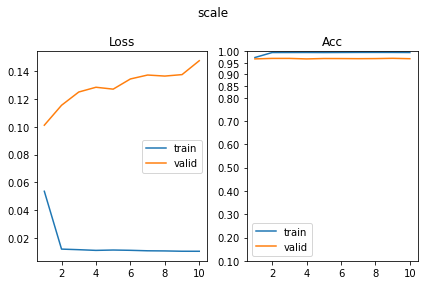

[477/630] color      SUP_[FCN32i223o128_d64]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 47.10it/s, loss=2.06, acc=0.15]                                            
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 100.15it/s, loss=2.02, acc=0.198]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 38.18it/s, loss=2.01, acc=0.176]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 79.00it/s, loss=2.01, acc=0.18]                                              
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 37.86it/s, loss=2, acc=0.195]                                              
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 80.33it/s, loss=2, acc=0.159]                                                
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 40.47it/s, loss=2, acc=0.225]                                              
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 81.46it/s, loss=1.99, acc=0.198]      

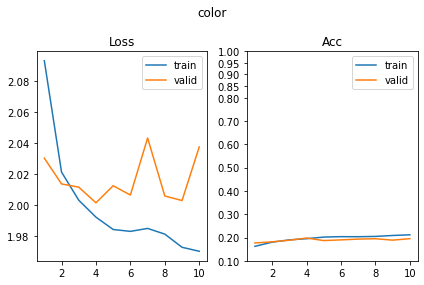

[478/630] angle      SUP_[FCN32i223o128_d64]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 38.12it/s, loss=2.67, acc=0.129]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 82.35it/s, loss=2.7, acc=0.122]                                              
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 39.29it/s, loss=2.42, acc=0.233]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 52.69it/s, loss=2.48, acc=0.198]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 39.99it/s, loss=2.21, acc=0.282]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 82.79it/s, loss=2.33, acc=0.229]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 37.73it/s, loss=2.04, acc=0.313]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 83.18it/s, loss=2.06, acc=0.341]      

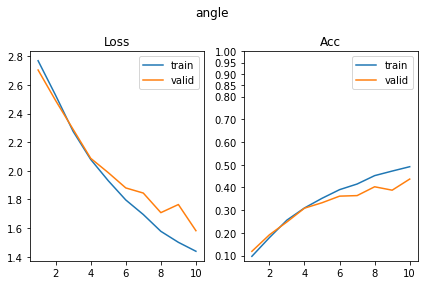

[479/630] py         SUP_[FCN32i223o128_d64]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 40.45it/s, loss=1.22, acc=0.443]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 83.56it/s, loss=1.27, acc=0.398]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 45.49it/s, loss=1.03, acc=0.567]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 114.70it/s, loss=1.06, acc=0.554]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 37.16it/s, loss=1.01, acc=0.542]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 77.41it/s, loss=0.93, acc=0.607]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 36.44it/s, loss=0.943, acc=0.578]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 79.88it/s, loss=0.961, acc=0.556]     

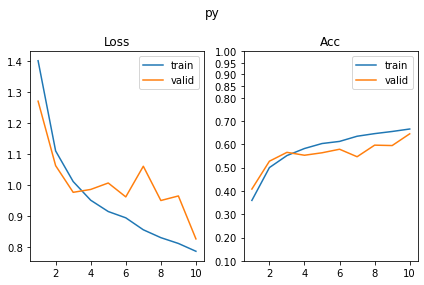

[480/630] px         SUP_[FCN32i223o128_d64]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 43.07it/s, loss=1.16, acc=0.476]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 79.85it/s, loss=1.17, acc=0.478]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 40.66it/s, loss=0.952, acc=0.598]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 65.05it/s, loss=1.04, acc=0.52]                                              
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 42.84it/s, loss=0.941, acc=0.607]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 106.25it/s, loss=0.902, acc=0.593]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 41.02it/s, loss=0.804, acc=0.64]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 108.65it/s, loss=0.882, acc=0.617]    

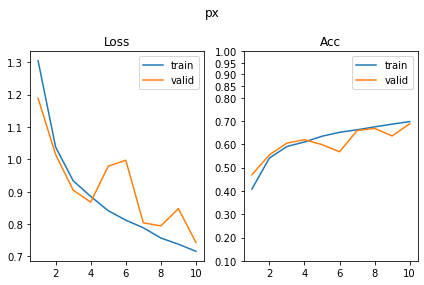

SUP_[FCN32i223o128_d64]_target_[color]
[481/630] shape      SUP_[FCN32i223o128_d64]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 36.77it/s, loss=1.42, acc=0.384]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 81.25it/s, loss=1.57, acc=0.324]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 36.19it/s, loss=1.35, acc=0.409]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 81.60it/s, loss=1.35, acc=0.456]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 37.98it/s, loss=1.29, acc=0.461]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 113.18it/s, loss=1.29, acc=0.461]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 43.22it/s, loss=1.23, acc=0.502]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 82.00it/s, loss=1.21, acc=0.488]      

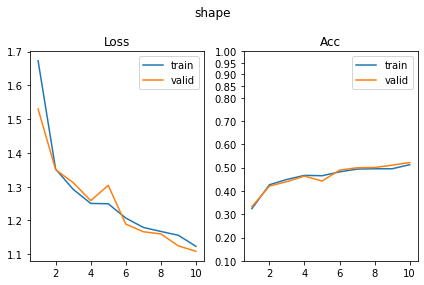

[482/630] scale      SUP_[FCN32i223o128_d64]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 43.67it/s, loss=1.1, acc=0.381]                                            
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 109.87it/s, loss=1.11, acc=0.388]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 46.17it/s, loss=1.08, acc=0.394]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 69.00it/s, loss=1.06, acc=0.417]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 47.22it/s, loss=1.07, acc=0.422]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 111.33it/s, loss=1.07, acc=0.39]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 43.63it/s, loss=1.07, acc=0.463]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 115.24it/s, loss=1.1, acc=0.402]      

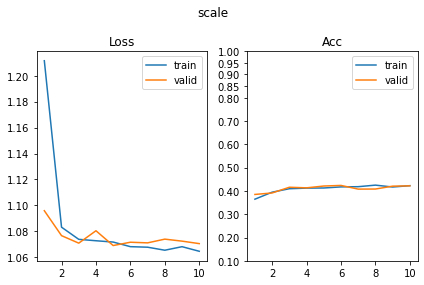

[483/630] color      SUP_[FCN32i223o128_d64]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 37.28it/s, loss=0.00222, acc=1]                                            
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 80.52it/s, loss=0.00864, acc=0.998]                                          
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 37.12it/s, loss=0.000569, acc=1]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 81.65it/s, loss=0.000931, acc=1]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 39.22it/s, loss=0.000595, acc=1]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 112.70it/s, loss=0.000898, acc=1]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 37.31it/s, loss=0.00153, acc=1]                                            
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 80.84it/s, loss=0.00998, acc=0.998]   

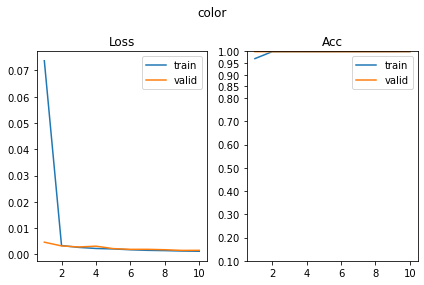

[484/630] angle      SUP_[FCN32i223o128_d64]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 37.49it/s, loss=2.8, acc=0.057]                                            
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 116.63it/s, loss=2.78, acc=0.0634]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 44.20it/s, loss=2.78, acc=0.0831]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 52.42it/s, loss=2.79, acc=0.0854]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 40.87it/s, loss=2.79, acc=0.0749]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 113.70it/s, loss=2.79, acc=0.0634]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 39.38it/s, loss=2.78, acc=0.0814]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 77.58it/s, loss=2.78, acc=0.0634]     

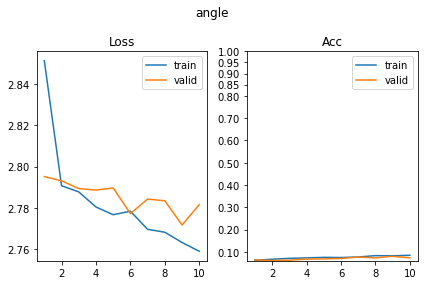

[485/630] py         SUP_[FCN32i223o128_d64]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 44.98it/s, loss=1.36, acc=0.306]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 81.75it/s, loss=1.38, acc=0.283]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 37.72it/s, loss=1.33, acc=0.349]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 110.22it/s, loss=1.35, acc=0.337]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 42.12it/s, loss=1.27, acc=0.394]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 115.37it/s, loss=1.26, acc=0.363]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 46.34it/s, loss=1.24, acc=0.438]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 82.20it/s, loss=1.19, acc=0.424]      

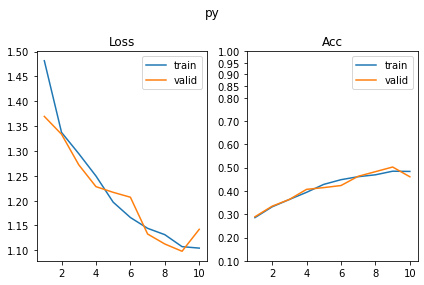

[486/630] px         SUP_[FCN32i223o128_d64]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 39.74it/s, loss=1.36, acc=0.318]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 107.91it/s, loss=1.38, acc=0.295]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 43.68it/s, loss=1.33, acc=0.36]                                            
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 69.76it/s, loss=1.34, acc=0.312]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 39.28it/s, loss=1.29, acc=0.399]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 80.93it/s, loss=1.33, acc=0.354]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 36.25it/s, loss=1.3, acc=0.368]                                            
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 79.02it/s, loss=1.27, acc=0.361]      

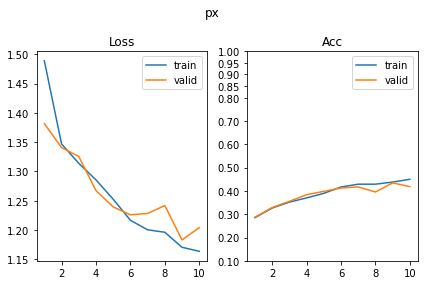

SUP_[FCN32i223o128_d64]_target_[angle]
[487/630] shape      SUP_[FCN32i223o128_d64]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 40.67it/s, loss=0.525, acc=0.795]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 110.61it/s, loss=0.488, acc=0.834]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 42.54it/s, loss=0.419, acc=0.832]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 101.11it/s, loss=0.477, acc=0.827]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 41.47it/s, loss=0.359, acc=0.881]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 83.82it/s, loss=0.401, acc=0.846]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 36.00it/s, loss=0.263, acc=0.884]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 78.83it/s, loss=0.383, acc=0.851]     

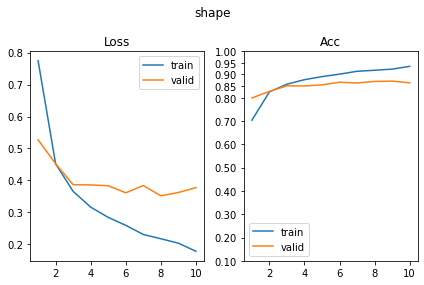

[488/630] scale      SUP_[FCN32i223o128_d64]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 36.14it/s, loss=1.07, acc=0.417]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 82.16it/s, loss=1.07, acc=0.424]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 41.90it/s, loss=1.03, acc=0.458]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 62.57it/s, loss=1.04, acc=0.446]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 40.41it/s, loss=1.01, acc=0.49]                                            
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 82.08it/s, loss=1.03, acc=0.466]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 42.40it/s, loss=0.975, acc=0.493]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 80.22it/s, loss=0.967, acc=0.502]     

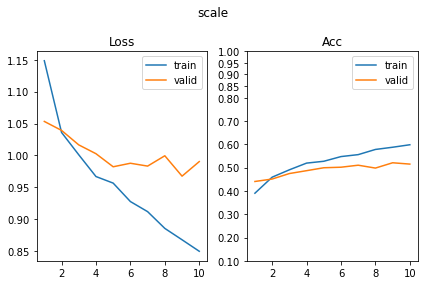

[489/630] color      SUP_[FCN32i223o128_d64]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 39.00it/s, loss=2.09, acc=0.168]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 85.73it/s, loss=2.08, acc=0.163]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 42.57it/s, loss=2.04, acc=0.191]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 80.53it/s, loss=2.06, acc=0.163]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 37.77it/s, loss=1.98, acc=0.218]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 81.01it/s, loss=2.05, acc=0.188]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 37.53it/s, loss=2, acc=0.226]                                              
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 80.45it/s, loss=2.03, acc=0.222]      

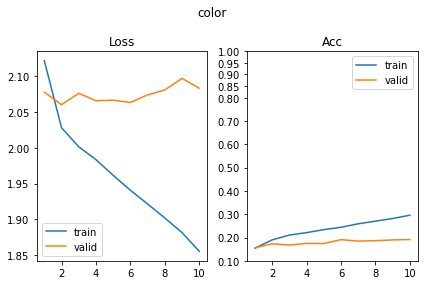

[490/630] angle      SUP_[FCN32i223o128_d64]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 42.50it/s, loss=0.082, acc=0.974]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 78.08it/s, loss=1.77, acc=0.554]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 40.00it/s, loss=0.0987, acc=0.963]                                         
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 61.54it/s, loss=1.93, acc=0.578]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 46.05it/s, loss=0.114, acc=0.963]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 111.94it/s, loss=1.84, acc=0.59]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 43.44it/s, loss=0.102, acc=0.958]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 81.25it/s, loss=2.06, acc=0.6]        

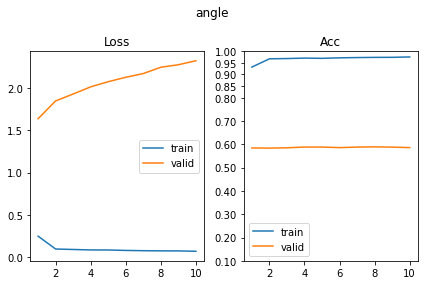

[491/630] py         SUP_[FCN32i223o128_d64]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 44.77it/s, loss=1.32, acc=0.353]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 107.30it/s, loss=1.28, acc=0.388]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 39.78it/s, loss=1.24, acc=0.428]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 71.38it/s, loss=1.24, acc=0.429]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 36.64it/s, loss=1.15, acc=0.485]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 80.89it/s, loss=1.23, acc=0.417]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 37.27it/s, loss=1.15, acc=0.479]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 81.31it/s, loss=1.2, acc=0.424]       

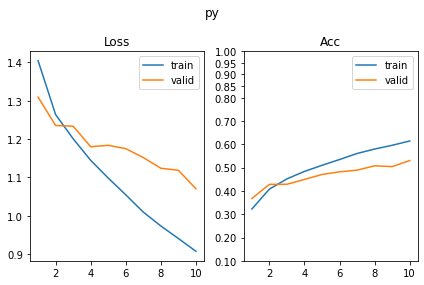

[492/630] px         SUP_[FCN32i223o128_d64]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 34.77it/s, loss=1.32, acc=0.336]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 80.59it/s, loss=1.34, acc=0.346]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 38.11it/s, loss=1.25, acc=0.419]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 49.79it/s, loss=1.29, acc=0.385]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 39.12it/s, loss=1.21, acc=0.441]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 80.58it/s, loss=1.26, acc=0.417]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 36.69it/s, loss=1.15, acc=0.489]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 77.25it/s, loss=1.26, acc=0.393]      

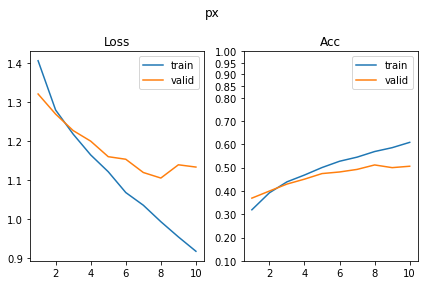

SUP_[FCN32i223o128_d64]_target_[py]
[493/630] shape      SUP_[FCN32i223o128_d64]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 39.54it/s, loss=0.943, acc=0.638]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 75.54it/s, loss=1.12, acc=0.602]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 36.22it/s, loss=0.638, acc=0.749]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 81.39it/s, loss=0.69, acc=0.737]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 37.87it/s, loss=0.592, acc=0.772]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 109.43it/s, loss=0.644, acc=0.763]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 42.60it/s, loss=0.537, acc=0.772]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 74.43it/s, loss=0.499, acc=0.81]      

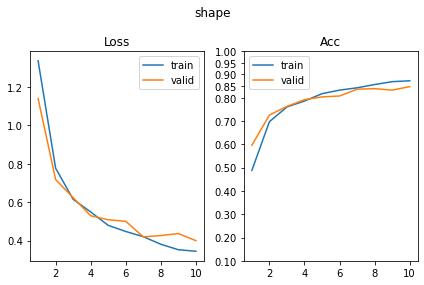

[494/630] scale      SUP_[FCN32i223o128_d64]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 38.39it/s, loss=0.948, acc=0.537]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 109.37it/s, loss=0.987, acc=0.485]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 43.17it/s, loss=0.824, acc=0.606]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 50.97it/s, loss=0.847, acc=0.585]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 41.75it/s, loss=0.757, acc=0.643]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 108.90it/s, loss=0.789, acc=0.62]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 40.69it/s, loss=0.746, acc=0.643]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 82.97it/s, loss=0.776, acc=0.632]     

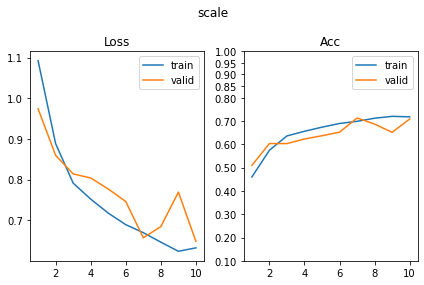

[495/630] color      SUP_[FCN32i223o128_d64]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 43.26it/s, loss=2.02, acc=0.179]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 110.42it/s, loss=2.01, acc=0.188]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 41.64it/s, loss=1.95, acc=0.204]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 107.68it/s, loss=2, acc=0.22]                                                
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 38.12it/s, loss=1.87, acc=0.254]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 81.43it/s, loss=1.89, acc=0.276]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 36.90it/s, loss=1.85, acc=0.252]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 80.97it/s, loss=1.93, acc=0.22]       

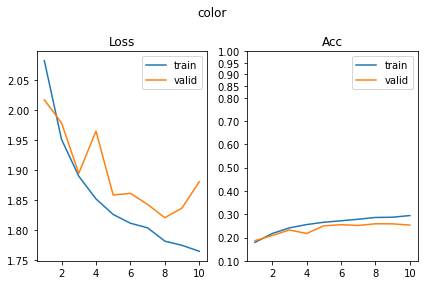

[496/630] angle      SUP_[FCN32i223o128_d64]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 40.67it/s, loss=2.64, acc=0.119]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 75.57it/s, loss=2.61, acc=0.168]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 43.70it/s, loss=2.45, acc=0.181]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 68.16it/s, loss=2.48, acc=0.22]                                              
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 44.50it/s, loss=2.16, acc=0.3]                                             
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 106.38it/s, loss=2.33, acc=0.2]                                              
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 41.90it/s, loss=1.99, acc=0.336]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 109.36it/s, loss=2.27, acc=0.224]     

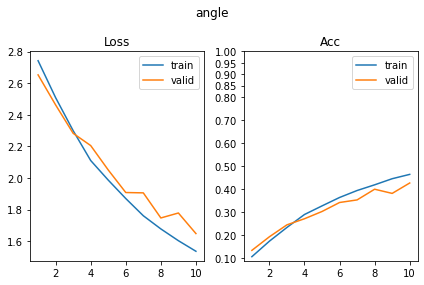

[497/630] py         SUP_[FCN32i223o128_d64]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 45.04it/s, loss=0.0185, acc=0.993]                                         
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 106.06it/s, loss=0.0499, acc=0.978]                                          
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 39.00it/s, loss=0.017, acc=0.992]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 109.33it/s, loss=0.0532, acc=0.985]                                          
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 40.79it/s, loss=0.0106, acc=0.997]                                         
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 80.04it/s, loss=0.0669, acc=0.983]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 36.71it/s, loss=0.0173, acc=0.993]                                         
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 81.07it/s, loss=0.0973, acc=0.966]    

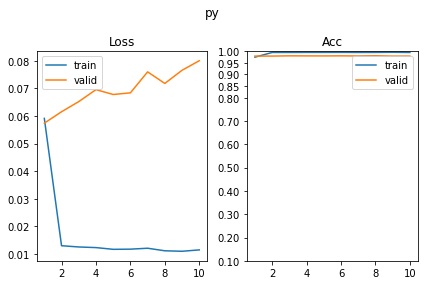

[498/630] px         SUP_[FCN32i223o128_d64]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 36.47it/s, loss=1.37, acc=0.303]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 82.05it/s, loss=1.39, acc=0.276]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 43.40it/s, loss=1.35, acc=0.319]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 66.97it/s, loss=1.36, acc=0.3]                                               
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 43.27it/s, loss=1.34, acc=0.313]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 104.94it/s, loss=1.33, acc=0.366]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 43.01it/s, loss=1.23, acc=0.404]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 105.93it/s, loss=1.28, acc=0.385]     

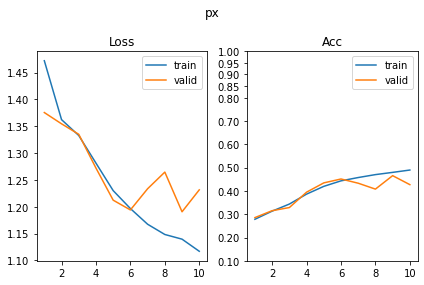

SUP_[FCN32i223o128_d64]_target_[px]
[499/630] shape      SUP_[FCN32i223o128_d64]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 45.43it/s, loss=0.963, acc=0.619]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 112.27it/s, loss=1.18, acc=0.559]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 38.29it/s, loss=0.714, acc=0.684]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 98.65it/s, loss=0.746, acc=0.7]                                              
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 36.78it/s, loss=0.616, acc=0.754]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 82.64it/s, loss=0.764, acc=0.695]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 42.11it/s, loss=0.537, acc=0.785]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 112.09it/s, loss=0.642, acc=0.741]    

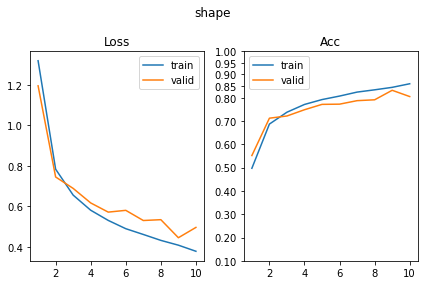

[500/630] scale      SUP_[FCN32i223o128_d64]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 44.54it/s, loss=0.99, acc=0.472]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 112.24it/s, loss=1.04, acc=0.417]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 48.45it/s, loss=0.861, acc=0.601]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 68.65it/s, loss=0.916, acc=0.549]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 41.91it/s, loss=0.843, acc=0.598]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 114.92it/s, loss=0.862, acc=0.588]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 42.98it/s, loss=0.796, acc=0.625]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 110.62it/s, loss=0.776, acc=0.622]    

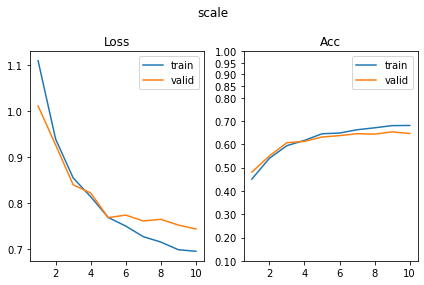

[501/630] color      SUP_[FCN32i223o128_d64]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 42.43it/s, loss=1.82, acc=0.27]                                            
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 110.87it/s, loss=1.86, acc=0.249]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 40.09it/s, loss=1.73, acc=0.296]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 110.03it/s, loss=1.85, acc=0.251]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 43.90it/s, loss=1.65, acc=0.309]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 111.28it/s, loss=1.72, acc=0.283]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 43.07it/s, loss=1.59, acc=0.327]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 111.82it/s, loss=1.68, acc=0.278]     

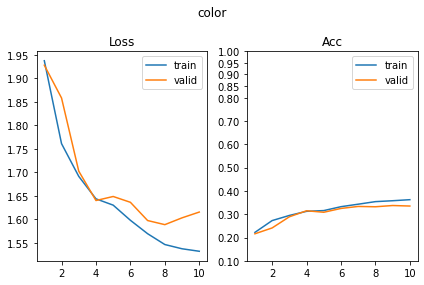

[502/630] angle      SUP_[FCN32i223o128_d64]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 38.40it/s, loss=2.61, acc=0.147]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 89.02it/s, loss=2.61, acc=0.139]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 42.92it/s, loss=2.39, acc=0.207]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 51.53it/s, loss=2.44, acc=0.202]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 41.40it/s, loss=2.23, acc=0.251]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 81.90it/s, loss=2.35, acc=0.224]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 39.65it/s, loss=2.09, acc=0.293]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 91.54it/s, loss=2.27, acc=0.207]      

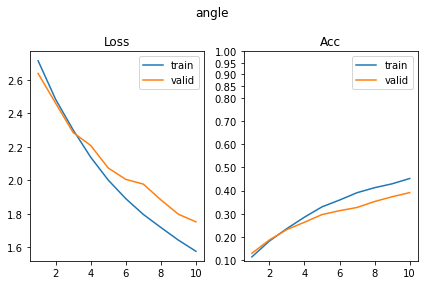

[503/630] py         SUP_[FCN32i223o128_d64]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 40.82it/s, loss=1.36, acc=0.311]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 81.64it/s, loss=1.37, acc=0.315]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 37.31it/s, loss=1.34, acc=0.345]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 82.48it/s, loss=1.37, acc=0.293]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 37.26it/s, loss=1.3, acc=0.353]                                            
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 82.05it/s, loss=1.31, acc=0.354]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 42.98it/s, loss=1.26, acc=0.409]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 109.80it/s, loss=1.31, acc=0.402]     

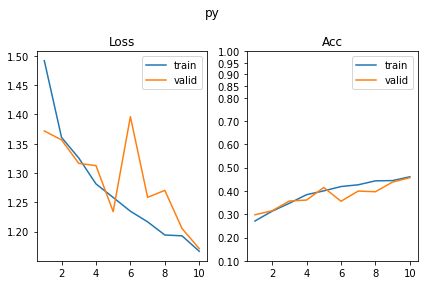

[504/630] px         SUP_[FCN32i223o128_d64]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 35.21it/s, loss=0.0306, acc=0.99]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 74.71it/s, loss=0.0383, acc=0.983]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 37.23it/s, loss=0.0222, acc=0.99]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 51.09it/s, loss=0.0841, acc=0.968]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 40.59it/s, loss=0.049, acc=0.982]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 111.70it/s, loss=0.0482, acc=0.985]                                          
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 41.69it/s, loss=0.0362, acc=0.979]                                         
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 110.83it/s, loss=0.0397, acc=0.983]   

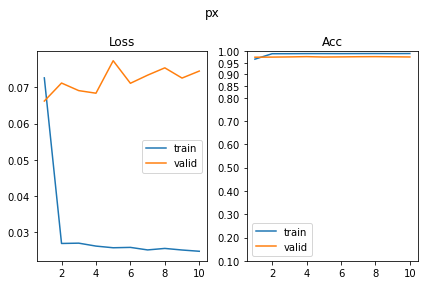

SUP_[FCN32i223o128_d128]_target_[shape]
[505/630] shape      SUP_[FCN32i223o128_d128]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 36.50it/s, loss=0.0128, acc=0.995]                                         
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 79.29it/s, loss=0.0339, acc=0.988]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 36.45it/s, loss=0.0124, acc=0.997]                                         
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 87.83it/s, loss=0.00985, acc=0.998]                                          
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 42.14it/s, loss=0.0151, acc=0.993]                                         
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 107.20it/s, loss=0.0216, acc=0.99]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 39.98it/s, loss=0.00411, acc=0.998]                                        
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 111.34it/s, loss=0.0503, acc=0.985]   

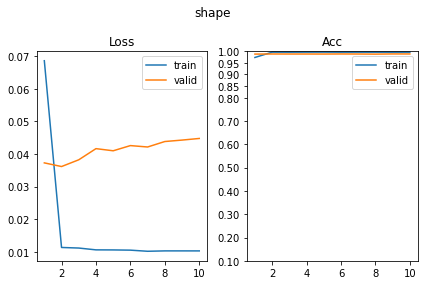

[506/630] scale      SUP_[FCN32i223o128_d128]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 41.53it/s, loss=0.805, acc=0.614]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 111.95it/s, loss=0.844, acc=0.59]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 42.20it/s, loss=0.676, acc=0.707]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 50.35it/s, loss=0.748, acc=0.641]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 38.90it/s, loss=0.619, acc=0.721]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 80.04it/s, loss=0.639, acc=0.732]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 38.55it/s, loss=0.596, acc=0.715]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 101.36it/s, loss=0.627, acc=0.707]    

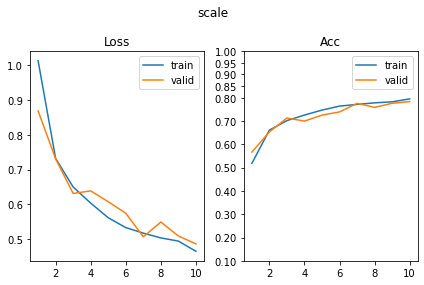

[507/630] color      SUP_[FCN32i223o128_d128]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 42.15it/s, loss=2.03, acc=0.181]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 84.53it/s, loss=2.02, acc=0.168]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 45.44it/s, loss=2, acc=0.205]                                              
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 109.03it/s, loss=1.99, acc=0.205]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 45.10it/s, loss=1.94, acc=0.238]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 88.18it/s, loss=1.95, acc=0.237]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 36.88it/s, loss=1.93, acc=0.217]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 104.15it/s, loss=1.97, acc=0.205]     

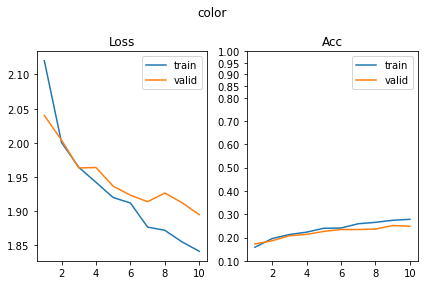

[508/630] angle      SUP_[FCN32i223o128_d128]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 36.85it/s, loss=2.04, acc=0.29]                                            
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 112.70it/s, loss=2.33, acc=0.2]                                              
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 42.78it/s, loss=1.65, acc=0.375]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 52.25it/s, loss=1.76, acc=0.337]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 38.36it/s, loss=1.48, acc=0.435]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 78.94it/s, loss=1.39, acc=0.461]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 39.31it/s, loss=1.31, acc=0.503]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 88.11it/s, loss=1.39, acc=0.478]      

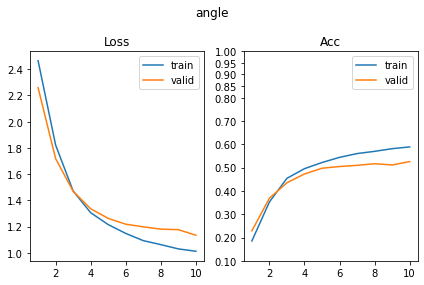

[509/630] py         SUP_[FCN32i223o128_d128]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 34.68it/s, loss=1.24, acc=0.441]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 75.45it/s, loss=1.26, acc=0.407]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 36.60it/s, loss=1.08, acc=0.498]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 79.31it/s, loss=1.14, acc=0.473]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 36.35it/s, loss=0.858, acc=0.621]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 76.25it/s, loss=0.983, acc=0.588]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 36.37it/s, loss=0.787, acc=0.65]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 79.77it/s, loss=0.887, acc=0.605]     

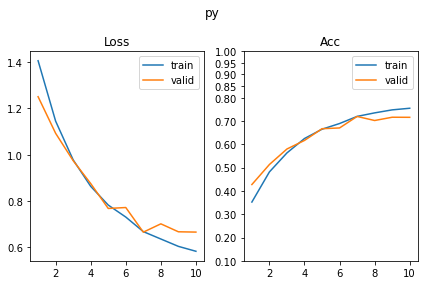

[510/630] px         SUP_[FCN32i223o128_d128]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 38.39it/s, loss=1.2, acc=0.44]                                             
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 84.66it/s, loss=1.29, acc=0.398]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 41.42it/s, loss=1.01, acc=0.555]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 67.81it/s, loss=1.01, acc=0.554]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 40.04it/s, loss=0.872, acc=0.617]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 100.62it/s, loss=0.893, acc=0.622]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 41.26it/s, loss=0.839, acc=0.64]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 98.56it/s, loss=0.788, acc=0.62]      

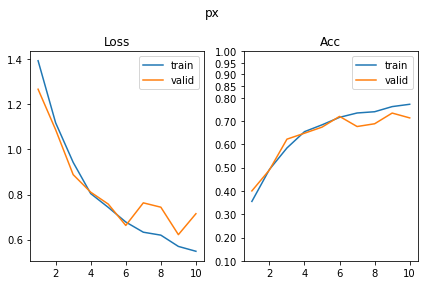

SUP_[FCN32i223o128_d128]_target_[scale]
[511/630] shape      SUP_[FCN32i223o128_d128]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 41.26it/s, loss=0.523, acc=0.796]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 107.48it/s, loss=1.06, acc=0.556]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 40.71it/s, loss=0.375, acc=0.866]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 80.57it/s, loss=0.47, acc=0.837]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 41.44it/s, loss=0.305, acc=0.893]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 111.43it/s, loss=0.335, acc=0.873]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 39.22it/s, loss=0.285, acc=0.901]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 79.83it/s, loss=0.497, acc=0.82]      

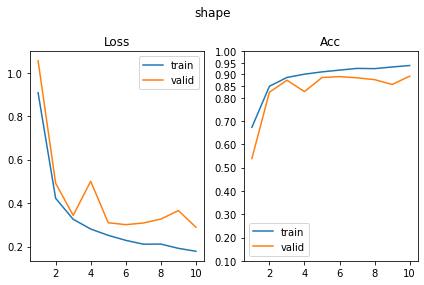

[512/630] scale      SUP_[FCN32i223o128_d128]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 36.39it/s, loss=0.0113, acc=0.997]                                         
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 80.35it/s, loss=0.148, acc=0.949]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 39.32it/s, loss=0.0212, acc=0.993]                                         
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 51.69it/s, loss=0.053, acc=0.98]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 39.61it/s, loss=0.0133, acc=0.995]                                         
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 81.44it/s, loss=0.175, acc=0.963]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 36.48it/s, loss=0.0137, acc=0.993]                                         
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 77.19it/s, loss=0.159, acc=0.949]     

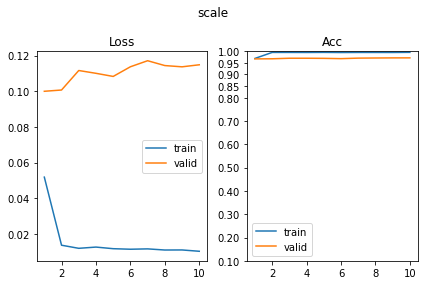

[513/630] color      SUP_[FCN32i223o128_d128]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 36.33it/s, loss=2, acc=0.168]                                              
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 100.59it/s, loss=2, acc=0.19]                                                
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 36.69it/s, loss=2.03, acc=0.173]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 81.59it/s, loss=2.02, acc=0.166]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 41.90it/s, loss=1.96, acc=0.204]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 111.29it/s, loss=2, acc=0.222]                                               
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 44.42it/s, loss=1.95, acc=0.218]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 80.40it/s, loss=2.06, acc=0.159]      

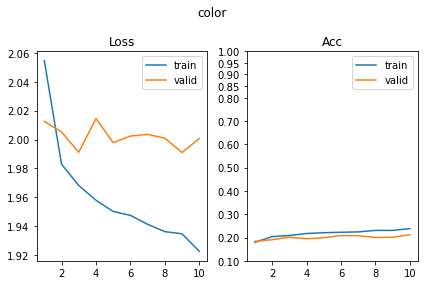

[514/630] angle      SUP_[FCN32i223o128_d128]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 42.38it/s, loss=2.48, acc=0.184]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 94.85it/s, loss=2.62, acc=0.159]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 42.42it/s, loss=1.95, acc=0.352]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 69.46it/s, loss=2.23, acc=0.266]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 45.08it/s, loss=1.78, acc=0.402]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 108.70it/s, loss=1.99, acc=0.341]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 40.78it/s, loss=1.55, acc=0.456]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 103.99it/s, loss=1.75, acc=0.41]      

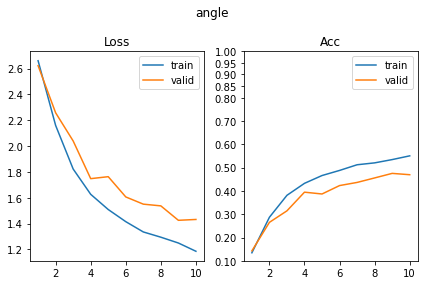

[515/630] py         SUP_[FCN32i223o128_d128]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 36.01it/s, loss=0.858, acc=0.642]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 80.68it/s, loss=0.943, acc=0.644]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 36.56it/s, loss=0.726, acc=0.686]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 80.18it/s, loss=0.737, acc=0.673]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 38.33it/s, loss=0.647, acc=0.712]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 80.34it/s, loss=0.65, acc=0.734]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 36.00it/s, loss=0.575, acc=0.751]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 80.12it/s, loss=0.605, acc=0.705]     

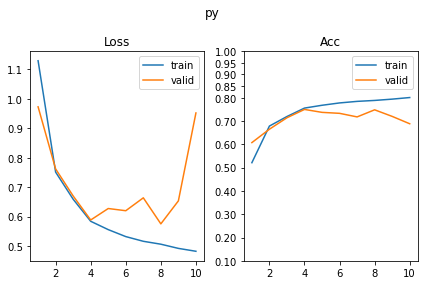

[516/630] px         SUP_[FCN32i223o128_d128]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 35.87it/s, loss=0.862, acc=0.64]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 104.06it/s, loss=1.2, acc=0.427]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 43.29it/s, loss=0.794, acc=0.647]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 51.95it/s, loss=0.877, acc=0.622]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 38.30it/s, loss=0.609, acc=0.744]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 80.20it/s, loss=0.626, acc=0.734]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 40.96it/s, loss=0.654, acc=0.712]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 107.20it/s, loss=0.786, acc=0.661]    

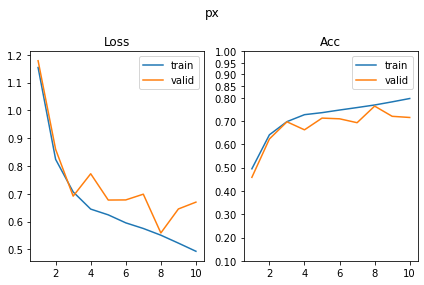

SUP_[FCN32i223o128_d128]_target_[color]
[517/630] shape      SUP_[FCN32i223o128_d128]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 36.85it/s, loss=1.5, acc=0.376]                                            
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 77.88it/s, loss=1.55, acc=0.339]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 38.36it/s, loss=1.37, acc=0.404]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 77.73it/s, loss=1.36, acc=0.434]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 36.46it/s, loss=1.3, acc=0.41]                                             
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 79.24it/s, loss=1.37, acc=0.424]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 42.01it/s, loss=1.2, acc=0.49]                                             
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 79.55it/s, loss=1.33, acc=0.461]      

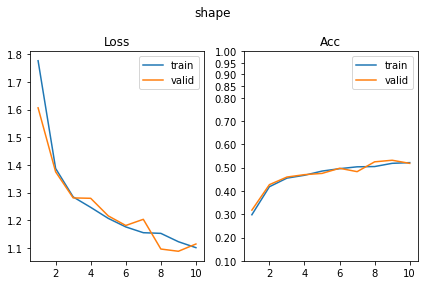

[518/630] scale      SUP_[FCN32i223o128_d128]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 35.05it/s, loss=1.1, acc=0.352]                                            
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 81.79it/s, loss=1.1, acc=0.376]                                              
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 38.35it/s, loss=1.08, acc=0.379]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 52.97it/s, loss=1.08, acc=0.415]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 39.11it/s, loss=1.09, acc=0.358]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 81.43it/s, loss=1.07, acc=0.398]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 41.34it/s, loss=1.08, acc=0.397]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 105.80it/s, loss=1.07, acc=0.393]     

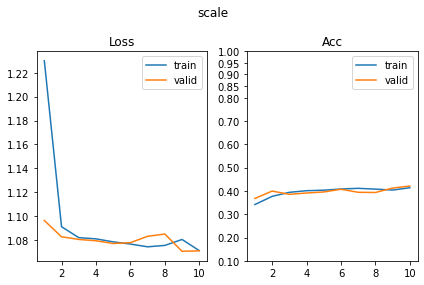

[519/630] color      SUP_[FCN32i223o128_d128]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 39.15it/s, loss=0.000769, acc=1]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 107.21it/s, loss=0.00117, acc=1]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 38.10it/s, loss=0.000394, acc=1]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 77.48it/s, loss=0.000792, acc=1]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 36.39it/s, loss=0.000308, acc=1]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 79.88it/s, loss=0.000213, acc=1]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 42.35it/s, loss=0.000175, acc=1]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 99.49it/s, loss=0.00023, acc=1]       

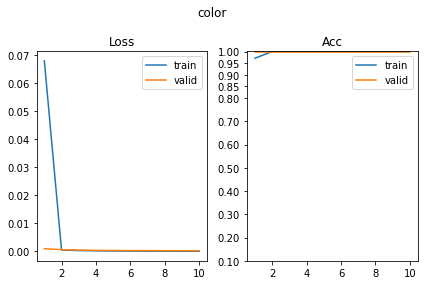

[520/630] angle      SUP_[FCN32i223o128_d128]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 43.54it/s, loss=2.8, acc=0.0635]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 102.71it/s, loss=2.81, acc=0.0683]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 45.02it/s, loss=2.78, acc=0.07]                                            
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 59.99it/s, loss=2.76, acc=0.0634]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 41.09it/s, loss=2.79, acc=0.0684]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 98.29it/s, loss=2.8, acc=0.0707]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 36.35it/s, loss=2.78, acc=0.0733]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 81.27it/s, loss=2.8, acc=0.0439]      

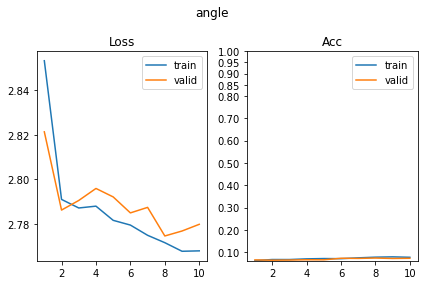

[521/630] py         SUP_[FCN32i223o128_d128]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 36.88it/s, loss=1.35, acc=0.336]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 109.78it/s, loss=1.34, acc=0.359]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 38.87it/s, loss=1.32, acc=0.371]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 88.93it/s, loss=1.32, acc=0.341]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 44.07it/s, loss=1.32, acc=0.337]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 105.23it/s, loss=1.35, acc=0.344]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 41.44it/s, loss=1.27, acc=0.383]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 86.88it/s, loss=1.3, acc=0.359]       

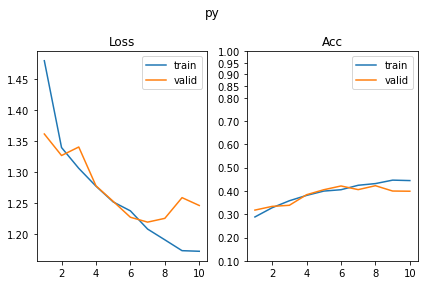

[522/630] px         SUP_[FCN32i223o128_d128]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 43.66it/s, loss=1.36, acc=0.285]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 67.10it/s, loss=1.4, acc=0.295]                                              
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 41.38it/s, loss=1.35, acc=0.331]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 79.76it/s, loss=1.35, acc=0.322]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 34.76it/s, loss=1.3, acc=0.345]                                            
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 82.09it/s, loss=1.37, acc=0.317]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 36.20it/s, loss=1.28, acc=0.379]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 81.00it/s, loss=1.34, acc=0.327]      

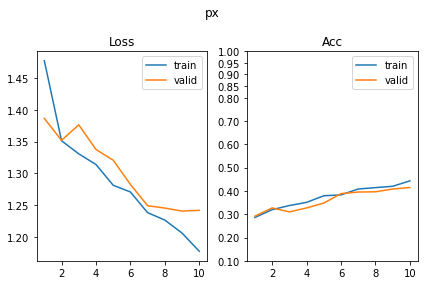

SUP_[FCN32i223o128_d128]_target_[angle]
[523/630] shape      SUP_[FCN32i223o128_d128]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 37.10it/s, loss=0.438, acc=0.836]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 88.26it/s, loss=0.438, acc=0.829]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 38.37it/s, loss=0.267, acc=0.901]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 51.44it/s, loss=0.354, acc=0.893]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 44.61it/s, loss=0.209, acc=0.923]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 103.02it/s, loss=0.285, acc=0.9]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 40.42it/s, loss=0.179, acc=0.938]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 78.76it/s, loss=0.255, acc=0.905]     

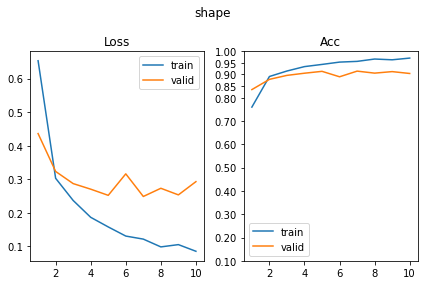

[524/630] scale      SUP_[FCN32i223o128_d128]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 34.39it/s, loss=1.02, acc=0.45]                                            
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 77.63it/s, loss=1.06, acc=0.439]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 36.91it/s, loss=0.975, acc=0.524]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 109.58it/s, loss=1.02, acc=0.468]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 37.45it/s, loss=0.959, acc=0.544]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 76.28it/s, loss=0.973, acc=0.532]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 37.54it/s, loss=0.943, acc=0.536]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 80.31it/s, loss=1.01, acc=0.498]      

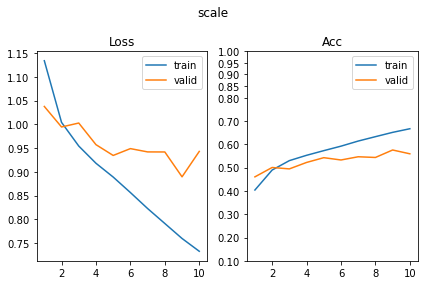

[525/630] color      SUP_[FCN32i223o128_d128]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 34.62it/s, loss=2.06, acc=0.174]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 79.60it/s, loss=2.05, acc=0.185]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 39.01it/s, loss=2.01, acc=0.226]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 51.56it/s, loss=2.05, acc=0.2]                                               
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 47.23it/s, loss=1.94, acc=0.257]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 113.01it/s, loss=2.03, acc=0.205]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 42.98it/s, loss=1.92, acc=0.259]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 112.92it/s, loss=2.01, acc=0.198]     

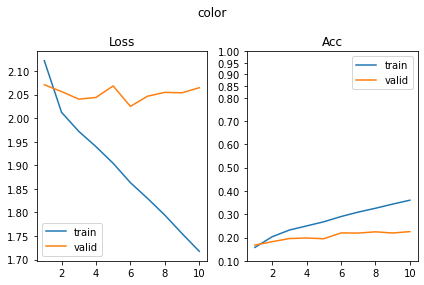

[526/630] angle      SUP_[FCN32i223o128_d128]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 34.13it/s, loss=0.123, acc=0.966]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 78.05it/s, loss=1.87, acc=0.546]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 35.23it/s, loss=0.0864, acc=0.971]                                         
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 84.21it/s, loss=1.77, acc=0.602]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 40.43it/s, loss=0.0842, acc=0.977]                                         
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 102.97it/s, loss=1.76, acc=0.607]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 40.63it/s, loss=0.0963, acc=0.959]                                         
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 103.49it/s, loss=1.89, acc=0.632]     

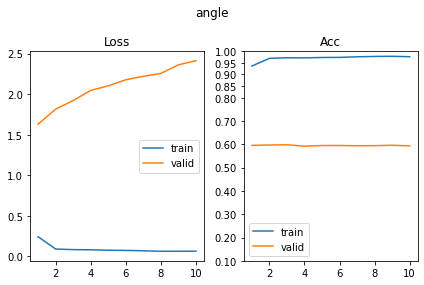

[527/630] py         SUP_[FCN32i223o128_d128]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 35.81it/s, loss=1.23, acc=0.433]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 81.18it/s, loss=1.28, acc=0.388]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 38.75it/s, loss=1.12, acc=0.515]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 52.73it/s, loss=1.21, acc=0.459]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 43.34it/s, loss=0.973, acc=0.552]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 81.18it/s, loss=1.03, acc=0.568]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 36.62it/s, loss=0.895, acc=0.598]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 80.68it/s, loss=1.06, acc=0.52]       

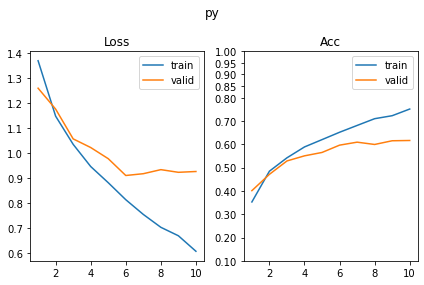

[528/630] px         SUP_[FCN32i223o128_d128]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 39.26it/s, loss=1.24, acc=0.44]                                            
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 79.81it/s, loss=1.29, acc=0.376]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 38.91it/s, loss=1.15, acc=0.513]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 105.51it/s, loss=1.23, acc=0.432]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 37.65it/s, loss=1.07, acc=0.531]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 79.72it/s, loss=1.14, acc=0.485]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 41.11it/s, loss=0.995, acc=0.559]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 110.56it/s, loss=1.01, acc=0.559]     

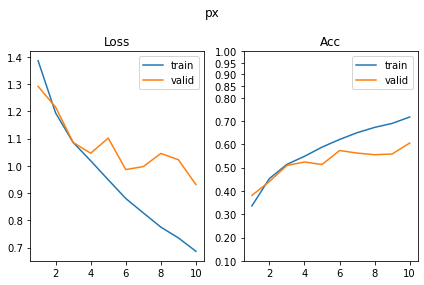

SUP_[FCN32i223o128_d128]_target_[py]
[529/630] shape      SUP_[FCN32i223o128_d128]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 45.37it/s, loss=0.721, acc=0.725]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 100.45it/s, loss=1.09, acc=0.598]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 42.61it/s, loss=0.482, acc=0.814]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 66.57it/s, loss=0.498, acc=0.802]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 40.49it/s, loss=0.357, acc=0.87]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 77.34it/s, loss=0.418, acc=0.837]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 39.63it/s, loss=0.37, acc=0.858]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 101.98it/s, loss=0.428, acc=0.849]    

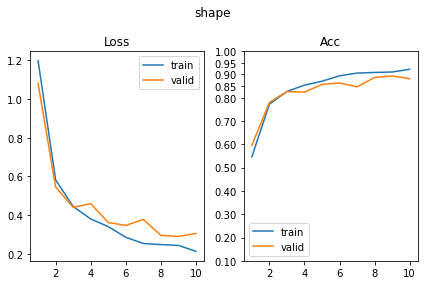

[530/630] scale      SUP_[FCN32i223o128_d128]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 37.31it/s, loss=0.882, acc=0.583]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 80.30it/s, loss=0.932, acc=0.549]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 40.68it/s, loss=0.789, acc=0.624]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 109.91it/s, loss=0.817, acc=0.646]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 40.86it/s, loss=0.664, acc=0.71]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 74.45it/s, loss=0.861, acc=0.583]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 39.85it/s, loss=0.653, acc=0.691]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 80.86it/s, loss=0.657, acc=0.72]      

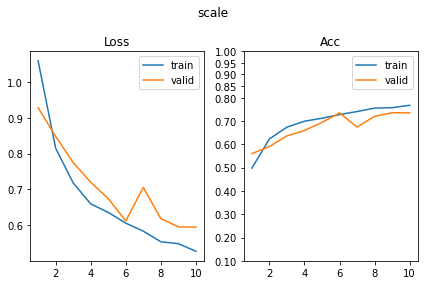

[531/630] color      SUP_[FCN32i223o128_d128]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 38.14it/s, loss=1.98, acc=0.194]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 89.80it/s, loss=2.01, acc=0.2]                                               
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 38.98it/s, loss=1.95, acc=0.217]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 64.23it/s, loss=1.99, acc=0.229]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 42.10it/s, loss=1.95, acc=0.218]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 79.24it/s, loss=1.96, acc=0.224]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 36.86it/s, loss=1.95, acc=0.225]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 79.16it/s, loss=1.98, acc=0.2]        

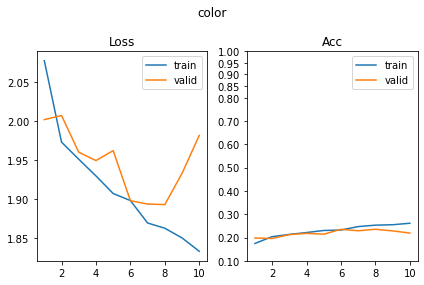

[532/630] angle      SUP_[FCN32i223o128_d128]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 43.25it/s, loss=2.45, acc=0.174]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 93.94it/s, loss=2.61, acc=0.139]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 39.93it/s, loss=2.19, acc=0.252]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 103.36it/s, loss=2.38, acc=0.198]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 39.30it/s, loss=1.92, acc=0.353]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 107.38it/s, loss=2.13, acc=0.259]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 37.39it/s, loss=1.87, acc=0.347]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 77.51it/s, loss=2.01, acc=0.334]      

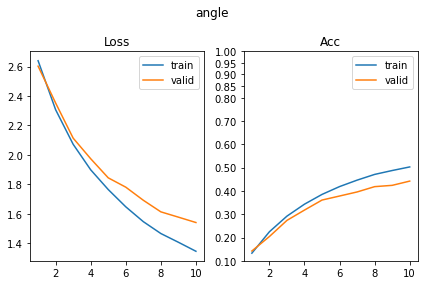

[533/630] py         SUP_[FCN32i223o128_d128]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 39.33it/s, loss=0.0126, acc=0.995]                                         
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 103.53it/s, loss=0.025, acc=0.99]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 40.86it/s, loss=0.0148, acc=0.993]                                         
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 52.19it/s, loss=0.0186, acc=0.993]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 39.31it/s, loss=0.0203, acc=0.989]                                         
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 80.58it/s, loss=0.0589, acc=0.983]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 39.53it/s, loss=0.0191, acc=0.993]                                         
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 77.03it/s, loss=0.0572, acc=0.988]    

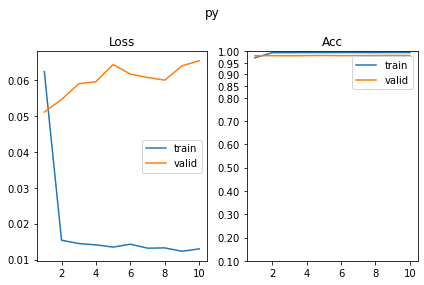

[534/630] px         SUP_[FCN32i223o128_d128]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 40.50it/s, loss=1.39, acc=0.282]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 104.29it/s, loss=1.38, acc=0.339]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 41.25it/s, loss=1.34, acc=0.324]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 87.72it/s, loss=1.34, acc=0.351]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 37.88it/s, loss=1.25, acc=0.415]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 79.61it/s, loss=1.34, acc=0.366]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 41.04it/s, loss=1.19, acc=0.477]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 106.35it/s, loss=1.25, acc=0.417]     

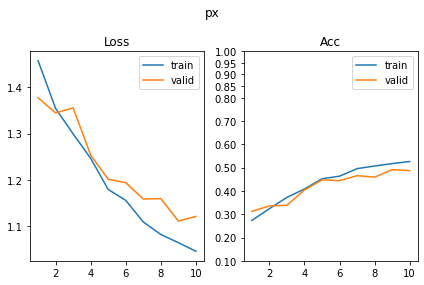

SUP_[FCN32i223o128_d128]_target_[px]
[535/630] shape      SUP_[FCN32i223o128_d128]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 37.43it/s, loss=0.725, acc=0.723]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 78.65it/s, loss=1.04, acc=0.617]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 38.97it/s, loss=0.464, acc=0.831]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 64.54it/s, loss=0.597, acc=0.756]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 39.38it/s, loss=0.416, acc=0.832]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 82.16it/s, loss=0.447, acc=0.844]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 35.63it/s, loss=0.333, acc=0.896]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 80.40it/s, loss=0.469, acc=0.832]     

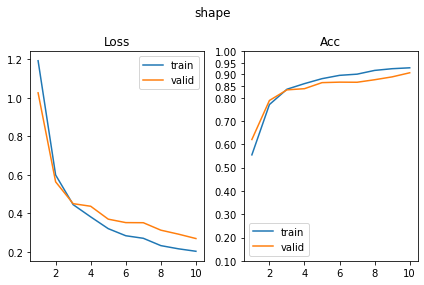

[536/630] scale      SUP_[FCN32i223o128_d128]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 38.53it/s, loss=0.871, acc=0.607]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 107.90it/s, loss=0.924, acc=0.541]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 41.35it/s, loss=0.822, acc=0.619]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 107.69it/s, loss=0.765, acc=0.663]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 40.20it/s, loss=0.69, acc=0.697]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 77.03it/s, loss=0.742, acc=0.654]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 39.68it/s, loss=0.629, acc=0.741]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 113.16it/s, loss=0.664, acc=0.715]    

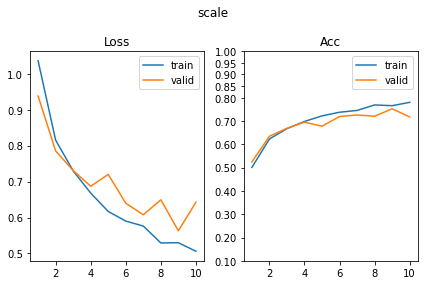

[537/630] color      SUP_[FCN32i223o128_d128]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 36.20it/s, loss=1.99, acc=0.199]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 75.46it/s, loss=1.99, acc=0.198]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 40.25it/s, loss=1.99, acc=0.192]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 65.54it/s, loss=1.92, acc=0.198]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 41.49it/s, loss=1.92, acc=0.235]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 112.33it/s, loss=1.87, acc=0.222]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 40.92it/s, loss=1.86, acc=0.254]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 81.10it/s, loss=1.87, acc=0.239]      

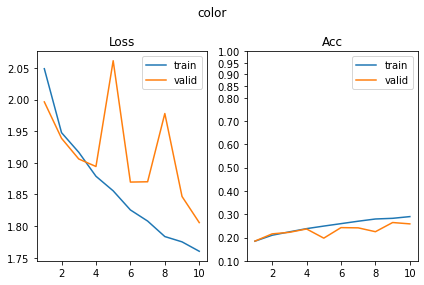

[538/630] angle      SUP_[FCN32i223o128_d128]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 41.99it/s, loss=2.46, acc=0.191]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 106.67it/s, loss=2.55, acc=0.163]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 42.01it/s, loss=2.2, acc=0.259]                                            
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 107.89it/s, loss=2.19, acc=0.283]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 38.66it/s, loss=1.9, acc=0.381]                                            
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 78.84it/s, loss=2.02, acc=0.295]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 36.77it/s, loss=1.78, acc=0.399]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 81.51it/s, loss=1.97, acc=0.351]      

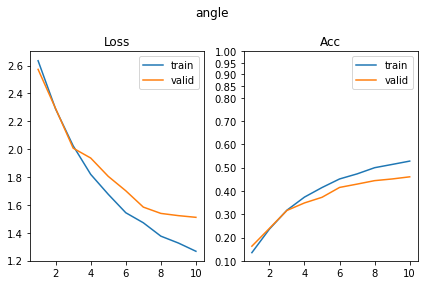

[539/630] py         SUP_[FCN32i223o128_d128]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 38.68it/s, loss=1.4, acc=0.264]                                            
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 111.19it/s, loss=1.38, acc=0.285]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 45.28it/s, loss=1.35, acc=0.339]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 66.12it/s, loss=1.34, acc=0.334]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 38.49it/s, loss=1.26, acc=0.412]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 85.05it/s, loss=1.34, acc=0.329]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 43.45it/s, loss=1.22, acc=0.445]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 83.04it/s, loss=1.33, acc=0.349]      

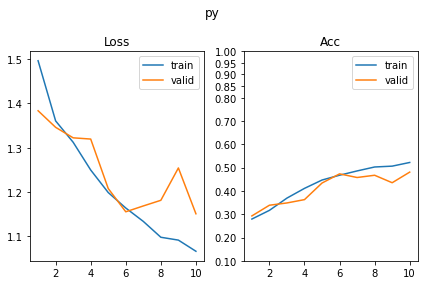

[540/630] px         SUP_[FCN32i223o128_d128]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 43.51it/s, loss=0.012, acc=0.995]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 81.03it/s, loss=0.0764, acc=0.978]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 36.93it/s, loss=0.0229, acc=0.99]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 79.02it/s, loss=0.043, acc=0.985]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 37.25it/s, loss=0.0207, acc=0.989]                                         
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 79.32it/s, loss=0.0747, acc=0.978]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 41.87it/s, loss=0.02, acc=0.993]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 107.58it/s, loss=0.0196, acc=0.985]   

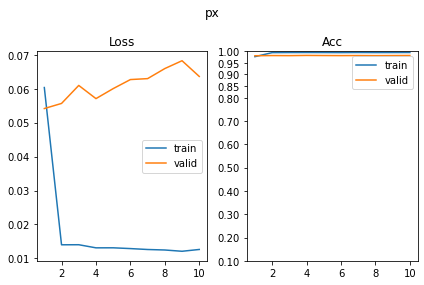

BTwins_[FCN8i223o32_d_8]_target_[shape]
[541/630] shape      BTwins_[FCN8i223o32_d_8]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 40.22it/s, loss=1.05, acc=0.518]                                           
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 109.91it/s, loss=1.09, acc=0.51]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 43.78it/s, loss=0.991, acc=0.568]                                          
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 92.42it/s, loss=1.01, acc=0.514]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 46.54it/s, loss=0.935, acc=0.588]                                          
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 78.59it/s, loss=0.955, acc=0.557]                                          
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 39.89it/s, loss=0.892, acc=0.596]                                          
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 115.14it/s, loss=0.892, acc=0.596]  

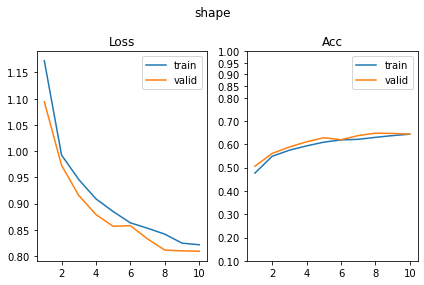

[542/630] scale      BTwins_[FCN8i223o32_d_8]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 48.34it/s, loss=1.1, acc=0.387]                                            
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 89.38it/s, loss=1.08, acc=0.395]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 45.39it/s, loss=1.08, acc=0.359]                                           
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 91.82it/s, loss=1.09, acc=0.4]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 41.39it/s, loss=1.09, acc=0.402]                                           
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 82.73it/s, loss=1.08, acc=0.369]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 48.34it/s, loss=1.08, acc=0.355]                                           
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 90.88it/s, loss=1.08, acc=0.416]    

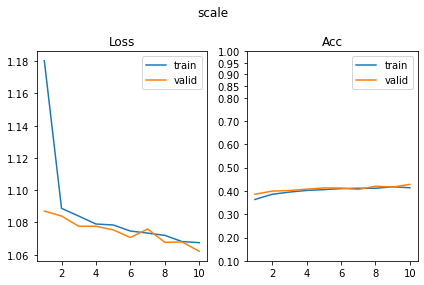

[543/630] color      BTwins_[FCN8i223o32_d_8]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 40.03it/s, loss=1.69, acc=0.305]                                           
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 115.93it/s, loss=1.71, acc=0.322]                                          
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 43.62it/s, loss=1.67, acc=0.33]                                            
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 93.32it/s, loss=1.59, acc=0.389]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 44.83it/s, loss=1.6, acc=0.354]                                            
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 70.80it/s, loss=1.63, acc=0.344]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 38.37it/s, loss=1.62, acc=0.342]                                           
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 84.23it/s, loss=1.59, acc=0.352]    

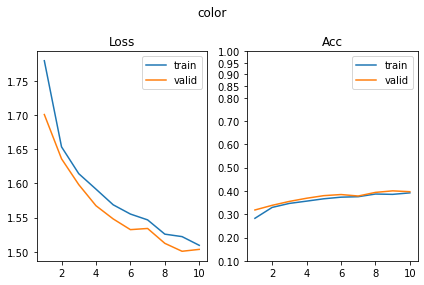

[544/630] angle      BTwins_[FCN8i223o32_d_8]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 46.36it/s, loss=2.44, acc=0.146]                                           
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 69.71it/s, loss=2.48, acc=0.15]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 37.84it/s, loss=2.33, acc=0.182]                                           
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 80.44it/s, loss=2.29, acc=0.186]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 40.44it/s, loss=2.29, acc=0.166]                                           
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 92.01it/s, loss=2.31, acc=0.205]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 40.71it/s, loss=2.34, acc=0.156]                                           
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 70.92it/s, loss=2.25, acc=0.195]    

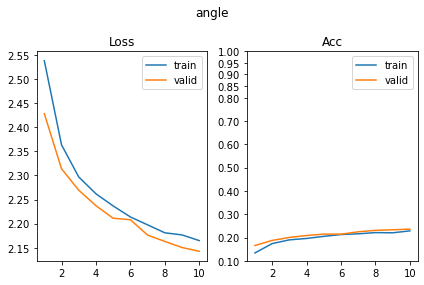

[545/630] py         BTwins_[FCN8i223o32_d_8]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 44.51it/s, loss=1.39, acc=0.268]                                           
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 87.14it/s, loss=1.39, acc=0.27]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 41.25it/s, loss=1.39, acc=0.287]                                           
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 91.52it/s, loss=1.4, acc=0.266]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 40.99it/s, loss=1.39, acc=0.275]                                           
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 71.37it/s, loss=1.38, acc=0.291]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 37.77it/s, loss=1.39, acc=0.303]                                           
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 80.09it/s, loss=1.4, acc=0.24]      

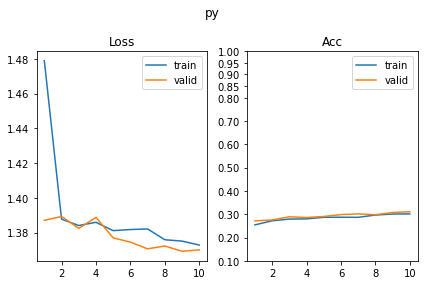

[546/630] px         BTwins_[FCN8i223o32_d_8]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 41.93it/s, loss=1.39, acc=0.264]                                           
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 86.98it/s, loss=1.39, acc=0.273]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 41.11it/s, loss=1.4, acc=0.258]                                            
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 80.63it/s, loss=1.38, acc=0.283]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 38.25it/s, loss=1.39, acc=0.264]                                           
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 70.50it/s, loss=1.38, acc=0.258]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 41.04it/s, loss=1.39, acc=0.283]                                           
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 73.36it/s, loss=1.39, acc=0.244]    

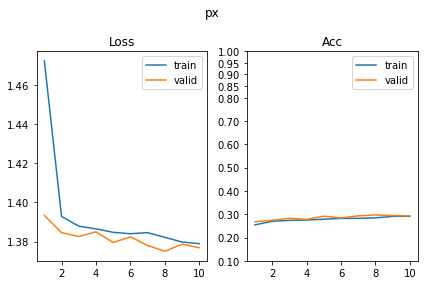

BTwins_[FCN8i223o32_d_16]_target_[shape]
[547/630] shape      BTwins_[FCN8i223o32_d_16]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 38.09it/s, loss=0.418, acc=0.844]                                          
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 80.25it/s, loss=0.505, acc=0.818]                                          
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 41.99it/s, loss=0.368, acc=0.844]                                          
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 98.60it/s, loss=0.352, acc=0.867]                                          
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 42.61it/s, loss=0.323, acc=0.875]                                          
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 70.32it/s, loss=0.381, acc=0.836]                                          
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 38.14it/s, loss=0.305, acc=0.904]                                          
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 81.46it/s, loss=0.251, acc=0.893]   

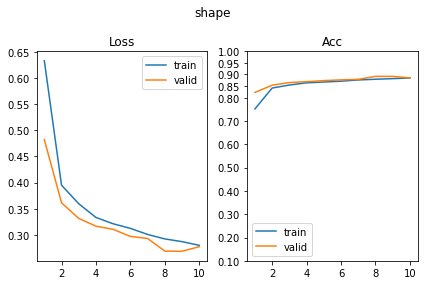

[548/630] scale      BTwins_[FCN8i223o32_d_16]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 41.69it/s, loss=1.09, acc=0.385]                                           
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 69.69it/s, loss=1.09, acc=0.379]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 42.91it/s, loss=1.07, acc=0.414]                                           
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 104.29it/s, loss=1.05, acc=0.426]                                          
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 42.15it/s, loss=1.05, acc=0.453]                                           
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 92.64it/s, loss=1.06, acc=0.426]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 41.09it/s, loss=1.03, acc=0.453]                                           
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 87.97it/s, loss=1.03, acc=0.438]    

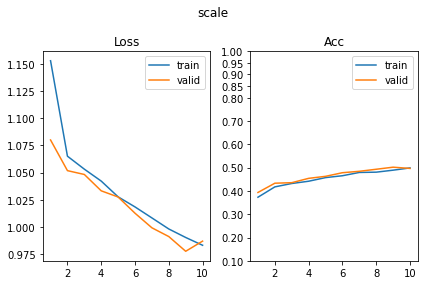

[549/630] color      BTwins_[FCN8i223o32_d_16]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 45.55it/s, loss=1.4, acc=0.453]                                            
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 107.93it/s, loss=1.39, acc=0.449]                                          
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 42.95it/s, loss=1.26, acc=0.498]                                           
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 95.16it/s, loss=1.25, acc=0.479]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 45.85it/s, loss=1.26, acc=0.477]                                           
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 90.67it/s, loss=1.25, acc=0.494]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 42.12it/s, loss=1.21, acc=0.494]                                           
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 78.16it/s, loss=1.14, acc=0.537]    

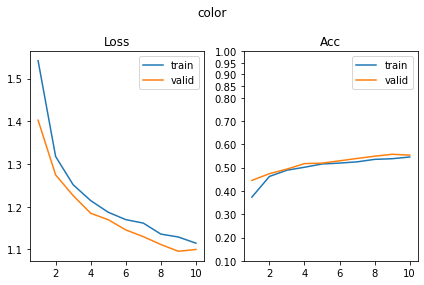

[550/630] angle      BTwins_[FCN8i223o32_d_16]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 40.57it/s, loss=2, acc=0.252]                                              
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 69.86it/s, loss=1.96, acc=0.258]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 41.59it/s, loss=1.79, acc=0.309]                                           
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 78.85it/s, loss=1.8, acc=0.299]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 42.21it/s, loss=1.75, acc=0.311]                                           
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 82.33it/s, loss=1.68, acc=0.32]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 40.42it/s, loss=1.71, acc=0.344]                                           
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 69.74it/s, loss=1.67, acc=0.373]    

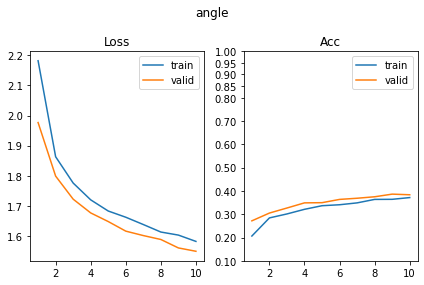

[551/630] py         BTwins_[FCN8i223o32_d_16]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 38.01it/s, loss=1.39, acc=0.252]                                           
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 79.65it/s, loss=1.37, acc=0.316]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 38.33it/s, loss=1.38, acc=0.275]                                           
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 84.09it/s, loss=1.36, acc=0.305]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 44.92it/s, loss=1.36, acc=0.297]                                           
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 90.84it/s, loss=1.35, acc=0.33]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 41.49it/s, loss=1.36, acc=0.291]                                           
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 103.45it/s, loss=1.34, acc=0.371]   

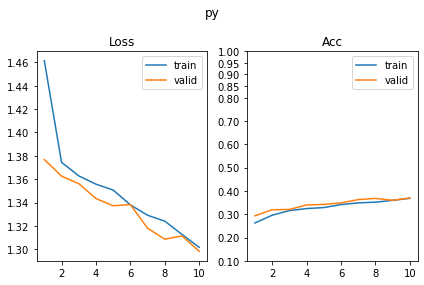

[552/630] px         BTwins_[FCN8i223o32_d_16]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 43.03it/s, loss=1.4, acc=0.268]                                            
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 94.62it/s, loss=1.39, acc=0.271]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 41.66it/s, loss=1.4, acc=0.264]                                            
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 109.77it/s, loss=1.4, acc=0.256]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 43.42it/s, loss=1.4, acc=0.232]                                            
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 92.44it/s, loss=1.38, acc=0.283]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 48.61it/s, loss=1.4, acc=0.281]                                            
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 92.62it/s, loss=1.37, acc=0.318]    

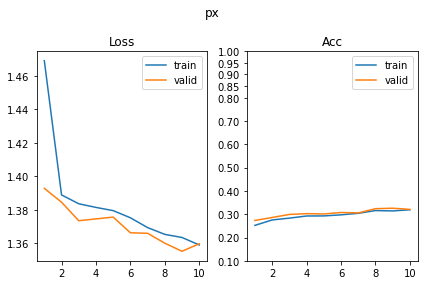

BTwins_[FCN8i223o32_d_32]_target_[shape]
[553/630] shape      BTwins_[FCN8i223o32_d_32]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 44.10it/s, loss=0.234, acc=0.93]                                           
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 103.09it/s, loss=0.361, acc=0.883]                                         
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 39.84it/s, loss=0.229, acc=0.916]                                          
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 78.67it/s, loss=0.214, acc=0.922]                                          
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 46.64it/s, loss=0.156, acc=0.947]                                          
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 76.19it/s, loss=0.195, acc=0.934]                                          
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 39.14it/s, loss=0.16, acc=0.941]                                           
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 78.88it/s, loss=0.178, acc=0.932]   

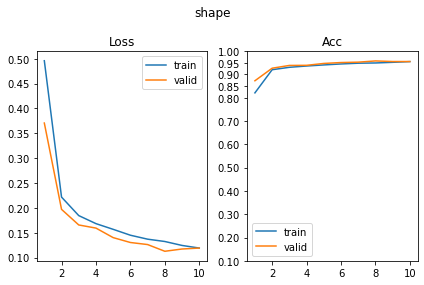

[554/630] scale      BTwins_[FCN8i223o32_d_32]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 43.89it/s, loss=1.04, acc=0.436]                                           
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 91.56it/s, loss=1.05, acc=0.436]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 43.34it/s, loss=1.01, acc=0.463]                                           
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 105.91it/s, loss=1, acc=0.473]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 44.30it/s, loss=0.977, acc=0.492]                                          
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 93.97it/s, loss=0.942, acc=0.523]                                          
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 47.29it/s, loss=0.933, acc=0.531]                                          
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 90.01it/s, loss=0.942, acc=0.551]   

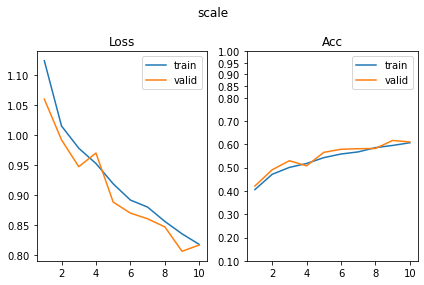

[555/630] color      BTwins_[FCN8i223o32_d_32]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 37.49it/s, loss=1.2, acc=0.537]                                            
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 99.12it/s, loss=1.2, acc=0.539]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 38.37it/s, loss=1.04, acc=0.6]                                             
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 68.21it/s, loss=1.07, acc=0.557]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 39.42it/s, loss=0.958, acc=0.615]                                          
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 67.96it/s, loss=0.919, acc=0.621]                                          
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 37.69it/s, loss=0.933, acc=0.613]                                          
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 106.08it/s, loss=0.963, acc=0.615]  

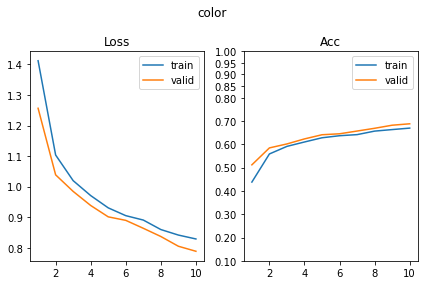

[556/630] angle      BTwins_[FCN8i223o32_d_32]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 43.18it/s, loss=1.66, acc=0.309]                                           
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 67.57it/s, loss=1.7, acc=0.375]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 37.79it/s, loss=1.53, acc=0.393]                                           
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 79.05it/s, loss=1.56, acc=0.348]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 37.34it/s, loss=1.52, acc=0.352]                                           
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 67.82it/s, loss=1.41, acc=0.438]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 40.28it/s, loss=1.36, acc=0.443]                                           
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 68.28it/s, loss=1.37, acc=0.447]    

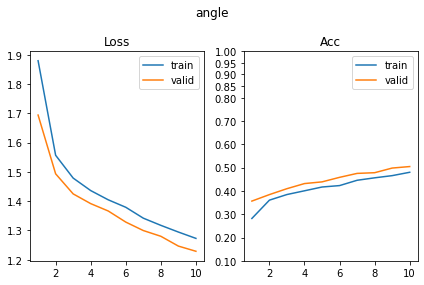

[557/630] py         BTwins_[FCN8i223o32_d_32]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 44.96it/s, loss=1.35, acc=0.332]                                           
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 105.82it/s, loss=1.36, acc=0.311]                                          
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 41.43it/s, loss=1.3, acc=0.326]                                            
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 90.41it/s, loss=1.29, acc=0.387]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 36.78it/s, loss=1.26, acc=0.412]                                           
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 77.36it/s, loss=1.25, acc=0.404]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 36.81it/s, loss=1.21, acc=0.428]                                           
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 68.24it/s, loss=1.21, acc=0.426]    

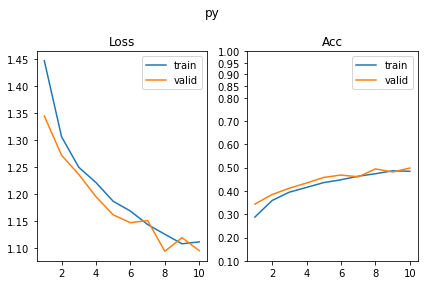

[558/630] px         BTwins_[FCN8i223o32_d_32]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 42.31it/s, loss=1.41, acc=0.248]                                           
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 67.50it/s, loss=1.38, acc=0.287]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 37.16it/s, loss=1.37, acc=0.326]                                           
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 74.72it/s, loss=1.36, acc=0.32]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 36.50it/s, loss=1.38, acc=0.301]                                           
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 76.37it/s, loss=1.36, acc=0.326]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 44.59it/s, loss=1.37, acc=0.307]                                           
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 91.42it/s, loss=1.36, acc=0.32]     

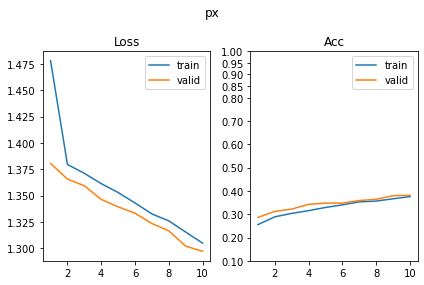

BTwins_[FCN8i223o32_d_64]_target_[shape]
[559/630] shape      BTwins_[FCN8i223o32_d_64]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 38.99it/s, loss=0.068, acc=0.977]                                          
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 102.06it/s, loss=0.314, acc=0.9]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 42.24it/s, loss=0.0739, acc=0.971]                                         
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 86.28it/s, loss=0.0734, acc=0.973]                                         
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 42.88it/s, loss=0.073, acc=0.975]                                          
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 105.01it/s, loss=0.0805, acc=0.973]                                        
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 42.68it/s, loss=0.0573, acc=0.979]                                         
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 80.29it/s, loss=0.0438, acc=0.988]  

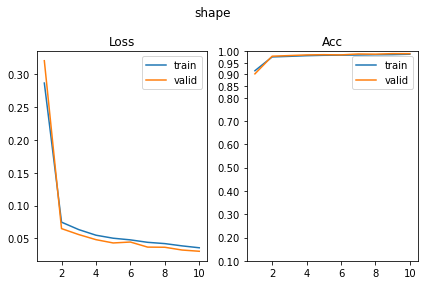

[560/630] scale      BTwins_[FCN8i223o32_d_64]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 47.38it/s, loss=0.906, acc=0.559]                                          
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 91.38it/s, loss=1.16, acc=0.363]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 39.92it/s, loss=0.805, acc=0.617]                                          
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 77.02it/s, loss=0.826, acc=0.578]                                          
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 37.56it/s, loss=0.69, acc=0.682]                                           
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 82.11it/s, loss=0.682, acc=0.68]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 44.23it/s, loss=0.689, acc=0.674]                                          
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 69.55it/s, loss=0.701, acc=0.719]   

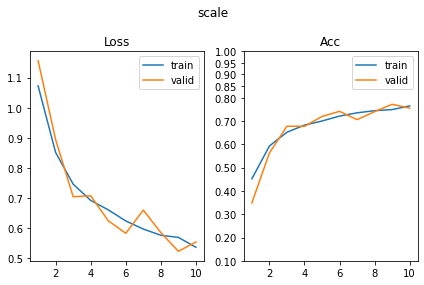

[561/630] color      BTwins_[FCN8i223o32_d_64]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 44.83it/s, loss=1.17, acc=0.531]                                           
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 101.70it/s, loss=1.19, acc=0.525]                                          
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 42.78it/s, loss=0.946, acc=0.6]                                            
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 91.39it/s, loss=0.895, acc=0.662]                                          
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 42.44it/s, loss=0.863, acc=0.664]                                          
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 87.82it/s, loss=0.782, acc=0.674]                                          
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 43.84it/s, loss=0.781, acc=0.672]                                          
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 78.14it/s, loss=0.844, acc=0.65]    

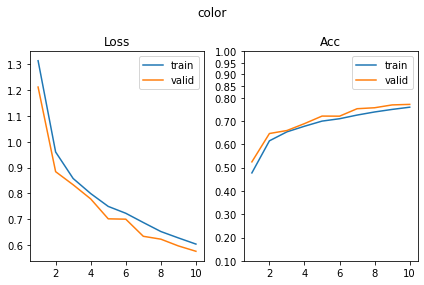

[562/630] angle      BTwins_[FCN8i223o32_d_64]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 39.73it/s, loss=1.44, acc=0.363]                                           
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 67.17it/s, loss=1.59, acc=0.355]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 37.48it/s, loss=1.28, acc=0.422]                                           
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 75.02it/s, loss=1.25, acc=0.48]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 39.40it/s, loss=1.25, acc=0.477]                                           
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 87.01it/s, loss=1.21, acc=0.486]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 41.88it/s, loss=1.19, acc=0.484]                                           
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 85.39it/s, loss=1.17, acc=0.498]    

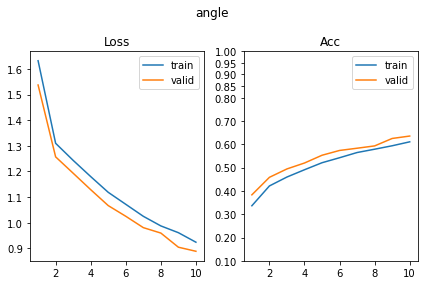

[563/630] py         BTwins_[FCN8i223o32_d_64]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 38.81it/s, loss=1.15, acc=0.453]                                           
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 90.62it/s, loss=1.24, acc=0.434]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 35.49it/s, loss=0.965, acc=0.543]                                          
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 70.48it/s, loss=1.02, acc=0.531]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 41.03it/s, loss=0.974, acc=0.523]                                          
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 104.69it/s, loss=0.879, acc=0.641]                                         
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 39.71it/s, loss=0.832, acc=0.621]                                          
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 82.48it/s, loss=0.824, acc=0.633]   

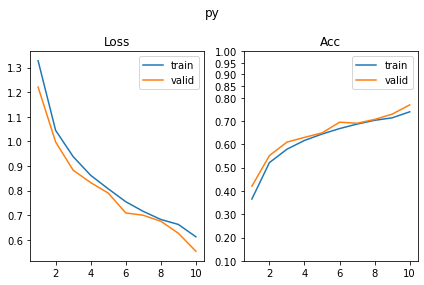

[564/630] px         BTwins_[FCN8i223o32_d_64]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 40.50it/s, loss=1.35, acc=0.336]                                           
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 70.56it/s, loss=1.38, acc=0.285]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 38.02it/s, loss=1.31, acc=0.359]                                           
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 76.97it/s, loss=1.31, acc=0.371]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 44.81it/s, loss=1.28, acc=0.365]                                           
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 92.39it/s, loss=1.27, acc=0.408]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 46.08it/s, loss=1.27, acc=0.391]                                           
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 92.77it/s, loss=1.22, acc=0.438]    

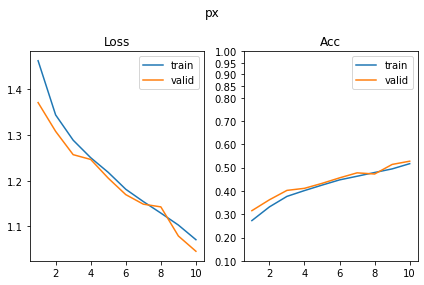

BTwins_[FCN8i223o32_d_128]_target_[shape]
[565/630] shape      BTwins_[FCN8i223o32_d_128]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 40.36it/s, loss=0.0932, acc=0.969]                                         
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 102.09it/s, loss=0.611, acc=0.775]                                         
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 40.96it/s, loss=0.0543, acc=0.984]                                         
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 87.89it/s, loss=0.0658, acc=0.979]                                         
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 41.31it/s, loss=0.082, acc=0.967]                                          
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 103.47it/s, loss=0.0456, acc=0.986]                                        
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 40.72it/s, loss=0.0613, acc=0.98]                                          
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 83.13it/s, loss=0.0547, acc=0.979]  

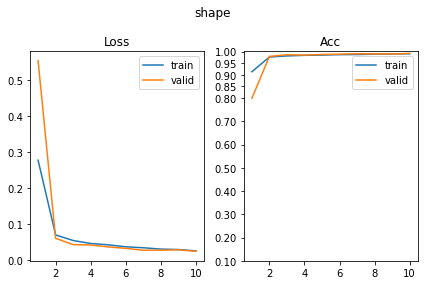

[566/630] scale      BTwins_[FCN8i223o32_d_128]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 45.38it/s, loss=0.724, acc=0.664]                                          
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 91.11it/s, loss=1.41, acc=0.363]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 37.30it/s, loss=0.539, acc=0.762]                                          
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 75.99it/s, loss=0.541, acc=0.764]                                          
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 39.10it/s, loss=0.505, acc=0.771]                                          
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 65.91it/s, loss=0.522, acc=0.781]                                          
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 46.37it/s, loss=0.468, acc=0.826]                                          
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 68.45it/s, loss=0.435, acc=0.852]   

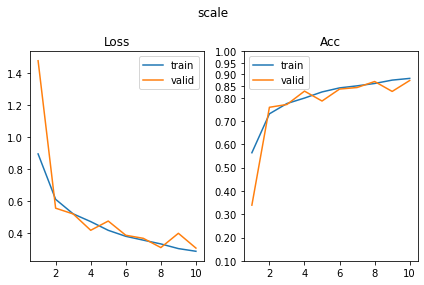

[567/630] color      BTwins_[FCN8i223o32_d_128]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 44.04it/s, loss=0.687, acc=0.723]                                          
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 102.90it/s, loss=1, acc=0.574]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 42.27it/s, loss=0.508, acc=0.781]                                          
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 82.42it/s, loss=0.459, acc=0.818]                                          
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 41.77it/s, loss=0.453, acc=0.816]                                          
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 79.75it/s, loss=0.401, acc=0.832]                                          
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 40.14it/s, loss=0.354, acc=0.857]                                          
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 77.13it/s, loss=0.333, acc=0.865]   

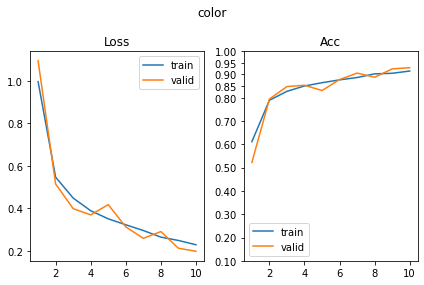

[568/630] angle      BTwins_[FCN8i223o32_d_128]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 42.78it/s, loss=1.3, acc=0.43]                                             
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 68.11it/s, loss=1.83, acc=0.35]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 39.70it/s, loss=1.2, acc=0.461]                                            
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 92.29it/s, loss=1.22, acc=0.523]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 37.91it/s, loss=1.06, acc=0.527]                                           
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 67.68it/s, loss=1.01, acc=0.598]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 40.38it/s, loss=0.953, acc=0.59]                                           
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 67.94it/s, loss=0.947, acc=0.615]   

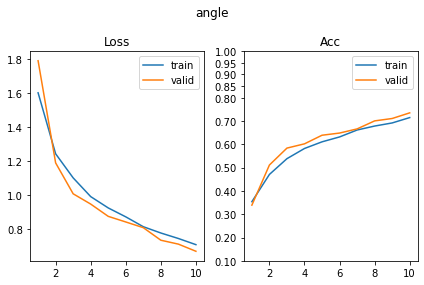

[569/630] py         BTwins_[FCN8i223o32_d_128]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 44.42it/s, loss=0.771, acc=0.668]                                          
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 103.80it/s, loss=0.978, acc=0.598]                                         
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 37.26it/s, loss=0.618, acc=0.727]                                          
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 67.04it/s, loss=0.55, acc=0.777]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 37.18it/s, loss=0.456, acc=0.812]                                          
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 77.13it/s, loss=0.473, acc=0.803]                                          
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 37.04it/s, loss=0.42, acc=0.828]                                           
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 68.20it/s, loss=0.361, acc=0.863]   

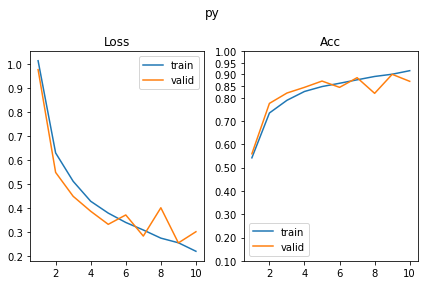

[570/630] px         BTwins_[FCN8i223o32_d_128]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 40.54it/s, loss=1.29, acc=0.389]                                           
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 88.34it/s, loss=1.35, acc=0.322]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 43.92it/s, loss=1.16, acc=0.438]                                           
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 100.72it/s, loss=1.18, acc=0.461]                                          
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 40.22it/s, loss=1.05, acc=0.502]                                           
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 72.17it/s, loss=1.07, acc=0.525]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 42.10it/s, loss=1.01, acc=0.521]                                           
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 67.11it/s, loss=0.999, acc=0.545]   

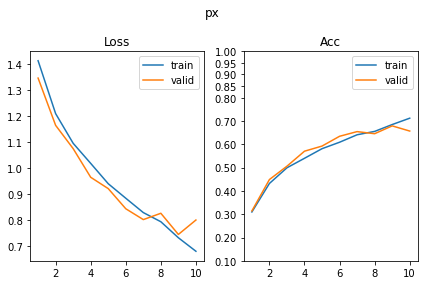

BTwins_[FCN16i223o64_d_8]_target_[shape]
[571/630] shape      BTwins_[FCN16i223o64_d_8]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 43.20it/s, loss=0.92, acc=0.592]                                           
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 103.88it/s, loss=0.965, acc=0.58]                                          
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 42.24it/s, loss=0.873, acc=0.619]                                          
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 92.12it/s, loss=0.884, acc=0.6]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 43.15it/s, loss=0.87, acc=0.602]                                           
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 112.05it/s, loss=0.822, acc=0.619]                                         
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 43.43it/s, loss=0.82, acc=0.609]                                           
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 80.72it/s, loss=0.801, acc=0.611]   

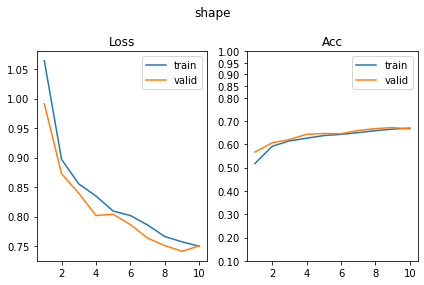

[572/630] scale      BTwins_[FCN16i223o64_d_8]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 47.52it/s, loss=1.09, acc=0.383]                                           
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 70.18it/s, loss=1.08, acc=0.424]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 38.78it/s, loss=1.1, acc=0.365]                                            
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 81.89it/s, loss=1.09, acc=0.375]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 38.38it/s, loss=1.08, acc=0.393]                                           
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 71.06it/s, loss=1.08, acc=0.375]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 41.26it/s, loss=1.06, acc=0.432]                                           
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 70.88it/s, loss=1.09, acc=0.393]    

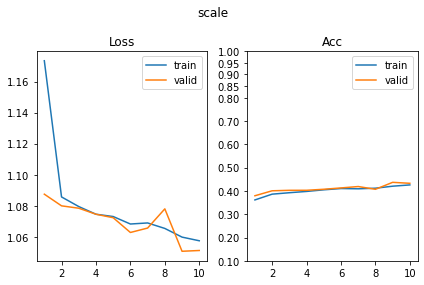

[573/630] color      BTwins_[FCN16i223o64_d_8]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 42.04it/s, loss=1.89, acc=0.188]                                           
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 82.51it/s, loss=1.86, acc=0.266]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 39.77it/s, loss=1.86, acc=0.221]                                           
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 88.70it/s, loss=1.82, acc=0.293]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 37.74it/s, loss=1.84, acc=0.242]                                           
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 80.10it/s, loss=1.84, acc=0.234]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 37.64it/s, loss=1.78, acc=0.303]                                           
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 73.08it/s, loss=1.78, acc=0.273]    

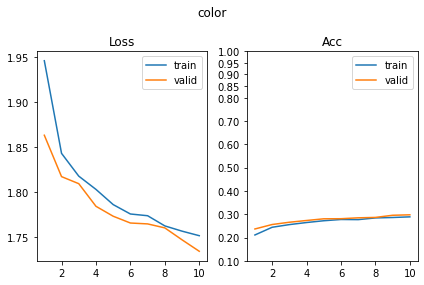

[574/630] angle      BTwins_[FCN16i223o64_d_8]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 46.72it/s, loss=2.32, acc=0.156]                                           
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 90.92it/s, loss=2.34, acc=0.162]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 42.46it/s, loss=2.24, acc=0.188]                                           
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 106.89it/s, loss=2.19, acc=0.203]                                          
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 42.66it/s, loss=2.19, acc=0.211]                                           
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 87.00it/s, loss=2.08, acc=0.229]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 41.68it/s, loss=2.19, acc=0.227]                                           
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 69.85it/s, loss=2.11, acc=0.254]    

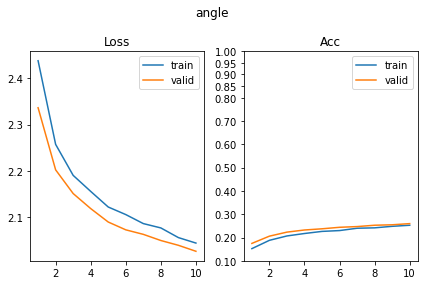

[575/630] py         BTwins_[FCN16i223o64_d_8]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 38.46it/s, loss=1.39, acc=0.26]                                            
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 80.03it/s, loss=1.38, acc=0.273]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 39.12it/s, loss=1.38, acc=0.303]                                           
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 80.45it/s, loss=1.38, acc=0.254]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 41.78it/s, loss=1.38, acc=0.287]                                           
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 80.50it/s, loss=1.38, acc=0.273]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 41.46it/s, loss=1.4, acc=0.248]                                            
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 91.75it/s, loss=1.37, acc=0.328]    

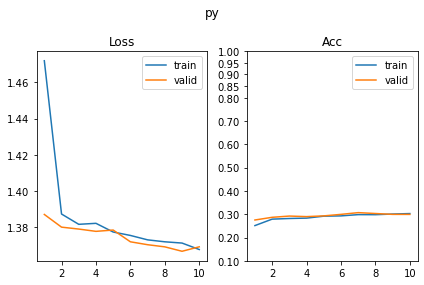

[576/630] px         BTwins_[FCN16i223o64_d_8]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 41.61it/s, loss=1.4, acc=0.248]                                            
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 66.93it/s, loss=1.4, acc=0.27]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 42.48it/s, loss=1.39, acc=0.283]                                           
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 107.65it/s, loss=1.39, acc=0.273]                                          
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 45.70it/s, loss=1.4, acc=0.246]                                            
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 92.37it/s, loss=1.39, acc=0.256]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 47.23it/s, loss=1.39, acc=0.258]                                           
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 93.00it/s, loss=1.39, acc=0.273]    

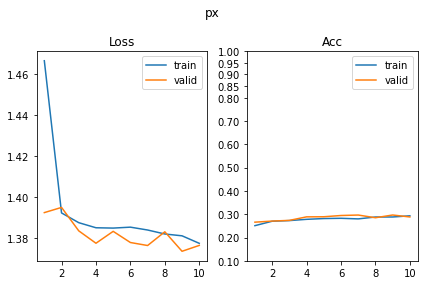

BTwins_[FCN16i223o64_d_16]_target_[shape]
[577/630] shape      BTwins_[FCN16i223o64_d_16]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 45.17it/s, loss=0.352, acc=0.867]                                          
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 94.19it/s, loss=0.375, acc=0.877]                                          
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 44.77it/s, loss=0.314, acc=0.873]                                          
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 72.41it/s, loss=0.277, acc=0.893]                                          
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 39.82it/s, loss=0.357, acc=0.85]                                           
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 70.33it/s, loss=0.278, acc=0.885]                                          
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 37.56it/s, loss=0.246, acc=0.896]                                          
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 80.34it/s, loss=0.242, acc=0.906]   

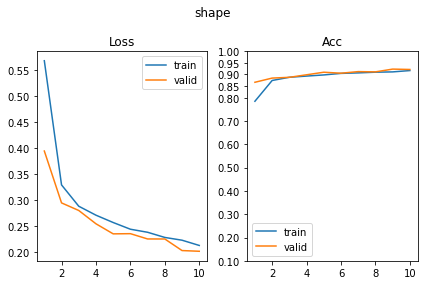

[578/630] scale      BTwins_[FCN16i223o64_d_16]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 48.71it/s, loss=1.07, acc=0.385]                                           
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 75.56it/s, loss=1.07, acc=0.414]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 37.23it/s, loss=1.02, acc=0.451]                                           
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 89.80it/s, loss=1.04, acc=0.455]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 40.28it/s, loss=1.07, acc=0.428]                                           
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 71.61it/s, loss=1.03, acc=0.447]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 40.85it/s, loss=1, acc=0.488]                                              
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 69.41it/s, loss=1.05, acc=0.439]    

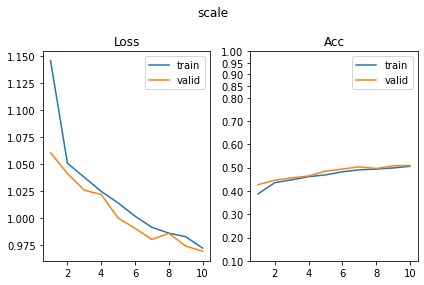

[579/630] color      BTwins_[FCN16i223o64_d_16]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 37.45it/s, loss=1.59, acc=0.344]                                           
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 80.31it/s, loss=1.6, acc=0.35]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 43.53it/s, loss=1.43, acc=0.416]                                           
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 97.06it/s, loss=1.5, acc=0.377]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 44.31it/s, loss=1.43, acc=0.414]                                           
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 92.01it/s, loss=1.4, acc=0.422]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 40.44it/s, loss=1.4, acc=0.436]                                            
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 102.96it/s, loss=1.4, acc=0.42]     

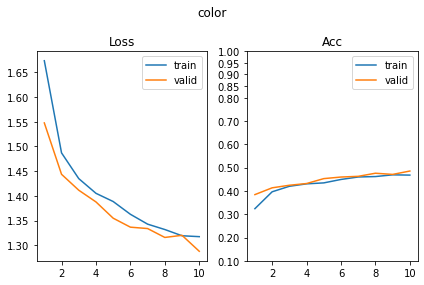

[580/630] angle      BTwins_[FCN16i223o64_d_16]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 39.38it/s, loss=1.86, acc=0.293]                                           
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 68.93it/s, loss=1.84, acc=0.338]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 37.02it/s, loss=1.79, acc=0.314]                                           
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 78.70it/s, loss=1.67, acc=0.311]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 37.49it/s, loss=1.69, acc=0.318]                                           
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 82.89it/s, loss=1.72, acc=0.303]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 52.54it/s, loss=1.6, acc=0.34]                                             
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 83.75it/s, loss=1.6, acc=0.367]     

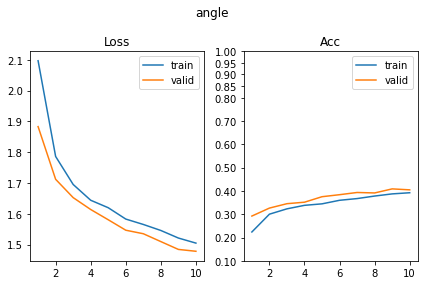

[581/630] py         BTwins_[FCN16i223o64_d_16]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 51.62it/s, loss=1.39, acc=0.285]                                           
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 122.80it/s, loss=1.37, acc=0.316]                                          
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 52.57it/s, loss=1.36, acc=0.316]                                           
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 105.66it/s, loss=1.38, acc=0.289]                                          
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 50.18it/s, loss=1.38, acc=0.285]                                           
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 72.53it/s, loss=1.37, acc=0.312]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 43.08it/s, loss=1.37, acc=0.27]                                            
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 120.00it/s, loss=1.36, acc=0.299]   

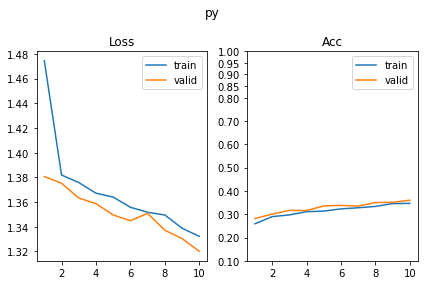

[582/630] px         BTwins_[FCN16i223o64_d_16]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 43.25it/s, loss=1.4, acc=0.246]                                            
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 103.51it/s, loss=1.38, acc=0.291]                                          
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 46.80it/s, loss=1.39, acc=0.27]                                            
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 102.03it/s, loss=1.38, acc=0.297]                                          
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 45.46it/s, loss=1.39, acc=0.268]                                           
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 104.28it/s, loss=1.37, acc=0.293]                                          
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 55.29it/s, loss=1.39, acc=0.293]                                           
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 72.68it/s, loss=1.37, acc=0.322]    

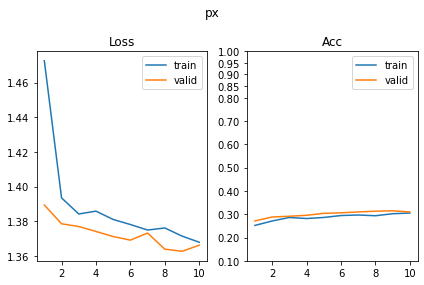

BTwins_[FCN16i223o64_d_32]_target_[shape]
[583/630] shape      BTwins_[FCN16i223o64_d_32]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 43.81it/s, loss=0.116, acc=0.963]                                          
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 100.98it/s, loss=0.168, acc=0.955]                                         
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 41.09it/s, loss=0.0771, acc=0.973]                                         
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 94.63it/s, loss=0.0919, acc=0.971]                                         
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 46.48it/s, loss=0.0513, acc=0.979]                                         
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 114.86it/s, loss=0.0627, acc=0.979]                                        
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 49.54it/s, loss=0.0831, acc=0.969]                                         
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 100.43it/s, loss=0.0929, acc=0.963] 

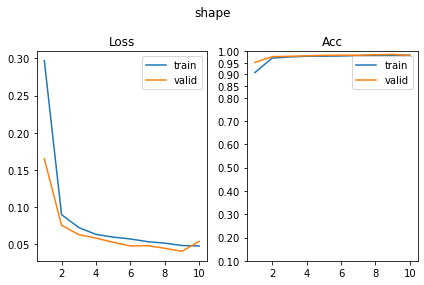

[584/630] scale      BTwins_[FCN16i223o64_d_32]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 47.11it/s, loss=1.03, acc=0.443]                                           
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 99.49it/s, loss=1.06, acc=0.393]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 49.43it/s, loss=0.99, acc=0.467]                                           
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 115.53it/s, loss=0.976, acc=0.502]                                         
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 48.29it/s, loss=0.962, acc=0.523]                                          
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 100.13it/s, loss=0.963, acc=0.521]                                         
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 50.92it/s, loss=0.933, acc=0.52]                                           
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 87.57it/s, loss=0.916, acc=0.576]   

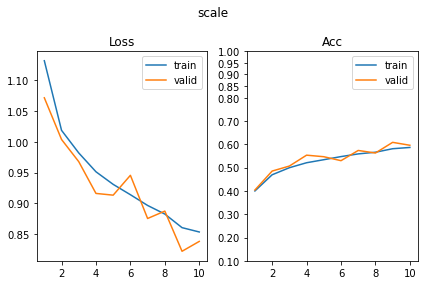

[585/630] color      BTwins_[FCN16i223o64_d_32]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 42.88it/s, loss=1.56, acc=0.402]                                           
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 114.74it/s, loss=1.63, acc=0.361]                                          
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 48.24it/s, loss=1.45, acc=0.428]                                           
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 91.71it/s, loss=1.43, acc=0.43]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 50.20it/s, loss=1.44, acc=0.375]                                           
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 83.69it/s, loss=1.38, acc=0.434]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 49.00it/s, loss=1.36, acc=0.432]                                           
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 106.14it/s, loss=1.4, acc=0.434]    

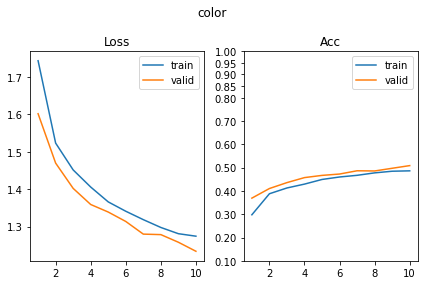

[586/630] angle      BTwins_[FCN16i223o64_d_32]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 44.12it/s, loss=1.42, acc=0.371]                                           
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 96.52it/s, loss=1.49, acc=0.377]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 50.71it/s, loss=1.36, acc=0.402]                                           
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 116.23it/s, loss=1.35, acc=0.391]                                          
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 50.62it/s, loss=1.26, acc=0.451]                                           
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 100.29it/s, loss=1.25, acc=0.482]                                          
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 48.69it/s, loss=1.32, acc=0.438]                                           
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 86.19it/s, loss=1.31, acc=0.455]    

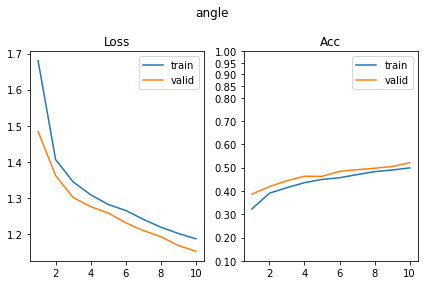

[587/630] py         BTwins_[FCN16i223o64_d_32]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 47.63it/s, loss=1.41, acc=0.258]                                           
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 105.92it/s, loss=1.38, acc=0.277]                                          
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 49.87it/s, loss=1.36, acc=0.291]                                           
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 99.34it/s, loss=1.36, acc=0.328]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 43.13it/s, loss=1.36, acc=0.289]                                           
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 97.03it/s, loss=1.37, acc=0.279]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 49.56it/s, loss=1.36, acc=0.314]                                           
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 96.77it/s, loss=1.36, acc=0.338]    

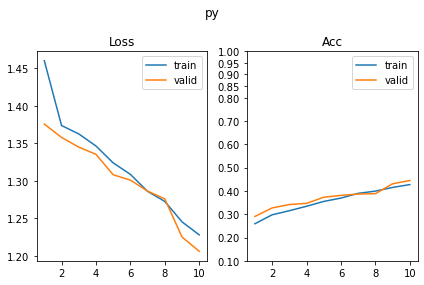

[588/630] px         BTwins_[FCN16i223o64_d_32]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 49.67it/s, loss=1.42, acc=0.244]                                           
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 101.52it/s, loss=1.39, acc=0.281]                                          
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 50.23it/s, loss=1.39, acc=0.252]                                           
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 116.87it/s, loss=1.38, acc=0.279]                                          
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 50.48it/s, loss=1.39, acc=0.271]                                           
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 101.44it/s, loss=1.37, acc=0.318]                                          
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 45.82it/s, loss=1.4, acc=0.273]                                            
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 85.97it/s, loss=1.36, acc=0.326]    

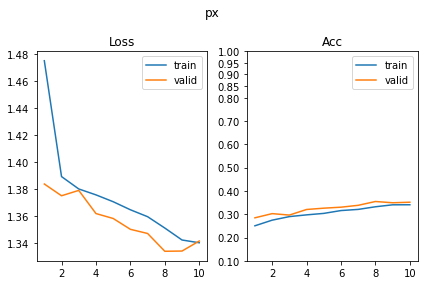

BTwins_[FCN16i223o64_d_64]_target_[shape]
[589/630] shape      BTwins_[FCN16i223o64_d_64]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 50.18it/s, loss=0.0715, acc=0.975]                                         
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 117.82it/s, loss=0.162, acc=0.959]                                         
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 50.66it/s, loss=0.0542, acc=0.984]                                         
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 102.19it/s, loss=0.0515, acc=0.984]                                        
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 54.04it/s, loss=0.0452, acc=0.982]                                         
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 74.33it/s, loss=0.0342, acc=0.988]                                         
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 45.56it/s, loss=0.0429, acc=0.98]                                          
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 116.28it/s, loss=0.043, acc=0.982]  

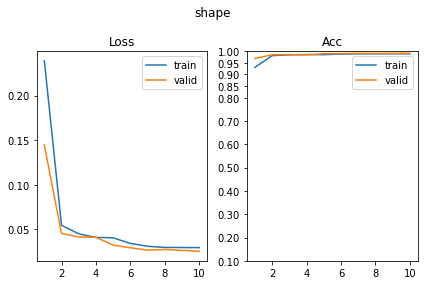

[590/630] scale      BTwins_[FCN16i223o64_d_64]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 47.90it/s, loss=0.997, acc=0.498]                                          
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 69.78it/s, loss=1.08, acc=0.381]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 45.94it/s, loss=0.848, acc=0.586]                                          
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 114.45it/s, loss=0.953, acc=0.516]                                         
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 47.69it/s, loss=0.89, acc=0.545]                                           
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 80.94it/s, loss=0.844, acc=0.574]                                          
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 52.19it/s, loss=0.885, acc=0.582]                                          
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 96.47it/s, loss=0.876, acc=0.574]   

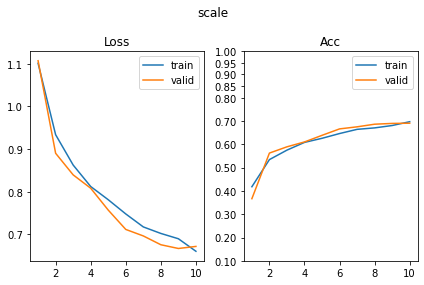

[591/630] color      BTwins_[FCN16i223o64_d_64]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 44.98it/s, loss=1.11, acc=0.535]                                           
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 105.38it/s, loss=1.15, acc=0.578]                                          
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 47.09it/s, loss=0.961, acc=0.604]                                          
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 99.85it/s, loss=0.899, acc=0.637]                                          
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 52.48it/s, loss=0.923, acc=0.611]                                          
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 98.27it/s, loss=0.827, acc=0.637]                                          
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 47.44it/s, loss=0.837, acc=0.656]                                          
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 108.34it/s, loss=0.89, acc=0.629]   

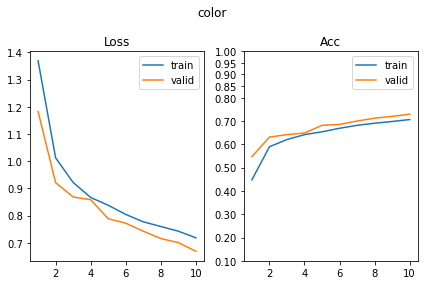

[592/630] angle      BTwins_[FCN16i223o64_d_64]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 52.39it/s, loss=1.38, acc=0.342]                                           
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 93.10it/s, loss=1.47, acc=0.379]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 48.03it/s, loss=1.29, acc=0.428]                                           
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 105.41it/s, loss=1.28, acc=0.402]                                          
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 46.85it/s, loss=1.32, acc=0.422]                                           
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 99.10it/s, loss=1.19, acc=0.482]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 55.14it/s, loss=1.18, acc=0.479]                                           
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 99.25it/s, loss=1.21, acc=0.48]     

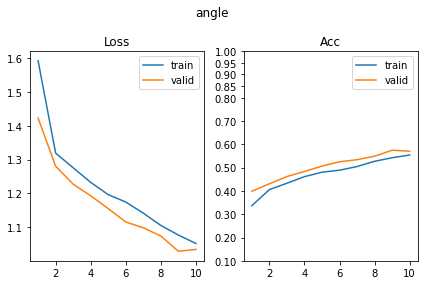

[593/630] py         BTwins_[FCN16i223o64_d_64]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 41.98it/s, loss=1.37, acc=0.309]                                           
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 77.37it/s, loss=1.36, acc=0.309]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 44.06it/s, loss=1.32, acc=0.346]                                           
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 95.51it/s, loss=1.29, acc=0.416]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 49.90it/s, loss=1.21, acc=0.443]                                           
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 97.29it/s, loss=1.22, acc=0.438]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 47.16it/s, loss=1.16, acc=0.469]                                           
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 112.00it/s, loss=1.18, acc=0.455]   

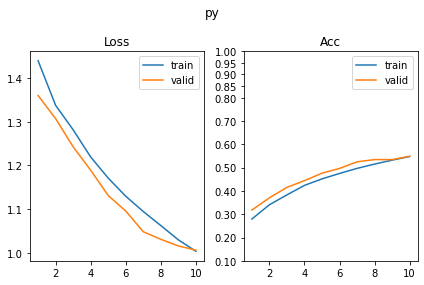

[594/630] px         BTwins_[FCN16i223o64_d_64]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 42.74it/s, loss=1.41, acc=0.227]                                           
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 84.03it/s, loss=1.39, acc=0.273]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 42.48it/s, loss=1.39, acc=0.279]                                           
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 100.72it/s, loss=1.35, acc=0.369]                                          
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 44.63it/s, loss=1.37, acc=0.316]                                           
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 76.01it/s, loss=1.34, acc=0.361]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 53.79it/s, loss=1.34, acc=0.332]                                           
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 68.79it/s, loss=1.35, acc=0.34]     

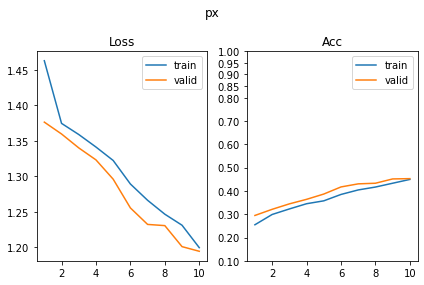

BTwins_[FCN16i223o64_d_128]_target_[shape]
[595/630] shape      BTwins_[FCN16i223o64_d_128]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 46.55it/s, loss=0.032, acc=0.988]                                          
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 112.33it/s, loss=0.128, acc=0.982]                                         
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 49.40it/s, loss=0.0265, acc=0.99]                                          
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 95.90it/s, loss=0.0307, acc=0.99]                                          
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 52.93it/s, loss=0.0116, acc=0.998]                                         
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 98.40it/s, loss=0.0313, acc=0.994]                                         
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 49.71it/s, loss=0.028, acc=0.986]                                          
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 111.97it/s, loss=0.0303, acc=0.994] 

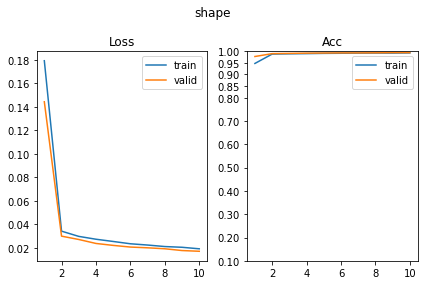

[596/630] scale      BTwins_[FCN16i223o64_d_128]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 52.16it/s, loss=0.822, acc=0.629]                                          
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 84.22it/s, loss=1.13, acc=0.391]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 46.58it/s, loss=0.615, acc=0.742]                                          
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 107.14it/s, loss=0.596, acc=0.738]                                         
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 42.54it/s, loss=0.548, acc=0.762]                                          
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 99.38it/s, loss=0.516, acc=0.779]                                          
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 51.96it/s, loss=0.541, acc=0.75]                                           
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 81.28it/s, loss=0.441, acc=0.801]   

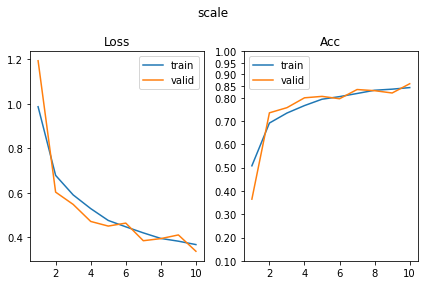

[597/630] color      BTwins_[FCN16i223o64_d_128]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 44.92it/s, loss=0.888, acc=0.635]                                          
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 115.61it/s, loss=1.07, acc=0.574]                                          
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 46.31it/s, loss=0.781, acc=0.666]                                          
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 94.26it/s, loss=0.686, acc=0.719]                                          
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 45.12it/s, loss=0.676, acc=0.717]                                          
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 96.28it/s, loss=0.599, acc=0.74]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 45.41it/s, loss=0.645, acc=0.736]                                          
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 94.84it/s, loss=0.637, acc=0.754]   

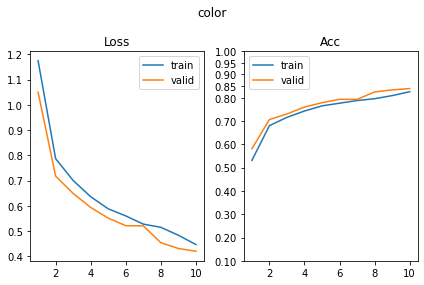

[598/630] angle      BTwins_[FCN16i223o64_d_128]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 51.77it/s, loss=1.23, acc=0.406]                                           
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 94.66it/s, loss=1.38, acc=0.441]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 49.33it/s, loss=1.2, acc=0.479]                                            
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 114.89it/s, loss=1.13, acc=0.521]                                          
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 40.95it/s, loss=1.13, acc=0.492]                                           
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 74.82it/s, loss=1.04, acc=0.574]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 45.94it/s, loss=1.06, acc=0.539]                                           
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 90.95it/s, loss=0.962, acc=0.58]    

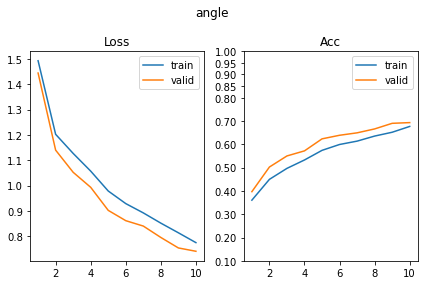

[599/630] py         BTwins_[FCN16i223o64_d_128]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 46.01it/s, loss=1.16, acc=0.471]                                           
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 114.68it/s, loss=1.27, acc=0.375]                                          
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 40.66it/s, loss=0.989, acc=0.521]                                          
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 76.89it/s, loss=0.91, acc=0.594]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 48.53it/s, loss=0.815, acc=0.631]                                          
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 111.15it/s, loss=0.941, acc=0.576]                                         
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 48.78it/s, loss=0.769, acc=0.65]                                           
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 99.11it/s, loss=0.743, acc=0.674]   

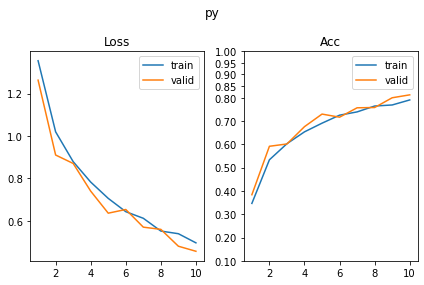

[600/630] px         BTwins_[FCN16i223o64_d_128]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 46.48it/s, loss=1.38, acc=0.287]                                           
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 98.64it/s, loss=1.37, acc=0.273]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 49.66it/s, loss=1.31, acc=0.363]                                           
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 114.21it/s, loss=1.27, acc=0.41]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 50.43it/s, loss=1.28, acc=0.404]                                           
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 98.85it/s, loss=1.22, acc=0.402]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 54.21it/s, loss=1.17, acc=0.469]                                           
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 92.53it/s, loss=1.24, acc=0.438]    

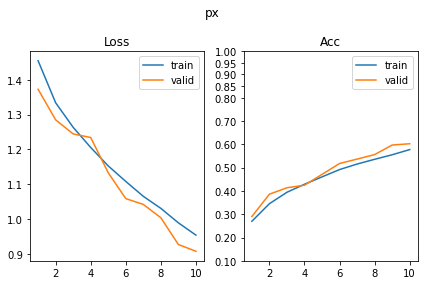

BTwins_[FCN32i223o128_d_8]_target_[shape]
[601/630] shape      BTwins_[FCN32i223o128_d_8]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 50.74it/s, loss=0.86, acc=0.619]                                           
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 116.46it/s, loss=0.916, acc=0.598]                                         
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 53.10it/s, loss=0.825, acc=0.639]                                          
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 100.58it/s, loss=0.801, acc=0.629]                                         
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 55.98it/s, loss=0.758, acc=0.666]                                          
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 89.57it/s, loss=0.796, acc=0.664]                                          
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 51.77it/s, loss=0.725, acc=0.66]                                           
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 118.37it/s, loss=0.805, acc=0.66]   

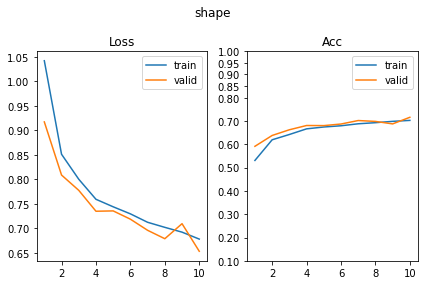

[602/630] scale      BTwins_[FCN32i223o128_d_8]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 51.09it/s, loss=1.1, acc=0.371]                                            
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 80.88it/s, loss=1.1, acc=0.359]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 47.13it/s, loss=1.09, acc=0.387]                                           
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 113.21it/s, loss=1.08, acc=0.381]                                          
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 42.37it/s, loss=1.08, acc=0.371]                                           
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 99.75it/s, loss=1.08, acc=0.373]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 55.69it/s, loss=1.08, acc=0.426]                                           
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 90.54it/s, loss=1.07, acc=0.414]    

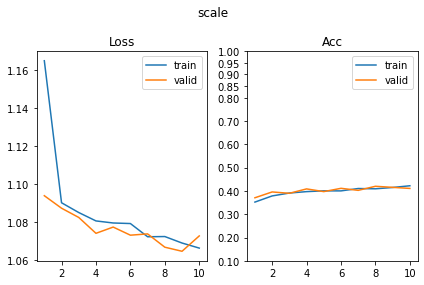

[603/630] color      BTwins_[FCN32i223o128_d_8]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 45.05it/s, loss=1.94, acc=0.223]                                           
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 118.66it/s, loss=1.92, acc=0.244]                                          
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 43.13it/s, loss=1.9, acc=0.25]                                             
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 70.29it/s, loss=1.93, acc=0.213]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 51.22it/s, loss=1.93, acc=0.207]                                           
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 102.15it/s, loss=1.91, acc=0.217]                                          
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 45.79it/s, loss=1.82, acc=0.264]                                           
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 87.58it/s, loss=1.89, acc=0.248]    

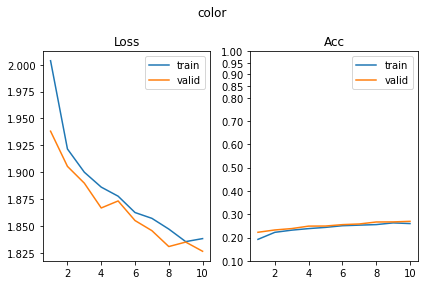

[604/630] angle      BTwins_[FCN32i223o128_d_8]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 54.62it/s, loss=2.35, acc=0.154]                                           
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 81.67it/s, loss=2.29, acc=0.225]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 51.36it/s, loss=2.26, acc=0.18]                                            
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 95.67it/s, loss=2.19, acc=0.197]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 49.43it/s, loss=2.23, acc=0.191]                                           
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 73.86it/s, loss=2.12, acc=0.209]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 50.74it/s, loss=2.17, acc=0.193]                                           
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 92.70it/s, loss=2.15, acc=0.23]     

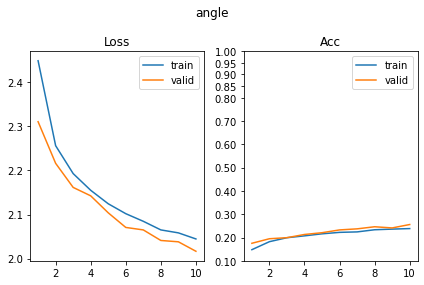

[605/630] py         BTwins_[FCN32i223o128_d_8]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 44.02it/s, loss=1.39, acc=0.256]                                           
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 83.12it/s, loss=1.39, acc=0.258]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 44.08it/s, loss=1.38, acc=0.291]                                           
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 95.65it/s, loss=1.39, acc=0.26]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 55.04it/s, loss=1.38, acc=0.295]                                           
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 98.91it/s, loss=1.4, acc=0.236]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 51.43it/s, loss=1.4, acc=0.271]                                            
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 118.94it/s, loss=1.39, acc=0.266]   

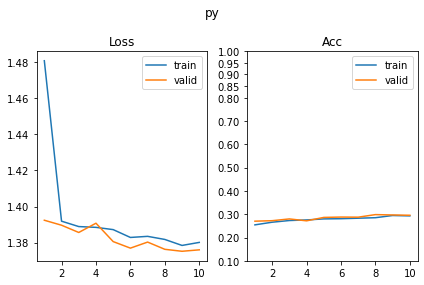

[606/630] px         BTwins_[FCN32i223o128_d_8]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 54.26it/s, loss=1.41, acc=0.234]                                           
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 98.95it/s, loss=1.39, acc=0.27]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 50.69it/s, loss=1.4, acc=0.279]                                            
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 100.77it/s, loss=1.4, acc=0.248]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 45.28it/s, loss=1.39, acc=0.238]                                           
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 68.97it/s, loss=1.38, acc=0.295]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 41.07it/s, loss=1.39, acc=0.295]                                           
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 80.19it/s, loss=1.38, acc=0.27]     

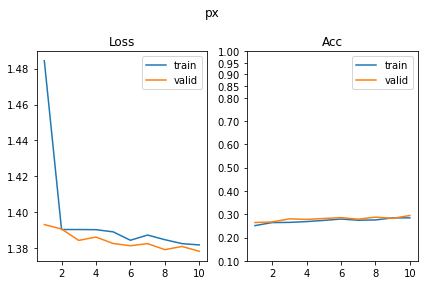

BTwins_[FCN32i223o128_d_16]_target_[shape]
[607/630] shape      BTwins_[FCN32i223o128_d_16]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 48.44it/s, loss=0.591, acc=0.764]                                          
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 104.89it/s, loss=0.649, acc=0.709]                                         
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 47.76it/s, loss=0.512, acc=0.771]                                          
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 103.71it/s, loss=0.527, acc=0.779]                                         
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 51.13it/s, loss=0.497, acc=0.785]                                          
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 103.58it/s, loss=0.479, acc=0.783]                                         
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 51.02it/s, loss=0.47, acc=0.777]                                           
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 104.31it/s, loss=0.477, acc=0.816]  

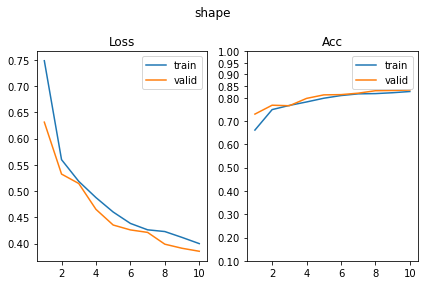

[608/630] scale      BTwins_[FCN32i223o128_d_16]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 46.26it/s, loss=1.07, acc=0.395]                                           
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 85.13it/s, loss=1.07, acc=0.436]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 37.15it/s, loss=1.07, acc=0.385]                                           
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 78.64it/s, loss=1.09, acc=0.406]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 38.00it/s, loss=1.06, acc=0.418]                                           
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 103.16it/s, loss=1.04, acc=0.441]                                          
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 45.38it/s, loss=1.07, acc=0.434]                                           
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 104.42it/s, loss=1.05, acc=0.418]   

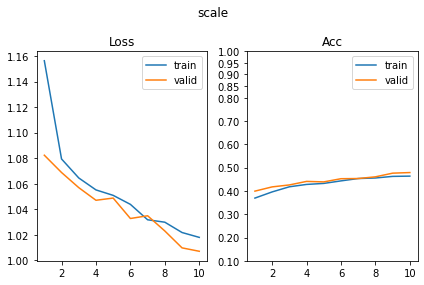

[609/630] color      BTwins_[FCN32i223o128_d_16]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 46.60it/s, loss=1.87, acc=0.252]                                           
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 119.79it/s, loss=1.87, acc=0.254]                                          
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 52.28it/s, loss=1.83, acc=0.238]                                           
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 101.28it/s, loss=1.77, acc=0.291]                                          
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 51.39it/s, loss=1.79, acc=0.287]                                           
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 119.91it/s, loss=1.8, acc=0.275]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 47.82it/s, loss=1.71, acc=0.318]                                           
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 103.37it/s, loss=1.71, acc=0.326]   

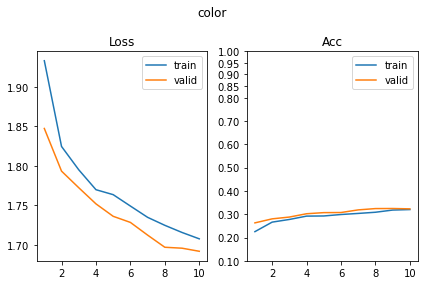

[610/630] angle      BTwins_[FCN32i223o128_d_16]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 56.56it/s, loss=1.93, acc=0.26]                                            
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 85.31it/s, loss=1.87, acc=0.275]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 49.20it/s, loss=1.78, acc=0.287]                                           
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 121.96it/s, loss=1.77, acc=0.275]                                          
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 51.44it/s, loss=1.7, acc=0.301]                                            
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 102.14it/s, loss=1.69, acc=0.344]                                          
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 50.98it/s, loss=1.66, acc=0.367]                                           
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 99.41it/s, loss=1.64, acc=0.379]    

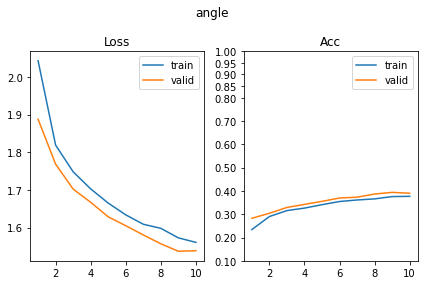

[611/630] py         BTwins_[FCN32i223o128_d_16]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 51.87it/s, loss=1.4, acc=0.254]                                            
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 99.04it/s, loss=1.4, acc=0.264]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 52.13it/s, loss=1.39, acc=0.252]                                           
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 80.61it/s, loss=1.38, acc=0.289]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 47.58it/s, loss=1.39, acc=0.248]                                           
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 119.91it/s, loss=1.37, acc=0.293]                                          
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 51.60it/s, loss=1.37, acc=0.305]                                           
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 101.24it/s, loss=1.37, acc=0.299]   

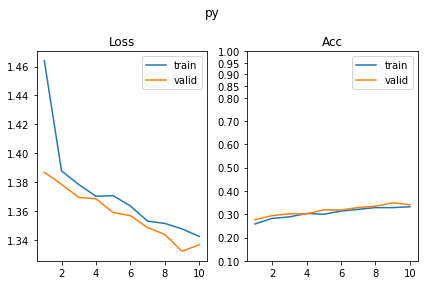

[612/630] px         BTwins_[FCN32i223o128_d_16]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 44.08it/s, loss=1.41, acc=0.27]                                            
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 71.62it/s, loss=1.39, acc=0.242]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 37.98it/s, loss=1.4, acc=0.234]                                            
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 80.34it/s, loss=1.38, acc=0.27]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 50.24it/s, loss=1.39, acc=0.248]                                           
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 102.58it/s, loss=1.38, acc=0.291]                                          
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 49.08it/s, loss=1.39, acc=0.285]                                           
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 82.30it/s, loss=1.38, acc=0.271]    

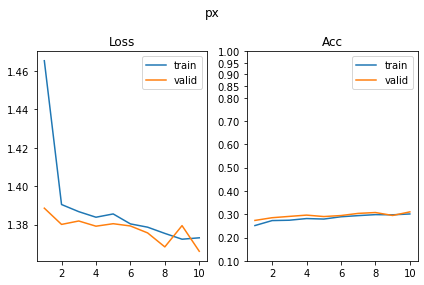

BTwins_[FCN32i223o128_d_32]_target_[shape]
[613/630] shape      BTwins_[FCN32i223o128_d_32]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 51.11it/s, loss=0.0899, acc=0.961]                                         
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 119.28it/s, loss=0.129, acc=0.949]                                         
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 45.75it/s, loss=0.0594, acc=0.975]                                         
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 84.59it/s, loss=0.0562, acc=0.986]                                         
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 41.33it/s, loss=0.0471, acc=0.984]                                         
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 78.90it/s, loss=0.0462, acc=0.988]                                         
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 42.50it/s, loss=0.0754, acc=0.961]                                         
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 102.31it/s, loss=0.0364, acc=0.99]  

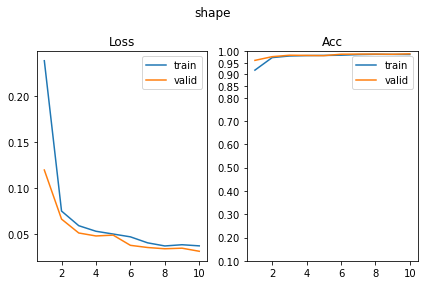

[614/630] scale      BTwins_[FCN32i223o128_d_32]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 52.99it/s, loss=1.08, acc=0.389]                                           
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 80.09it/s, loss=1.08, acc=0.395]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 51.68it/s, loss=1.05, acc=0.439]                                           
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 115.16it/s, loss=1.05, acc=0.428]                                          
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 49.16it/s, loss=1.01, acc=0.48]                                            
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 78.75it/s, loss=1.03, acc=0.418]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 50.35it/s, loss=0.986, acc=0.498]                                          
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 73.28it/s, loss=0.955, acc=0.516]   

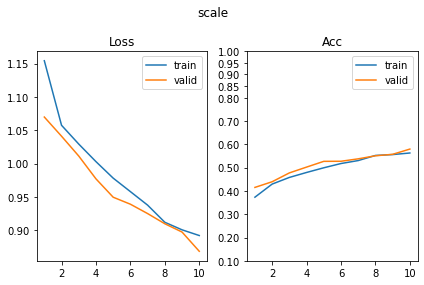

[615/630] color      BTwins_[FCN32i223o128_d_32]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 48.35it/s, loss=1.87, acc=0.254]                                           
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 92.03it/s, loss=1.87, acc=0.262]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 50.47it/s, loss=1.81, acc=0.301]                                           
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 96.34it/s, loss=1.75, acc=0.326]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 44.55it/s, loss=1.71, acc=0.307]                                           
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 111.18it/s, loss=1.74, acc=0.309]                                          
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 49.44it/s, loss=1.76, acc=0.293]                                           
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 70.78it/s, loss=1.68, acc=0.342]    

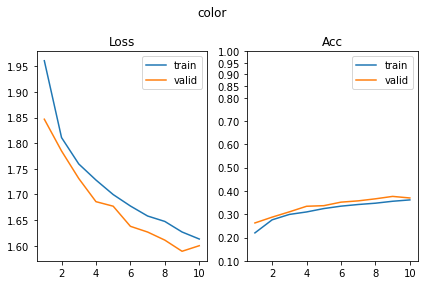

[616/630] angle      BTwins_[FCN32i223o128_d_32]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 44.75it/s, loss=1.43, acc=0.322]                                           
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 80.38it/s, loss=1.48, acc=0.375]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 41.19it/s, loss=1.34, acc=0.416]                                           
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 111.17it/s, loss=1.38, acc=0.396]                                          
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 44.29it/s, loss=1.38, acc=0.404]                                           
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 82.80it/s, loss=1.23, acc=0.463]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 54.44it/s, loss=1.24, acc=0.426]                                           
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 93.41it/s, loss=1.23, acc=0.469]    

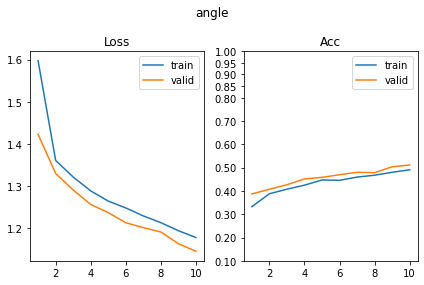

[617/630] py         BTwins_[FCN32i223o128_d_32]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 51.81it/s, loss=1.39, acc=0.27]                                            
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 92.21it/s, loss=1.37, acc=0.311]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 45.41it/s, loss=1.36, acc=0.322]                                           
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 103.51it/s, loss=1.37, acc=0.326]                                          
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 50.72it/s, loss=1.36, acc=0.307]                                           
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 77.38it/s, loss=1.35, acc=0.33]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 47.36it/s, loss=1.33, acc=0.352]                                           
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 77.82it/s, loss=1.36, acc=0.33]     

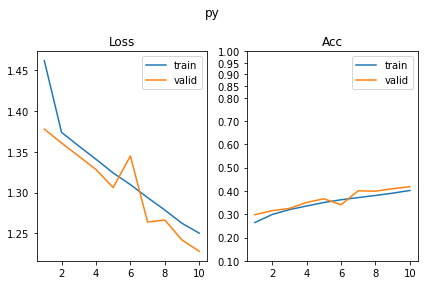

[618/630] px         BTwins_[FCN32i223o128_d_32]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 52.72it/s, loss=1.42, acc=0.234]                                           
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 97.42it/s, loss=1.4, acc=0.266]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 50.63it/s, loss=1.41, acc=0.26]                                            
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 113.03it/s, loss=1.38, acc=0.293]                                          
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 50.86it/s, loss=1.37, acc=0.309]                                           
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 97.66it/s, loss=1.37, acc=0.279]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 42.63it/s, loss=1.39, acc=0.236]                                           
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 94.50it/s, loss=1.37, acc=0.311]    

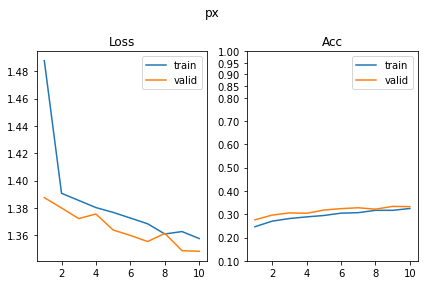

BTwins_[FCN32i223o128_d_64]_target_[shape]
[619/630] shape      BTwins_[FCN32i223o128_d_64]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 45.44it/s, loss=0.0475, acc=0.984]                                         
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 111.36it/s, loss=0.0498, acc=0.988]                                        
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 46.65it/s, loss=0.0256, acc=0.996]                                         
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 97.27it/s, loss=0.0195, acc=0.992]                                         
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 39.79it/s, loss=0.0361, acc=0.988]                                         
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 99.16it/s, loss=0.0273, acc=0.994]                                         
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 38.75it/s, loss=0.0135, acc=0.994]                                         
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 94.40it/s, loss=0.0156, acc=0.994]  

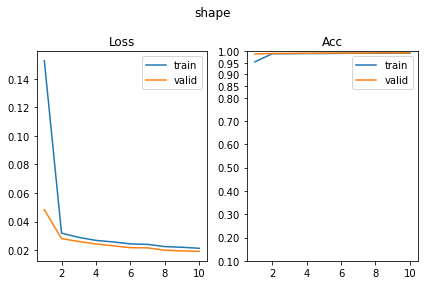

[620/630] scale      BTwins_[FCN32i223o128_d_64]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 49.79it/s, loss=1.05, acc=0.455]                                           
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 95.65it/s, loss=1.07, acc=0.387]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 50.41it/s, loss=1, acc=0.484]                                              
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 95.87it/s, loss=0.973, acc=0.5]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 50.10it/s, loss=0.886, acc=0.572]                                          
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 101.14it/s, loss=0.899, acc=0.568]                                         
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 54.60it/s, loss=0.841, acc=0.594]                                          
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 101.33it/s, loss=0.837, acc=0.582]  

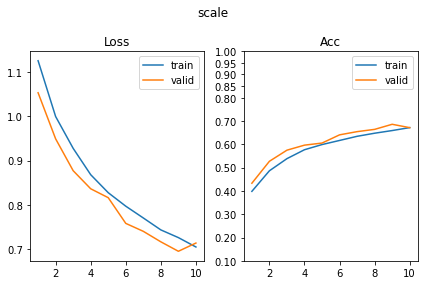

[621/630] color      BTwins_[FCN32i223o128_d_64]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 49.20it/s, loss=1.42, acc=0.402]                                           
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 114.17it/s, loss=1.45, acc=0.428]                                          
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 48.67it/s, loss=1.36, acc=0.439]                                           
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 96.44it/s, loss=1.29, acc=0.457]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 43.98it/s, loss=1.26, acc=0.479]                                           
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 116.27it/s, loss=1.25, acc=0.473]                                          
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 48.62it/s, loss=1.23, acc=0.52]                                            
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 100.16it/s, loss=1.21, acc=0.516]   

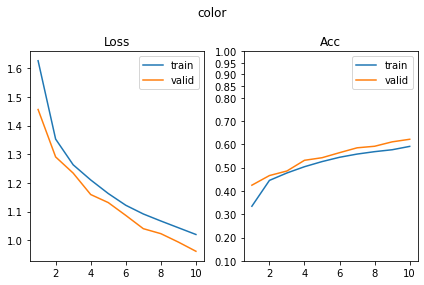

[622/630] angle      BTwins_[FCN32i223o128_d_64]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 52.65it/s, loss=1.23, acc=0.412]                                           
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 97.89it/s, loss=1.3, acc=0.387]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 48.03it/s, loss=1.22, acc=0.434]                                           
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 109.87it/s, loss=1.15, acc=0.455]                                          
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 50.94it/s, loss=1.21, acc=0.406]                                           
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 69.17it/s, loss=1.17, acc=0.463]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 48.08it/s, loss=1.15, acc=0.443]                                           
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 96.81it/s, loss=1.1, acc=0.486]     

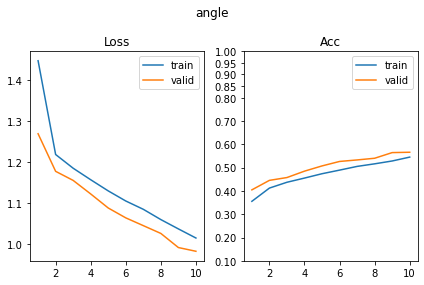

[623/630] py         BTwins_[FCN32i223o128_d_64]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 49.95it/s, loss=1.4, acc=0.285]                                            
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 93.19it/s, loss=1.38, acc=0.285]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 50.06it/s, loss=1.36, acc=0.303]                                           
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 99.16it/s, loss=1.36, acc=0.336]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 42.87it/s, loss=1.35, acc=0.332]                                           
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 112.56it/s, loss=1.31, acc=0.402]                                          
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 49.07it/s, loss=1.32, acc=0.344]                                           
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 96.45it/s, loss=1.28, acc=0.395]    

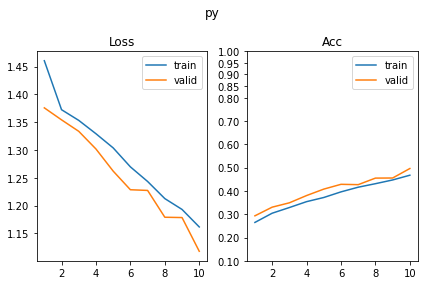

[624/630] px         BTwins_[FCN32i223o128_d_64]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 53.32it/s, loss=1.41, acc=0.266]                                           
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 100.59it/s, loss=1.39, acc=0.277]                                          
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 47.04it/s, loss=1.39, acc=0.252]                                           
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 97.02it/s, loss=1.38, acc=0.287]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 49.57it/s, loss=1.38, acc=0.303]                                           
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 70.99it/s, loss=1.37, acc=0.295]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 49.03it/s, loss=1.39, acc=0.273]                                           
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 99.17it/s, loss=1.35, acc=0.352]    

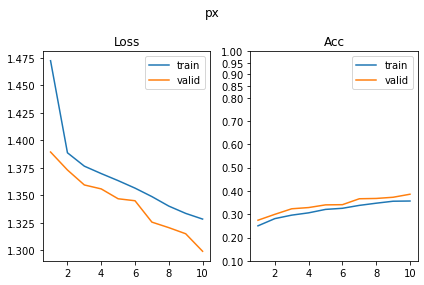

BTwins_[FCN32i223o128_d_128]_target_[shape]
[625/630] shape      BTwins_[FCN32i223o128_d_128]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 47.02it/s, loss=0.03, acc=0.99]                                            
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 87.76it/s, loss=0.0527, acc=0.988]                                         
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 48.91it/s, loss=0.0185, acc=0.994]                                         
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 93.03it/s, loss=0.025, acc=0.99]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 45.45it/s, loss=0.0257, acc=0.992]                                         
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 107.77it/s, loss=0.0267, acc=0.992]                                        
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 46.29it/s, loss=0.0268, acc=0.988]                                         
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 75.73it/s, loss=0.0239, acc=0.99]   

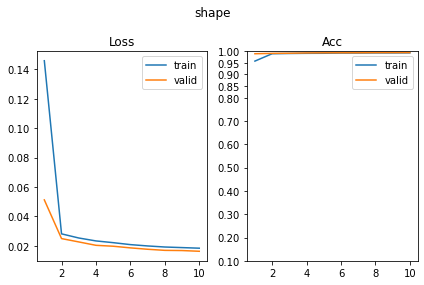

[626/630] scale      BTwins_[FCN32i223o128_d_128]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 52.32it/s, loss=0.927, acc=0.564]                                          
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 99.03it/s, loss=0.981, acc=0.475]                                          
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 44.80it/s, loss=0.771, acc=0.623]                                          
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 114.18it/s, loss=0.793, acc=0.611]                                         
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 48.58it/s, loss=0.746, acc=0.656]                                          
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 99.17it/s, loss=0.744, acc=0.686]                                          
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 51.58it/s, loss=0.72, acc=0.643]                                           
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 99.43it/s, loss=0.666, acc=0.727]   

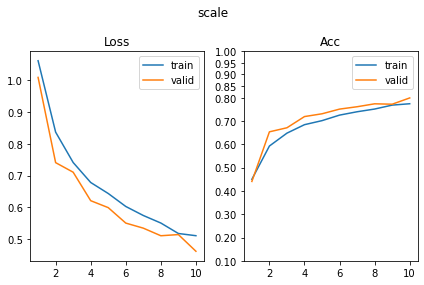

[627/630] color      BTwins_[FCN32i223o128_d_128]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 47.06it/s, loss=0.993, acc=0.57]                                           
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 90.15it/s, loss=1.07, acc=0.625]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 36.29it/s, loss=0.799, acc=0.689]                                          
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 69.18it/s, loss=0.81, acc=0.676]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 46.56it/s, loss=0.751, acc=0.674]                                          
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 114.03it/s, loss=0.685, acc=0.703]                                         
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 48.46it/s, loss=0.688, acc=0.725]                                          
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 98.60it/s, loss=0.626, acc=0.76]    

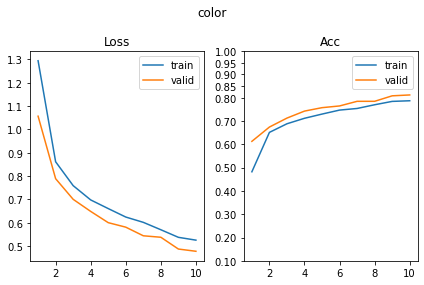

[628/630] angle      BTwins_[FCN32i223o128_d_128]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 50.46it/s, loss=1.22, acc=0.395]                                           
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 97.09it/s, loss=1.26, acc=0.379]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 47.23it/s, loss=1.22, acc=0.371]                                           
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 111.86it/s, loss=1.16, acc=0.43]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 42.62it/s, loss=1.14, acc=0.436]                                           
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 97.58it/s, loss=1.16, acc=0.475]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 48.47it/s, loss=1.14, acc=0.475]                                           
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 75.97it/s, loss=1.1, acc=0.494]     

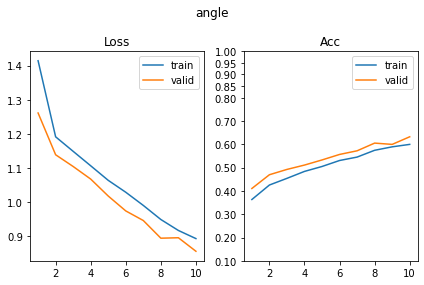

[629/630] py         BTwins_[FCN32i223o128_d_128]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 48.58it/s, loss=1.37, acc=0.299]                                           
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 115.94it/s, loss=1.37, acc=0.312]                                          
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 47.16it/s, loss=1.22, acc=0.428]                                           
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 94.63it/s, loss=1.23, acc=0.414]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 48.34it/s, loss=1.08, acc=0.508]                                           
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 114.15it/s, loss=1.11, acc=0.488]                                          
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 44.13it/s, loss=1.08, acc=0.486]                                           
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 74.85it/s, loss=0.998, acc=0.541]   

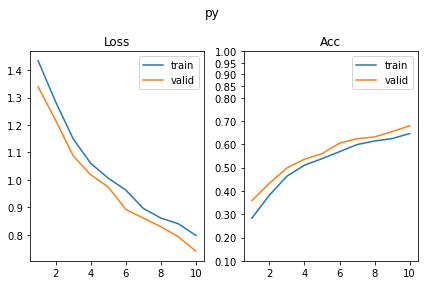

[630/630] px         BTwins_[FCN32i223o128_d_128]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 46.82it/s, loss=1.41, acc=0.236]                                           
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 96.67it/s, loss=1.38, acc=0.25]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 46.76it/s, loss=1.38, acc=0.291]                                           
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 114.77it/s, loss=1.34, acc=0.348]                                          
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 48.62it/s, loss=1.38, acc=0.301]                                           
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 98.83it/s, loss=1.33, acc=0.365]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 51.78it/s, loss=1.37, acc=0.32]                                            
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 81.54it/s, loss=1.32, acc=0.344]    

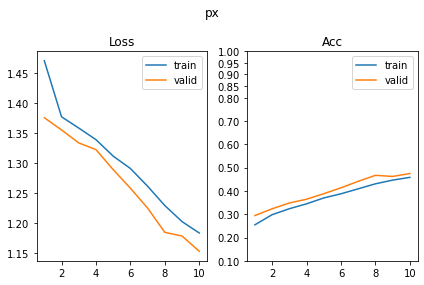

In [9]:
step = 1
max_steps = len(p_experiments) * 6
print_str = "[{:>3}/{:>3}] {:<10} {}"
for p_experiment in p_experiments:
    experiment_name = p_experiment.name
    print(experiment_name)
    #
    # experiment config
    p_experiment_config = p_experiment / "config.pkl"
    with open(p_experiment_config, "rb") as file:
        experiment_config = pickle.load(file)
    #
    # dataset config
    p_ds_config = Path(experiment_config.p_data) / "config.pkl"
    with open(p_ds_config, "rb") as file:
        ds_config = pickle.load(file)
    
    results = {}
    for target_variable in ds_config["classes"]:
        print(print_str.format(step, max_steps, target_variable, experiment_name))
        #
        target_idx = [idx for idx, target in enumerate(ds_config["classes"]) if target == target_variable][0]
        n_classes = ds_config["n_classes"][target_variable]
        #
        dl_train, dl_valid, d_r = get_datasets(target_idx,
                                               p_experiment / experiment_config["p_R_train"],
                                               p_experiment / experiment_config["p_R_valid"],
                                               p_experiment / experiment_config["p_Y_train"],
                                               p_experiment / experiment_config["p_Y_valid"],
                                               linprob_config.batch_size
                                              )
        #
        model = Net(n_classes, d_r, linprob_config.d_hid, linprob_config.n_hid, batch_norm=linprob_config.batch_norm)
        model = model.to(device)
        #
        optimizer = get_optimizer(linprob_config.optimizer, model.parameters(), linprob_config.optimizer_args)
        criterion = nn.CrossEntropyLoss()
        #
        stats = train_model(
            model=model,
            num_epochs=linprob_config.num_epochs,
            optimizer=optimizer,
            criterion=criterion,
            dl_train=dl_train,
            dl_valid=dl_valid,
            device=device
        )
        results[target_variable] = stats

        # plot losses
        fig, axes = plt.subplots(1, 2)
        axes[0].plot(stats.train.epoch, stats.train.loss, label="train")
        axes[0].plot(stats.valid.epoch, stats.valid.loss, label="valid")
        #axes[0].set_yscale('log')
        axes[0].set_title("Loss")
        axes[0].legend()


        # plot accs
        axes[1].plot(stats.train.epoch, stats.train.acc, label="train")
        axes[1].plot(stats.valid.epoch, stats.valid.acc, label="valid")
        plt.yticks([0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.85, 0.9, 0.95, 1])
        axes[1].set_title("Acc")
        axes[1].legend()
        #
        fig.suptitle(target_variable)
        plt.tight_layout()
        plt.show()
        step += 1
    p_results = p_experiment / linprob_config["p_results"]
    p_linprob_config = p_experiment / linprob_config["p_config"]
    #
    with open(p_results, "wb") as file:
        pickle.dump(results, file)
    with open(p_linprob_config, "wb") as file:
        pickle.dump(linprob_config, file)

# Load all results 

In [10]:
p_eval =  p_experiments_base / linprob_config["p_eval"]
p_eval.mkdir(exist_ok=True)
p_results = p_eval / linprob_config["p_results"]
p_config = p_eval / linprob_config["p_config"]
p_acc_map = p_eval / linprob_config["p_acc_mat"]

In [11]:
experiment_results = {}
for p_experiment in p_experiments:
    experiment_name = p_experiment.name
    #
    p_results = p_experiment / linprob_config["p_results"]
    #
    with open(p_results, "rb") as file:
        results = pickle.load(file)
    experiment_results[experiment_name] = results

In [14]:
experiment_names = list(experiment_results.keys())
target_variables = list(experiment_results[experiment_names[0]].keys())
n_avrg = linprob_config["n_avrg"]
acc_results = []
for experiment_name in experiment_results.keys():
    print(experiment_name)
    experiment_accs = []
    for target_variable in target_variables:
        print("   ", target_variable)
        accs = experiment_results[experiment_name][target_variable]["valid"]['acc'][-n_avrg:]
        acc = sum(accs) / len(accs)
        experiment_accs.append(acc)
    acc_results.append(experiment_accs)
acc_matrix = np.array(acc_results)

SUP_[FCN8i223o32_d8]_target_[shape]
    shape
    scale
    color
    angle
    py
    px
SUP_[FCN8i223o32_d8]_target_[scale]
    shape
    scale
    color
    angle
    py
    px
SUP_[FCN8i223o32_d8]_target_[color]
    shape
    scale
    color
    angle
    py
    px
SUP_[FCN8i223o32_d8]_target_[angle]
    shape
    scale
    color
    angle
    py
    px
SUP_[FCN8i223o32_d8]_target_[py]
    shape
    scale
    color
    angle
    py
    px
SUP_[FCN8i223o32_d8]_target_[px]
    shape
    scale
    color
    angle
    py
    px
SUP_[FCN8i223o32_d16]_target_[shape]
    shape
    scale
    color
    angle
    py
    px
SUP_[FCN8i223o32_d16]_target_[scale]
    shape
    scale
    color
    angle
    py
    px
SUP_[FCN8i223o32_d16]_target_[color]
    shape
    scale
    color
    angle
    py
    px
SUP_[FCN8i223o32_d16]_target_[angle]
    shape
    scale
    color
    angle
    py
    px
SUP_[FCN8i223o32_d16]_target_[py]
    shape
    scale
    color
    angle
    py
    px
SUP_[FCN8i223o

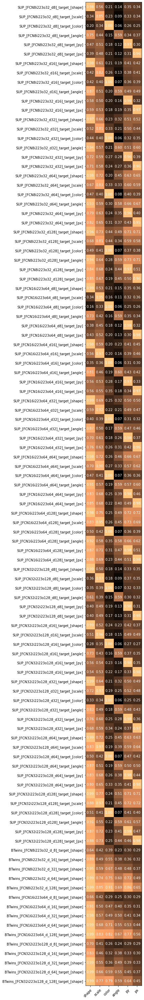

In [15]:
plot_mat(acc_matrix, experiment_names, target_variables, scale_factor=1, p_file=p_acc_map)

In [16]:
for p in p_experiments:
    R_train = np.load(p / "R_train.npy")
    print("{:<40}: {:.3f} {:.3f} {:.3f}".format(p.name, R_train.min(), R_train.mean(),R_train.max()))

SUP_[FCN8i223o32_d8]_target_[shape]     : 0.000 1.132 7.743
SUP_[FCN8i223o32_d8]_target_[scale]     : 0.000 1.156 5.855
SUP_[FCN8i223o32_d8]_target_[color]     : 0.000 0.918 6.152
SUP_[FCN8i223o32_d8]_target_[angle]     : 0.000 1.467 8.839
SUP_[FCN8i223o32_d8]_target_[py]        : 0.000 1.047 6.910
SUP_[FCN8i223o32_d8]_target_[px]        : 0.000 1.020 7.166
SUP_[FCN8i223o32_d16]_target_[shape]    : 0.000 0.919 6.636
SUP_[FCN8i223o32_d16]_target_[scale]    : 0.000 1.022 4.996
SUP_[FCN8i223o32_d16]_target_[color]    : 0.000 0.808 4.775
SUP_[FCN8i223o32_d16]_target_[angle]    : 0.000 1.219 7.243
SUP_[FCN8i223o32_d16]_target_[py]       : 0.000 0.862 4.793
SUP_[FCN8i223o32_d16]_target_[px]       : 0.000 0.926 5.329
SUP_[FCN8i223o32_d32]_target_[shape]    : 0.000 0.791 5.307
SUP_[FCN8i223o32_d32]_target_[scale]    : 0.000 0.830 4.630
SUP_[FCN8i223o32_d32]_target_[color]    : 0.000 0.663 4.227
SUP_[FCN8i223o32_d32]_target_[angle]    : 0.000 0.966 7.346
SUP_[FCN8i223o32_d32]_target_[py]       

In [ ]:
for p in p_experiments:
    R_train = np.load(p / "R_train.npy")
    print("{:<40}: {:.3f} {:.3f} {:.3f}".format(p.name, R_train.min(), R_train.mean(),R_train.max()))
    cov = np.cov(R_train.T)
    plt.imshow(cov)
    plt.show()